# עבודת סיכום מס' 4

In [4]:
library(DBI)
library(odbc)
library(RSQLite)
library(dplyr)
library(ggplot2)
if (!require("car")) install.packages("car")
if (!require("tibble")) install.packages("tibble")
if (!require("gridExtra")) install.packages("gridExtra")

Loading required package: gridExtra


Attaching package: 'gridExtra'


The following object is masked from 'package:dplyr':

    combine




In [2]:
#sort(unique(odbcListDrivers()[[1]]))

In [3]:
#con <- dbConnect(odbc(), 
     #            Driver = "SQL Server", 
      #           Server = "DESKTOP-AAGNMGA\\SQLEXPRESS", 
       #          Database = "BoxOffice", 
        #         Trusted_Connection = "True")

In [13]:
 #movies_ff <- dbReadTable(con,"movies_ff_v")

In [14]:
 #save(movies_ff,file="C:/Users/Mayer/Documents/DataScience/data/BoxOffice_ff.RData")

In [2]:
 BoxOffice_ff <- load("C:/Users/Mayer/Documents/DataScience/data/BoxOffice_ff.RData")

In [5]:
head(movies_ff)

,movie_id,original_language,release_date,runtime_cat,runtime,budget,popularity,revenue,sw_lang_en,sw_web_presence,...,depart_Camera_female,depart_Crew_female,depart_Custom_Mkup_female,depart_Directing_female,depart_Editing_female,depart_Lighting_female,depart_Production_female,depart_Sound_female,depart_Visual_Effects_female,depart_Writing_female
,<int>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,1,en,2015-02-20,Short,93,14000000,6.575393,12314651,1,0,...,0,0,0,0,0,0,0,0,0,0
2,2,en,2004-08-06,Medium,113,40000000,8.248895,95149435,1,0,...,0,0,0,0,0,0,3,0,0,1
3,3,en,2014-10-10,Medium,105,3300000,64.299990,13092000,1,1,...,0,1,0,0,0,0,2,0,0,0
4,4,hi,2012-03-09,Large,122,1200000,3.174936,16000000,0,1,...,0,0,0,0,0,0,0,0,0,0
5,5,ko,2009-02-05,Medium,118,0,1.148070,3923970,0,0,...,0,0,0,0,0,0,0,0,0,0
6,6,en,1987-08-06,Short,83,8000000,0.743274,3261638,1,0,...,0,0,0,0,0,0,0,0,0,0


In [40]:
vn <- names(movies_ff[,2:84])
movies_continuous <- c('movie_id')
for(v in vn) {
        if((is.numeric(movies_ff[[v]])) & (max(movies_ff[[v]],na.rm=T)>1))
            {movies_continuous <- c(movies_continuous,v)}}

In [41]:
movies_continuous <- setdiff(movies_continuous,"movie_id")
movies_continuous3 <- as.data.frame(movies_continuous)

In [42]:
movies_continuous

[1] "runtime"                      "budget"                      
 [3] "popularity"                   "revenue"                     
 [5] "release_year"                 "release_month"               
 [7] "release_day"                  "seasonality"                 
 [9] "sw_collection"                "producers_cnt"               
[11] "countries_cnt"                "keywords_cnt"                
[13] "actor0_movies_cnt"            "actor0_movies_5y_cnt"        
[15] "actor1_movies_cnt"            "actor1_movies_5y_cnt"        
[17] "actor2_movies_cnt"            "actor2_movies_5y_cnt"        
[19] "actor0_prev_revenue"          "actor1_prev_revenue"         
[21] "actor2_prev_revenue"          "director_movies_cnt"         
[23] "director_movies_5y_cnt"       "depart_Art"                  
[25] "depart_Camera"                "depart_Crew"                 
[27] "depart_Custom_Mkup"           "depart_Directing"            
[29] "depart_Editing"               "depart_Lighting"             
[31] "depart_Production"            "depart_Sound"                
[33] "depart_Visual_Effects"        "depart_Writing"              
[35] "depart_Art_female"            "depart_Camera_female"        
[37] "depart_Crew_female"           "depart_Custom_Mkup_female"   
[39] "depart_Directing_female"      "depart_Editing_female"       
[41] "depart_Production_female"     "depart_Sound_female"         
[43] "depart_Visual_Effects_female" "depart_Writing_female"

### From some reason I couldn't run some codes with 'movies_continuous' which I've created with a loop, therefore I've created a "stupid" object called 'movies_continuous2' which I've created by hand.. 
### I spent a lot of time trying to figure out the error with no succsess

In [62]:
movies_continuous2 <- movies_ff[,c(5:8,13:14,16:20,26:32,39:42,63:84)]

In [63]:
movies_categorial <- movies_ff[,c(2,4,9:12,15,18,21:25,33:38,43:62)]
length(names(movies_categorial))

[1] 39

# Exploratory data analysis - חלק 2 - בדיקת הנתונים

##  2.1 Descriptive Statistics for BoxOffice

In [154]:
exploreData <- function(data=data, y=NULL, rn=NULL, factorSize=10, dir="report", debug=FALSE, ...) {

  get_computer_type <- function(){
    # check if current R client is running on PC or on the server
    if (Sys.info()[1] == "Windows") {
      computer.type = "pc"
    } else if (Sys.info()[1] == "Linux") {
      computer.type = "server"
    }
    return(computer.type)
  }

  whatVarType <- function(var) {
    suppressWarnings(if (var=="integer" | var=="numeric") {
      return(1)
    } else if (var=="factor" | var=="character") {
      return(2)
    } else if (var=="Date" | "POSIXct" %in% var[[1]]) {
      return(3)
    } else {
      return(0)
    })
  }

  drawHistogram <- function(imgname=imgname, x=x) {
    d=stats::density(x, kernel = "gaussian",na.rm=TRUE)
    breakstar=(max(x,na.rm=TRUE) -min(x,na.rm=TRUE))/d$bw
    h=graphics::hist(x, breaks=breakstar)
    graphics::plot(h,main="",xlab=imgname)
    yfit<-seq(min(x,na.rm=TRUE),max(x,na.rm=TRUE),length=40)
    ffit<-stats::dnorm(yfit,mean=mean(x,na.rm=T),sd=stats::sd(x,na.rm=T))
    ffit <- ffit*diff(h$mids[1:2])*length(x)
    lines(yfit, ffit, col="blue", lwd=2)
  }

  drawFakeGraph <- function(imgname=imgname) {
    graphics::plot.window(xlim = c(0,0),ylim = c(0,0))
  }

  drawBars <- function(imgname=imgname, x=x) {
    graphics::plot(x)
  }

  drawGraphOne <- function(imgname=imgname, numVar=x, vartype=1) {
    if(vartype==1) {
      drawHistogram(imgname,numVar)
    } else if(vartype==2) {
      drawBars(imgname,numVar)
    } else {
      drawFakeGraph(imgname)
    }
  }

  getContinuousStats <- function(x) {
    N <- length(x)
    n <- length(x[which(is.na(x)==FALSE)])
    pct <- formatC(n/N * 100)
    nmiss <- length(x[which(is.na(x)==TRUE)])
    npct <- formatC(nmiss/N *100)
    ma <- mean(x, na.rm=TRUE)
    s <- stats::sd(x, na.rm=TRUE)
    me <- formatC(stats::median(x, na.rm=TRUE))
    q1 <- formatC(stats::quantile(x,1/4, na.rm=TRUE))
    q3 <- formatC(stats::quantile(x,3/4, na.rm=TRUE))
    mn <- formatC(min(x, na.rm=TRUE))
    mx <- formatC(max(x, na.rm=TRUE))
    html <- paste("<div class='Cell' style='align: top;'> <u>Data type</u>: Continuous <p> <u>Data length</u>: ",n ,"/", N, " (", pct, "%) <br> <u>Missing</u>: ",
                  nmiss, " (", npct, "%)<p> <u>Mean</u>: ", formatC(ma), "\t <u>StdDev</u>: ", formatC(s), "<br><u>Median</u>: ",me,
                  "\t <u>IQR</u>: ", q1, "-", q3, "<br><u>Min</u>: ", mn, "\t <u>Max</u>: ", mx, "</div>")
    return(html)
  }

  getCategortyStats <- function(x) {
    N <- length(x)
    n <- length(x[which(is.na(x)==FALSE)])
    pct <- formatC(n/N * 100)
    nmiss <- length(x[which(is.na(x)==TRUE)])
    npct <- formatC(nmiss/N *100)
    l <- levels(x)
    s <- summary(x)
    htm <- "<ul>"
    if (length(l) < 5) {
      for (lv in l) {
        htm <- paste(htm, "<li><u>", lv, "</u>: ", s[[lv]], "</li>")
      }
      htm <- paste(htm,"</ul>")
    }
    html <- paste("<div class='Cell'> <u>Data type</u>: Categorical Data <p> <u>Data length</u>: ",n, "/", N, " (", pct, "%) <br> <u>Missing</u>: ",
                  nmiss, " (", npct, "%) <p> <u>Number of levels</u>: ", length(l), "<br>", htm, "</div>")
    return(html)
  }

  getDatesStats <- function(x) {
    N <- length(x)
    n <- length(x[which(is.na(x)==FALSE)])
    pct <- formatC(n/N * 100)
    nmiss <- length(x[which(is.na(x)==TRUE)])
    npct <- formatC(nmiss/N *100)
    s <- summary(x)
    html <- paste("<div class='Cell'> <u>Data type</u>: Date <p> <u>Data length</u>: ",n, "/", N, " (", pct, "%) <br> <u>Missing</u>: ",
                  nmiss, " (", npct, "%) <p> <u>Min date</u>: ", min(x, na.rm=T), "<br><u>Max date</u>:",max(x, na.rm=T) , "</div>")
    return(html)
  }

  getStats <- function(numVar=x, vartype=1) {
    if(vartype==1) {
      html <- getContinuousStats(numVar)
    } else if(vartype==2) {
      html <- getCategortyStats(numVar)
    } else if (vartype==3) {
      html <- getDatesStats(numVar)
    } else {
      html <- "<div class='Cell'></div>"
    }
    return(html)
  }

  getOutliers <- function(x) {
    bp <- graphics::boxplot(x,plot=FALSE)
    return(bp$out)
  }

  getOutlierGraph <- function(x) {
    #  mod <- tryCatch({
    outl <- getOutliers(x)
    df <- data.frame(x=x, cl=1)
    if(length(outl)>0) {
      df$cl[which(df$x %in% outl)] <- 2
    }
    #pl <- stats::scatter.smooth(df$x,col=df$cl)
    pl <- tryCatch({
      stats::scatter.smooth(df$x,col=df$cl,xlab="index")
    }, warning = function(w) {
      n <- "warning!"
    }, error = function(e) {
      n <- "error!"
    }, finally = {
      graphics::plot(df$x ~ row.names(df),col=df$cl,xlab="index")
    })
    ma <- mean(x, na.rm=TRUE)
    s <- stats::sd(x, na.rm=TRUE)
    graphics::abline(h=ma-(2*s), col="red", lty=2)
    graphics::abline(h=ma+(2*s), col="red", lty=2)
    #  }, error = function(e) {
    #    pl <- drawFakeGraph("none")
    #  })
    return(pl)
  }

  getScatterGraph <- function(df=data,x,y,dtype=1) {
    #  mod <- tryCatch({
    if(dtype==1) {
      pl <- ggplot2::ggplot(df) + ggplot2::geom_smooth(ggplot2::aes(x=data[[x]], y=data[[y]]), method="loess") + ggplot2::xlab(x) + ggplot2::ylab(y)
    } else {
      pl <- ggplot2::ggplot(df) + ggplot2::geom_boxplot(ggplot2::aes(y=data[[x]], color=data[[y]])) + ggplot2::xlab(x) + ggplot2::ylab(y) + ggplot2::labs(color=y)
    }
    return(pl)
  }

  getOutliersHtml <- function(imgname=imgname, x=x, srcdir=srcdir) {
    bp <- getOutliers(x)
    if (length(unique(bp)) > 10) {
      xtrm <- paste("There are ", length(unique(bp)), " outlier values")
    } else if (length(unique(bp)) == 0) {
      xtrm <- "No outlier values found"
    } else {
      xtrm <- paste(formatC(unique(bp)), collapse=', ' )
    }
    imgsrc = paste(paste0(srcdir,"/fig/"),imgname, "_2.png",sep="")
    html <- paste0("<div class='Cell'><img class='origimg' src='",imgsrc,"' height='150' width='250'><br> <u>Outlier values</u>: <br> ", xtrm, "</div>")
    return(html)
  }
  ################## Prepare for the report ###################
  #report <- paste(mydir,"/report",sep="")

  ################## Check for values for rn ##################
  if(!is.null(rn)) {
    if(length(rn)!=ncol(data)) {
      message("the value of the 'rn' argument was avoided because it does not have the same number of columns of the dataframe")
      rn <- NULL
    }
    xname <- rn
    names(xname) <- names(data)
  } else {
    xname <- NULL
  }

  report <- dir
  if (!file.exists(report)) {
    dir.create(report)
  }
  fig <- paste(report,"/fig",sep="")
  if (!file.exists(fig)) {
    dir.create(fig)
  }
  if (get_computer_type()=="pc") {
    srcdir <- paste0(getwd(),"/",report)
  } else {
    #srcdir <- paste0("file_show?path=",getwd(),"/",report)
    srcdir <- paste0("/view/",getwd(),"/report")
  }
  # determine which columns are integer
  int_col <- which(sapply(data, is.integer))
  int_col <- c(int_col,(which(sapply(data, is.numeric))))
  mi <- vector()
  # find only those integers with less than 10 unique values and convert to factor
  for (li in int_col) {
    if (length(unique(data[,li])) < factorSize) {
      mi <- c(mi,li)
      if (is.factor(data[,li]) == FALSE) {
        data[,li] <- factor(data[,li])
      }
    }
  }

  str_col <- which(sapply(data, is.character))
  mi <- vector()
  # find only those integers with less than 10 unique values and convert to factor
  for (li in str_col) {
    mi <- c(mi,li)
    data[,li] <- factor(data[,li])
  }

  # create the html report page
  myhtml <- paste(report,"/report.html",sep="")
  cat("<!DOCTYPE html>
      <html>
      <head>
      <title>Data Visualization</title>
      <meta http-equiv='Content-Type' content='text/html; charset=UTF-8' />
      <link rel='stylesheet' href='http://code.jquery.com/mobile/1.4.5/jquery.mobile-1.4.5.min.css'>

      <script src='http://code.jquery.com/jquery-1.10.2.js'></script>
      <script>
      $(document).ready(function(){
      $('.onetoone').hide();
      });

      $(function() {
      $('.origimg').click(function(e) {
      $('#popup_img').attr('src',$(this).attr('src'));
      $('#myContainer').hide();
      var pos = $(document).scrollTop();
      $('#myContainer').css({'top':pos+20,'left':250, 'position':'absolute', 'border':'1px solid black', 'padding':'0px'});
      $('#myContainer').show();
      });
      $('#myContainer').click(function(e) {
      $('#myContainer').hide();
      });

      $('#myform2').submit(function(e) {
      e.preventDefault();
      });

      $('#onetoone').on('click',function() {
      console.log('onetone button - 1');
      $('#onetoone').hide();
      $('#aslist').show();
      // To show only individual rows:
      $('.Row').hide();
      $('.onetoone').show();
      // then we iterate
      var i = $('.Row').length;
      // Then we iterate
      var nxt = $('#idx').val();
      if (nxt < i & nxt >0) {
      $('.Row').hide();
      $('.Row').eq(0).show();
      $('.Row').eq(nxt).show();
      } else {
      $('#idx').val(1)
      }
      console.log('onetone button - 2');
      });

      $('#aslist').on('click',function() {
      console.log('aslist button - 1');
      $('#onetoone').show();
      $('#aslist').hide();
      $('.onetoone').hide();
      $('.Row').show();
      console.log('aslist button - 2');
      });

      $('#less').on('click',function(){
      console.log('less button - 1');
      var i = $('.Row').length;
      var nxt = parseInt($('#idx').val(),10) - 1;
      if (nxt < i & nxt >0) {
      $('#idx').val(nxt)
      $('.Row').hide();
      $('.Row').eq(0).show();
      $('.Row').eq(nxt).show();
      } else {
      $('#idx').val(1)
      }
      console.log('less button - 2');
      });

      $('#more').on('click',function(){
      console.log('more button - 1');
      var i = $('.Row').length;
      var nxt = parseInt($('#idx').val(),10) + 1;
      if (nxt < i & nxt >0) {
      $('#idx').val(nxt)
      $('.Row').hide();
      $('.Row').eq(0).show();
      $('.Row').eq(nxt).show();
      } else {
      $('#idx').val(i)
      }
      console.log('more button - 2');
      });

      $('#idx').on('change', function(){
      console.log('idx changed - 1');
      var i = $('.Row').length;
      var nxt = $('#idx').val();
      if (nxt < i & nxt >0) {
      $('#idx').val(nxt)
      $('.Row').hide();
      $('.Row').eq(0).show();
      $('.Row').eq(nxt).show();
      } else {
      $('#idx').val(i)
      }
      console.log('idx changed - 2');
      });
      });

      </script>

      <style type='text/css'>
      .Table
      {
      display: table;
      }
      .Title
      {
      display: table-caption;
      text-align: center;
      font-weight: bold;
      font-size: larger;
      background-color:#4C6F50;
      color: #fff;
      }
      .Row
      {
      display: table-row;
      }
      .Row:nth-child(even) {
        background-color: #56882433;
      }
      .Cell
      {
      display: table-cell;
      border: solid;
      border-width: thin;
      padding-left: 5px;
      padding-right: 5px;
      vertical-align: top;
      font-family: Arial, Helvetica, sans-serif;
      font-size: 14px;
      }
      </style>

      </head>

      <body>
      <div id='pageone' data-role='main' class='ui-content'>
      ", file = myhtml, sep='\n',append=FALSE)

  html <- paste("<p><p><h1> Data Visualization & Exploration </h1>
                <form>
                <input type='button' id='onetoone' value='Show as Cards'>
                <input type='button' id='aslist' class='onetoone' value='Show as List'>
                </form>
                <p>
                ")
  cat(html, file = myhtml, sep='\n', append=TRUE)
  # begin table
  alt1 <- ifelse(is.null(y)== TRUE, "", "<div class='Cell Title'> Dependent <br> Variable <br> Distribution </div>")
  html <- paste("<p><p>
                <div class='Table'>
                <div class='Row'>
                <div class='Cell Title'> Variable </div>
                <div class='Cell Title'> Distribution </div>
                <div class='Cell Title'> Descriptive <br> Statistics</div>
                <div class='Cell Title'> Outliers </div>"
                , alt1,
                "</div>")
  cat(html, file = myhtml, sep='\n', append=TRUE)

  #### determinate the type of each variable...
  data_types <- sapply(sapply(data, class), whatVarType)
  ln <- length(data)
  ii <- 0
  pb <- utils::txtProgressBar(min=0,max=ln,style=3)
  for(x in names(data)) {

    ## check if the value has at least more than one unique value...
    if(length(unique(data[[x]])) < 2) {
      message(paste("The variable",x,"has less than two unique values, so will not be included"))
    } else {

      if(debug==TRUE) {
        print(x)
      } else {
        pb <- utils::txtProgressBar(min=0,max=ln,style=3)
      }

      html <- paste("<div class='Row'><div class='Cell'><b>",x,"</b><p>",xname[x],"</p></div>")

      cat(html, file = myhtml, sep='\n', append=TRUE)
      #### initialize the first graph
      imgname = paste(fig,"/",x, "_1.png",sep="")
      imgsrc = paste(paste0(srcdir,"/fig/"),x, "_1.png",sep="")
      ### send the data with the type to generate the correct graph..
      grDevices::png(imgname)
      drawGraphOne(x, data[[x]], data_types[x])
      grDevices::dev.off()
      html <- paste0("<div class='Cell'><img class='origimg'  src='",imgsrc,"' height='150' width='150'><br></div>")
      cat(html, file = myhtml, sep='\n', append=TRUE)

      # second, show the statistics
      html <- getStats(data[[x]],data_types[x])
      cat(html, file = myhtml, sep='\n', append=TRUE)

      # third, determine the outliers
      imgname = paste(fig,"/",x, "_2.png",sep="")
      if(data_types[x]==1) {
        grDevices::png(imgname)
        getOutlierGraph(data[[x]])
        grDevices::dev.off()
        html <- getOutliersHtml(x,data[[x]],srcdir)
      } else {
        html <- "<div class='Cell'></div>"
      }
      cat(html, file = myhtml, sep='\n', append=TRUE)

      # fourth, if y is assigned, make a corresponding plot
      if(is.null(y)==FALSE) {
        imgname = paste(fig,"/",x, "_3.png",sep="")
        imgsrc = paste(paste0(srcdir,"/fig/"),x, "_3.png",sep="")
        #print(imgname)
        grDevices::png(imgname)
        ### scatter.smooth(data[[x]] ~ data[[y]])
        #suppressWarnings(getScatterGraph(data,x,y,data_types[y]))
        plot(getScatterGraph(data,x,y,data_types[y]))
        grDevices::dev.off()
        html <- paste0("<div class='Cell'><img class='origimg' src='",imgsrc,"' height='150' width='150'><br></div>")
        cat(html, file = myhtml, sep='\n', append=TRUE)
      }
      html <- paste("</div>")
      cat(html, file = myhtml, sep='\n', append=TRUE)

      if(debug==FALSE) {
        utils::setTxtProgressBar(pb,ii)
        ii <- ii + 1
      }
    }
  }
  html <- paste("</div>")
  cat(html, file = myhtml, sep='\n', append=TRUE)
  # end table
  html <- paste("</div>
                <div data-role='popup' id='myContainer' style='display: none;'>
                <img id='popup_img' src='' />
                </div>
                </div>
                </div>
                </div>
                <p>
                <div class='onetoone'>
                <form id='myform2'>
                <span> <input type='button' id='less' value=' << '> </span>
                <span> <input id='idx' name='idx' value='1'></input></span>
                <span> <input type='button' id='more' value=' >> '> </span>
                </form>
                </div>
                <p>
                </body></html>
                ")
  cat(html, file = myhtml, sep='\n', append=TRUE)
  if(.Platform$OS.type == "unix") {
    system(paste("start /b ", myhtml))
  } else {
    shell(paste("explorer ", gsub("/", "\\\\", myhtml) ), intern=TRUE)
  }
}

###################### END exploreData ###############

In [157]:
exploreData(data=movies_ff, y='revenue',dir="report-r", debug=FALSE) 

  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4531 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.04"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 1.04"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  0"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 1"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at -0.04"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 1.04"
Warning mess

  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message:
"Removed 5310 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message:
"Removed 5534 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message:
"Removed 5621 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.115"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.115"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1.2111e-014"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 1"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at -0.115"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 2.115

  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.595"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.595"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  8.8213e-015"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 4"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at -0.595"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 2.595

  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.165"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.165"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  9.8819e-015"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 4"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at -0.165"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 2.165

  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at 0.855"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 1.145"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  3.4382e-028"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 1"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at 0.855"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 1.145"


  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.07"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.07"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  4.6794e-015"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 1"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at -0.07"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 2.07"
Wa

  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"at  -0.06"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"radius  0.0036"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"all data on boundary of neighborhood. make span bigger"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.06"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.06"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"zero-width neighborhood. make span bigger"
Warning message:
"Computation failed in `stat_smooth()`:
NA/NaN/Inf i

  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"at  -0.26"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"radius  0.0676"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"all data on boundary of neighborhood. make span bigger"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.26"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.26"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"zero-width neighborhood. make span bigger"
Warning message:
"Computation failed in `stat_smooth()`:
NA/NaN/Inf i

  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at 2"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  0"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at 2"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 1"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(

  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4397 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.06"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.06"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1.5653e-015"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 4"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"pseudoinverse used at -0.06"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"neighborhood radius 2.06"
Wa

  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

Warning message:
"Removed 4382 rows containing non-finite values (stat_smooth)."


  |===================================================================== |  99%

Warning message in system(cmd, intern = intern, wait = wait | intern, show.output.on.console = wait, :
"running command 'C:\WINDOWS\system32\cmd.exe /c explorer  report-r\report.html' had status 1"


character(0)
attr(,"status")
[1] 1

### report notebook
<a href="https://github.com/EtiMayer/DataScience/blob/master/stats/report-r/report.html" target='_blank'> Report</a>

In [110]:
summary(movies_ff)

    movie_id    original_language  release_date       runtime_cat       
 Min.   :   1   Length:7375        Length:7375        Length:7375       
 1st Qu.:1848   Class :character   Class :character   Class :character  
 Median :3696   Mode  :character   Mode  :character   Mode  :character  
 Mean   :3698                                                           
 3rd Qu.:5550                                                           
 Max.   :7398                                                           
                                                                        
    runtime          budget            popularity         revenue         
 Min.   :  0.0   Min.   :        0   Min.   :  0.000   Min.   :1.000e+00  
 1st Qu.: 94.0   1st Qu.:        0   1st Qu.:  3.970   1st Qu.:2.405e+06  
 Median :104.0   Median :  8000000   Median :  7.456   Median :1.693e+07  
 Mean   :107.7   Mean   : 22666657   Mean   :  8.540   Mean   :6.688e+07  
 3rd Qu.:118.0   3rd Qu.: 29000000   3rd 

In [19]:
rapply(movies_ff,function(x)length(unique(x)))

movie_id            original_language 
                        7375                           44 
                release_date                  runtime_cat 
                        4697                            3 
                     runtime                       budget 
                         168                          704 
                  popularity                      revenue 
                        7371                         2845 
                  sw_lang_en              sw_web_presence 
                           2                            2 
               sw_has_poster                   sw_tagline 
                           2                            2 
                release_year                release_month 
                          99                           13 
          high_release_month                  release_day 
                           2                           32 
                 seasonality                sw_collection 
                          13                            3 
               producers_cnt                countries_cnt 
                          25                           12 
                     lang_US                      lang_FR 
                           2                            2 
                     lang_RU                      lang_ES 
                           2                            2 
                     lang_JA                 keywords_cnt 
                           2                           46 
           actor0_movies_cnt         actor0_movies_5y_cnt 
                          61                           17 
           actor1_movies_cnt         actor1_movies_5y_cnt 
                          59                           18 
           actor2_movies_cnt         actor2_movies_5y_cnt 
                          53                           16 
            sw_female_actor0             sw_female_actor1 
                           3                            3 
            sw_female_actor2               sw_male_actor0 
                           3                            3 
              sw_male_actor1               sw_male_actor2 
                           3                            3 
         actor0_prev_revenue          actor1_prev_revenue 
                        1152                         1265 
         actor2_prev_revenue          director_movies_cnt 
                        1341                           30 
      director_movies_5y_cnt              genre_adventure 
                           7                            2 
               genre_fantasy              genre_animation 
                           2                            2 
                 genre_drama                 genre_horror 
                           2                            2 
                genre_action                 genre_comedy 
                           2                            2 
               genre_history                genre_western 
                           2                            2 
              genre_thriller                  genre_crime 
                           2                            2 
           genre_documentary        genre_science_fiction 
                           2                            2 
               genre_mystery                  genre_music 
                           2                            2 
               genre_romance                 genre_family 
                           2                            2 
                   genre_war                genre_foreign 
                           2                            2 
                  depart_Art                depart_Camera 
                          35                           24 
                 depart_Crew           depart_Custom_Mkup 
                          51                           28 
            depart_Directing               depart_Editing 
                          24                           17 
        

In [11]:
#install.packages("pastecs")
library(pastecs)
options(scipen=100)
options(digits=2)
stat.desc(movies_ff[,5:84], basic=TRUE, desc=TRUE, norm=FALSE, p=0.95)

,runtime,budget,popularity,revenue,sw_lang_en,sw_web_presence,sw_has_poster,sw_tagline,release_year,release_month,...,depart_Camera_female,depart_Crew_female,depart_Custom_Mkup_female,depart_Directing_female,depart_Editing_female,depart_Lighting_female,depart_Production_female,depart_Sound_female,depart_Visual_Effects_female,depart_Writing_female
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
nbr.val,7370.00,7375.0,7375.000000,2993.0,7375.0000,7375.0000,7375.00000,7375.0000,7374.0000,7374.000,...,7341.0000,7341.0000,7341.0000,7341.0000,7341.0000,7341.00000,7341.000,7341.0000,7341.0000,7341.0000
nbr.null,19.00,2012.0,0.000000,0.0,1039.0000,5012.0000,2.00000,1442.0000,0.0000,0.000,...,7194.0000,6971.0000,5293.0000,6297.0000,6516.0000,7336.00000,3872.000,6840.0000,7281.0000,6578.0000
nbr.na,5.00,0.0,0.000000,4382.0,0.0000,0.0000,0.00000,0.0000,1.0000,1.000,...,34.0000,34.0000,34.0000,34.0000,34.0000,34.00000,34.000,34.0000,34.0000,34.0000
min,0.00,0.0,0.000001,1.0,0.0000,0.0000,0.00000,0.0000,1918.0000,1.000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.00000,0.000,0.0000,0.0000,0.0000
max,338.00,380000000.0,547.488298,1519557910.0,1.0000,1.0000,1.00000,1.0000,2017.0000,12.000,...,3.0000,10.0000,6.0000,4.0000,5.0000,1.00000,12.000,6.0000,2.0000,5.0000
range,338.00,380000000.0,547.488297,1519557909.0,1.0000,1.0000,1.00000,1.0000,99.0000,11.000,...,3.0000,10.0000,6.0000,4.0000,5.0000,1.00000,12.000,6.0000,2.0000,5.0000
sum,794097.00,167166594664.0,62980.853408,200169779760.0,6336.0000,2363.0000,7373.00000,5933.0000,14745625.0000,50471.000,...,150.0000,473.0000,2595.0000,1127.0000,893.0000,5.00000,6898.000,581.0000,62.0000,912.0000
median,104.00,8000000.0,7.455875,16928137.0,1.0000,0.0000,1.00000,1.0000,2004.0000,7.000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.00000,0.000,0.0000,0.0000,0.0000
mean,107.75,22666656.9,8.539777,66879311.6,0.8591,0.3204,0.99973,0.8045,1999.6779,6.844,...,0.0204,0.0644,0.3535,0.1535,0.1216,0.00068,0.940,0.0791,0.0084,0.1242


###  2.2 Plots

### Runtime_cat

Warning message:
"Ignoring unknown parameters: main"


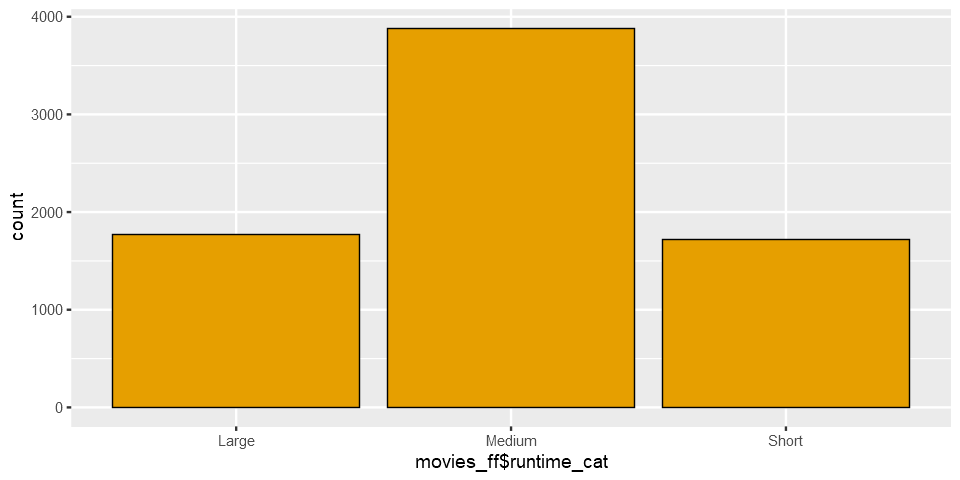

In [6]:
ggplot(movies_ff, aes(movies_ff$runtime_cat)) + geom_bar(fill = "#E69F00",color = "black",size = 0.3, main = "runtime_cat")  + theme_get()


### Runtime Analysis

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
"Removed 5 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 5 rows containing non-finite values (stat_density)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."


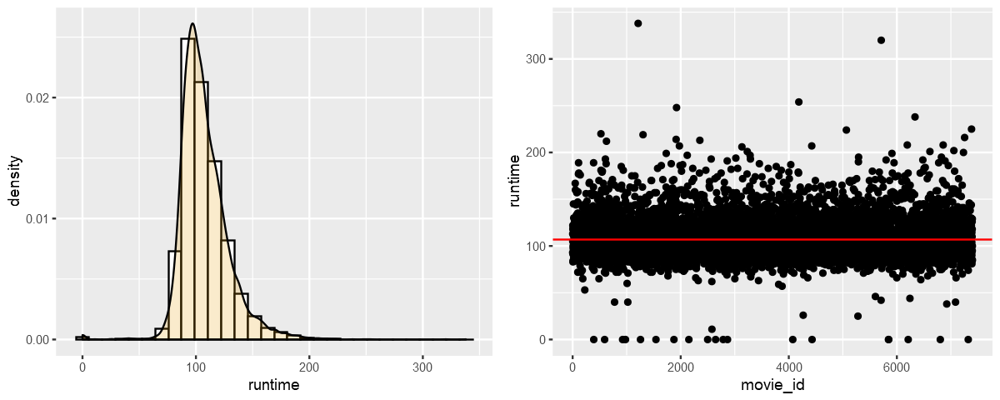

In [8]:
p1 <- ggplot(movies_ff, aes(x=runtime)) + geom_histogram(aes(y=..density..), colour="black", fill="white")+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=runtime)) + geom_hline(yintercept = 107 ,color="red")


options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

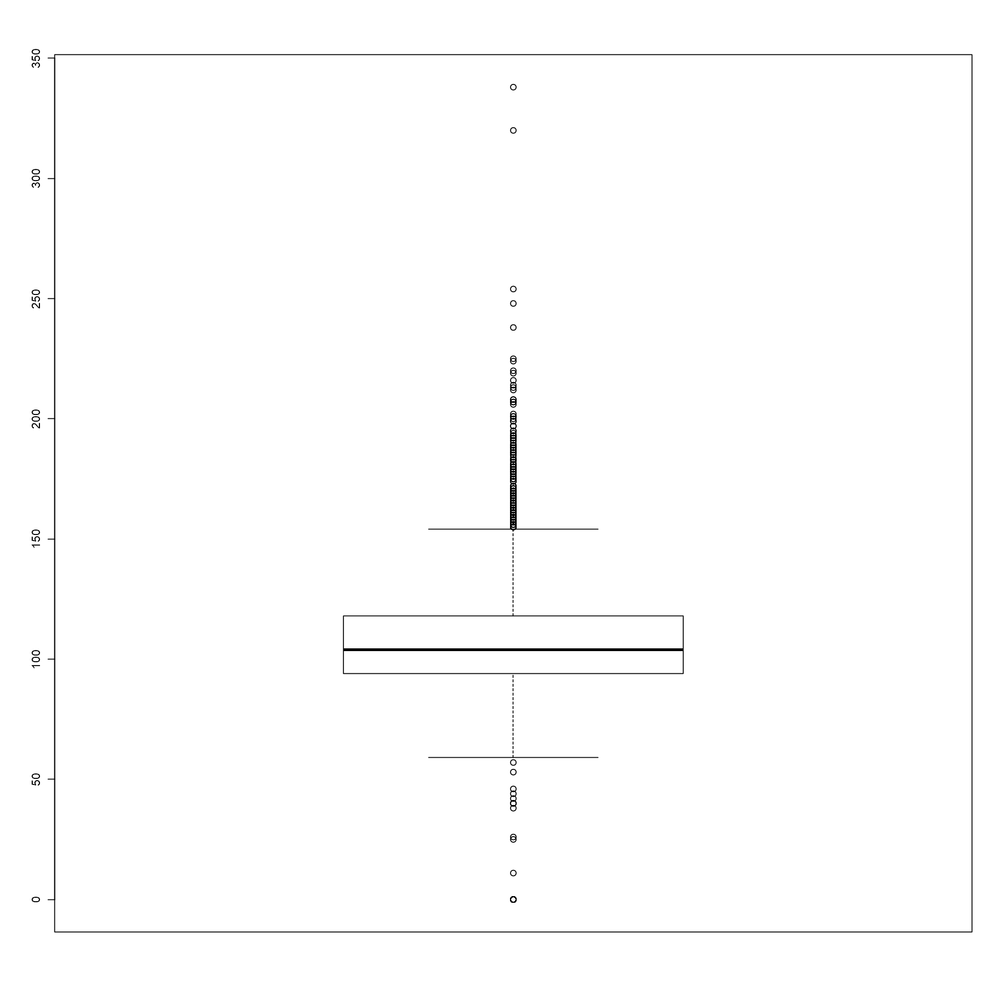

In [79]:
out_runtime <- boxplot(movies_ff$runtime)
options(repr.plot.width = 5, repr.plot.height =10)

In [80]:
out_runtime$out # outlier
min(out_runtime$out) #  minimum outlier
max(out_runtime$out)
median(out_runtime$out)
mean(out_runtime$out)
length(out_runtime$out)

[1] 167 160 157 158 177 189 178 176  53 156 167 168 156 157 163 189   0 155
 [19] 155 170 156 220 181 160 179 180 167 161 162   0 193 158 188 212 161 161
 [37] 167 171  40 165 162 185 165 161   0 181   0 157 157  40 163 175 162 162
 [55] 175 168 338   0 163 219 155 170 170 157   0 157 183 186 171 155 163 199
 [73] 161 158 188 156 170 162 171   0 214 248 155 159 207 186 160 180 160 187
 [91] 157 197 164   0 169 183 172 157 158 157 178 213 155 155 181   0 164 169
[109] 162 193  11 172   0 157 174 178   0 161 168 157 191   0 160 182 157 194
[127] 157 183 206 172 159 177 201 164 197 193 158 170 174 188 174 166 183 162
[145] 155 169 185 175 155 181  57 168 160 165 179 157 172 187   0 179 178 254
[163] 157 163  26 158 161 163 207   0 162 170 164 160 155 165 166 155 159 156
[181] 165 158 224 169 170 168 170 161 159 172  25 155 190 195 160 170 163 180
[199] 162 171  46 159 157 179 172  42 320 170 163 192   0   0 170 157 199 178
[217] 158 189 157 174 175 157 169 157 175 162 156 170 160 169 208 162 178   0
[235]  44 165 158 157 155 238 178 192 180 183 184 172 176 201 155 159 159 189
[253]   0 195 170 208 167 191 165  38 186 161 156 202 161 180  40 159 155 172
[271] 165 200 216   0 225

[1] 0

[1] 338

[1] 165

[1] 156.1127

[1] 275

In [126]:
runtime.out <- ifelse(movies_ff[["runtime"]] > 154 | movies_ff[["runtime"]] <59, 1, 0)
table(runtime.out)
out_runtime$stats

runtime.out
   0    1 
7095  275 

59
94
104
118
154


In [128]:
runtime.noout <- movies_ff[["runtime"]]
runtime.noout <- ifelse(runtime.noout==1,NA,runtime.noout)
head(runtime.noout)

[1]  93 113 105 122 118  83

### Budget Analysis

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
"Removed 2012 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 2012 rows containing non-finite values (stat_density)."


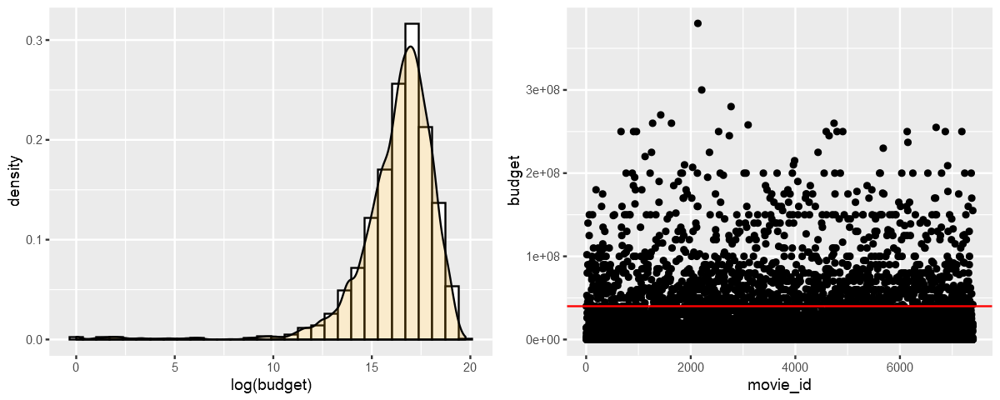

In [10]:
p1 <- ggplot(movies_ff, aes(x=log(budget))) + geom_histogram(aes(y=..density..), colour="black", fill="white")+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=budget)) + geom_hline(yintercept = 40000000 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

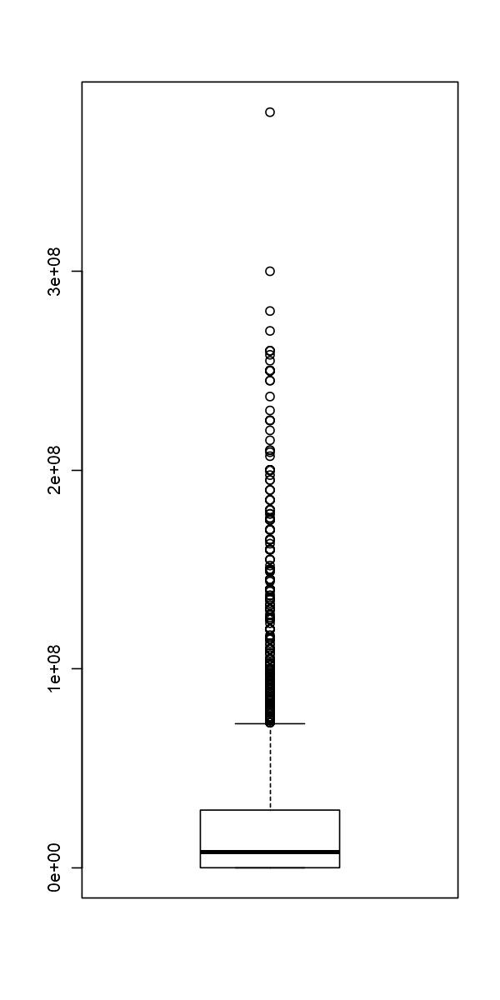

In [140]:
out_budget <- boxplot(movies_ff$budget)
options(repr.plot.width = 5, repr.plot.height =10)

In [141]:
head(out_budget$out) # outlier
min(out_budget$out) #  minimum outlier
max(out_budget$out) 
median(out_budget$out)
mean(out_budget$out)
length(out_budget$out)

[1] 1.02e+08 8.00e+07 9.00e+07 1.40e+08 8.00e+07 1.25e+08

[1] 7.3e+07

[1] 3.8e+08

[1] 1.05e+08

[1] 121655977

[1] 624

In [146]:
budget.out <- ifelse(movies_ff[["budget"]] > 72500000 | movies_ff[["budget"]] <=0, 1, 0)
table(runtime.out)
out_budget$stats

runtime.out
   0    1 
7095  275 

[,1]
[1,]        0
[2,]        0
[3,]  8000000
[4,] 29000000
[5,] 72500000
attr(,"class")
        1 
"integer"

In [128]:
runtime.noout <- movies_ff[["runtime"]]
runtime.noout <- ifelse(runtime.noout==1,NA,runtime.noout)
head(runtime.noout)

[1]  93 113 105 122 118  83

### Original_language Analysis

In [72]:
table(movies_ff$original_language)


  af   ar   bm   bn   ca   cn   cs   da   de   el   en   es   fa   fi   fr   he 
   1    1    2    3    1   41    3   17   49    3 6336   95    5    3  199    6 
  hi   hu   id   is   it   ja   ka   kn   ko   ml   mr   nb   nl   no   pl   pt 
 118    4    3    1   55   90    1    1   48   12    1    1   11    5    5   13 
  ro   ru   sr   sv   ta   te   th   tr   ur   vi   xx   zh 
   8  105    3   20   31    9    5    9    2    1    2   46 

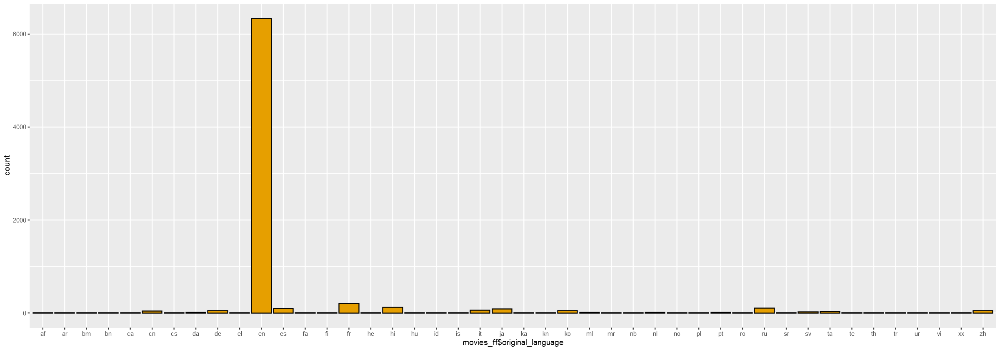

In [20]:
ggplot(movies_ff, aes(movies_ff$original_language)) +
  geom_bar(color = "black", fill = "#E69F00")  + theme_get()
options(repr.plot.width = 20, repr.plot.height = 7)

### Popularity Analysis

Warning message in sqrt(log(popularity)):
"NaNs produced"
Warning message in sqrt(log(popularity)):
"NaNs produced"
Warning message in sqrt(log(popularity)):
"NaNs produced"
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
"Removed 573 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 573 rows containing non-finite values (stat_density)."


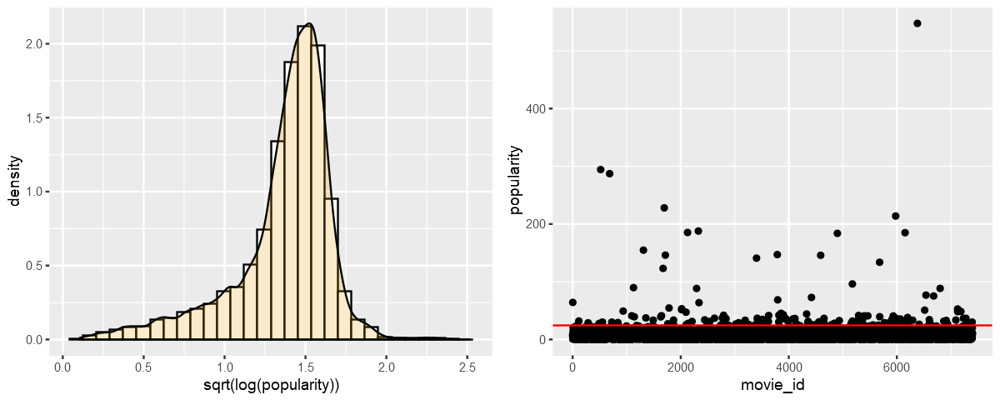

In [11]:
p1 <- ggplot(movies_ff, aes(sqrt(log(popularity)))) + geom_histogram(aes(y=..density..), colour="black", fill="white")+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=popularity)) + geom_hline(yintercept = 25 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

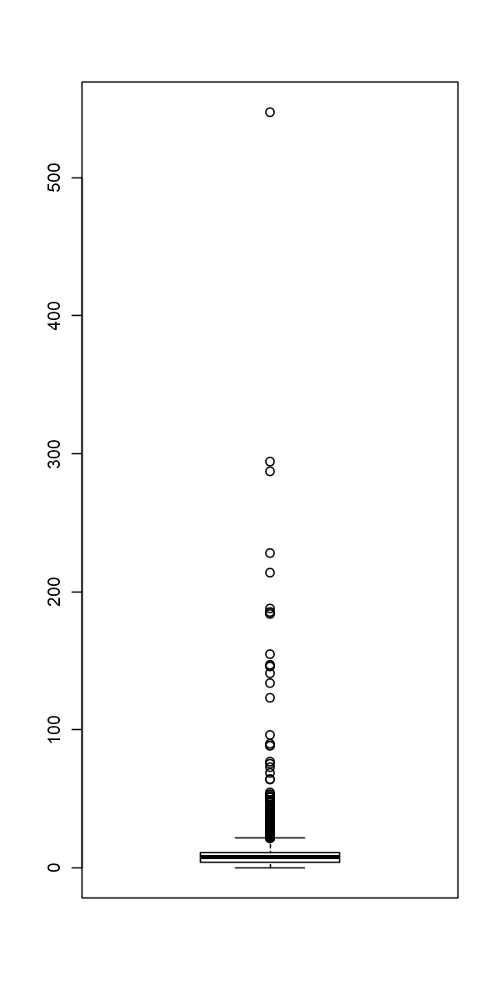

In [6]:
out_popularity <- boxplot(movies_ff$popularity)
options(repr.plot.width = 5, repr.plot.height =5)

In [90]:
head(out_popularity$out) # outlier
min(out_popularity$out) #  minimum outlier
max(out_popularity$out) #  maximum outlier
median(out_popularity$out)
mean(out_popularity$out)
length(out_popularity$out)

[1] 64.29999 23.06508 25.26187 32.07073 21.79111 28.92084

[1] 21.46346

[1] 547.4883

[1] 30.12129

[1] 46.8045

[1] 201

### Revenue Analysis

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
"Removed 4382 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
"Removed 4382 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Warning message:
"Removed 4382 rows containing missing values (geom_point)."


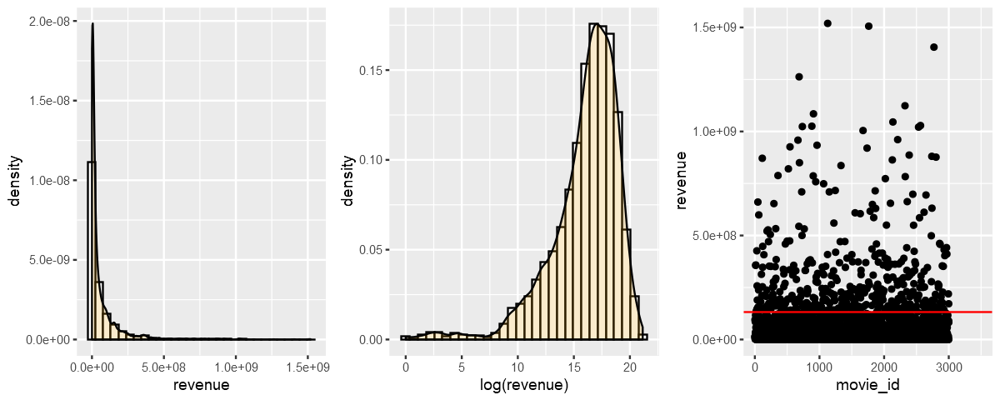

In [13]:
p1 <- ggplot(movies_ff, aes(x=revenue)) + geom_histogram(aes(y=..density..), colour="black", fill="white")+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
#log reveue
p2 <- ggplot(movies_ff, aes(x=log(revenue))) + geom_histogram(aes(y=..density..), colour="black", fill="white")+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p3 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=revenue)) + xlim (0,3500) +
      geom_hline(yintercept = 130000000 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2,p3, nrow = 1)

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"


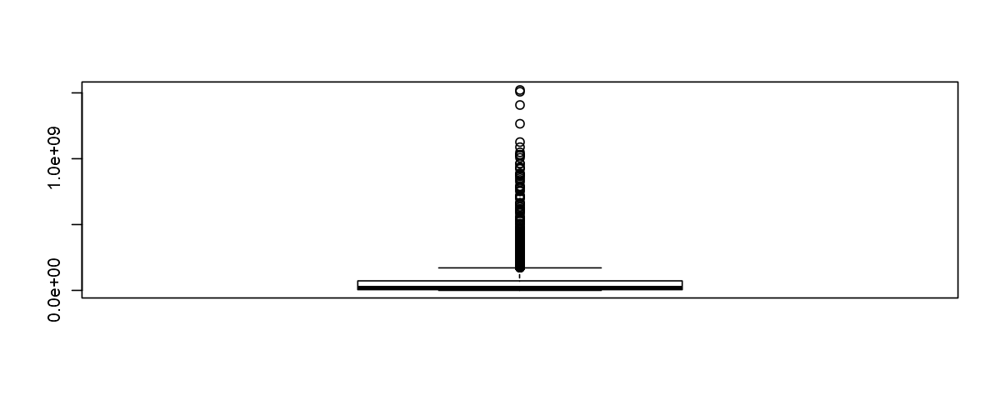

In [14]:
out_revenue <- boxplot(movies_ff$revenue)
options(repr.plot.width = 5, repr.plot.height =15)

In [7]:
head(out_revenue$out) # outlier
min(out_revenue$out) #  minimum outlier
max(out_revenue$out) #  maximum outlier
median(out_revenue$out)
mean(out_revenue$out)
length(out_revenue$out)

[1] 356296601 358372926 426480871 258022233 189859560 660940780

[1] 169852759

[1] 1519557910

[1] 288752301

[1] 376550319

[1] 315

### sw_lang_en

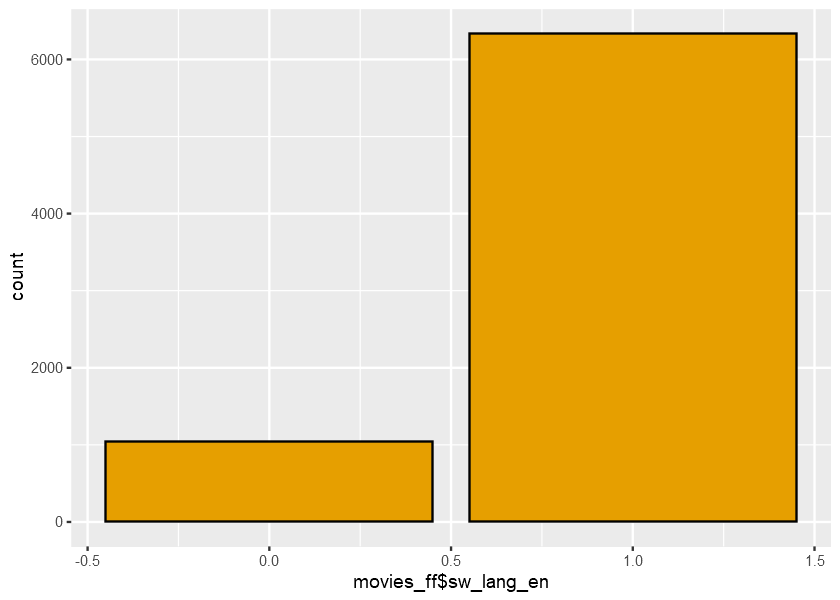

In [43]:
ggplot(movies_ff, aes(movies_ff$sw_lang_en)) + 
    geom_bar(color = "black", fill = "#E69F00")  + 
    theme_get()
   options(repr.plot.width = 7, repr.plot.height = 5)

### sw_web_presence

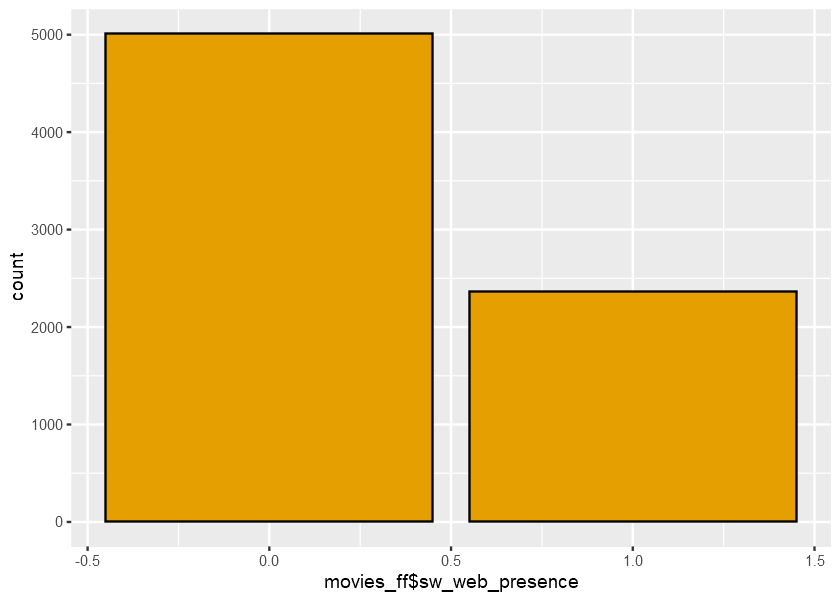

In [71]:
ggplot(movies_ff, aes(movies_ff$sw_web_presence)) + 
    geom_bar(color = "black", fill = "#E69F00")  + 
    theme_get()
   options(repr.plot.width = 7, repr.plot.height = 5)

### sw_has_poster

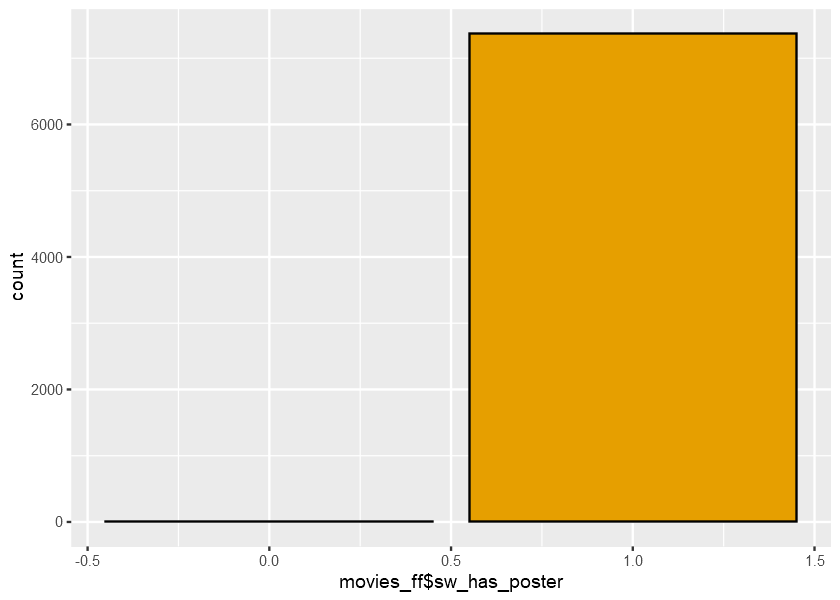

In [46]:
ggplot(movies_ff, aes(movies_ff$sw_has_poster)) + 
    geom_bar(color = "black", fill = "#E69F00")  + 
    theme_get()
   options(repr.plot.width = 7, repr.plot.height = 5)

### sw_tagline

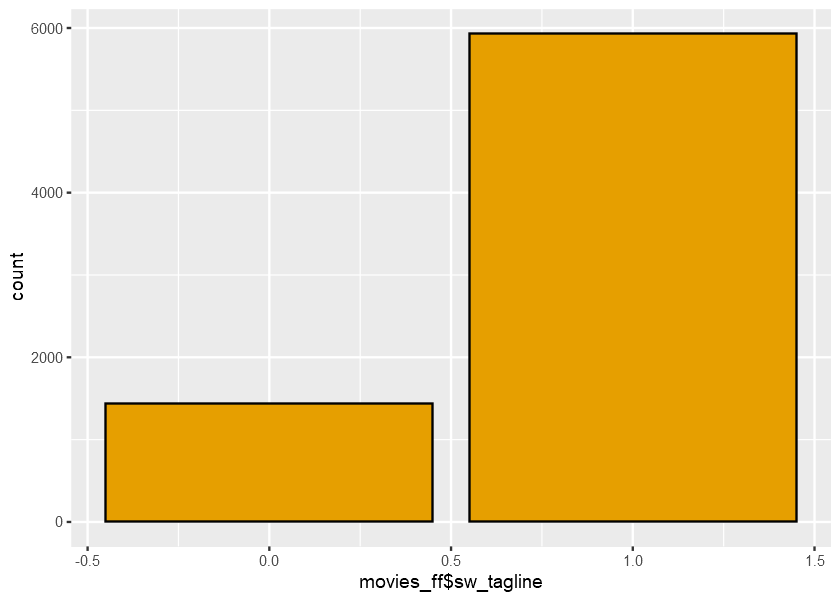

In [48]:
ggplot(movies_ff, aes(movies_ff$sw_tagline)) + 
    geom_bar(color = "black", fill = "#E69F00")  + 
    theme_get()
   options(repr.plot.width = 7, repr.plot.height = 5)

### Release Date Analysis

Warning message:
"Removed 1 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 1 rows containing non-finite values (stat_density)."


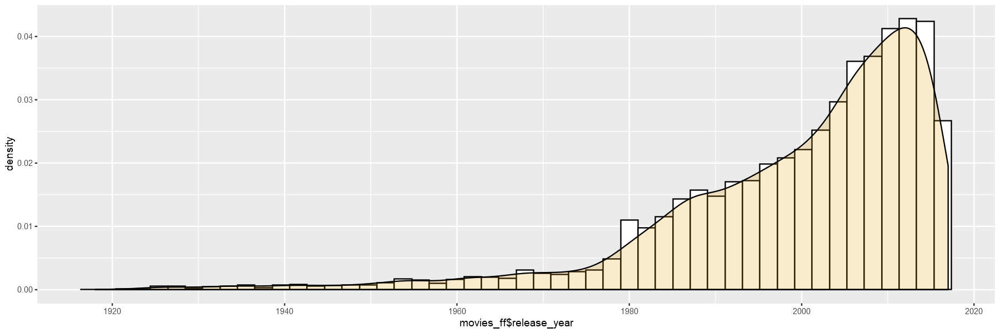

In [77]:
# release_year
ggplot(movies_ff, aes(x=movies_ff$release_year)) + 
 geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 50)+
 geom_density(alpha=0.2, fill="#E69F00") + theme_get()
options(repr.plot.width = 15, repr.plot.height = 5)

Warning message:
"Removed 1 rows containing non-finite values (stat_count)."


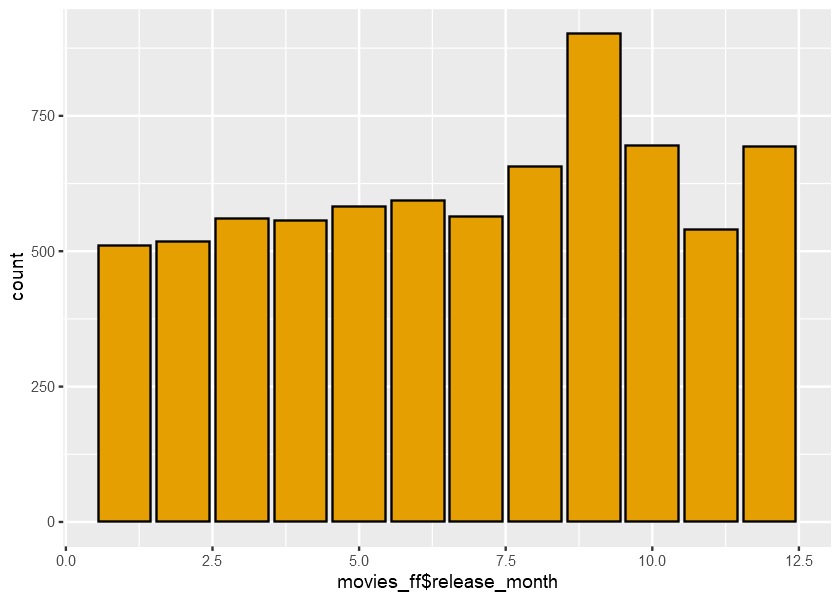

In [78]:
# release_month
ggplot(movies_ff, aes(movies_ff$release_month)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()+
    geom_hline(yintercept =  mean(movies_ff$release_month),na.rm=T,col="red")
   options(repr.plot.width = 7, repr.plot.height = 5)


  1   2   3   4   5   6   7   8   9  10  11  12 
510 518 561 557 582 594 564 657 902 695 540 694 

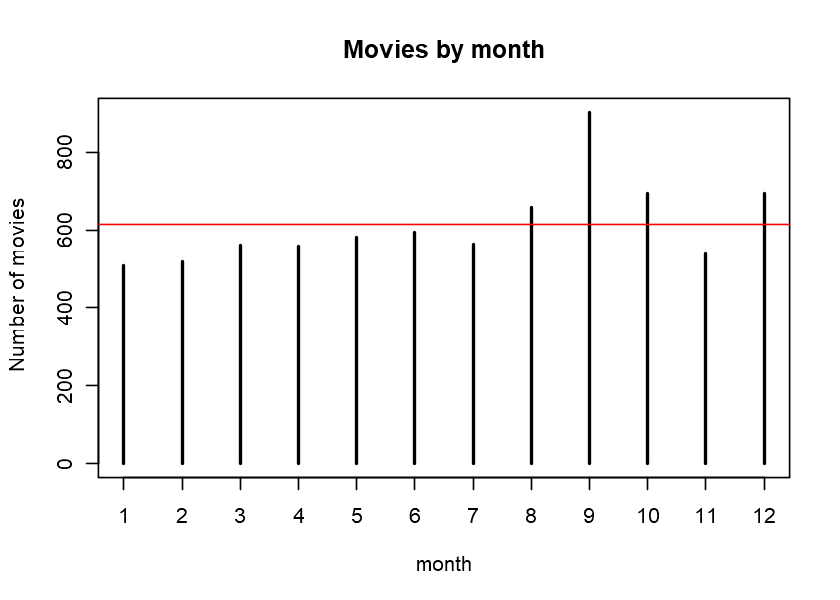

In [89]:
table(movies_ff$release_month)
plot(table(movies_ff$release_month), ylab="Number of movies",xlab="month",main="Movies by month")
abline(h=mean(table(movies_ff$release_month),na.rm = TRUE),col="red")

Warning message:
"Removed 1 rows containing non-finite values (stat_count)."


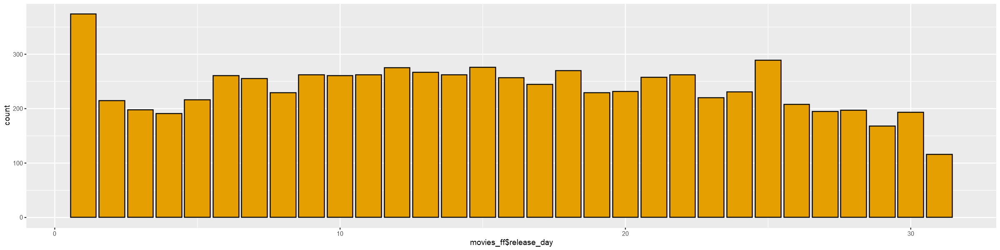

In [104]:
# release_day
ggplot(movies_ff, aes(movies_ff$release_day)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 20, repr.plot.height = 5)


  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20 
374 215 198 191 216 261 255 229 262 261 262 275 267 262 276 257 245 270 229 232 
 21  22  23  24  25  26  27  28  29  30  31 
258 262 220 231 289 208 195 197 168 193 116 

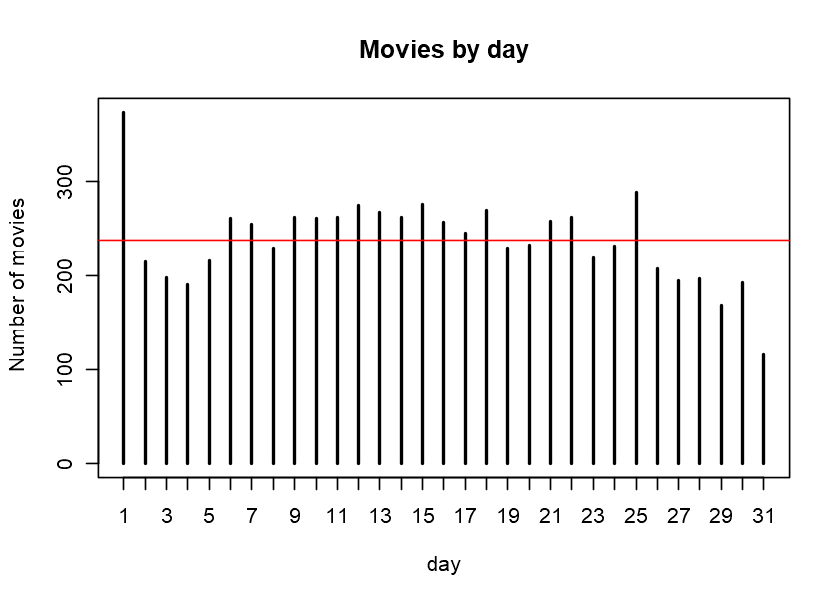

In [91]:
table(movies_ff$release_day)
plot(table(movies_ff$release_day), ylab="Number of movies",xlab="day",main="Movies by day")
abline(h=mean(table(movies_ff$release_day),na.rm = TRUE),col="red")

### Seasonality Analysis

Warning message:
"Removed 1 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 1 rows containing non-finite values (stat_density)."


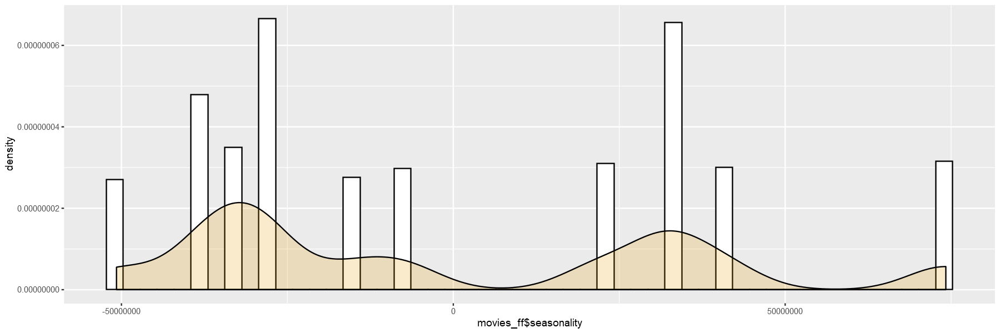

In [138]:
# seasonality
ggplot(movies_ff, aes(x=movies_ff$seasonality)) + 
 geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 50)+
 geom_density(alpha=0.2, fill="#E69F00") + theme_get()

In [145]:
movie.time <- movies_ff %>% 
    mutate(release_year,release_month) %>%
    group_by(release_year,release_month) %>%
    summarise(n=n(),revenue_mean=mean(revenue,na.rm=T)) %>%
    select(release_year,release_month,n,revenue_mean) %>%
    filter(between(release_year,1985,2016))

movie.time$revenue_mean <- ifelse(is.na(movie.time$revenue_mean),0,movie.time$revenue_mean)

movie.ts <- ts(movie.time$revenue_mean, start = c(1995, 1), end=c(2016,12), frequency = 12)

In [148]:
movie.ts

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
1995,7,27233140,20325078,390659,102655171,43092109,35269132,9014279,10609321,5818146,20032287,40555964
1996,0,15377563,43077666,5239644,102281980,34245468,45464460,19927038,750000,46838412,36949300,35539822
1997,3200000,9518342,47771934,46682407,4738953,89026107,28382331,31309195,88981269,13119518,11294901,55617613
1998,5943231,26998319,22785921,12120007,142984274,127698510,11404671,10552278,2252640,14481664,30978712,76231706
1999,12404204,31613134,15869677,35859929,237182311,134387126,80806356,5422857,39485040,85983742,139434862,31589510
2000,17030246,15090574,1305887,15774500,66171445,120099325,505000000,40747115,2244231,42088087,172364257,43665526
2001,6853159,47364375,65595485,14306524,34356941,207845079,30102717,7332090,11078252,707701,198461,2358239
2002,21621000,0,128423253,35869301,41940207,229025794,31823577,15394379,24993547,11864944,114758510,107764097
2003,5491903,83964186,9656091,9730837,46769121,203906638,80976750,9459298,24768048,40119046,40093966,33268915
2004,1653565,31836719,91361221,11733804,6918587,406287050,184127456,0,18346899,8112656,60912004,59239151


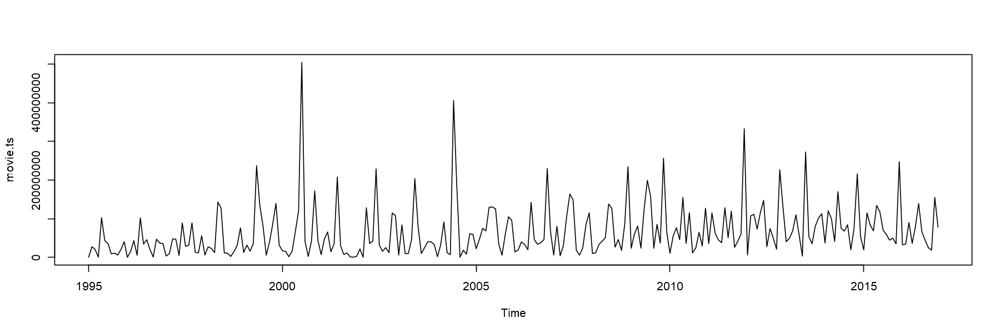

In [150]:
plot(movie.ts)

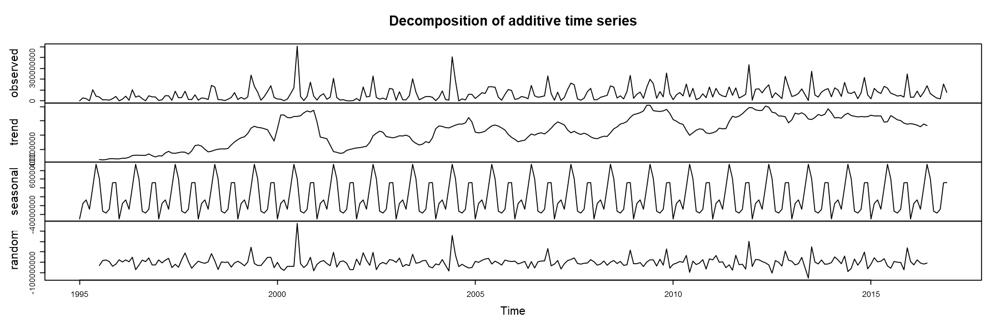

In [152]:
plot(decompose(movie.ts))

In [159]:
movie.dec <- decompose(movie.ts)
head(movie.dec$seasonal)
montly_trend <- data.frame(month=c(1:12),season=movie.dec$seasonal[1:12]) # season=movie.dec$seasonal[1:12]) ts is matrix since we want only the first line we take the first 12 varibles 
montly_trend

[1] -50832969 -15414392  -7254937 -28510946  21652661  74099998

month,season
<int>,<dbl>
1,-50832969
2,-15414392
3,-7254937
4,-28510946
5,21652661
6,74099998
7,41133257
8,-33067831
9,-37243111


### sw_collection

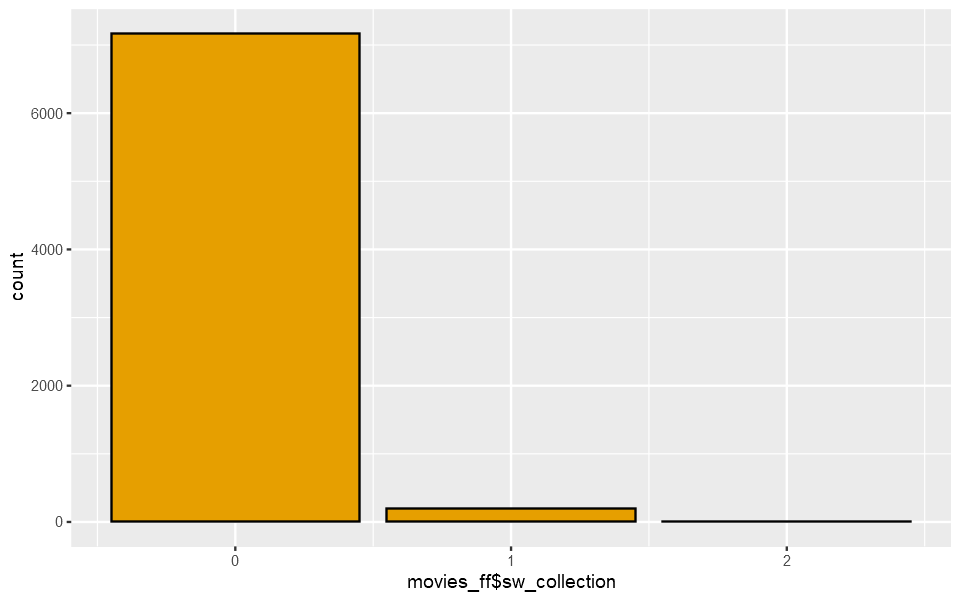

In [122]:
ggplot(movies_ff, aes(movies_ff$sw_collection)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### producers_cnt Analysis

Warning message:
"Removed 395 rows containing non-finite values (stat_count)."
Warning message:
"Removed 395 rows containing missing values (geom_point)."


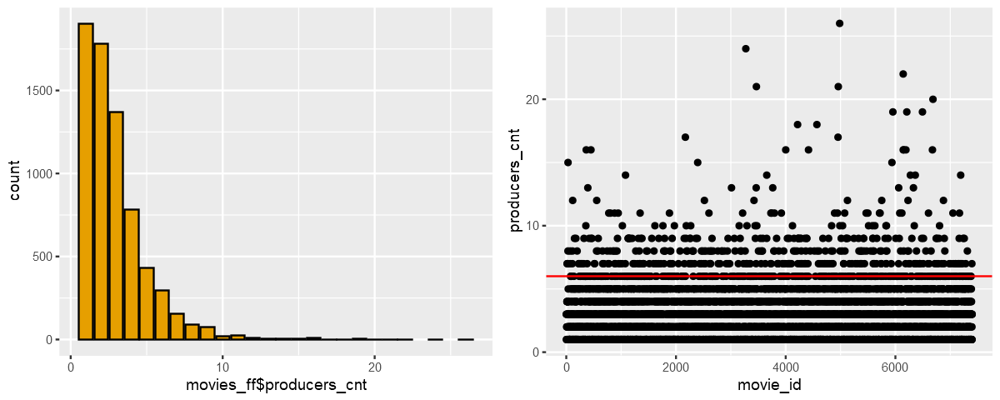

In [15]:
p1 <- ggplot(movies_ff, aes(movies_ff$producers_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=producers_cnt)) + geom_hline(yintercept = 6 ,color="red")
   
options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

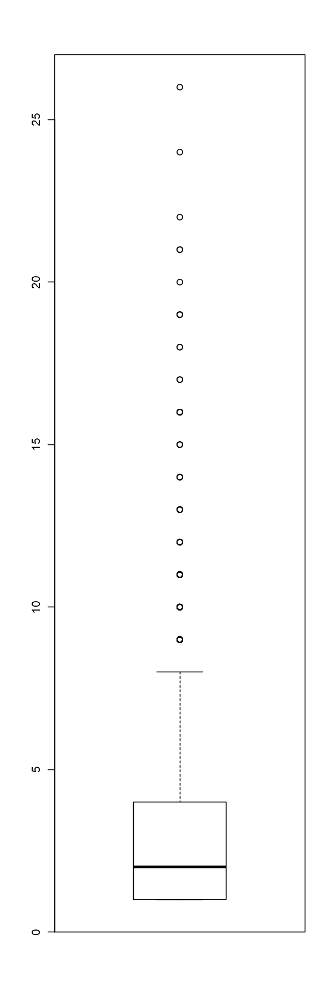

In [8]:
out_producers_cnt <- boxplot(movies_ff$producers_cnt)
options(repr.plot.width = 5, repr.plot.height = 5)

In [86]:
head(out_producers_cnt$out) # outlier
min(out_producers_cnt$out) #  minimum outlier
max(out_producers_cnt$out) #  maximum outlier
median(out_producers_cnt$out)
mean(out_producers_cnt$out)
length(out_producers_cnt$out)

[1] 15 12  9  9  9 10

[1] 9

[1] 26

[1] 10

[1] 11.21472

[1] 163

### countries_cnt Analysis

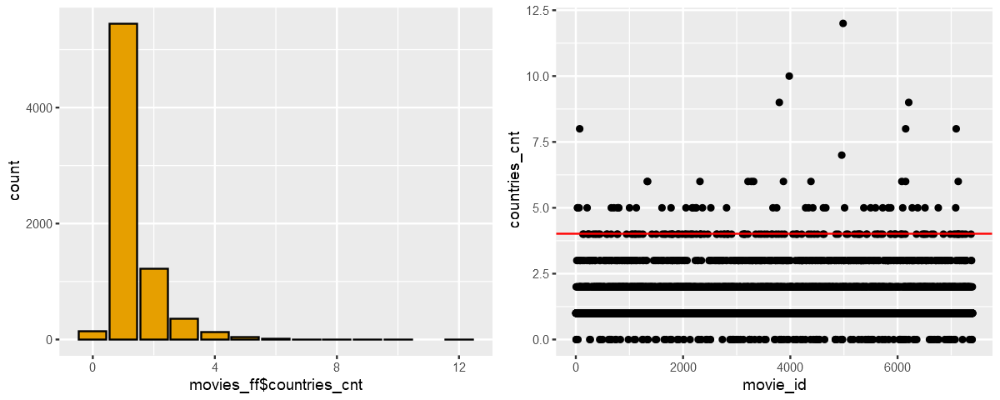

In [16]:
p1 <- ggplot(movies_ff, aes(movies_ff$countries_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=countries_cnt)) + geom_hline(yintercept = 4 ,color="red")
   
options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

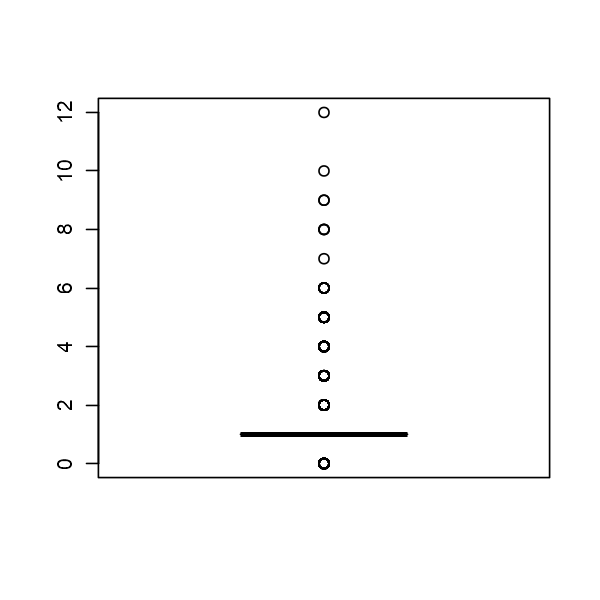

In [9]:
out_countries_cnt <- boxplot(movies_ff$countries_cnt)
options(repr.plot.width = 8, repr.plot.height = 20)

In [84]:
head(out_countries_cnt$out) # outlier head list
min(out_countries_cnt$out) #  minimum outlier
max(out_countries_cnt$out) #  maximum outlier
median(out_countries_cnt$out)
mean(out_countries_cnt$out)
length(out_countries_cnt$out)

[1] 0 2 0 3 2 2

[1] 0

[1] 12

[1] 2

[1] 2.284971

[1] 1923

### lang_US

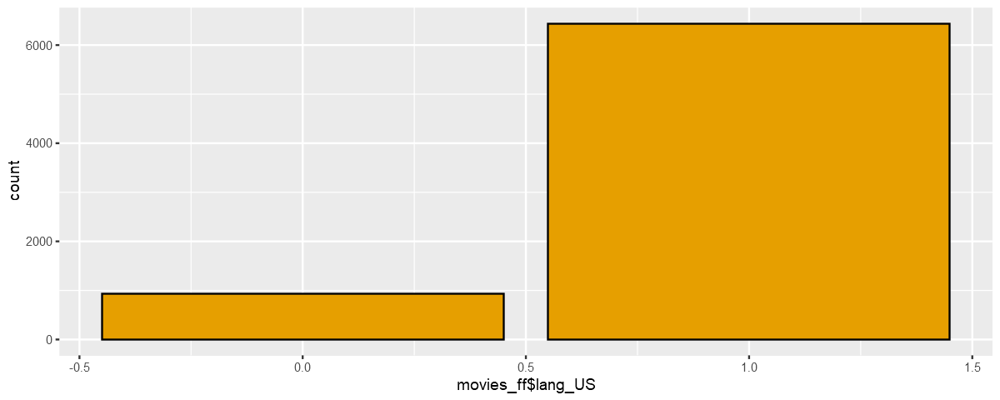

In [17]:
ggplot(movies_ff, aes(movies_ff$lang_US)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### lang_FR

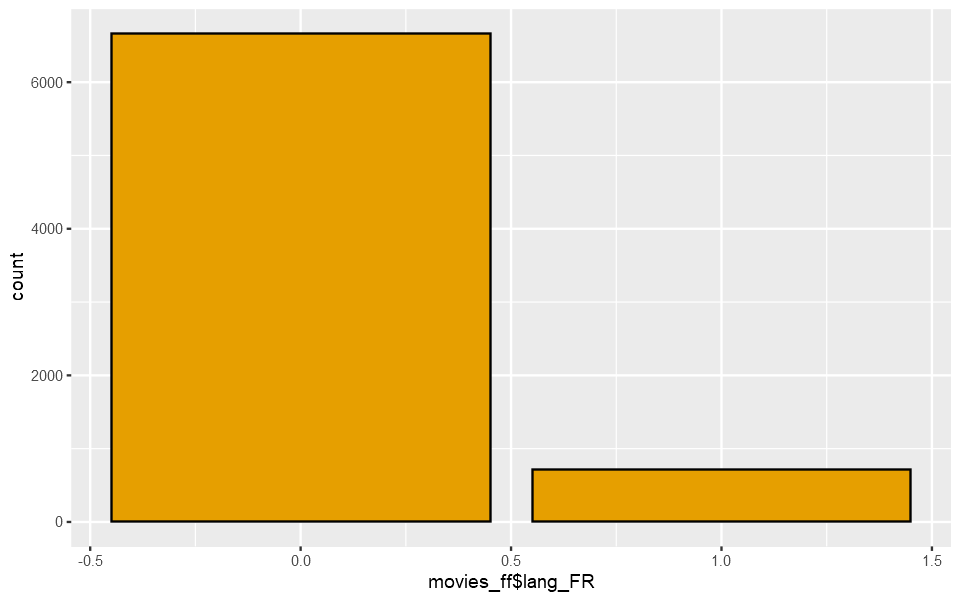

In [138]:
ggplot(movies_ff, aes(movies_ff$lang_FR)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### lang_RU

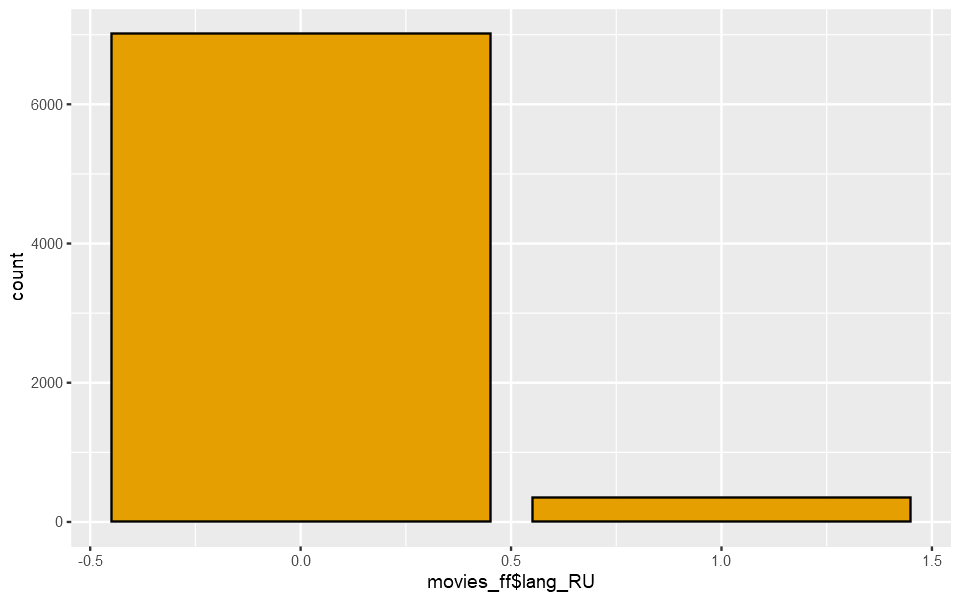

In [140]:
ggplot(movies_ff, aes(movies_ff$lang_RU)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### lang_ES

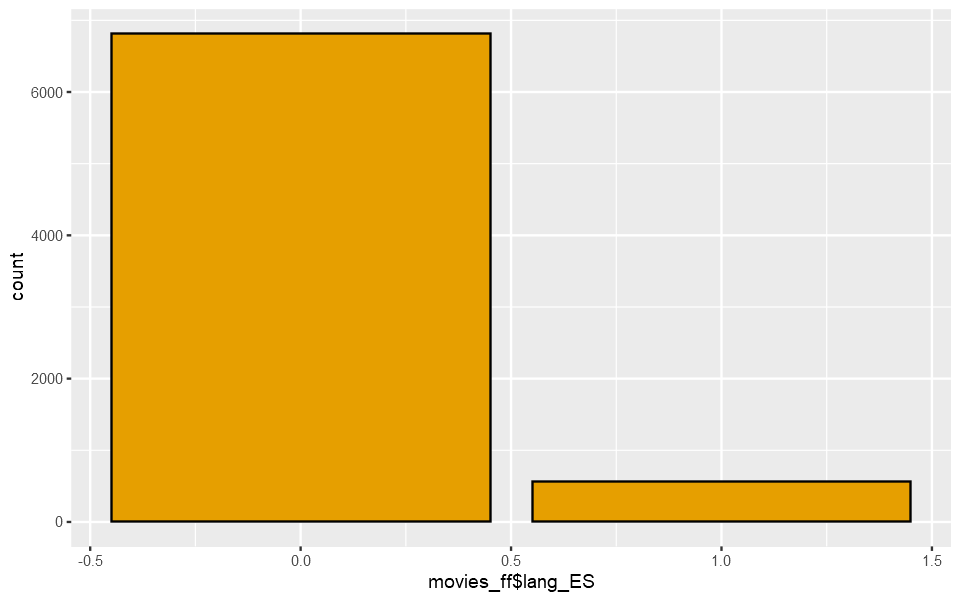

In [142]:
ggplot(movies_ff, aes(movies_ff$lang_ES)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### lang_JA

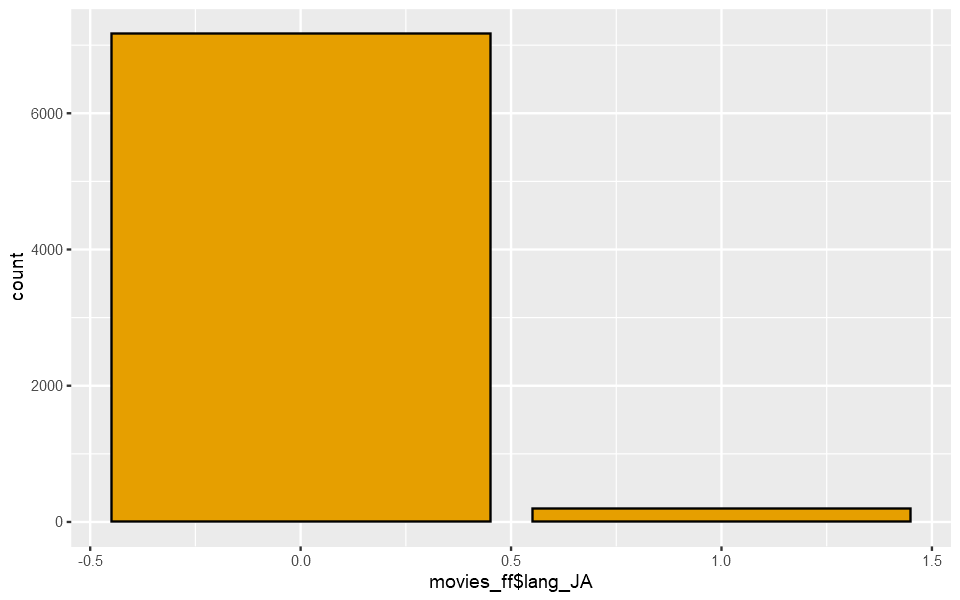

In [144]:
ggplot(movies_ff, aes(movies_ff$lang_JA)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### keyword_cnt Analysis

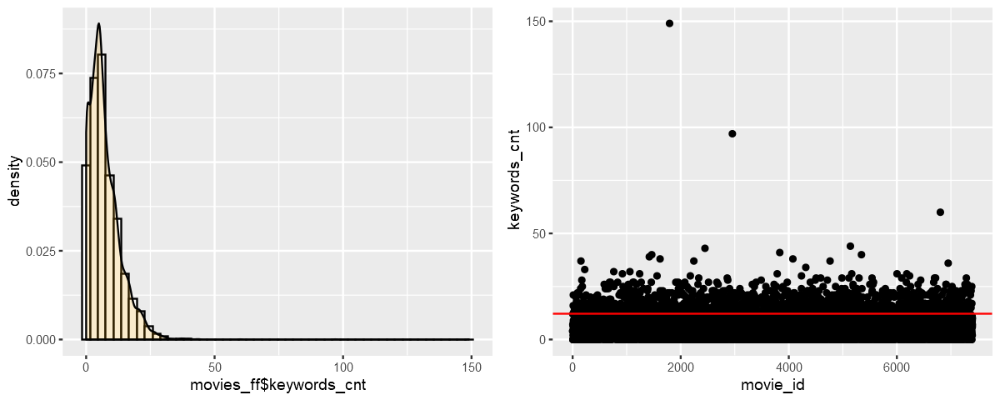

In [19]:
p1 <- ggplot(movies_ff, aes(x=movies_ff$keywords_cnt)) + geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 50)+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=keywords_cnt)) + geom_hline(yintercept = 12 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

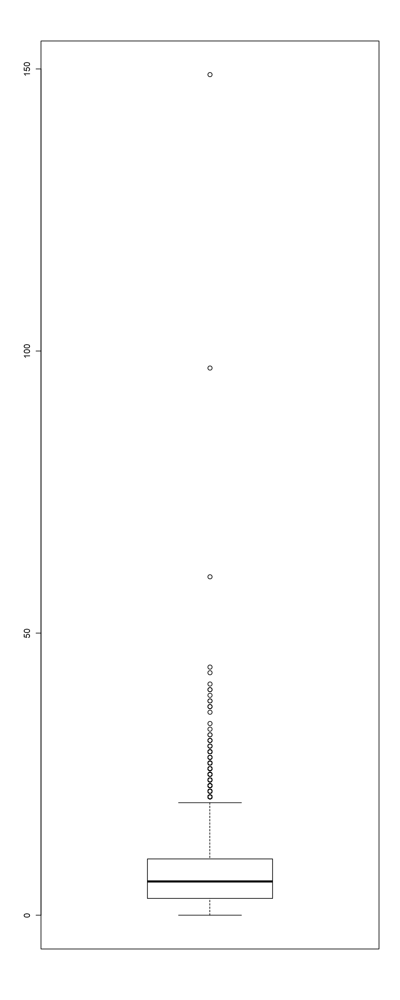

In [10]:
out_keywords_cnt <- boxplot(movies_ff$keywords_cnt) 
options(repr.plot.width = 5, repr.plot.height = 5)

In [82]:
head(out_keywords_cnt$out)
min(out_keywords_cnt$out)
max(out_keywords_cnt$out)
median(out_keywords_cnt$out)
mean(out_keywords_cnt$out)
length(out_keywords_cnt$out)

[1] 21 22 22 21 24 37

[1] 21

[1] 149

[1] 23

[1] 25.33453

[1] 278

### actor0_movies_cnt Analysis

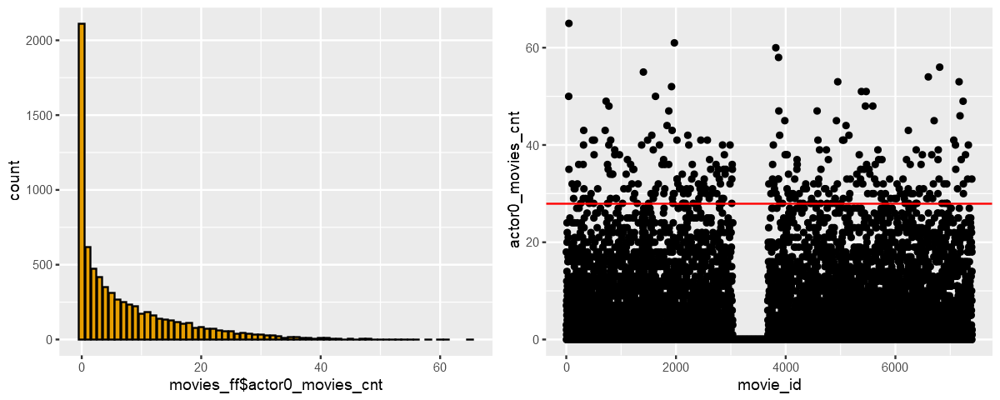

In [20]:
p1 <- ggplot(movies_ff, aes(movies_ff$actor0_movies_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor0_movies_cnt)) + geom_hline(yintercept = 28 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

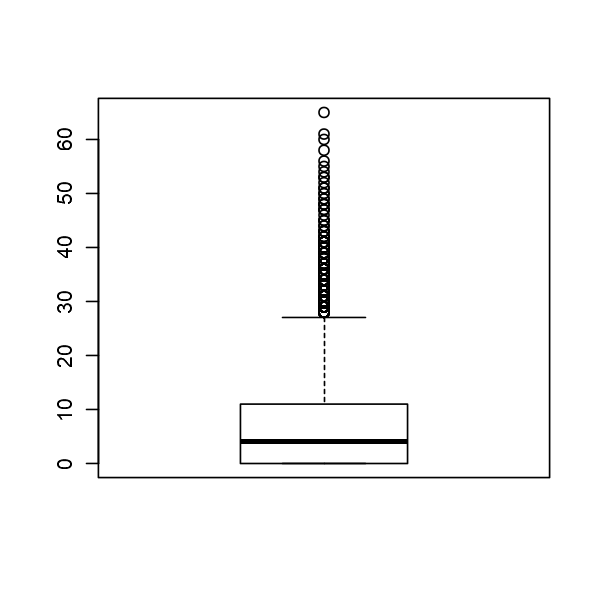

In [79]:
out_actor0_movies_cnt <- boxplot(movies_ff$actor0_movies_cnt) 
options(repr.plot.width = 5, repr.plot.height = 5)

In [80]:
head(out_actor0_movies_cnt$out)
min(out_actor0_movies_cnt$out)
max(out_actor0_movies_cnt$out)
median(out_actor0_movies_cnt$out)
mean(out_actor0_movies_cnt$out)
length(out_actor0_movies_cnt$out)

[1] 50 65 35 32 29 31

[1] 28

[1] 65

[1] 32

[1] 34.49346

[1] 306

### actor0_movies_5y_cnt Analysis

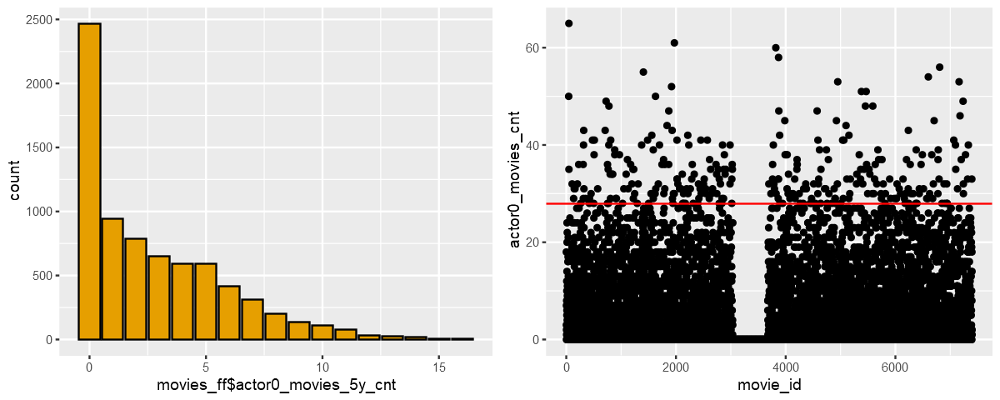

In [21]:
p1 <- ggplot(movies_ff, aes(movies_ff$actor0_movies_5y_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
P2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor0_movies_5y_cnt)) + geom_hline(yintercept = 13 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

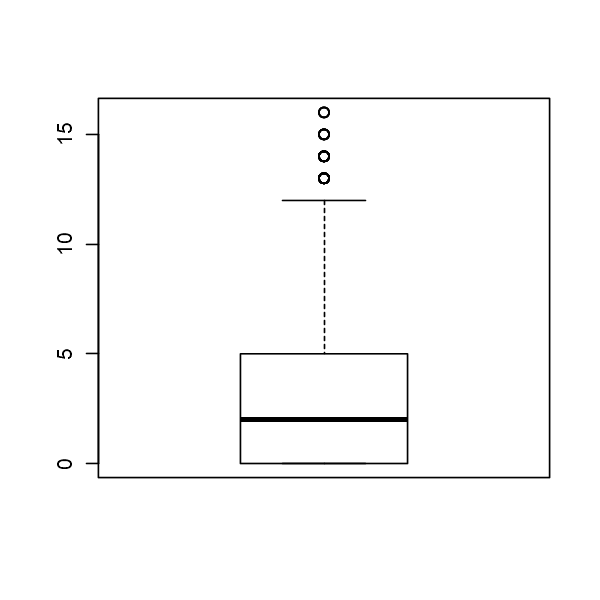

In [11]:
out_actor0_movies_5y_cnt <- boxplot(movies_ff$actor0_movies_5y_cnt) 
options(repr.plot.width = 5, repr.plot.height = 5)

In [78]:
head(out_actor0_movies_5y_cnt$out)
min(out_actor0_movies_5y_cnt$out)
max(out_actor0_movies_5y_cnt$out)
median(out_actor0_movies_5y_cnt$out)
mean(out_actor0_movies_5y_cnt$out)
length(out_actor0_movies_5y_cnt$out)

[1] 14 14 13 13 15 13

[1] 13

[1] 16

[1] 14

[1] 13.82692

[1] 52

### actor1_movies_cnt Analysis

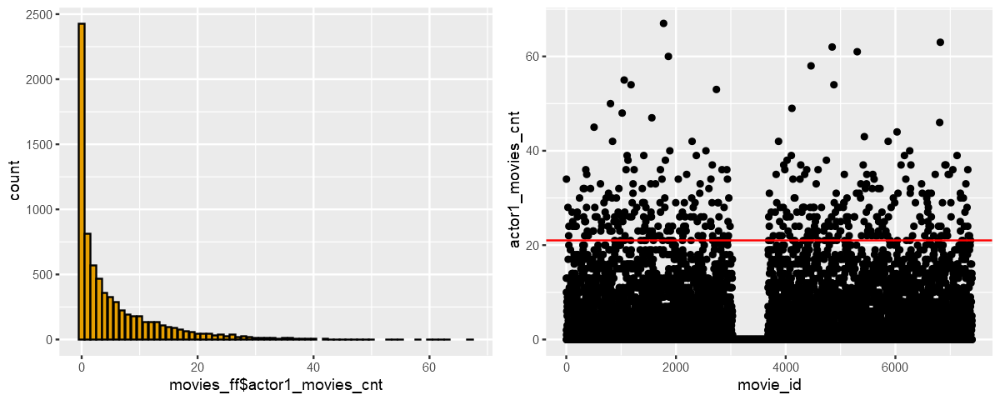

In [22]:
p1 <- ggplot(movies_ff, aes(movies_ff$actor1_movies_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor1_movies_cnt)) + geom_hline(yintercept = 21 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

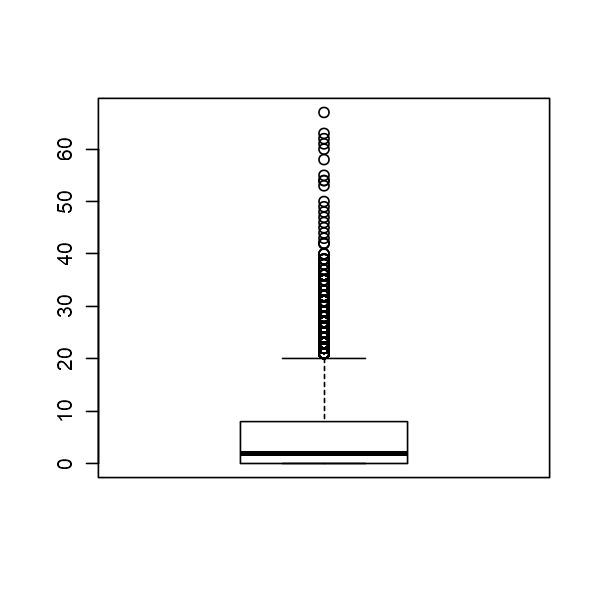

In [12]:
out_actor1_movies_cnt <- boxplot(movies_ff$actor1_movies_cnt) 
options(repr.plot.width = 5, repr.plot.height = 5)

In [76]:
head(out_actor1_movies_cnt$out)
min(out_actor1_movies_cnt$out)
max(out_actor1_movies_cnt$out)
median(out_actor1_movies_cnt$out)
mean(out_actor1_movies_cnt$out)
length(out_actor1_movies_cnt$out)

[1] 34 28 22 24 27 24

[1] 21

[1] 67

[1] 26

[1] 28.09002

[1] 411

### actor1_movies_5y_cnt

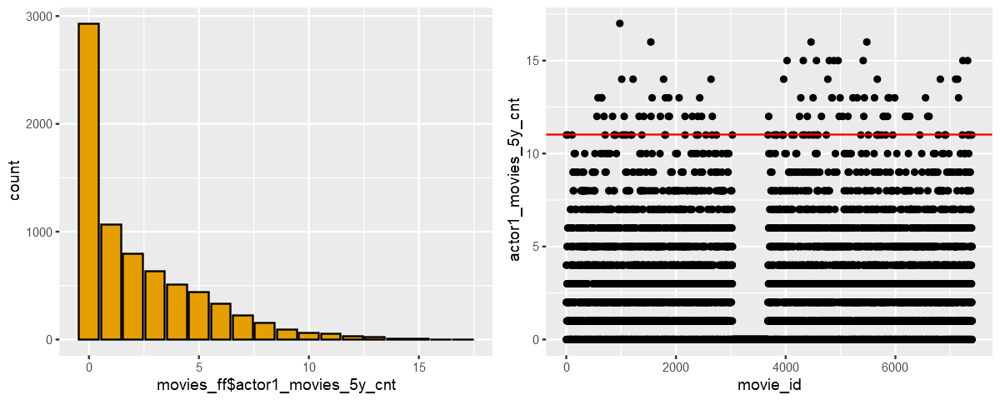

In [23]:
p1 <- ggplot(movies_ff, aes(movies_ff$actor1_movies_5y_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor1_movies_5y_cnt)) + geom_hline(yintercept = 11 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

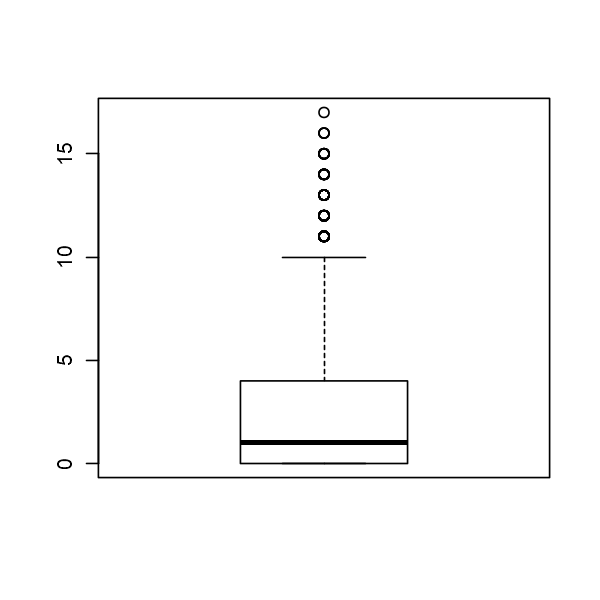

In [13]:
out_actor1_movies_5y_cnt <- boxplot(movies_ff$actor1_movies_5y_cnt) 

In [74]:
head(out_actor1_movies_5y_cnt$out)
min(out_actor1_movies_5y_cnt$out)
max(out_actor1_movies_5y_cnt$out)
median(out_actor1_movies_5y_cnt$out)
mean(out_actor1_movies_5y_cnt$out)
length(out_actor1_movies_5y_cnt$out)

[1] 11 11 11 12 13 13

[1] 11

[1] 17

[1] 12

[1] 12.24242

[1] 132

### actor2_movies_cnt

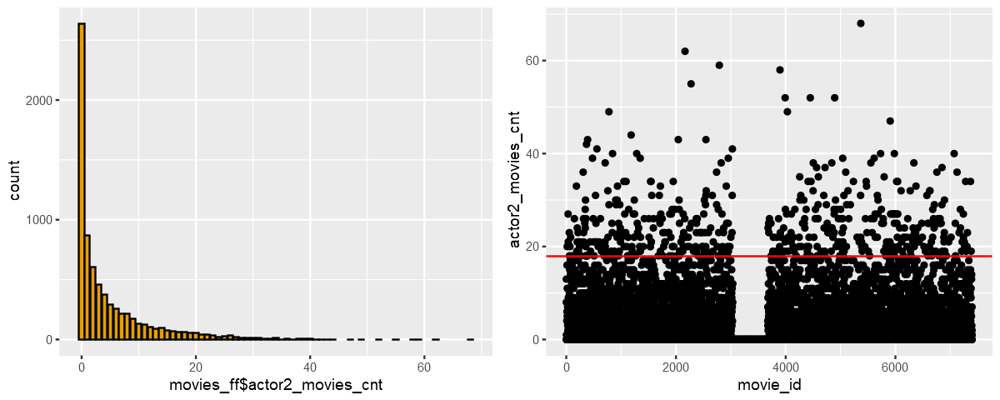

In [24]:
p1 <- ggplot(movies_ff, aes(movies_ff$actor2_movies_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor2_movies_cnt)) + geom_hline(yintercept = 18 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

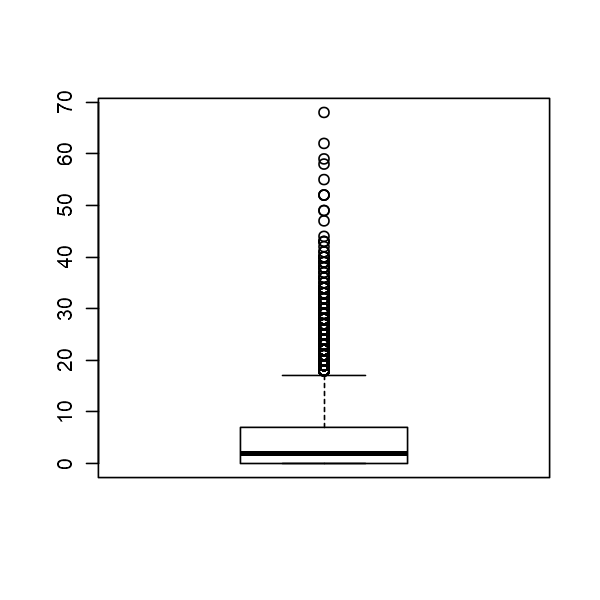

In [14]:
out_actor2_movies_cnt <- boxplot(movies_ff$actor2_movies_cnt) 

In [72]:
head(out_actor2_movies_cnt$out)
min(out_actor2_movies_cnt$out)
max(out_actor2_movies_cnt$out)
median(out_actor2_movies_cnt$out)
mean(out_actor2_movies_cnt$out)
length(out_actor2_movies_cnt$out)

[1] 20 27 21 23 18 20

[1] 18

[1] 68

[1] 23

[1] 24.87377

[1] 507

### actor2_movies_5y_cnt Analysis

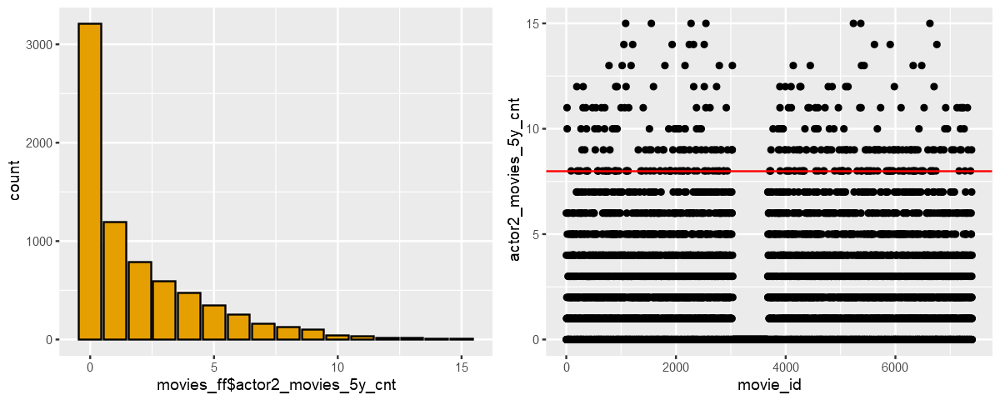

In [26]:
p1 <- ggplot(movies_ff, aes(movies_ff$actor2_movies_5y_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor2_movies_5y_cnt)) + geom_hline(yintercept = 8 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

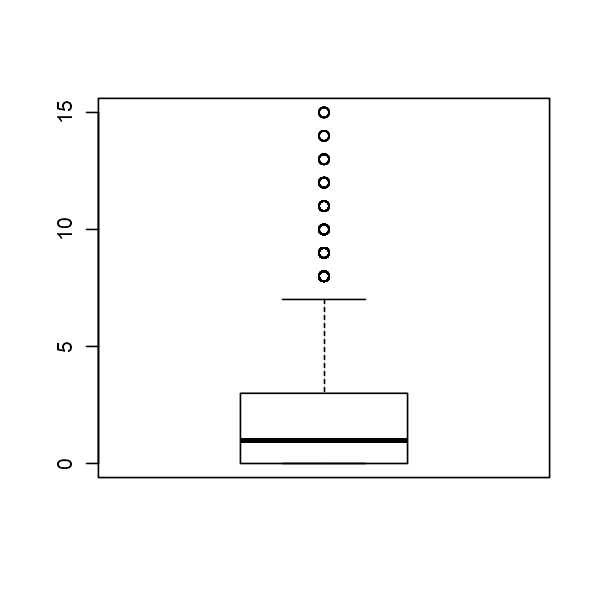

In [15]:
out_actor2_movies_5y_cnt <- boxplot(movies_ff$actor2_movies_5y_cnt) 

In [70]:
head(out_actor2_movies_5y_cnt$out)
min(out_actor2_movies_5y_cnt$out)
max(out_actor2_movies_5y_cnt$out)
median(out_actor2_movies_5y_cnt$out)
mean(out_actor2_movies_5y_cnt$out)
length(out_actor2_movies_5y_cnt$out)

[1] 11 10  8 12  8  8

[1] 8

[1] 15

[1] 9

[1] 9.530435

[1] 345

### sw_female_actor0

Warning message:
"Removed 934 rows containing non-finite values (stat_count)."


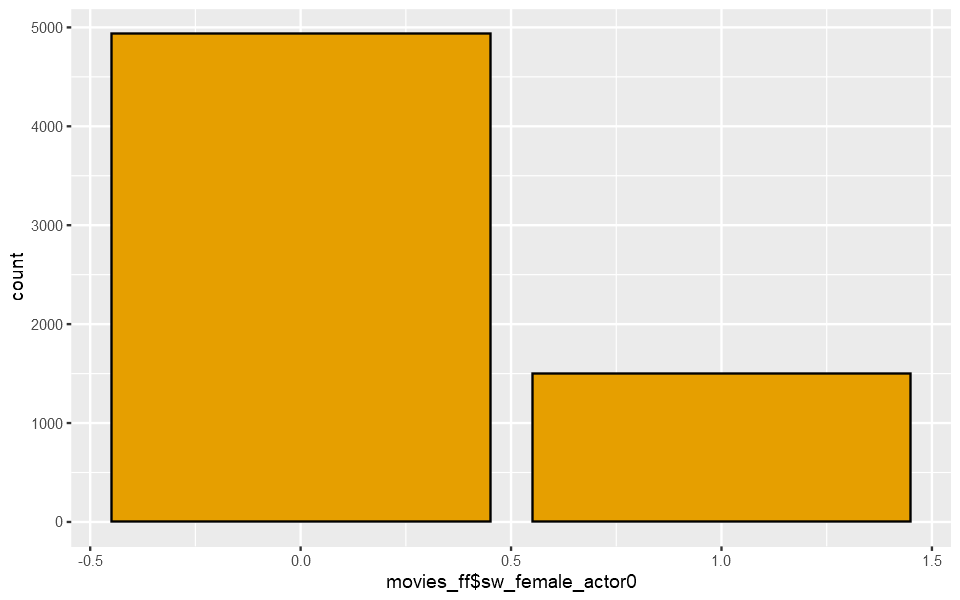

In [166]:
ggplot(movies_ff, aes(movies_ff$sw_female_actor0)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### sw_female_actor1

Warning message:
"Removed 782 rows containing non-finite values (stat_count)."


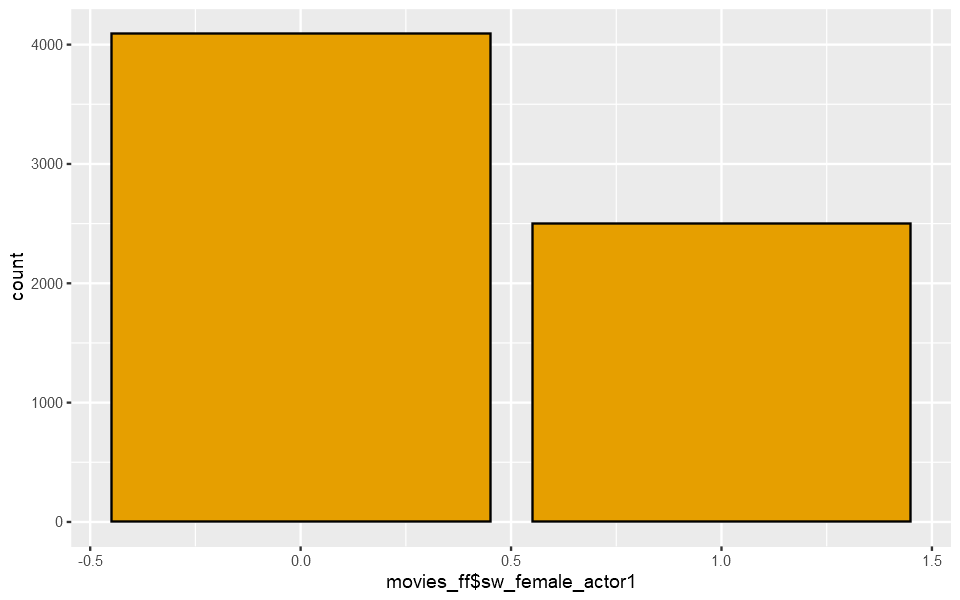

In [167]:
ggplot(movies_ff, aes(movies_ff$sw_female_actor1)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### sw_female_actor2

Warning message:
"Removed 788 rows containing non-finite values (stat_count)."


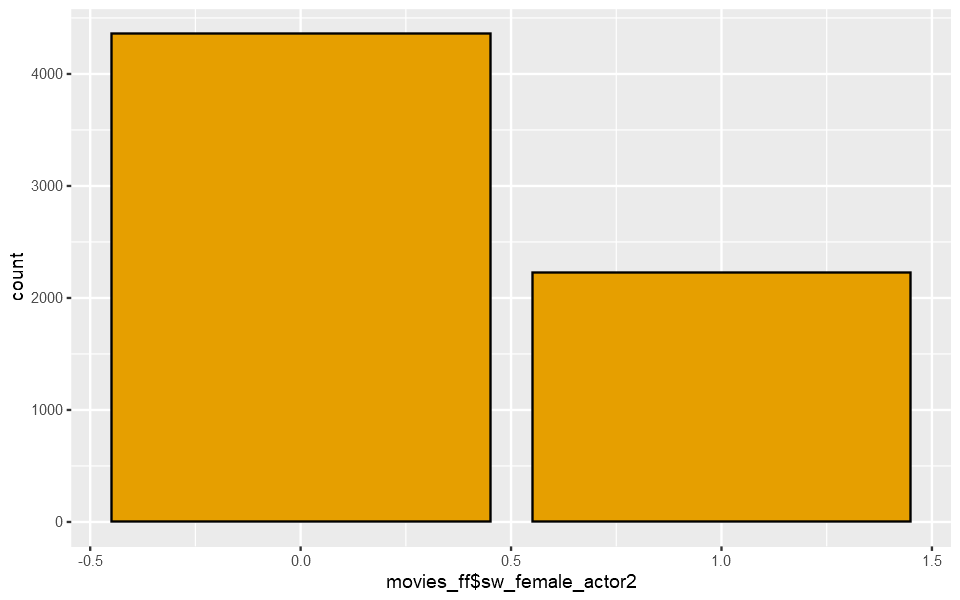

In [168]:
ggplot(movies_ff, aes(movies_ff$sw_female_actor2)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### sw_male_actor0

Warning message:
"Removed 934 rows containing non-finite values (stat_count)."


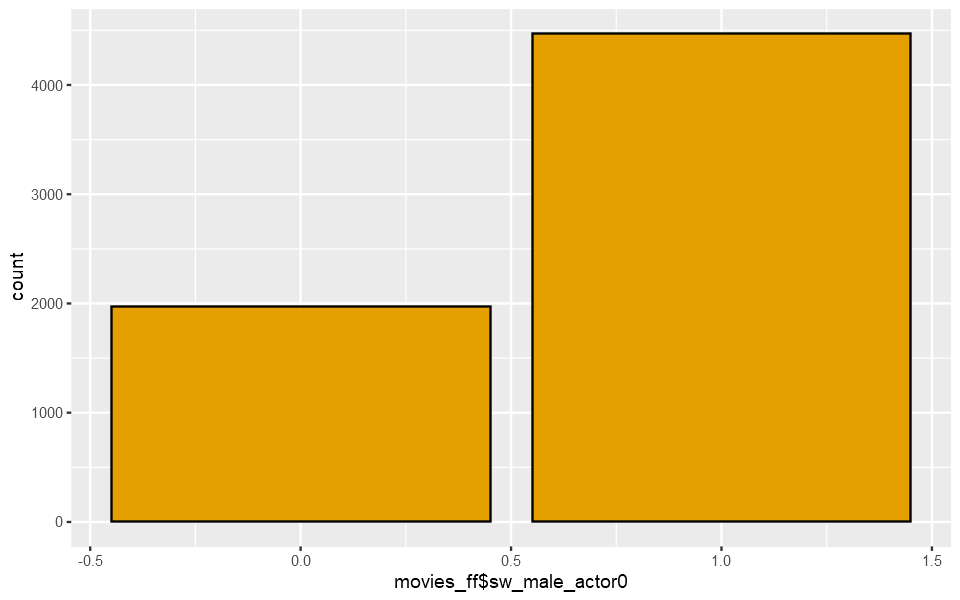

In [169]:
ggplot(movies_ff, aes(movies_ff$sw_male_actor0)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### sw_male_actor1

Warning message:
"Removed 782 rows containing non-finite values (stat_count)."


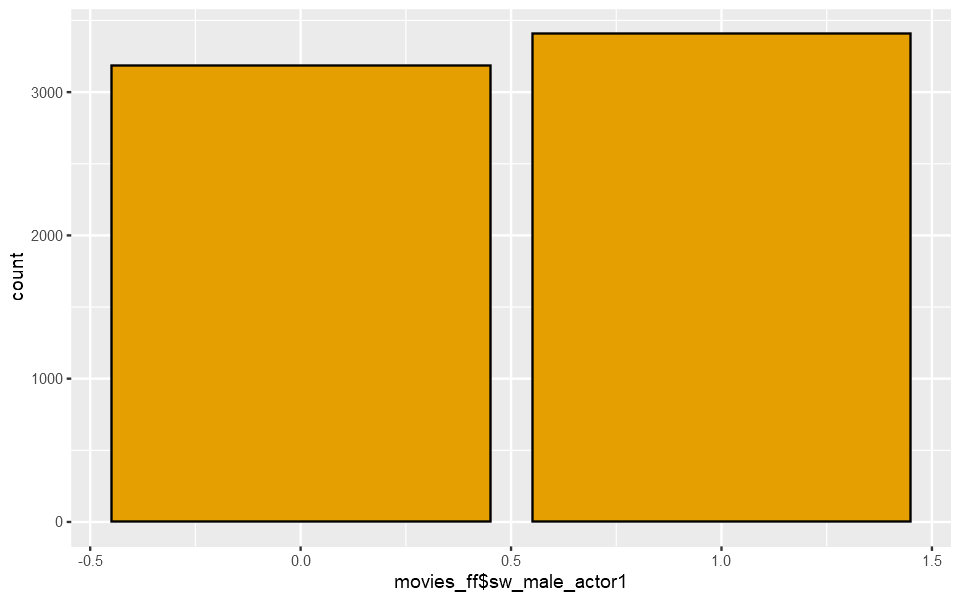

In [171]:
ggplot(movies_ff, aes(movies_ff$sw_male_actor1)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### sw_male_actor2

Warning message:
"Removed 788 rows containing non-finite values (stat_count)."


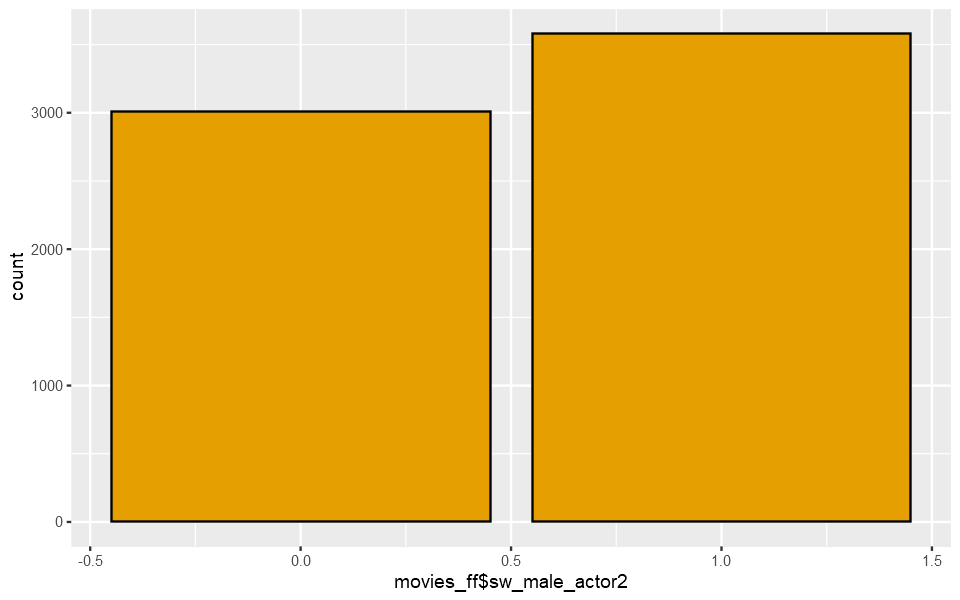

In [172]:
ggplot(movies_ff, aes(movies_ff$sw_male_actor2)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    theme_get()
   options(repr.plot.width = 8, repr.plot.height = 5)

### # actor0_prev_revenue Analysis

Warning message:
"Removed 2752 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 2752 rows containing non-finite values (stat_density)."
Warning message:
"Removed 2752 rows containing missing values (geom_point)."


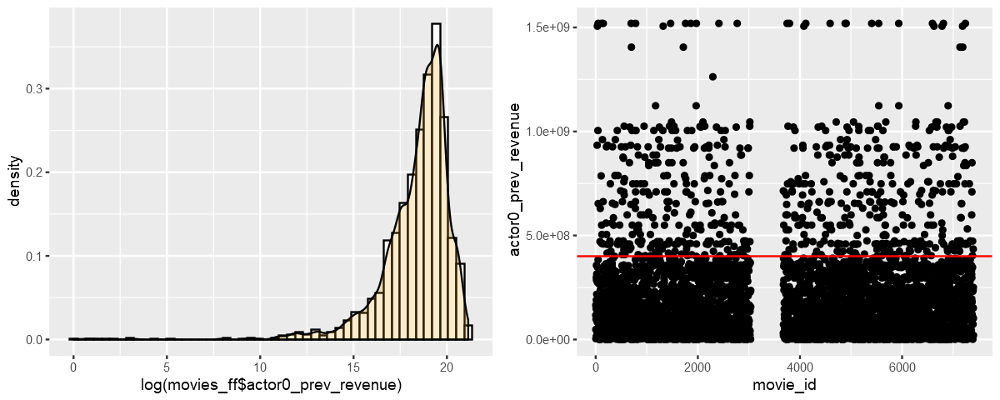

In [27]:
p1 <- ggplot(movies_ff, aes(x=log(movies_ff$actor0_prev_revenue))) + 
      geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 50)+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor0_prev_revenue)) + 
      geom_hline(yintercept = 400000000 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"


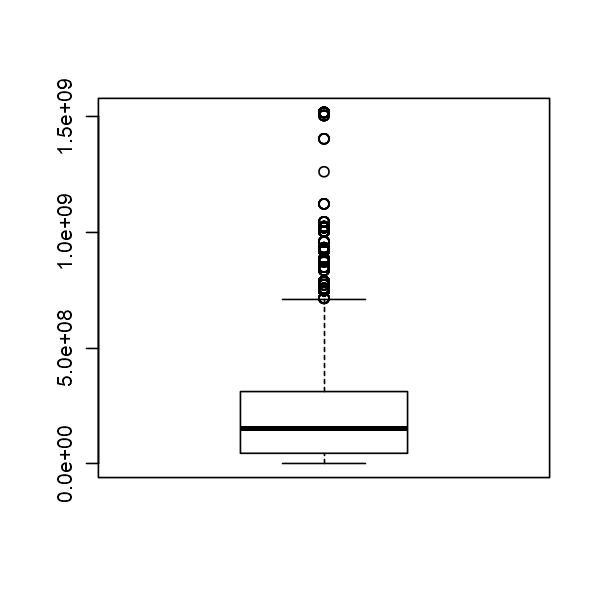

In [16]:
out_actor0_prev_revenue <- boxplot(movies_ff$actor0_prev_revenue) 

In [68]:
head(out_actor0_prev_revenue$out)
min(out_actor0_prev_revenue$out)
max(out_actor0_prev_revenue$out)
median(out_actor0_prev_revenue$out)
mean(out_actor0_prev_revenue$out)
length(out_actor0_prev_revenue$out)

[1]  933959197 1506249360 1004558444 1519557910  786636033 1519557910

[1] 714766572

[1] 1519557910

[1] 926287400

[1] 970535871

[1] 281

### actor1_prev_revenue Analysis

Warning message:
"Removed 3201 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 3201 rows containing non-finite values (stat_density)."
Warning message:
"Removed 3201 rows containing missing values (geom_point)."


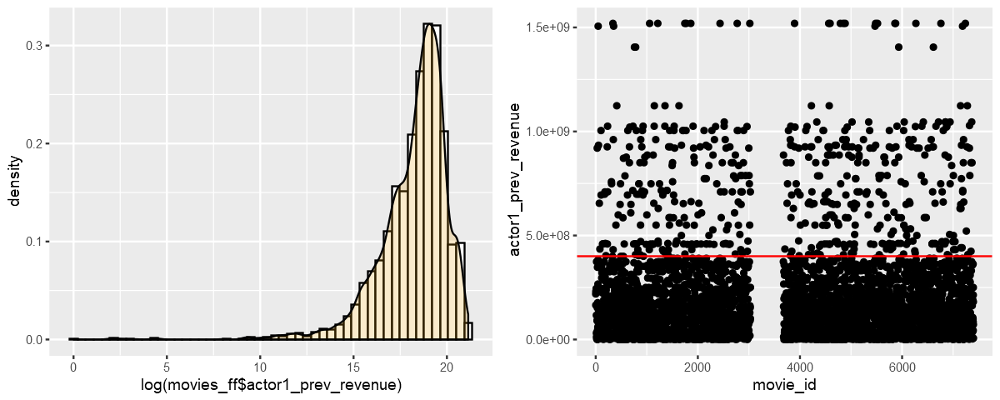

In [28]:
p1 <- ggplot(movies_ff, aes(x=log(movies_ff$actor1_prev_revenue))) + 
      geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 50)+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor1_prev_revenue)) + 
      geom_hline(yintercept = 400000000 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"


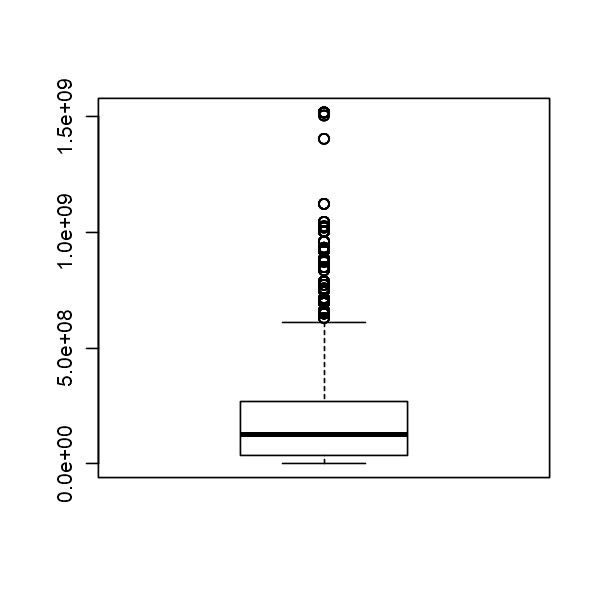

In [17]:
out_actor1_prev_revenue <- boxplot(movies_ff$actor1_prev_revenue) 

In [66]:
head(out_actor1_prev_revenue$out)
min(out_actor1_prev_revenue$out)
max(out_actor1_prev_revenue$out)
median(out_actor1_prev_revenue$out)
mean(out_actor1_prev_revenue$out)
length(out_actor1_prev_revenue$out)

[1]  920100000 1506249360  933959197  655011224 1004558444  694713380

[1] 630161890

[1] 1519557910

[1] 886686817

[1] 913759883

[1] 326

### actor2_prev_revenue

Warning message:
"Removed 3423 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 3423 rows containing non-finite values (stat_density)."
Warning message:
"Removed 3423 rows containing missing values (geom_point)."


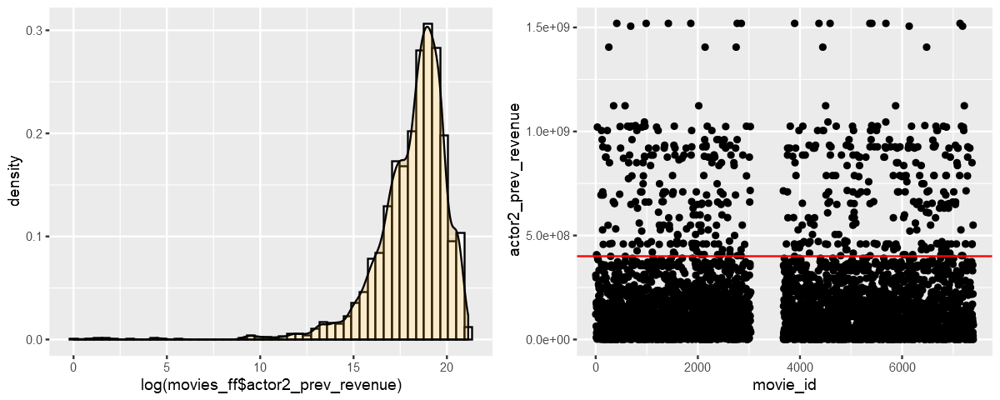

In [29]:
p1 <- ggplot(movies_ff, aes(x=log(movies_ff$actor2_prev_revenue))) + 
      geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 50)+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=actor2_prev_revenue)) + 
      geom_hline(yintercept = 400000000 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"


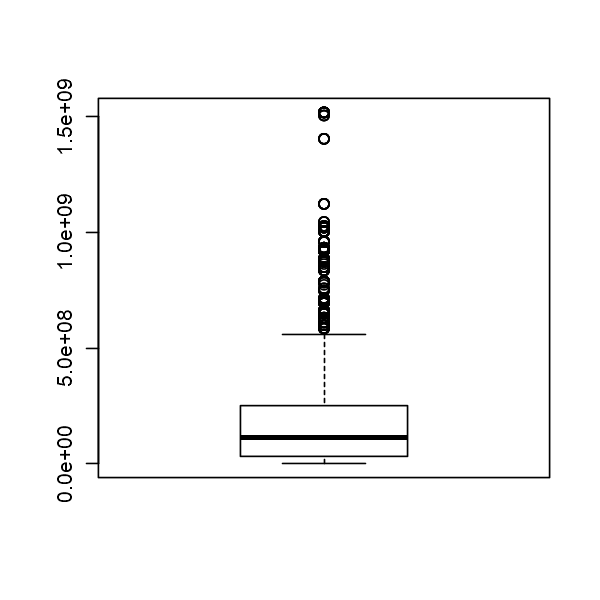

In [18]:
out_actor2_prev_revenue <- boxplot(movies_ff$actor2_prev_revenue) 

In [64]:
head(out_actor2_prev_revenue$out)
min(out_actor2_prev_revenue$out)
max(out_actor2_prev_revenue$out)
median(out_actor2_prev_revenue$out)
mean(out_actor2_prev_revenue$out)
length(out_actor2_prev_revenue$out)

[1] 1021103568  694713380 1004558444  961000000  709827462  926287400

[1] 585349010

[1] 1519557910

[1] 876688482

[1] 873059048

[1] 331

### director_movies_cnt Analysis

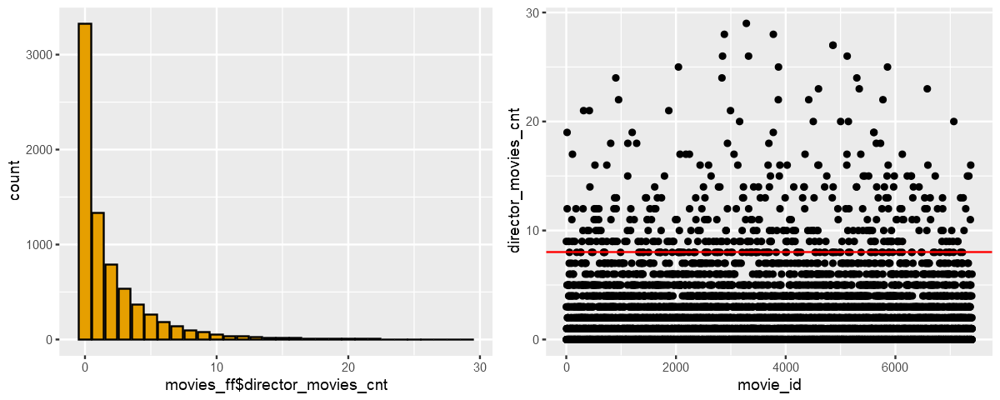

In [31]:
p1 <- ggplot(movies_ff, aes(movies_ff$director_movies_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=director_movies_cnt)) + geom_hline(yintercept = 8 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

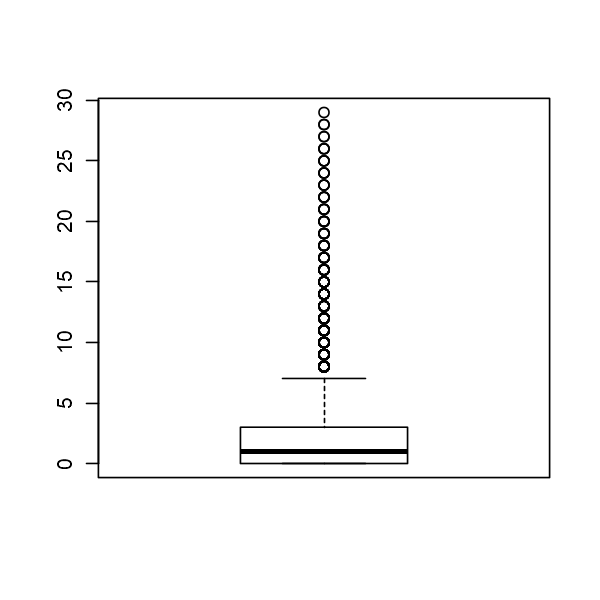

In [19]:
out_director_movies_cnt <- boxplot(movies_ff$director_movies_cnt) 

In [62]:
head(out_director_movies_cnt$out)
min(out_director_movies_cnt$out)
max(out_director_movies_cnt$out)
median(out_director_movies_cnt$out)
mean(out_director_movies_cnt$out)
length(out_director_movies_cnt$out)

[1]  9 19 12  9  8 11

[1] 8

[1] 29

[1] 10

[1] 11.6815

[1] 427

### director_movies_5y_cnt Analysis

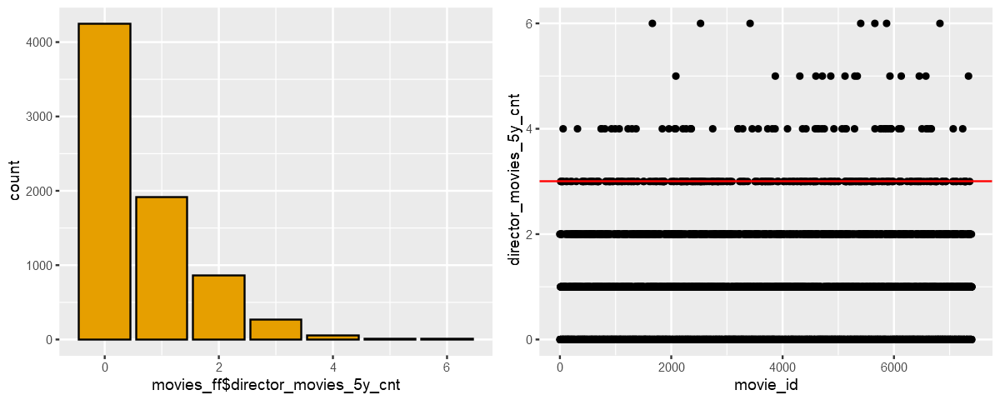

In [32]:
p1 <- ggplot(movies_ff, aes(movies_ff$director_movies_5y_cnt)) + geom_bar(color = "black", fill = "#E69F00")  + theme_get()
p2 <- ggplot(data=movies_ff) + geom_point(aes(x=movie_id, y=director_movies_5y_cnt)) + geom_hline(yintercept = 3 ,color="red")

options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

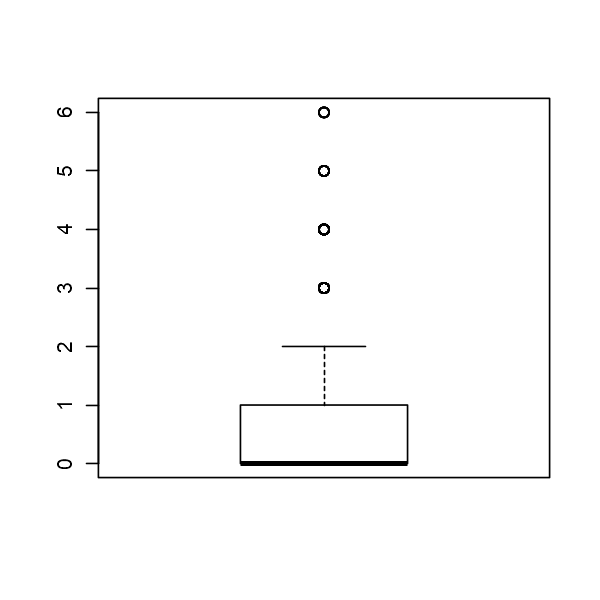

In [20]:
out_director_movies_5y_cnt <- boxplot(movies_ff$director_movies_5y_cnt) 

In [60]:
head(out_director_movies_5y_cnt$out)
min(out_director_movies_5y_cnt$out)
max(out_director_movies_5y_cnt$out)
median(out_director_movies_5y_cnt$out)
mean(out_director_movies_5y_cnt$out)
length(out_director_movies_5y_cnt$out)

[1] 3 3 3 3 3 4

[1] 3

[1] 6

[1] 3

[1] 3.314286

[1] 350

### Ganres

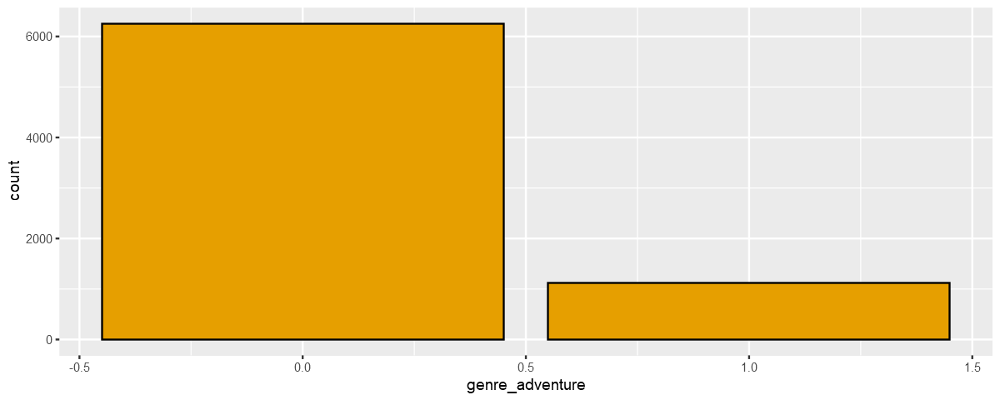

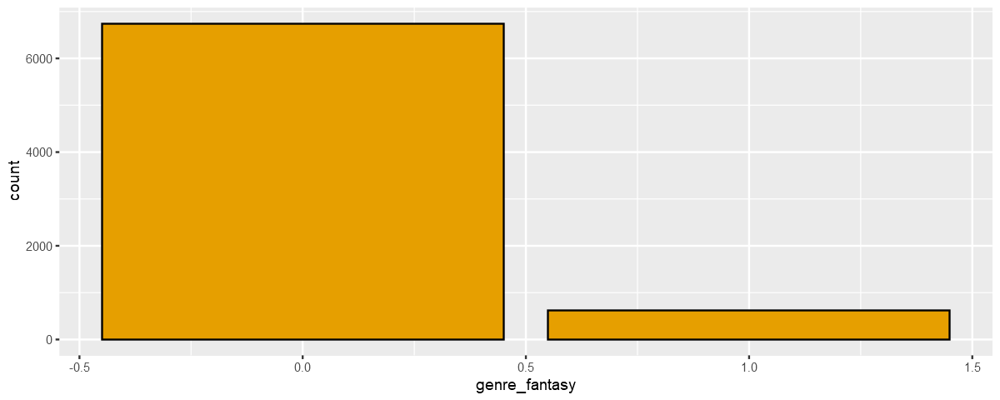

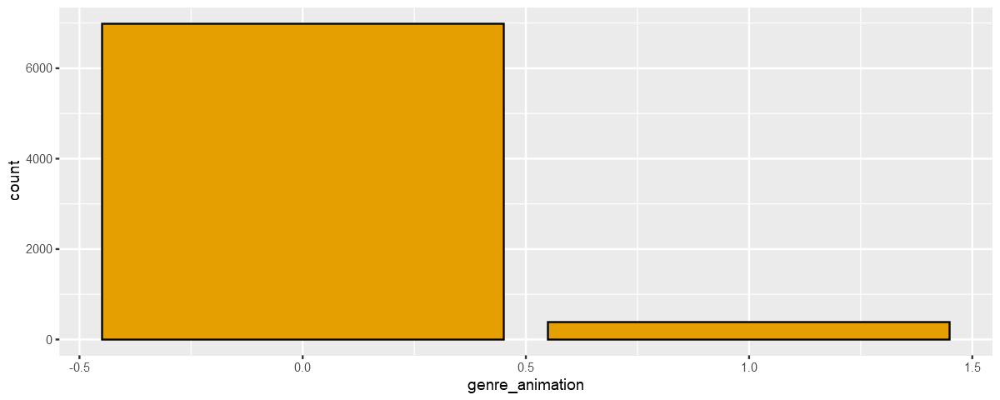

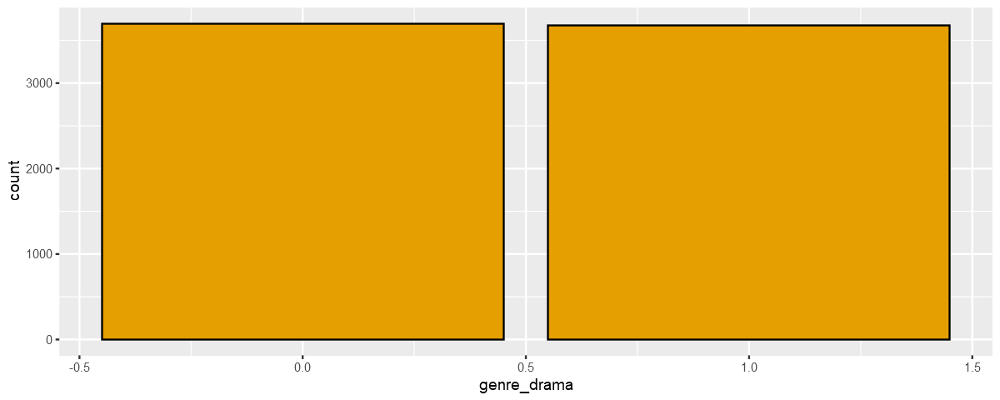

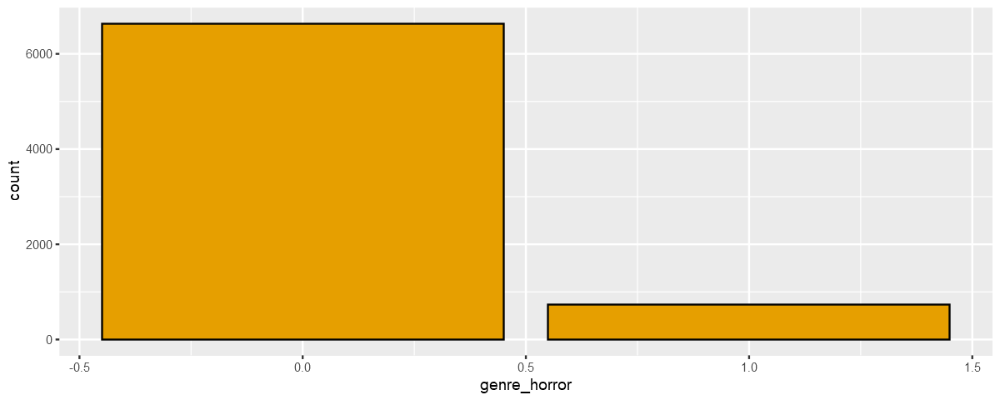

...

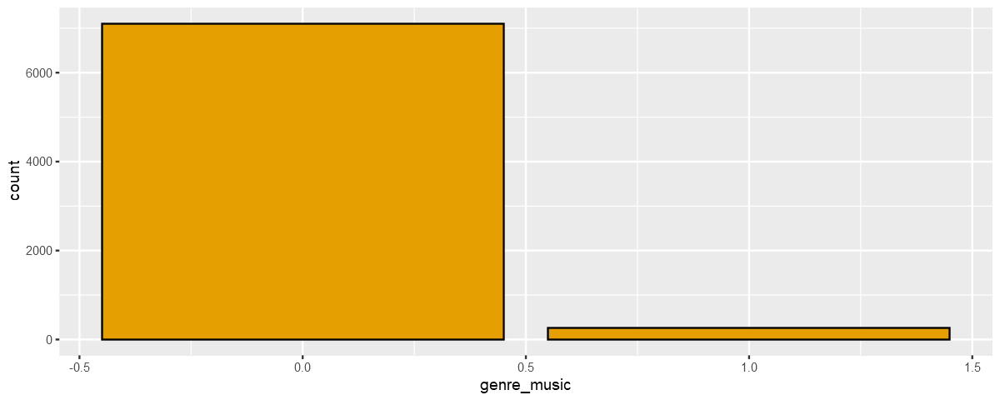

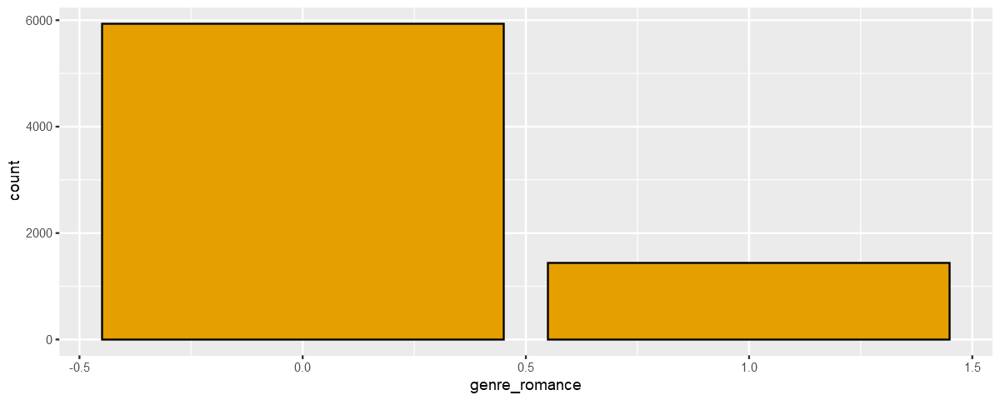

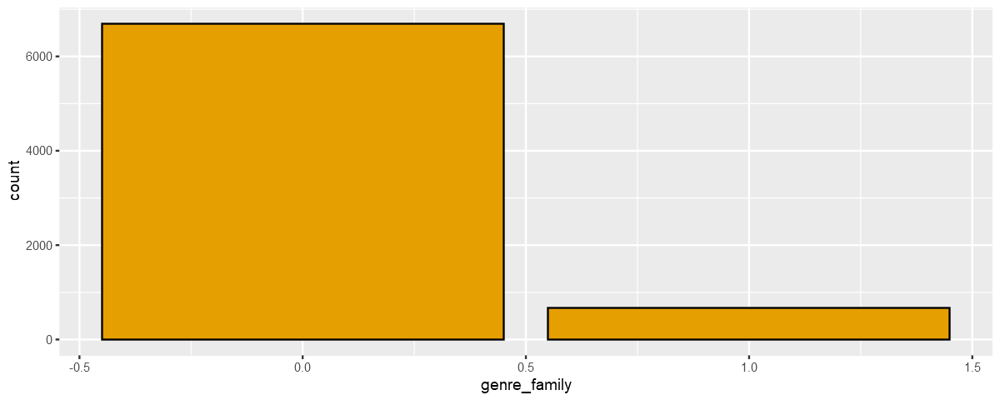

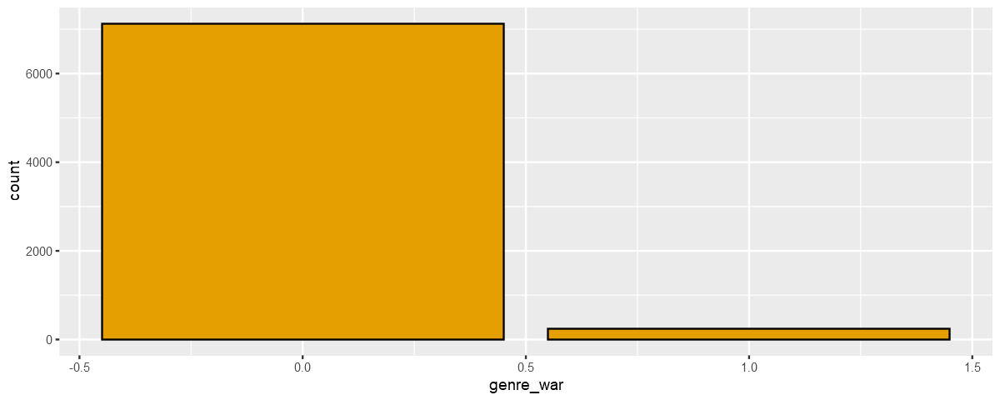

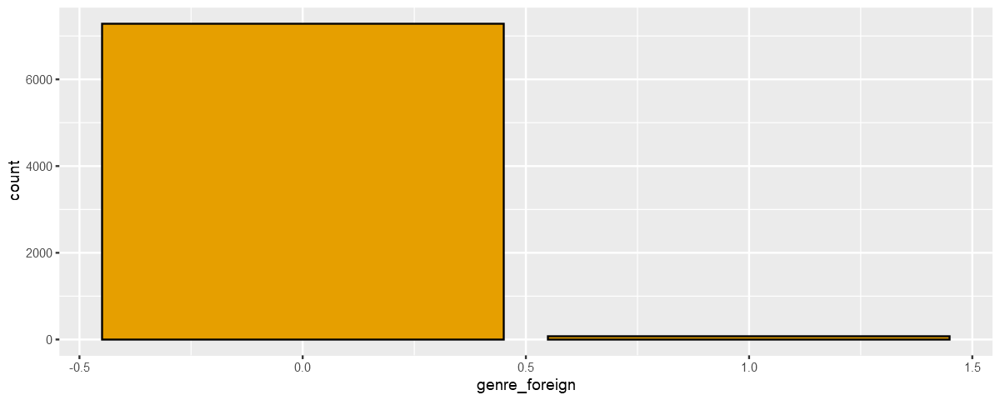

In [33]:
par(mfrow=c(2,2))

nm <- names(movies_ff[,1:84])

for (i in 44:62) {
    x <- movies_ff[,i]
    print( ggplot(movies_ff, aes(x)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    xlab(nm[i]) +
    theme_get())
    }

### Departments Analysis

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."
Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


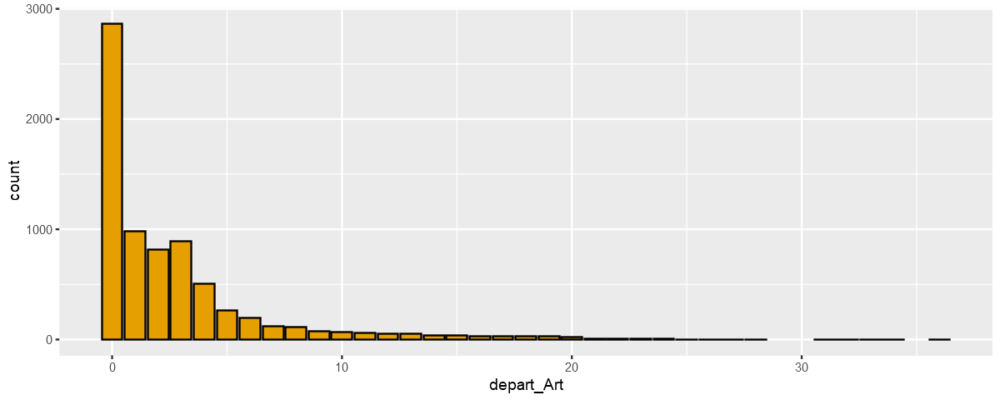

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


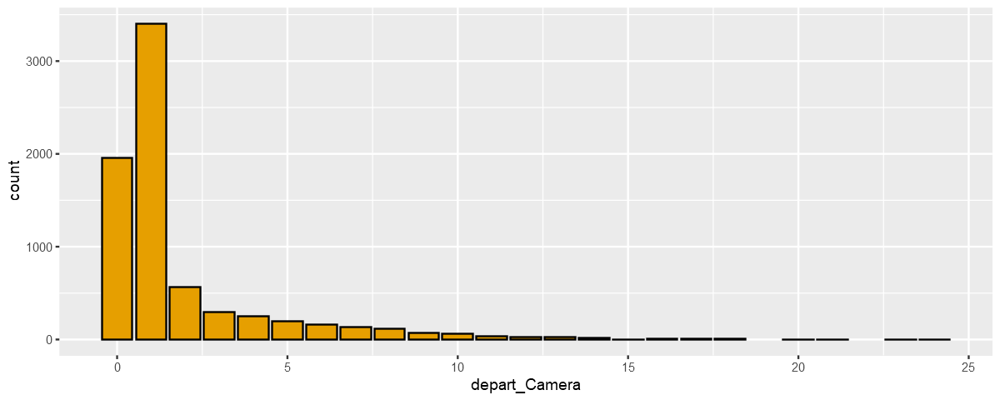

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


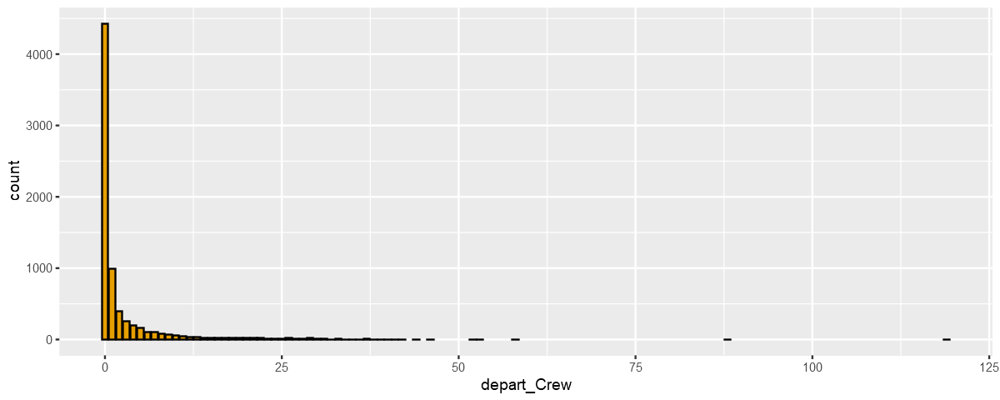

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


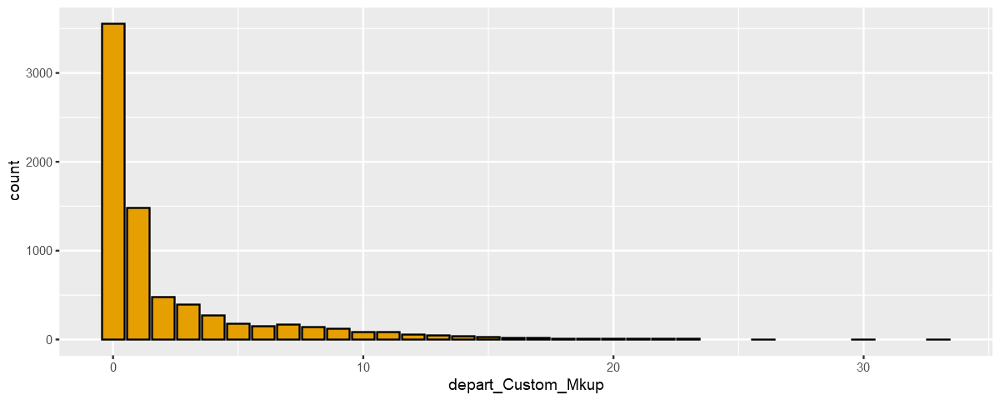

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


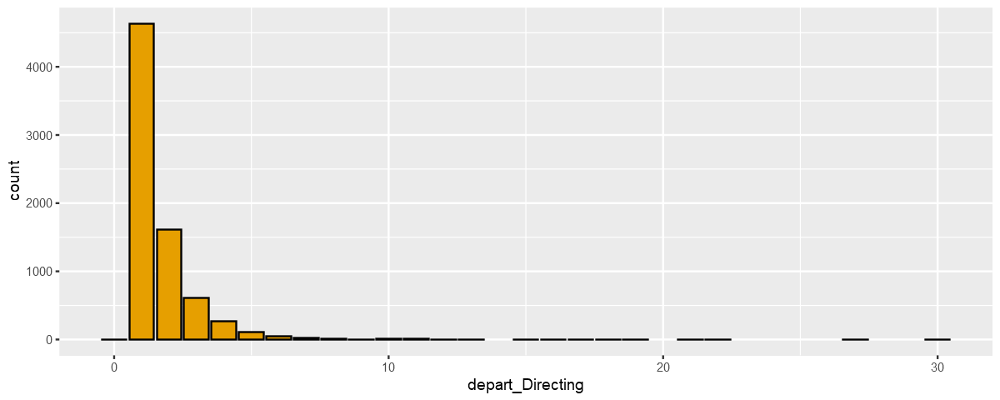

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


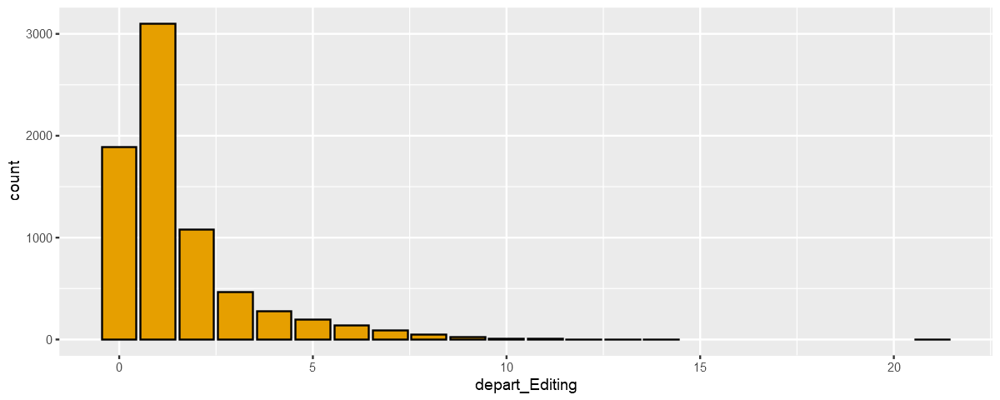

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


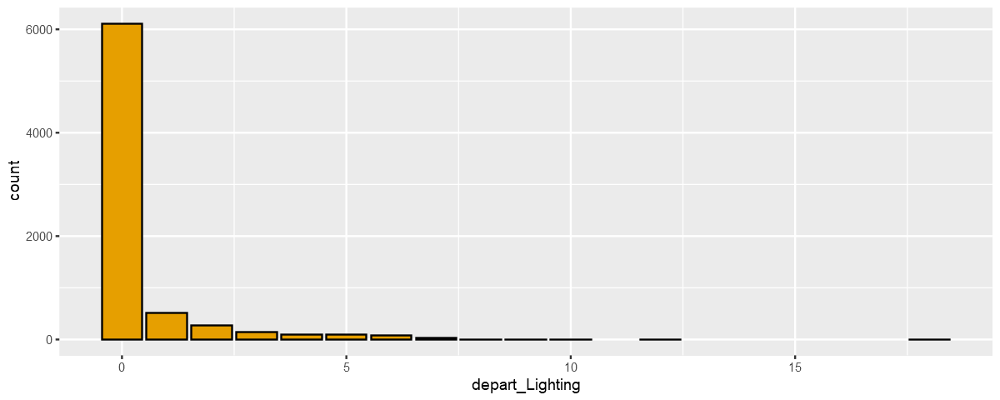

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


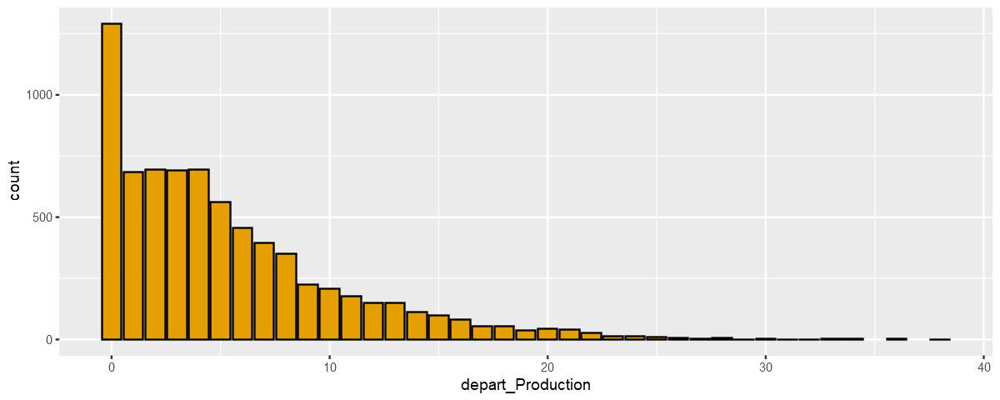

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


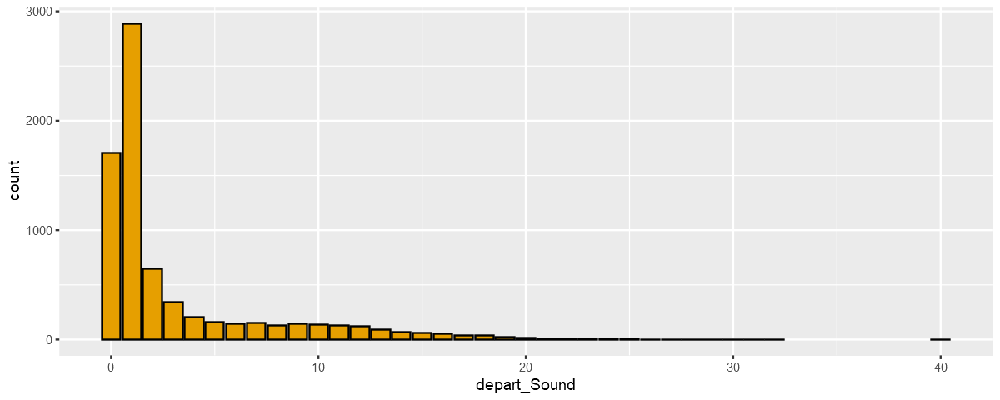

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


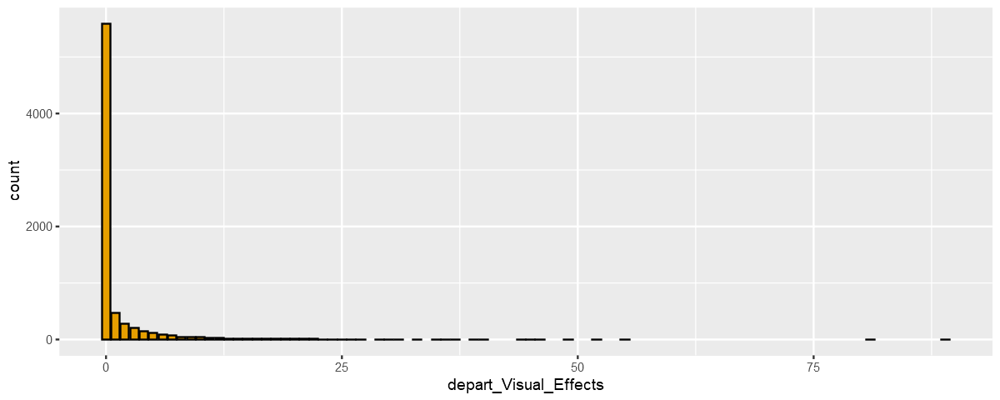

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


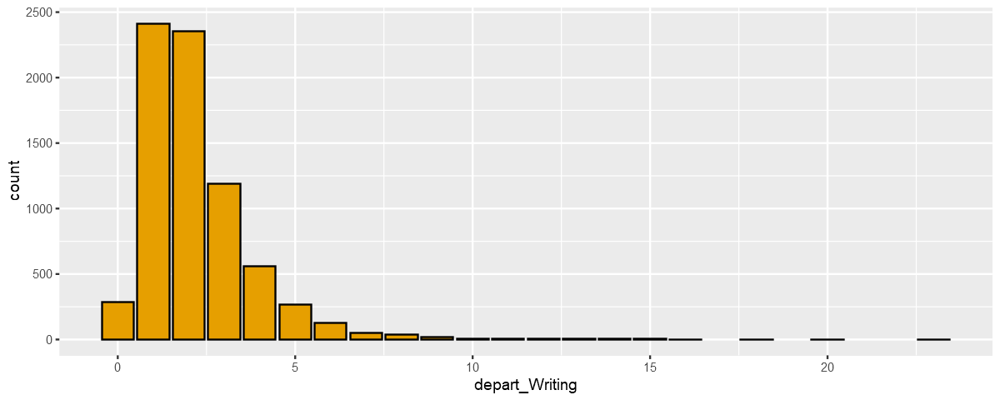

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


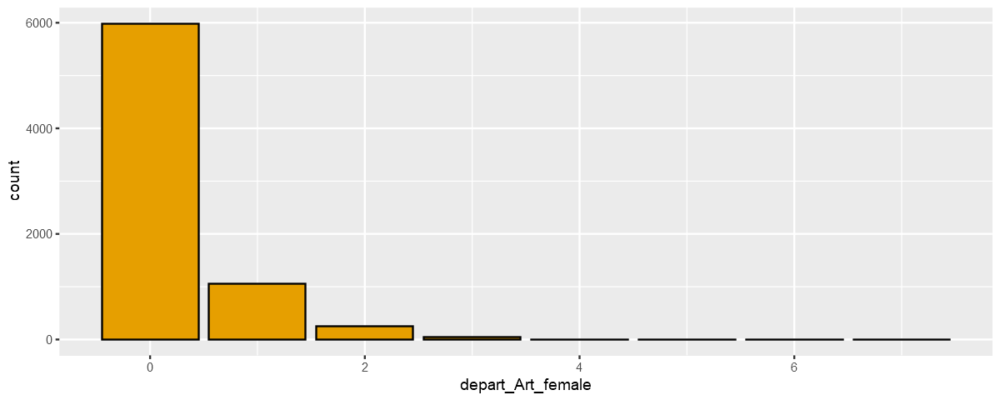

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


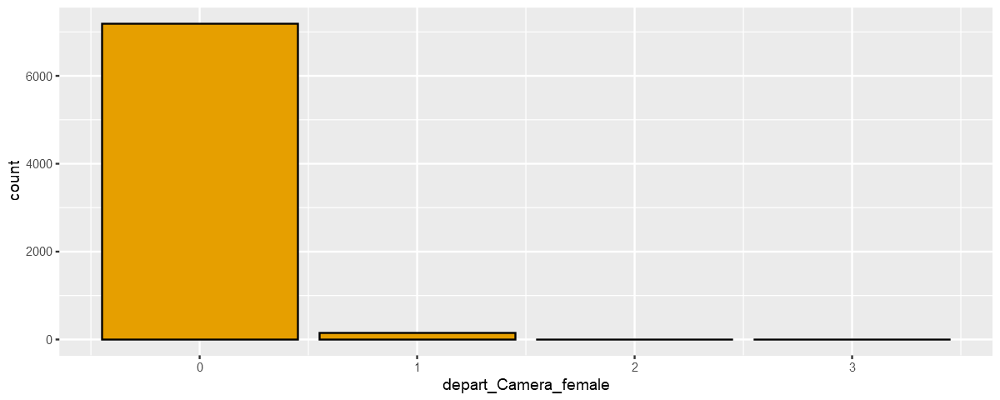

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


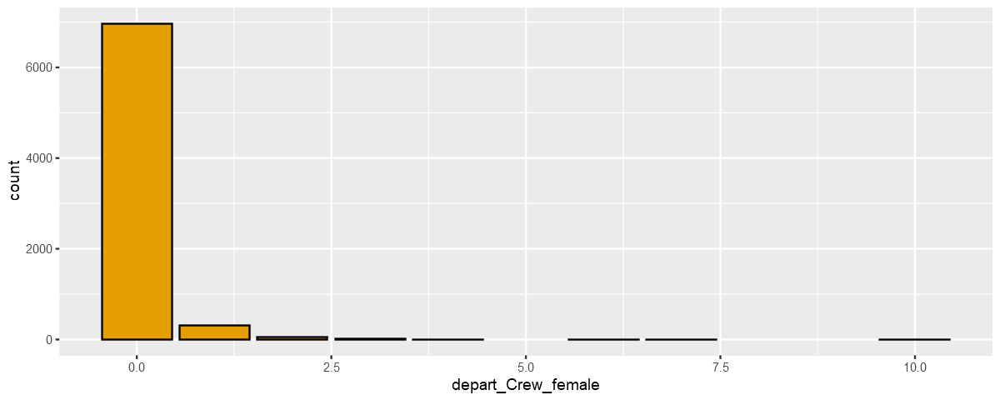

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


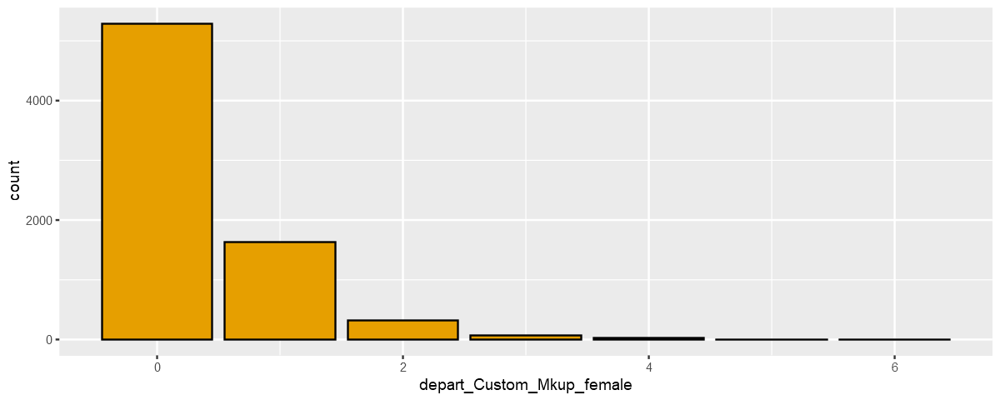

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


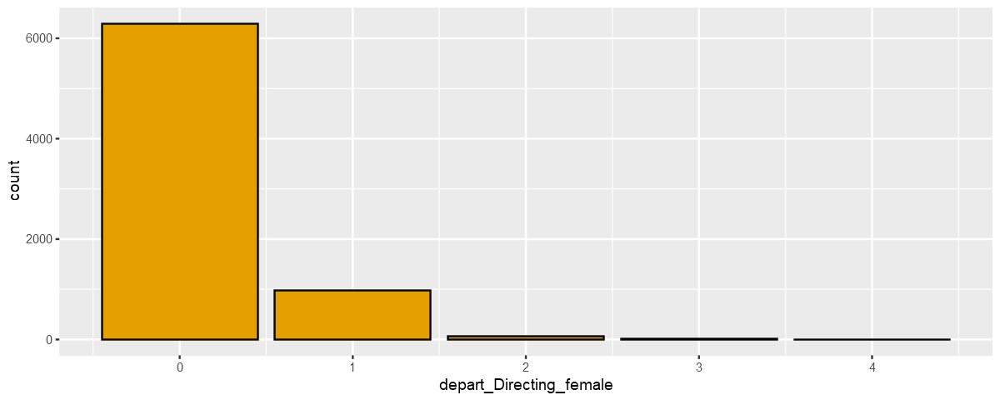

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


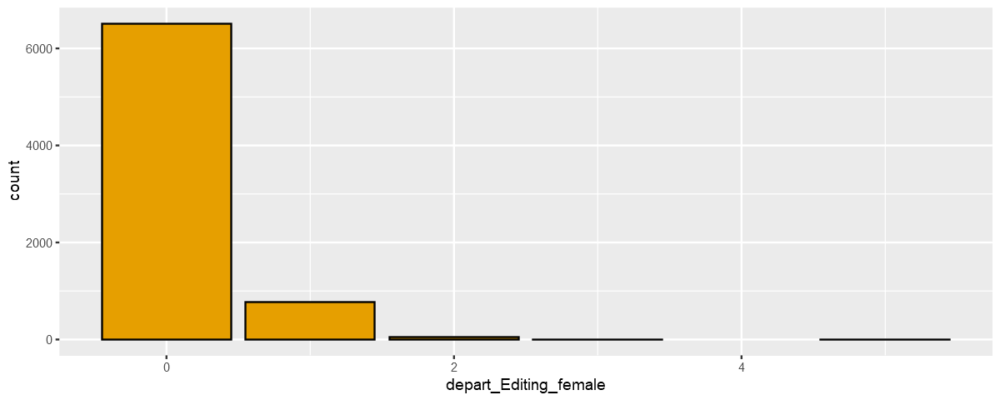

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


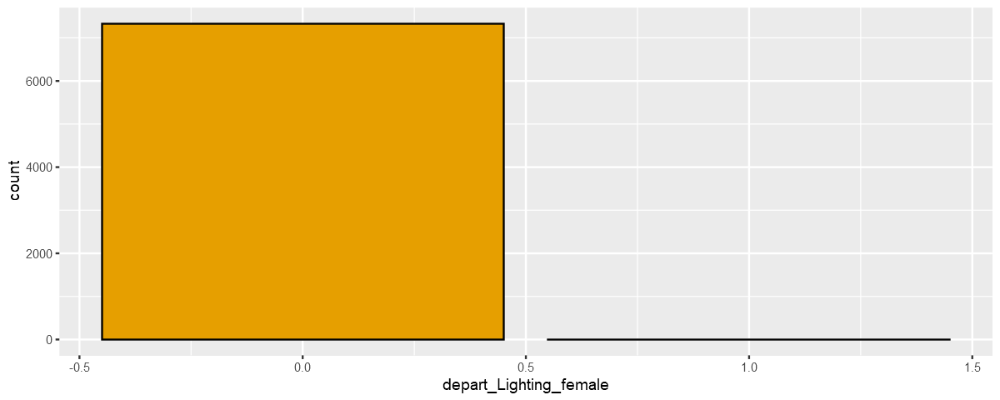

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


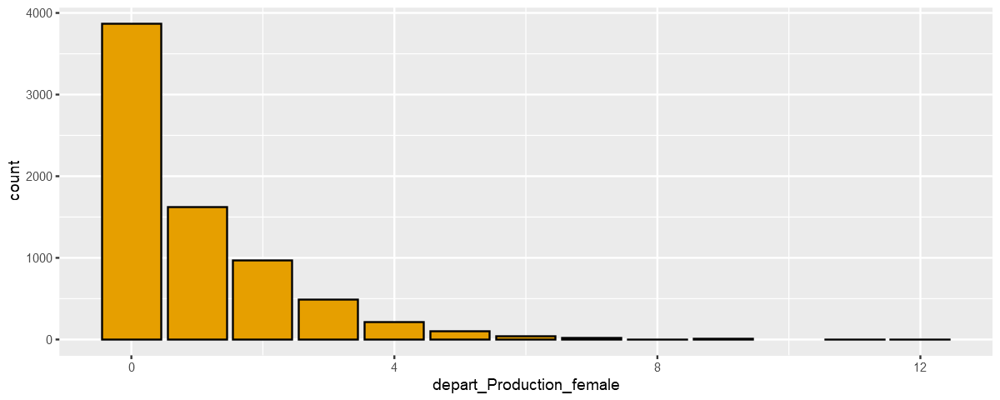

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


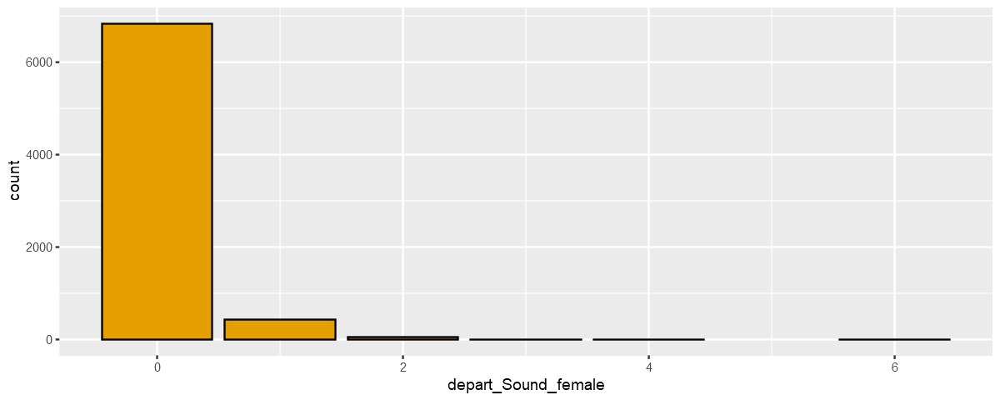

Warning message:
"Removed 34 rows containing non-finite values (stat_count)."


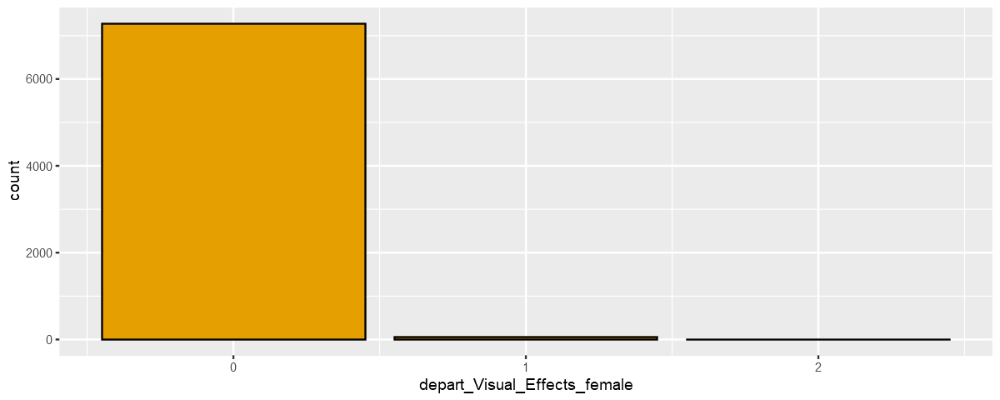

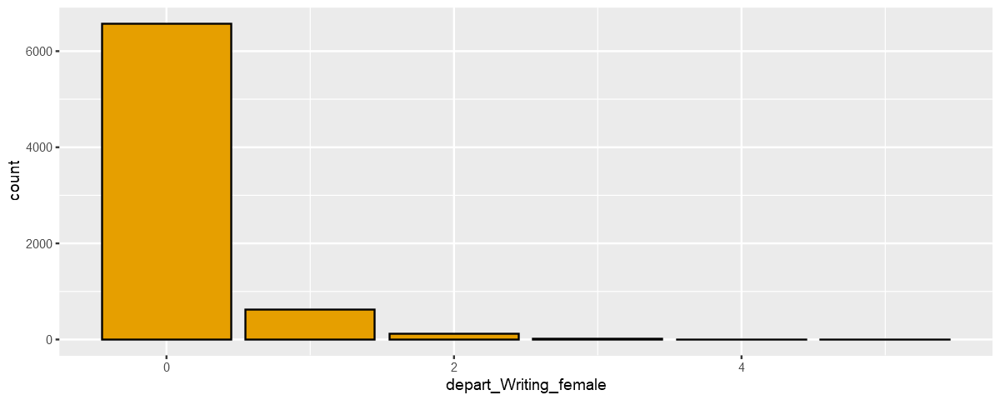

In [34]:
par(mfrow=c(2,2))

nm <- names(movies_ff[,1:84])

for (i in 63:84) {
    x <- movies_ff[,i]
    print( ggplot(movies_ff, aes(x)) + 
    geom_bar(color = "black", fill = "#E69F00")  +
    xlab(nm[i]) +
    theme_get())

}

Warning message:
"Removed 34 rows containing missing values (geom_point)."
Warning message:
"Removed 34 rows containing missing values (geom_point)."


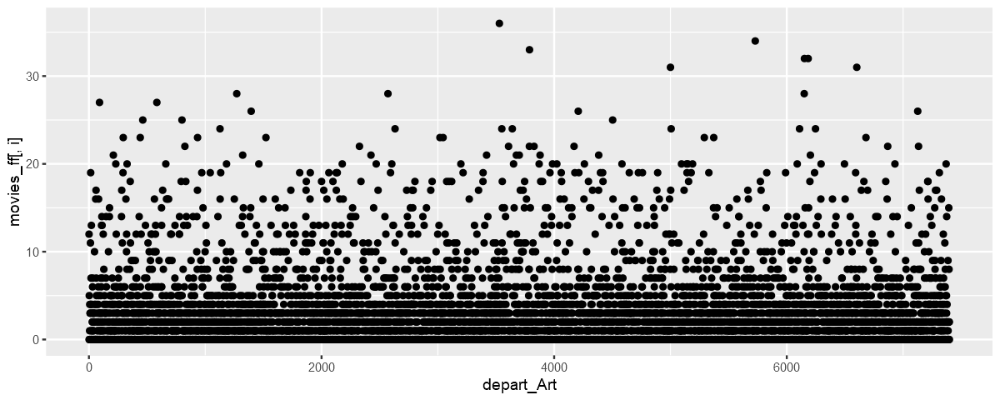

Warning message:
"Removed 34 rows containing missing values (geom_point)."


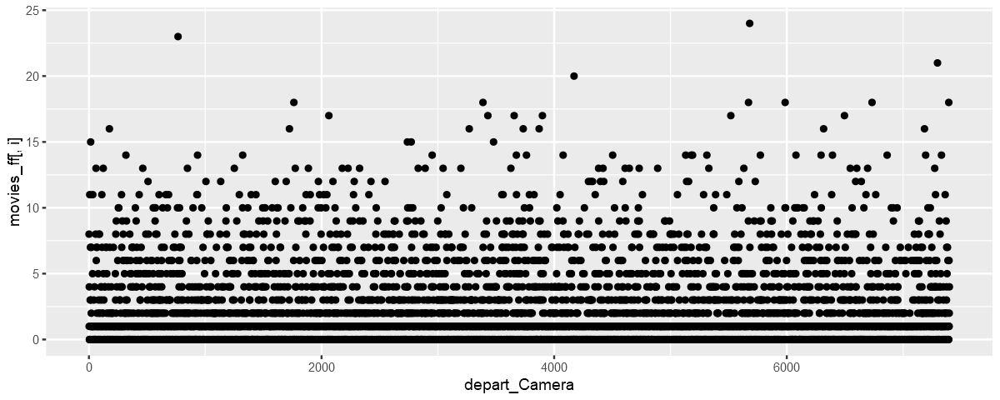

Warning message:
"Removed 34 rows containing missing values (geom_point)."


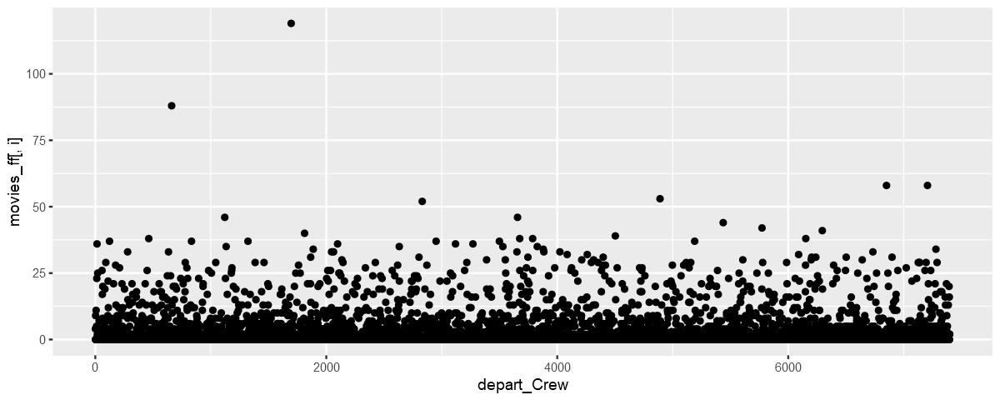

Warning message:
"Removed 34 rows containing missing values (geom_point)."


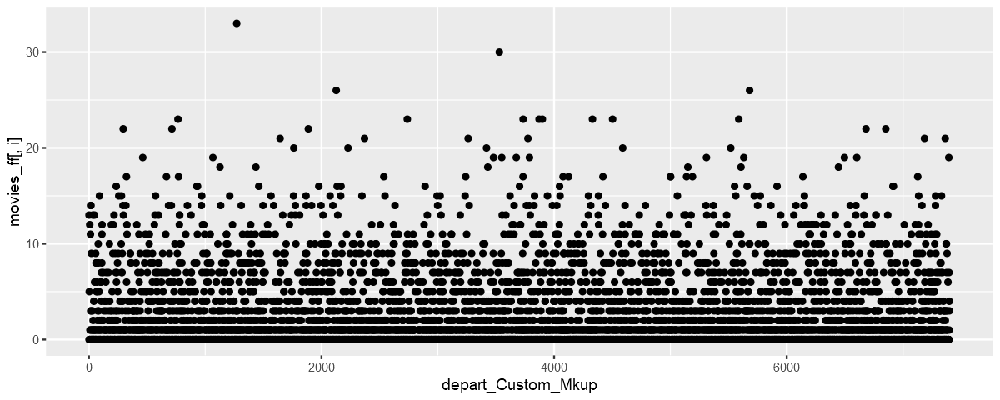

Warning message:
"Removed 34 rows containing missing values (geom_point)."


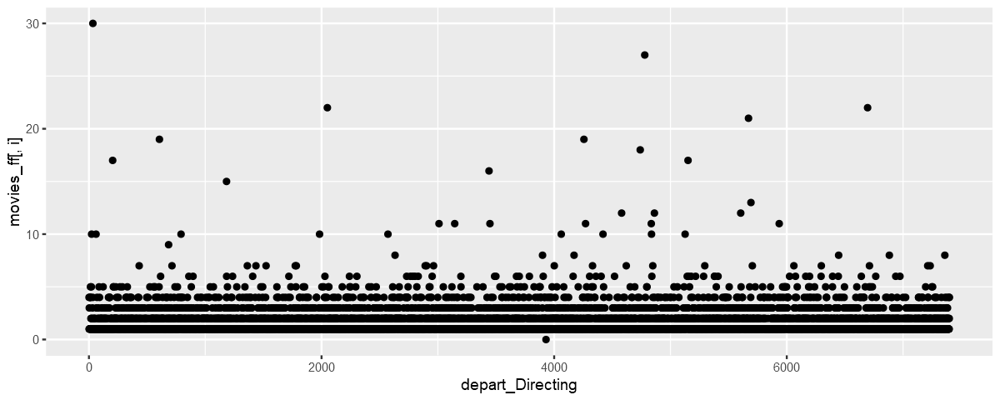

Warning message:
"Removed 34 rows containing missing values (geom_point)."


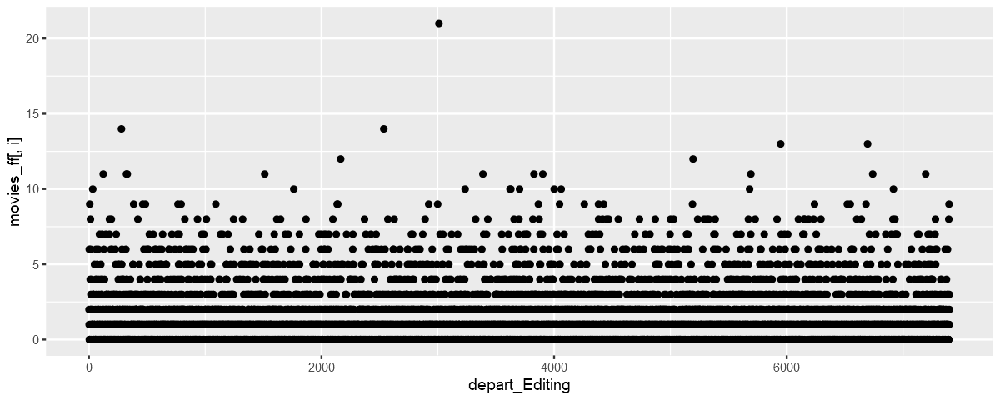

Warning message:
"Removed 34 rows containing missing values (geom_point)."


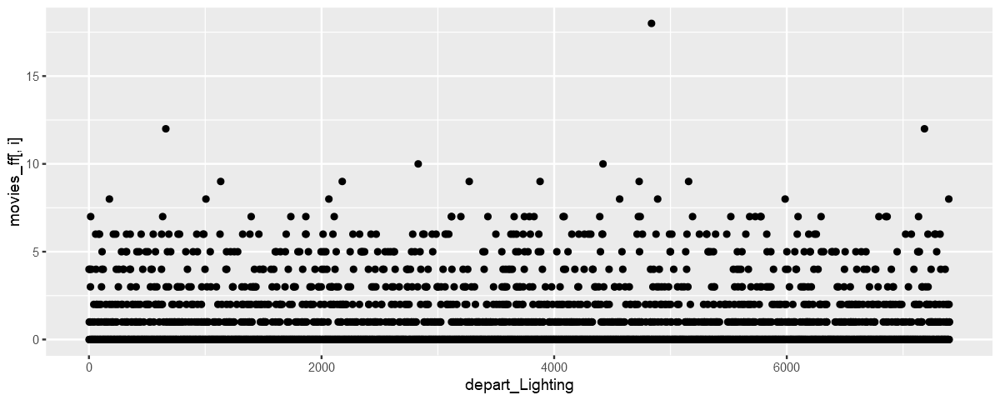

Warning message:
"Removed 34 rows containing missing values (geom_point)."


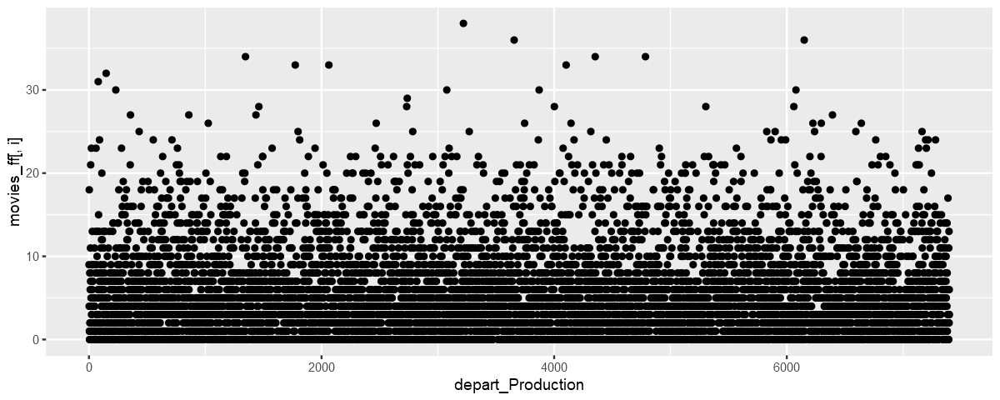

Warning message:
"Removed 34 rows containing missing values (geom_point)."


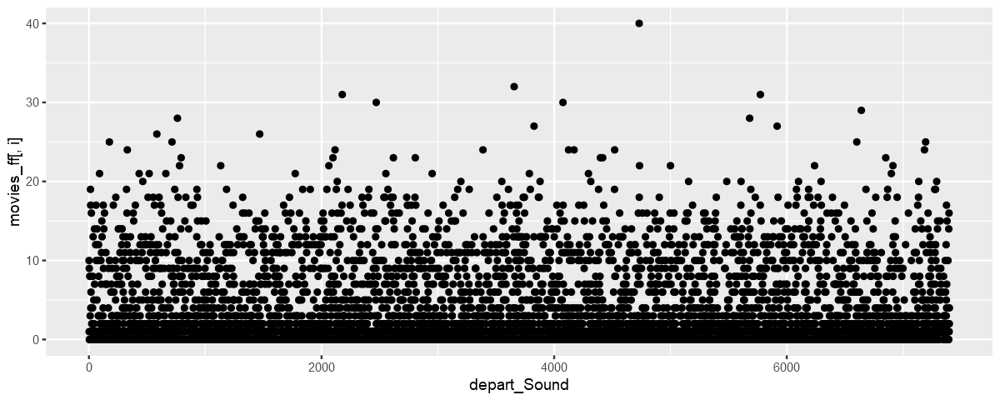

Warning message:
"Removed 34 rows containing missing values (geom_point)."


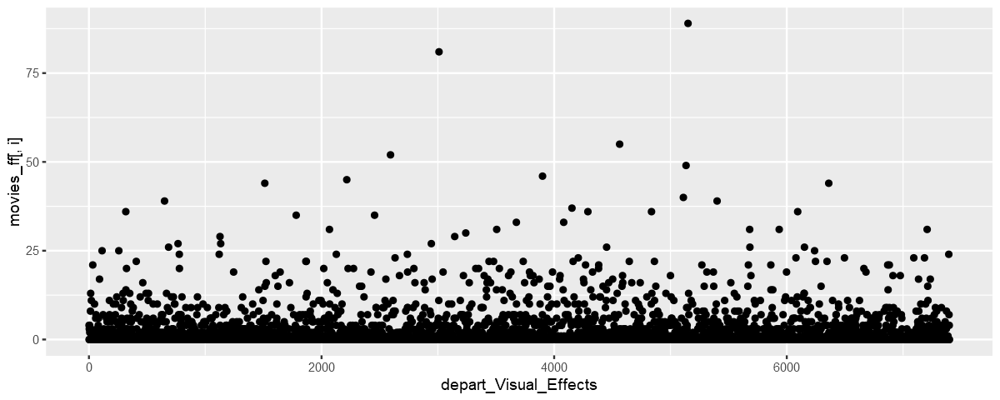

Warning message:
"Removed 34 rows containing missing values (geom_point)."


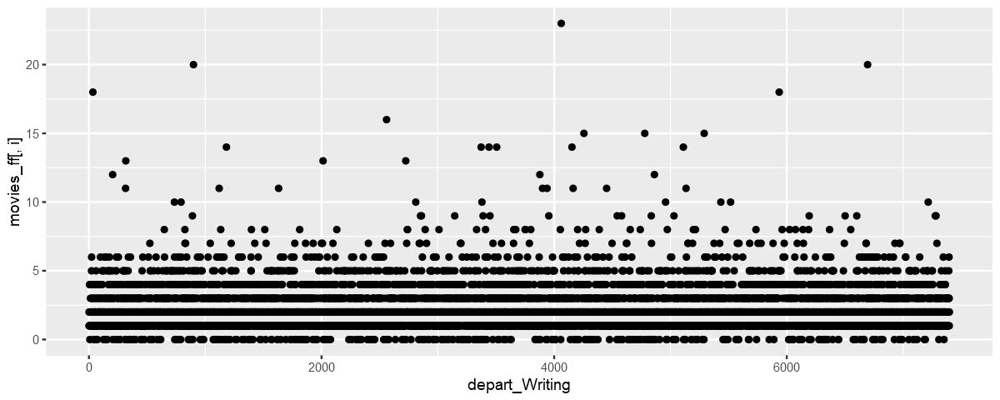

Warning message:
"Removed 34 rows containing missing values (geom_point)."


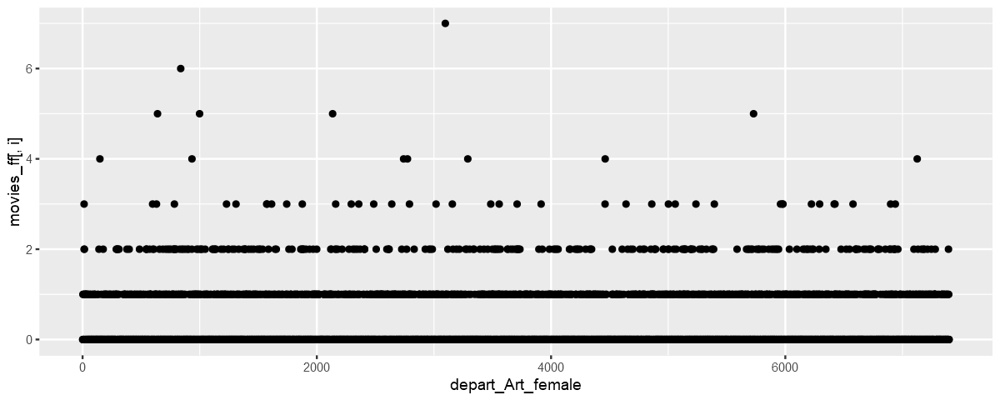

Warning message:
"Removed 34 rows containing missing values (geom_point)."


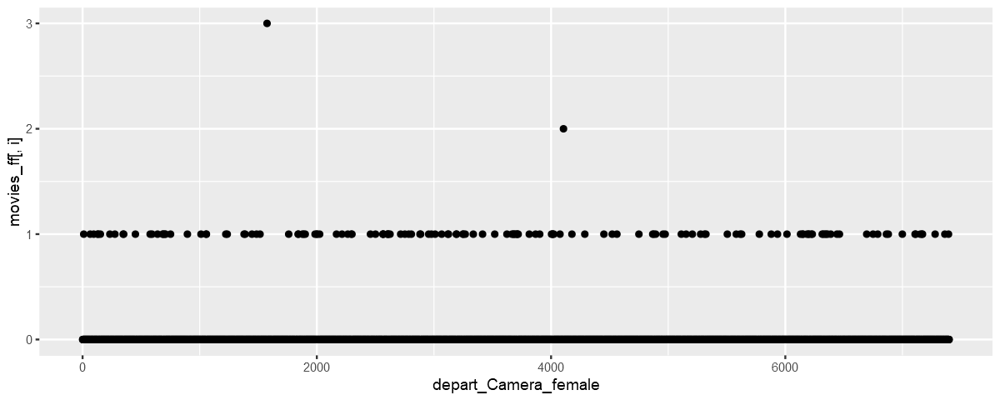

Warning message:
"Removed 34 rows containing missing values (geom_point)."


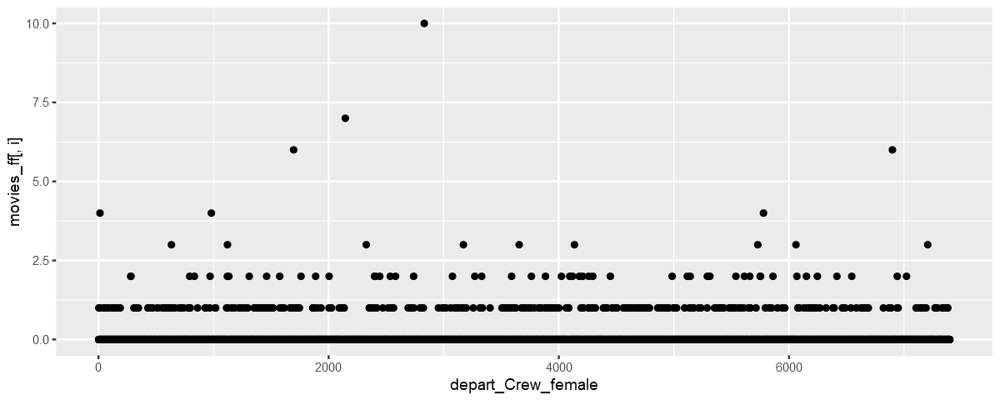

Warning message:
"Removed 34 rows containing missing values (geom_point)."


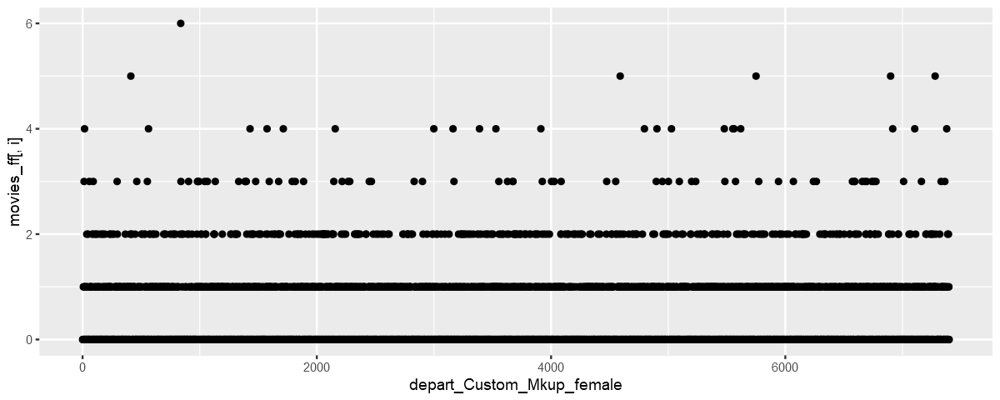

Warning message:
"Removed 34 rows containing missing values (geom_point)."


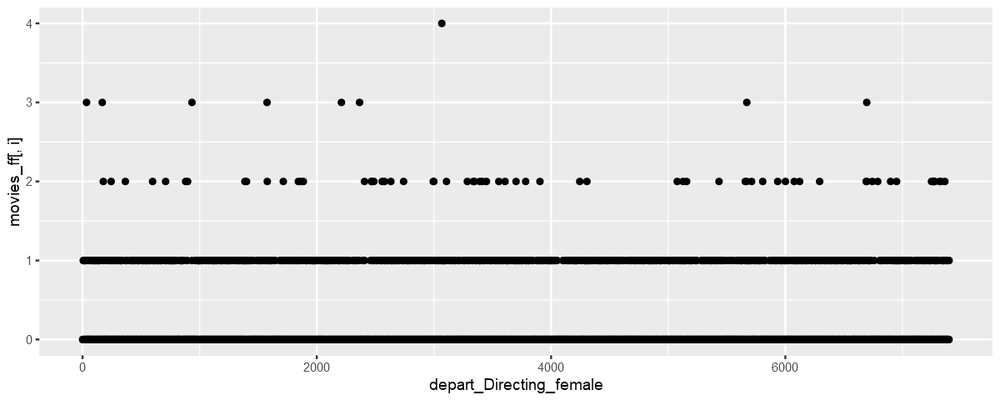

Warning message:
"Removed 34 rows containing missing values (geom_point)."


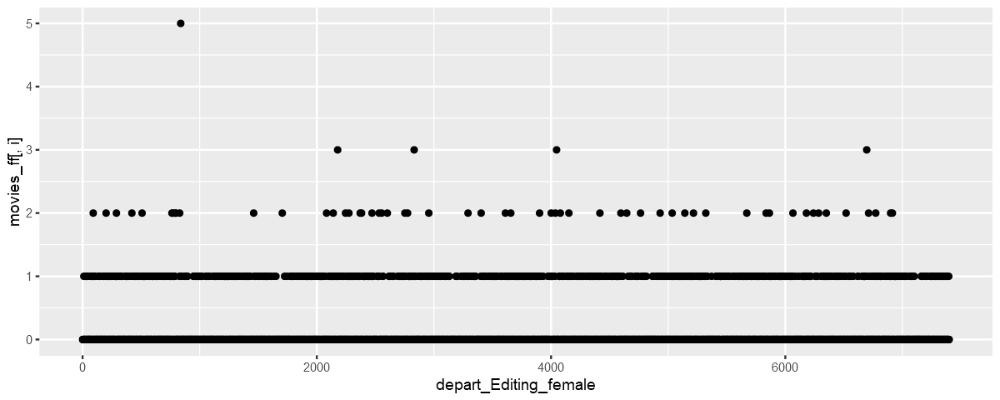

Warning message:
"Removed 34 rows containing missing values (geom_point)."


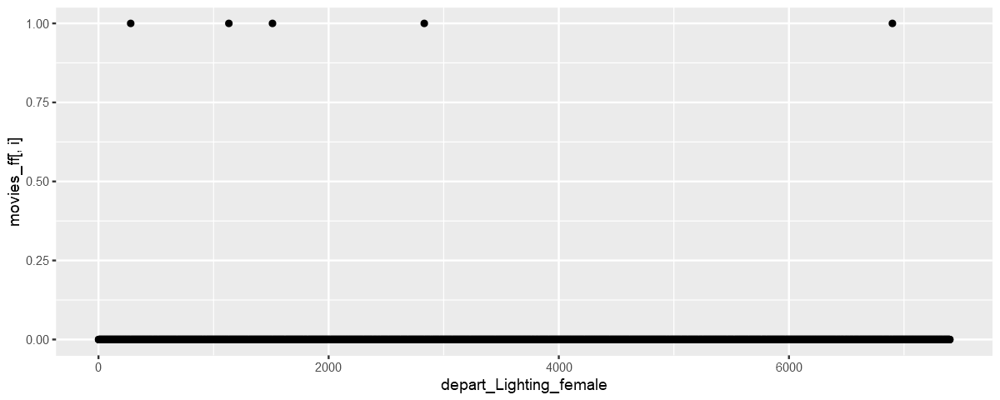

Warning message:
"Removed 34 rows containing missing values (geom_point)."


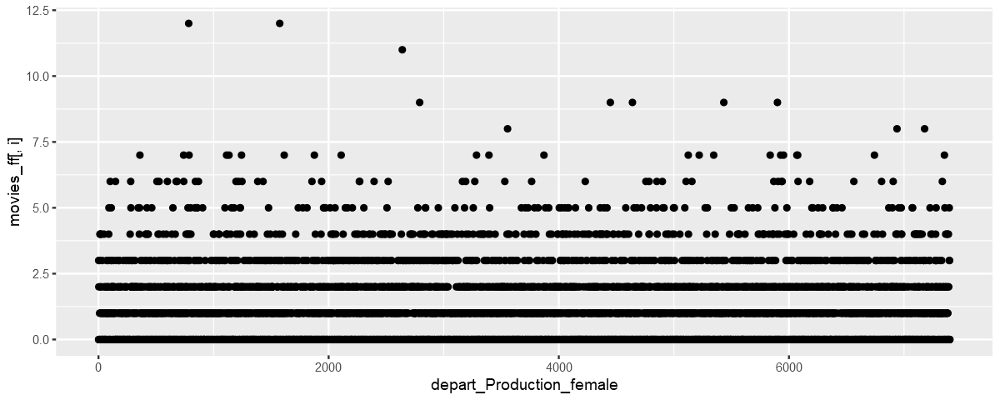

Warning message:
"Removed 34 rows containing missing values (geom_point)."


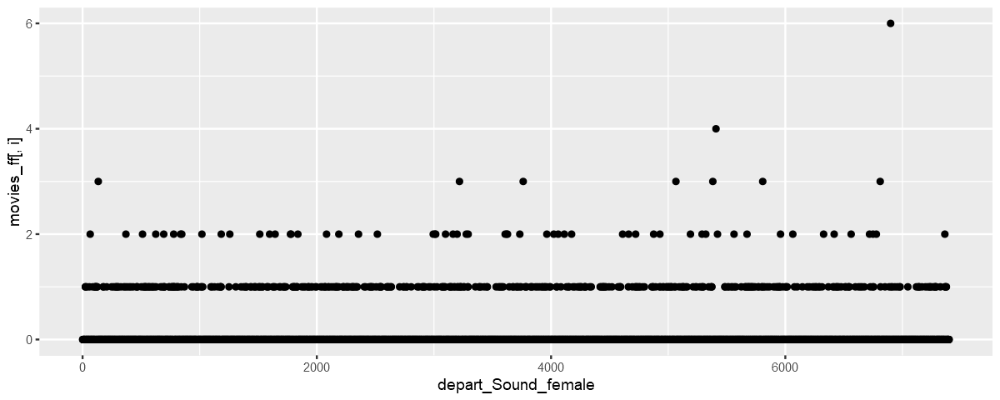

Warning message:
"Removed 34 rows containing missing values (geom_point)."


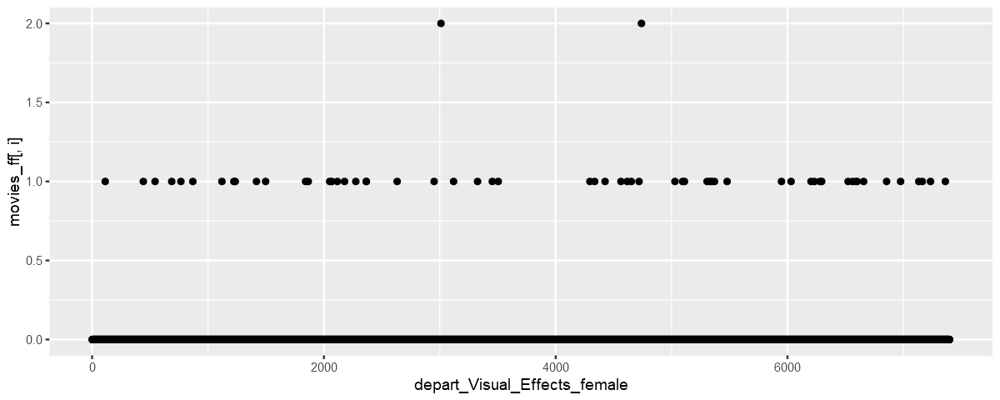

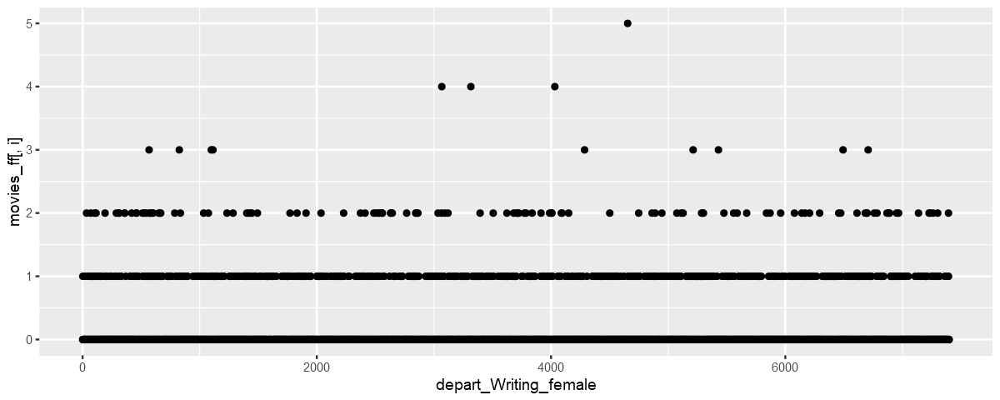

In [35]:
par(mfrow=c(2,2))

for (i in 63:84) {
    print(ggplot(data=movies_ff) +
          geom_point(aes(x=movie_id, y=movies_ff[,i])) +
          xlab(nm[i]))
} 


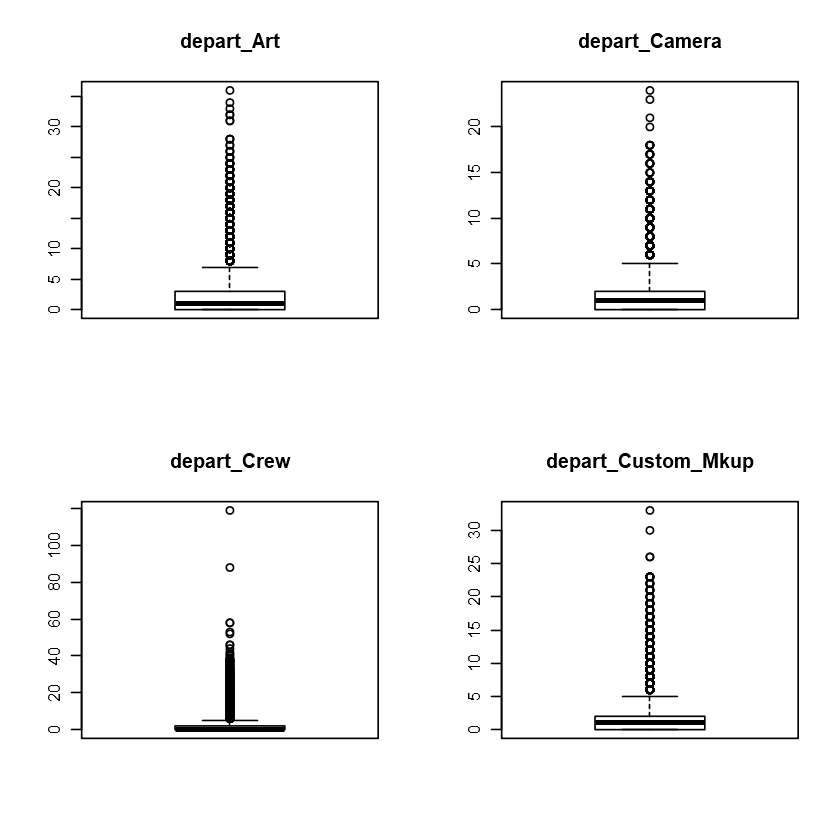

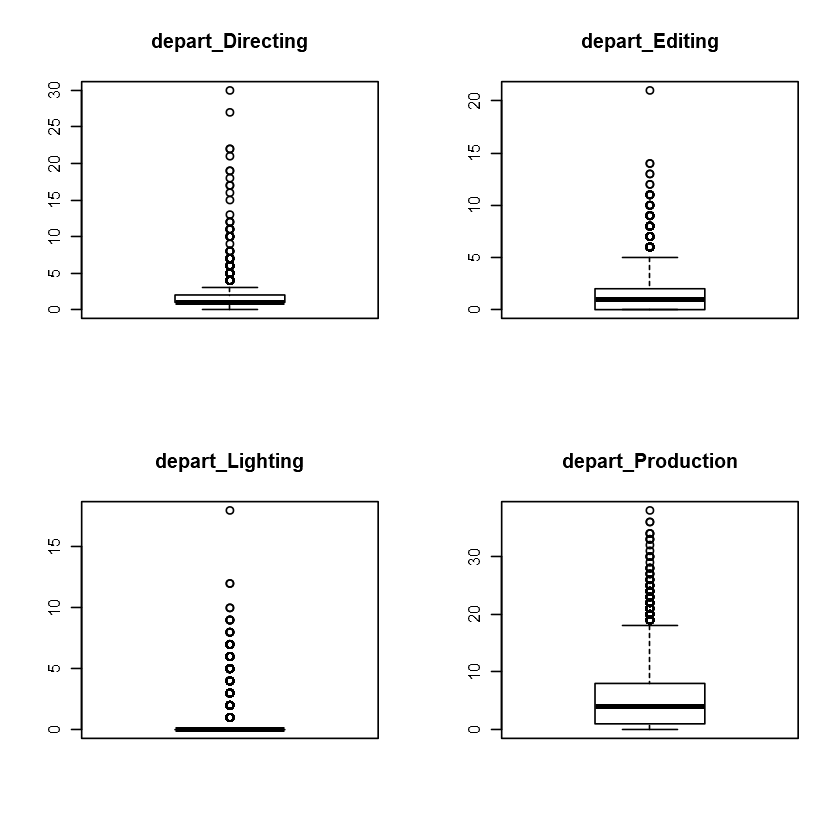

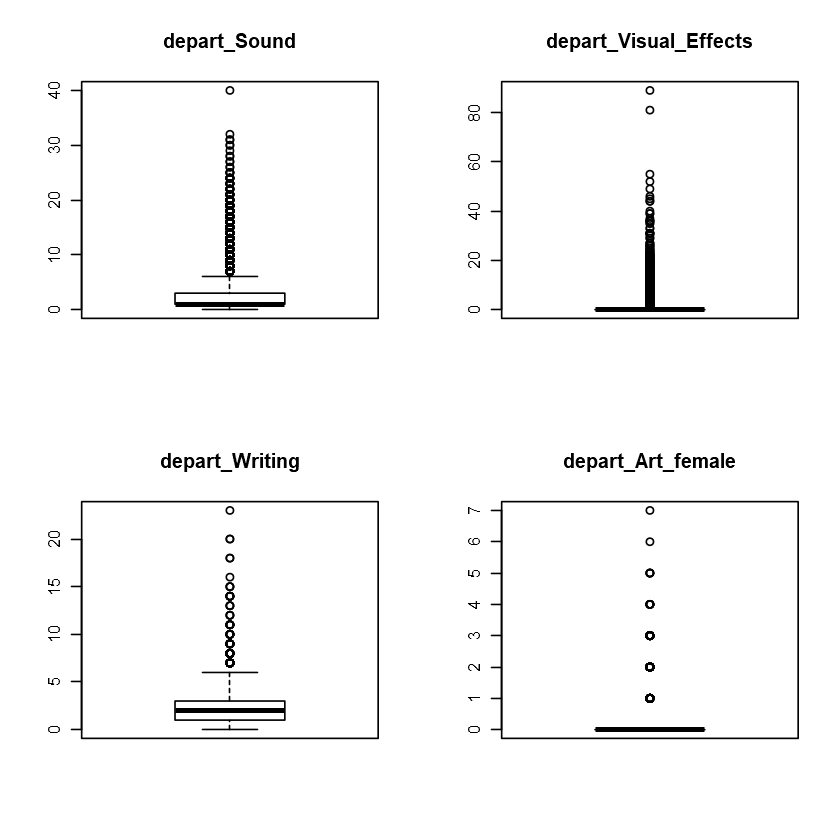

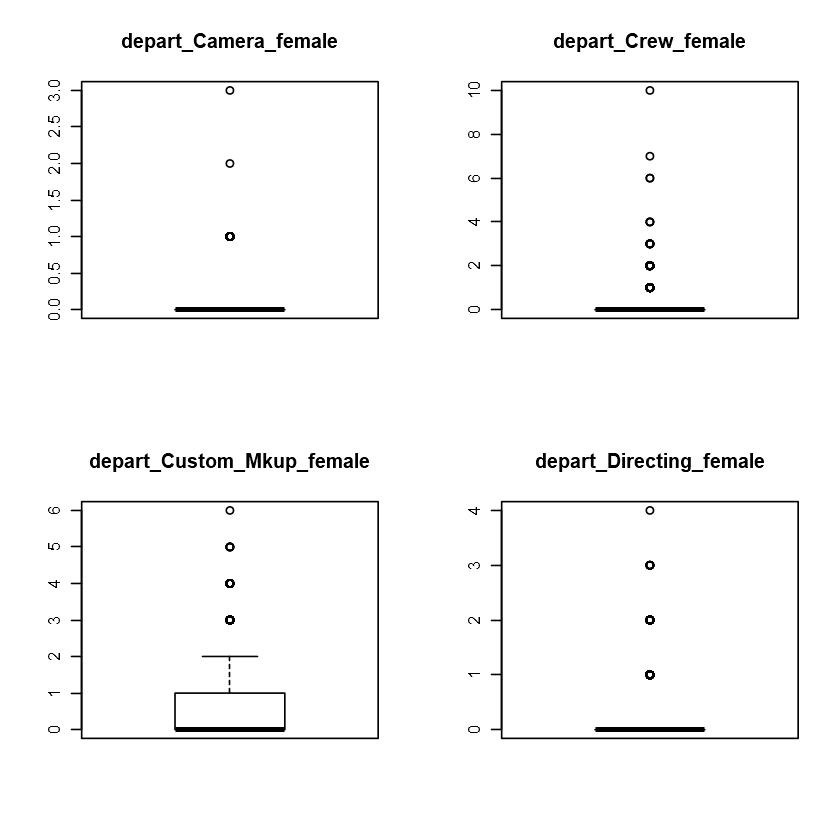

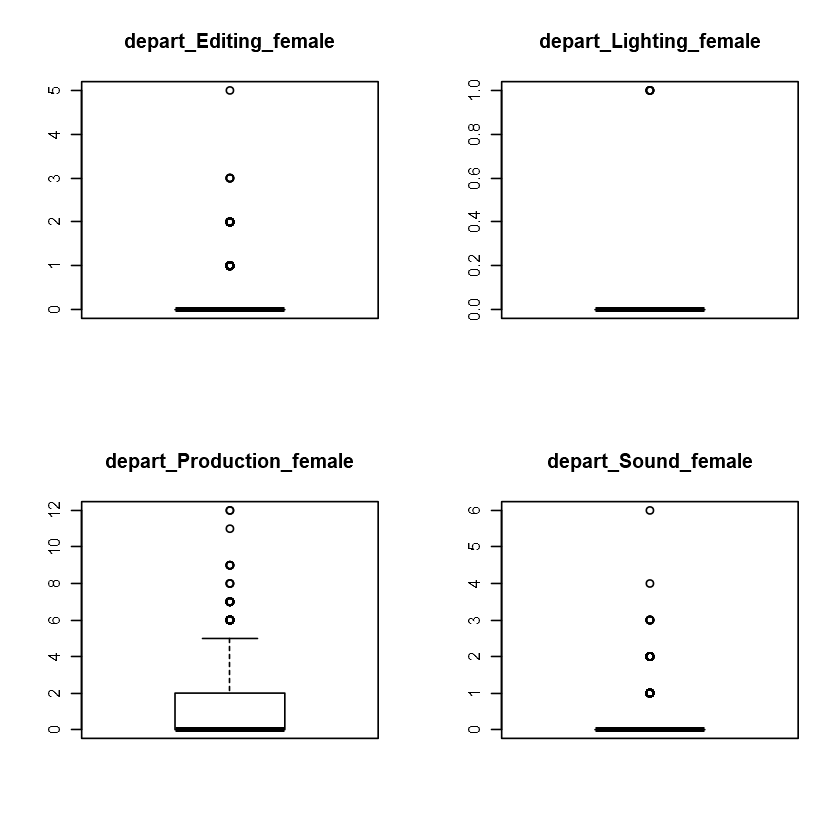

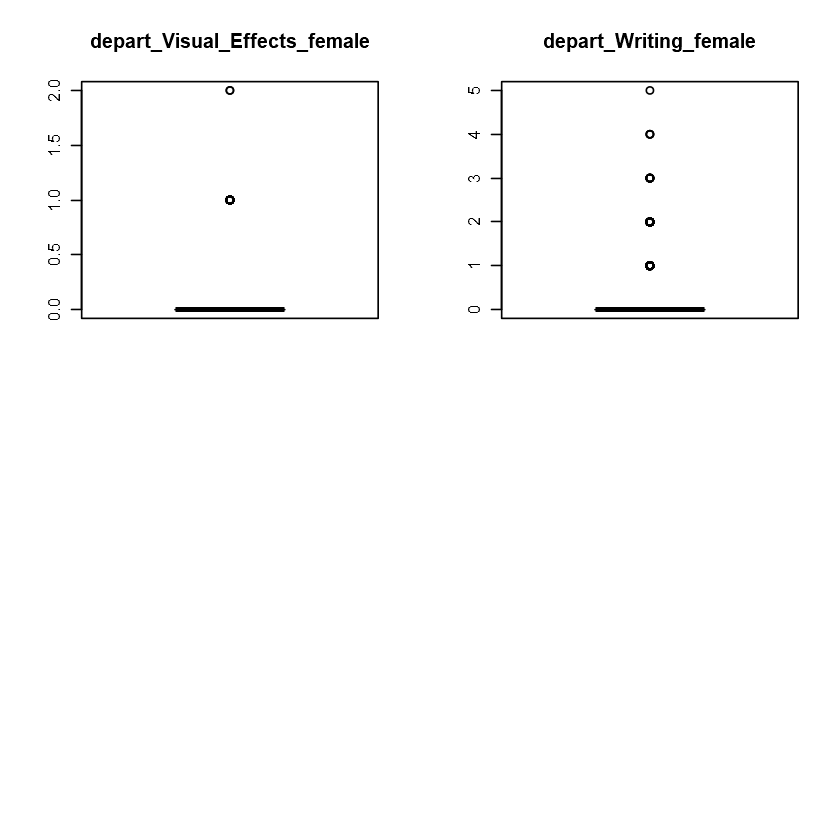

In [17]:
par(mfrow=c(2,2))

for (i in 63:84) {
   boxplot(movies_ff[,i], main = nm[i]) 
} 

##  2.3 Correlation matrix

In [46]:
if(!require(corrplot)) {install.packages("corrplot");require(corrplot)}
if (!require("RColorBrewer")) install.packages("RColorBrewer")

Loading required package: RColorBrewer



In [48]:
res <- NULL

for(i in movies_continuous) {
    rw <- NULL
    for(j in movies_continuous) {
        rw <- cbind(rw,cor.test(x=movies_ff[[i]],y=movies_ff[[j]],method="spearman")$estimate)
    }
    res <- rbind(res,rw)
}
row.names(res) <- movies_continuous
colnames(res) <- movies_continuous
res

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(x = movies_ff[[i]], y = movies_ff[[j]], method = "spearman"):
"Cannot compute exact p-value with ties"
Warning message in cor.test

,runtime,budget,popularity,revenue,release_year,release_month,release_day,seasonality,sw_collection,producers_cnt,...,depart_Art_female,depart_Camera_female,depart_Crew_female,depart_Custom_Mkup_female,depart_Directing_female,depart_Editing_female,depart_Production_female,depart_Sound_female,depart_Visual_Effects_female,depart_Writing_female
runtime,1.000000000,0.25050252,0.17136367,0.26191060,0.004360218,0.1262076528,0.0279912142,0.0960086447,0.046622733,0.097767205,...,0.111873075,0.001225895,0.0704246646,0.169646772,0.0698589725,0.048497778,0.126761948,0.0774874705,0.005255800,0.026717987
budget,0.250502521,1.00000000,0.51763922,0.69100785,0.157141175,0.0602131869,0.0342037539,0.1345926151,0.081935008,0.273677529,...,0.240030511,0.036589693,0.1755994840,0.315041130,0.1396022783,0.086162991,0.396343510,0.1305320003,0.082564782,0.049253239
popularity,0.171363671,0.51763922,1.00000000,0.59453873,0.135965923,0.0539458645,0.0482334529,0.1043664721,0.087653111,0.285426693,...,0.221043305,0.065173132,0.1774724840,0.294492671,0.1262728299,0.102167066,0.395866981,0.1382170269,0.076447923,0.060167155
revenue,0.261910598,0.69100785,0.59453873,1.00000000,0.017917598,0.0364920303,0.0606503918,0.1990130962,0.094416265,0.196467841,...,0.239779128,0.032005853,0.1628297145,0.317688650,0.1261972942,0.058297473,0.387482082,0.1411739321,0.077061051,0.099745155
release_year,0.004360218,0.15714117,0.13596592,0.01791760,1.000000000,-0.0497651356,0.0061774439,-0.0786023935,0.088808193,0.338516327,...,0.107572524,0.062025697,0.0832048798,0.068599043,0.0854188781,-0.012019154,0.183404135,0.0753722071,0.052271724,0.041967836
release_month,0.126207653,0.06021319,0.05394586,0.03649203,-0.049765136,1.0000000000,-0.0009423409,0.1707315246,-0.027212476,-0.001043865,...,0.021674782,0.010827577,0.0120540840,0.036098381,0.0215525596,0.029983201,0.050992715,0.0204621810,0.004774131,0.009202500
release_day,0.027991214,0.03420375,0.04823345,0.06065039,0.006177444,-0.0009423409,1.0000000000,0.0410096781,0.018610327,0.014359309,...,0.002821397,0.001052866,0.0005068131,0.005062611,0.0150900891,0.006423604,0.006748973,-0.0004783957,0.002249062,0.020212138
seasonality,0.096008645,0.13459262,0.10436647,0.19901310,-0.078602394,0.1707315246,0.0410096781,1.0000000000,-0.000937747,-0.018386271,...,0.021742138,-0.010299156,0.0317639923,0.036027035,0.0006687689,0.011206622,0.015323870,-0.0068919871,0.019629109,-0.002721881
sw_collection,0.046622733,0.08193501,0.08765311,0.09441626,0.088808193,-0.0272124763,0.0186103266,-0.0009377470,1.000000000,0.138351557,...,0.035172711,0.017336175,0.0554464154,0.077165283,0.0311544415,0.013411305,0.079336967,0.0229611410,0.048970513,0.012428258
producers_cnt,0.097767205,0.27367753,0.28542669,0.19646784,0.338516327,-0.0010438647,0.0143593088,-0.0183862713,0.138351557,1.000000000,...,0.177470682,0.040005803,0.1038378789,0.219010258,0.1019486490,0.044205743,0.318429765,0.0852203442,0.058094839,0.017851821


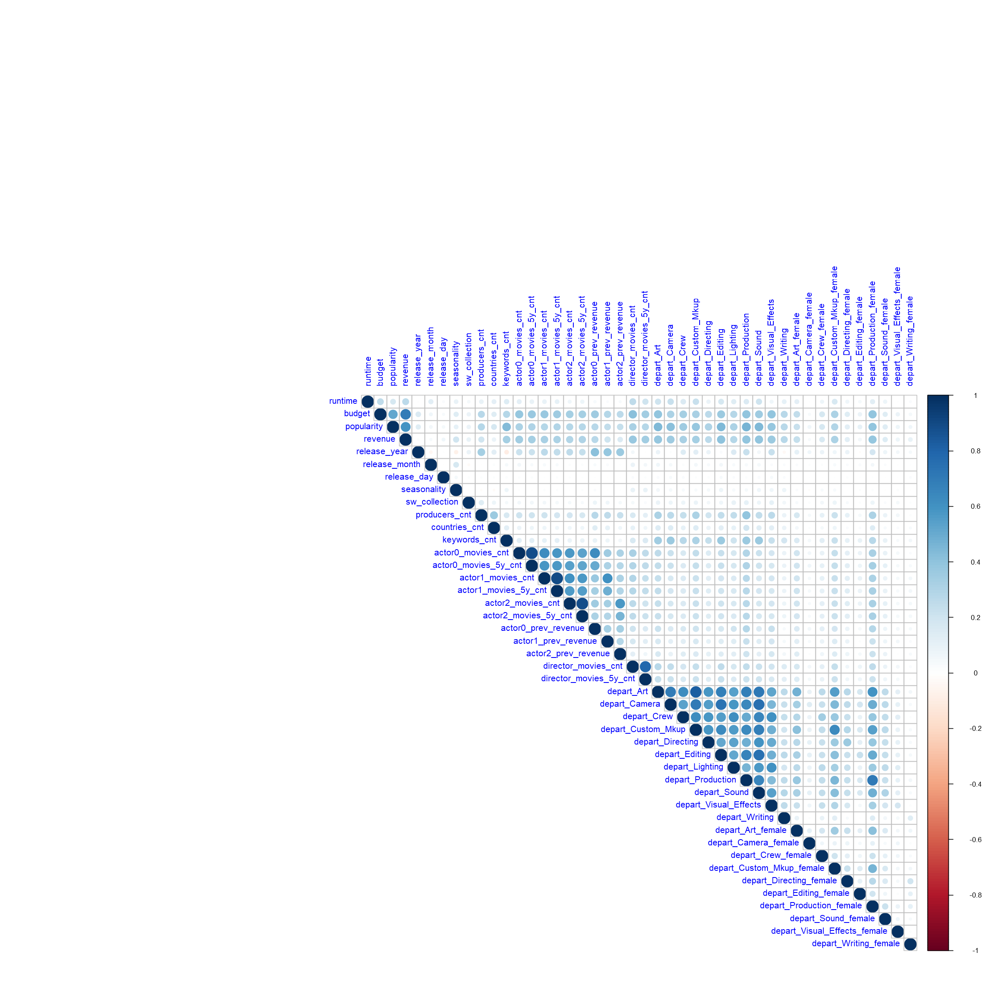

In [54]:
corrplot(res, type = "upper", 
         tl.col = "Blue", tl.srt = 90)


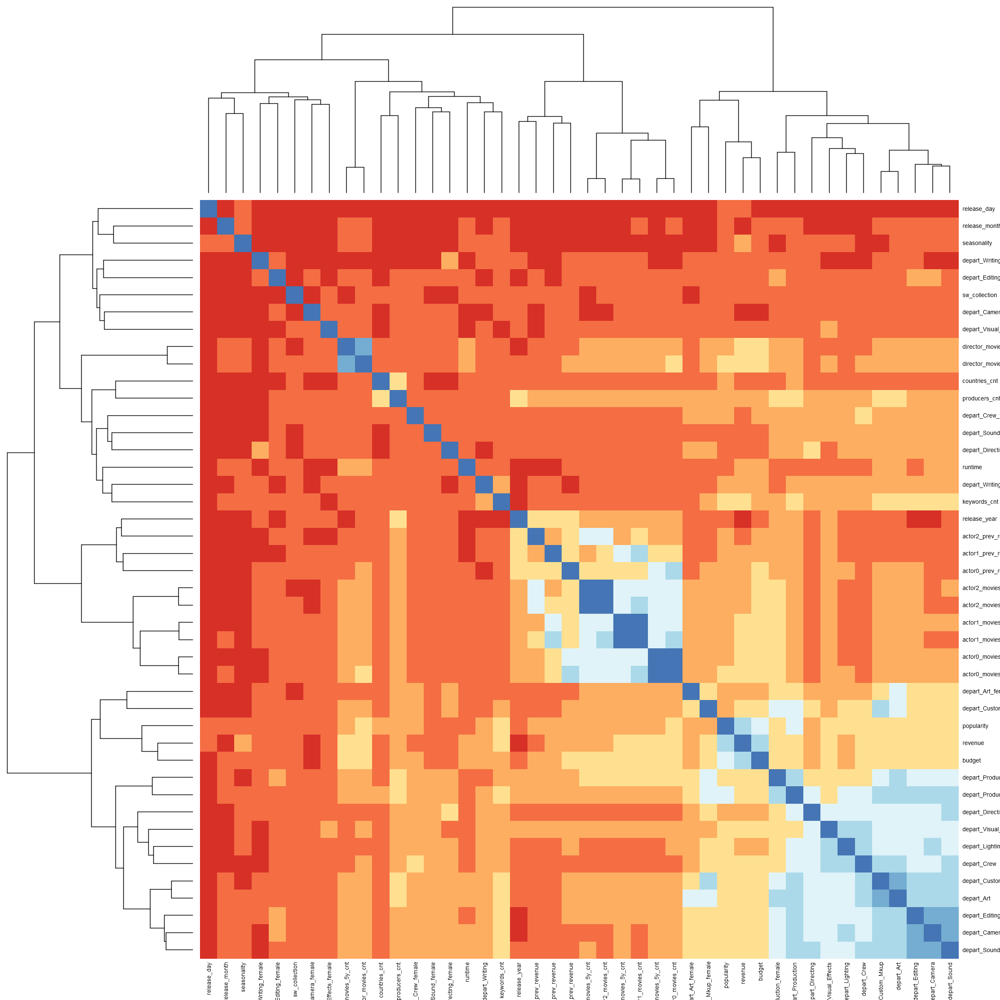

In [55]:
heatmap(res,symm = T,cexCol = 0.8, cexRow = 0.8, col=brewer.pal(n=8, name="RdYlBu"))

### 2.4 Revenue Analysis

Warning message:
"Removed 4382 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Warning message:
"Removed 4382 rows containing non-finite values (stat_bin)."
Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."


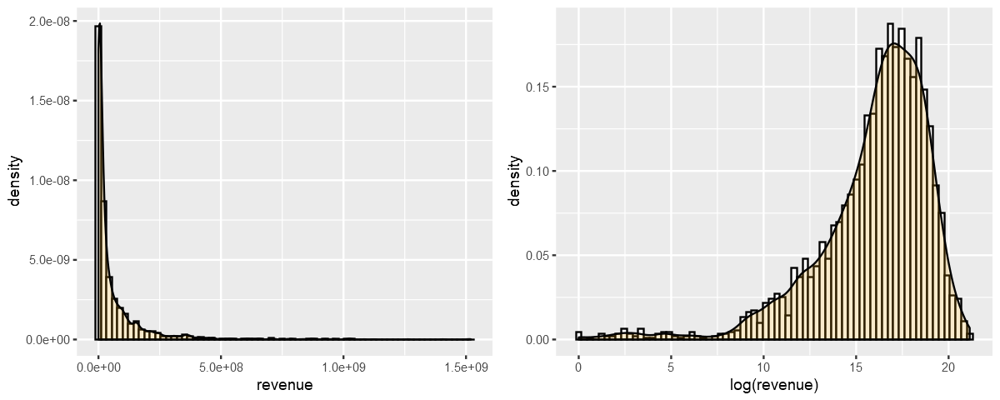

In [56]:
p1 <- ggplot(movies_ff, aes(x=revenue)) + 
      geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 70)+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()
#log revenue
p2 <- ggplot(movies_ff, aes(x=log(revenue))) + 
      geom_histogram(aes(y=..density..), colour="black", fill="white",bins = 70)+
      geom_density(alpha=0.2, fill="#E69F00") + theme_get()


options(repr.plot.width = 10, repr.plot.height = 4)
grid.arrange(p1,p2, nrow = 1)

#### differences between the average revenue by language?

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."


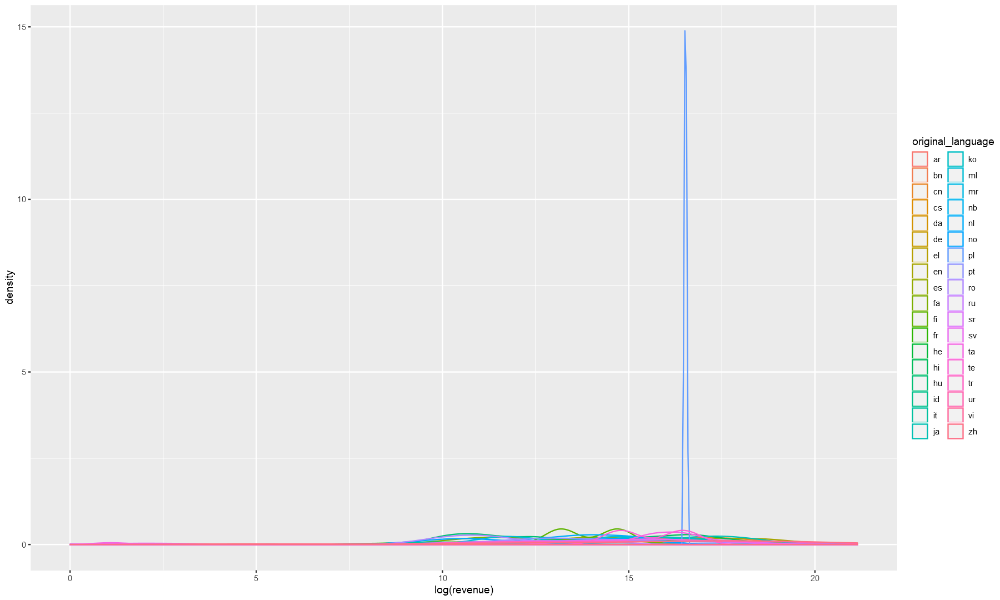

In [361]:
ggplot(data=movies_ff) +
    geom_density(aes(log(revenue), group=original_language, color=original_language))

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


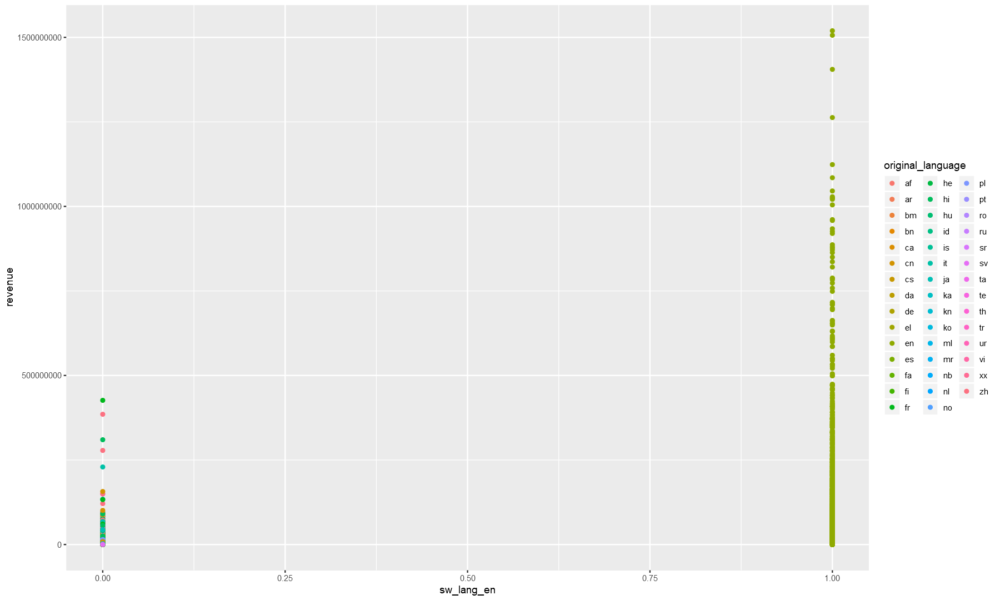

In [370]:
ggplot(data=movies_ff) +
    geom_point(aes(x=sw_lang_en, y=revenue, color = original_language))

Warning message:
"Removed 4384 rows containing missing values (geom_point)."
Warning message:
"Removed 4382 rows containing missing values (geom_point)."


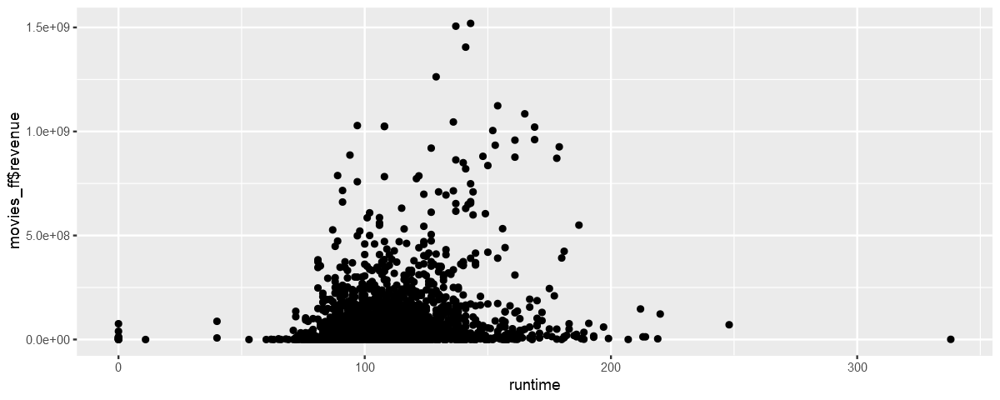

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


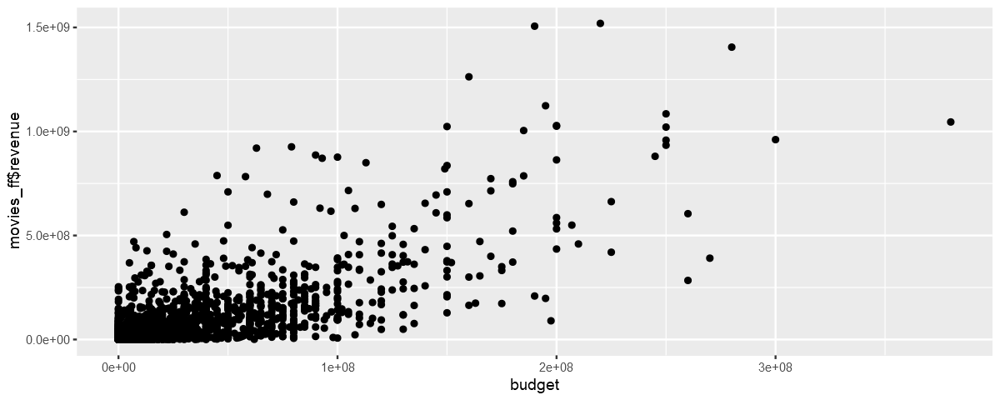

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


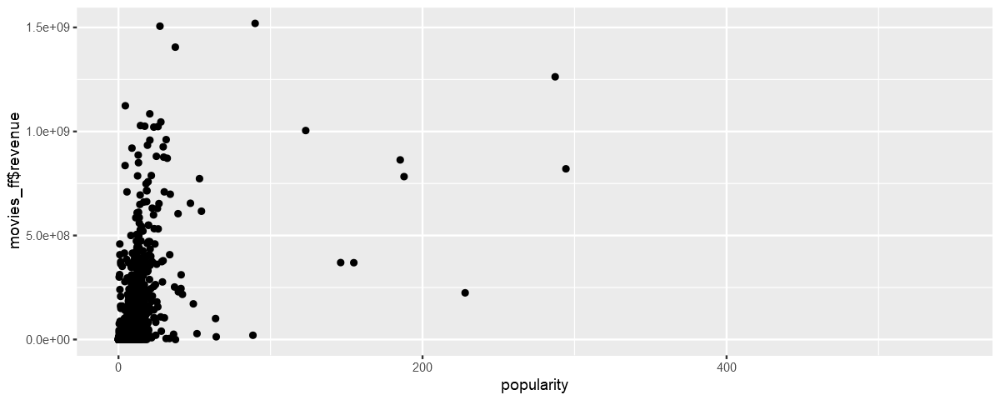

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


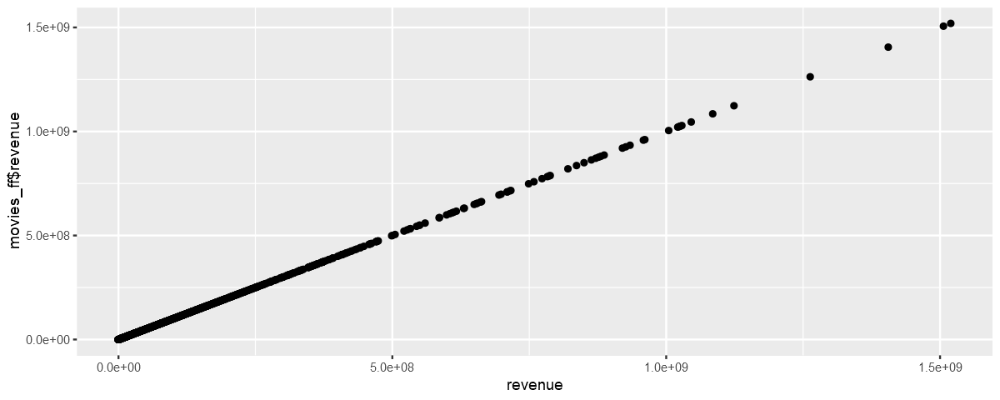

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


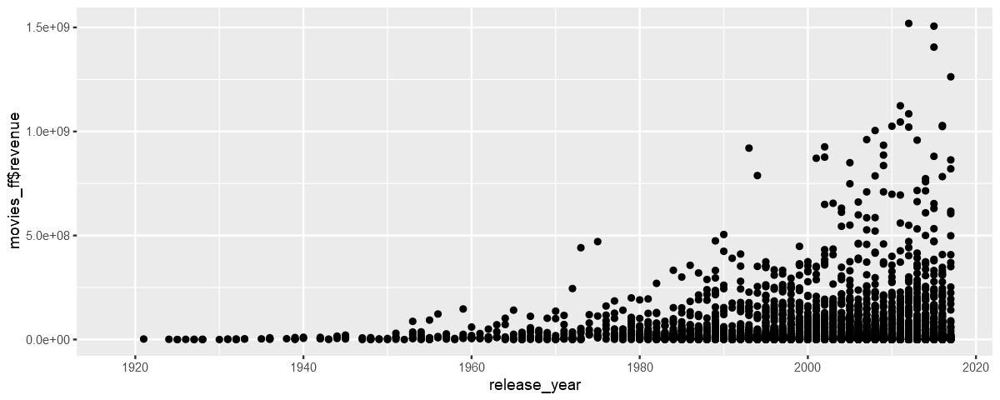

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


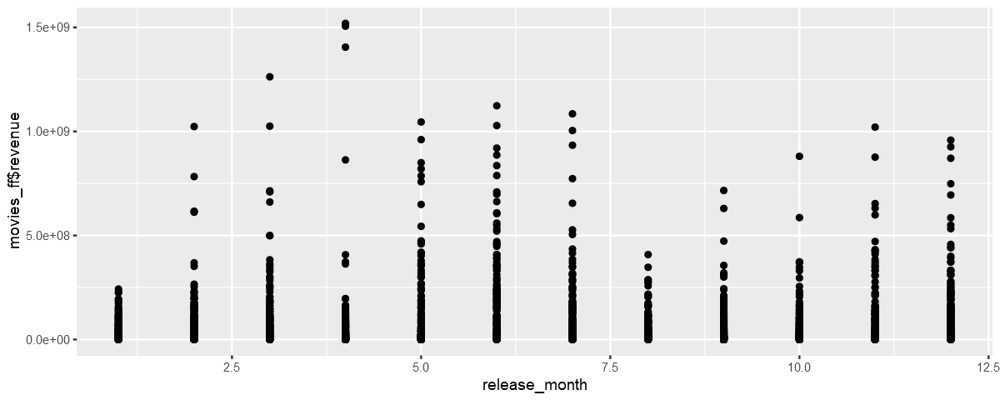

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


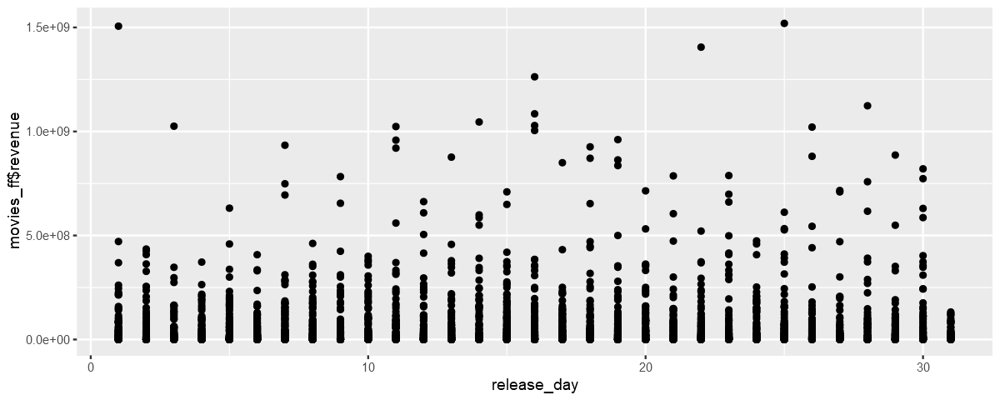

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


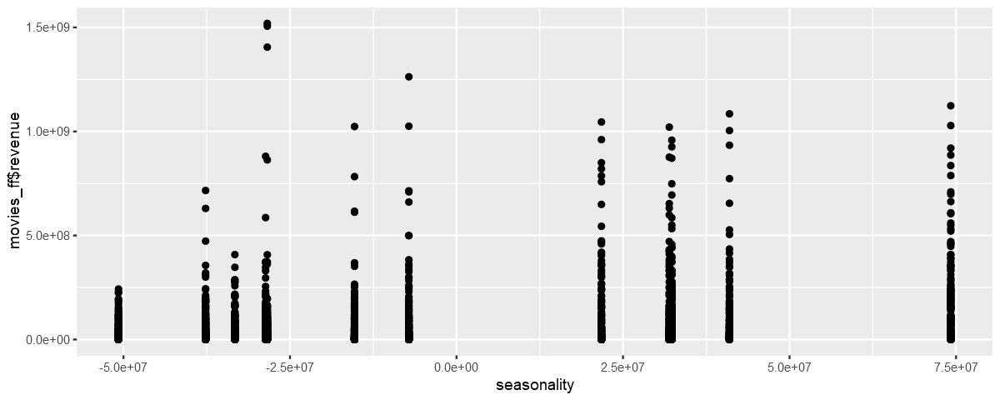

Warning message:
"Removed 4531 rows containing missing values (geom_point)."


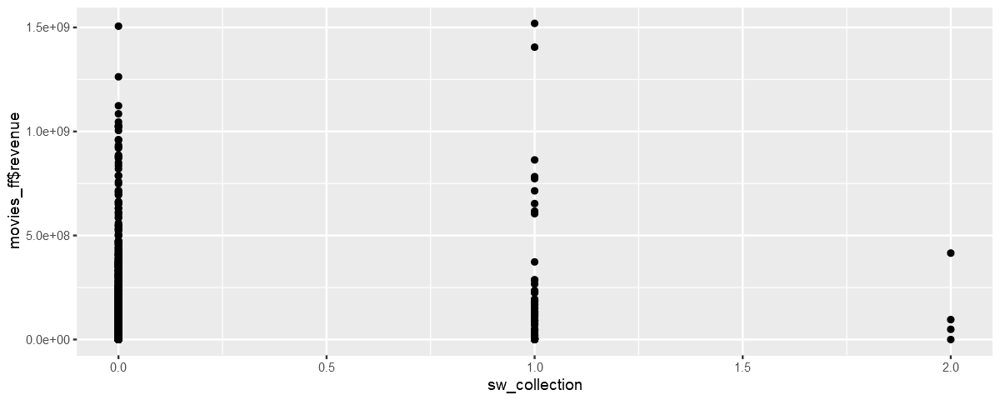

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


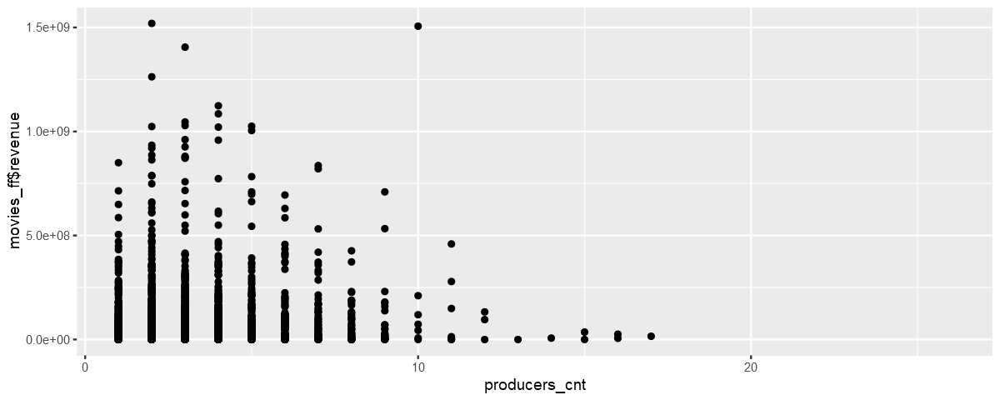

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


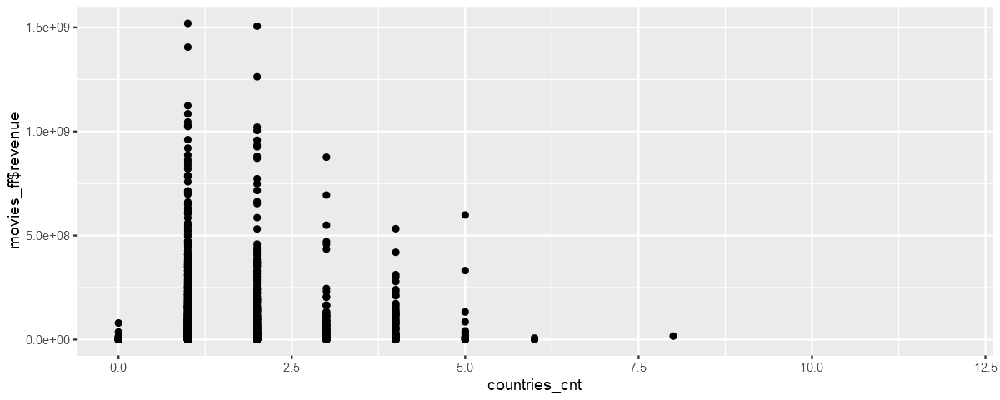

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


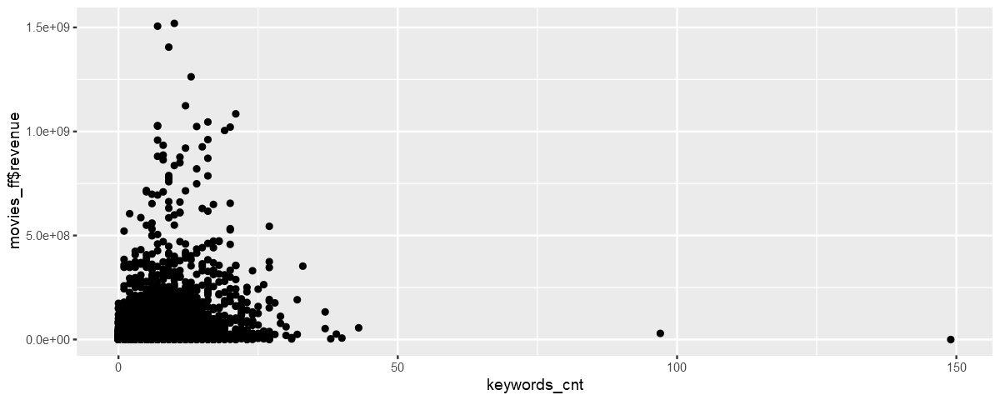

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


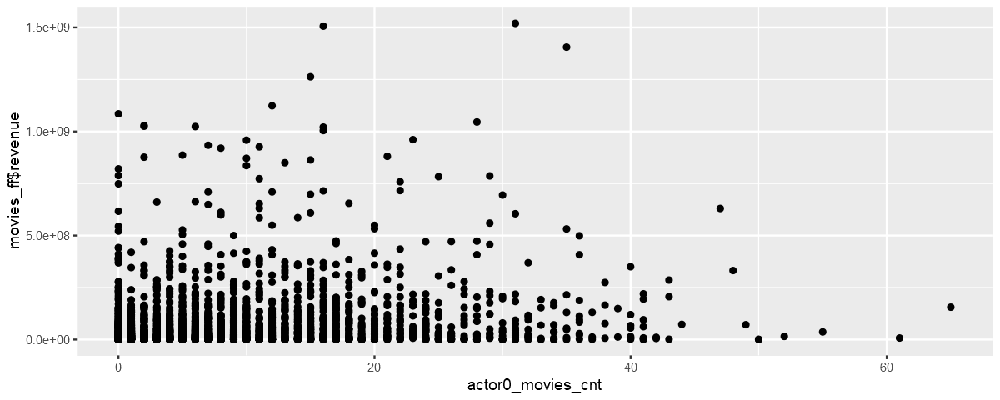

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


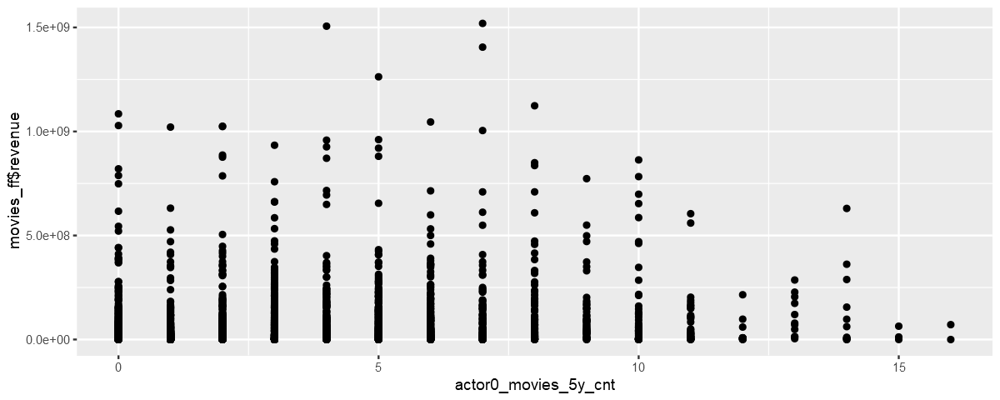

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


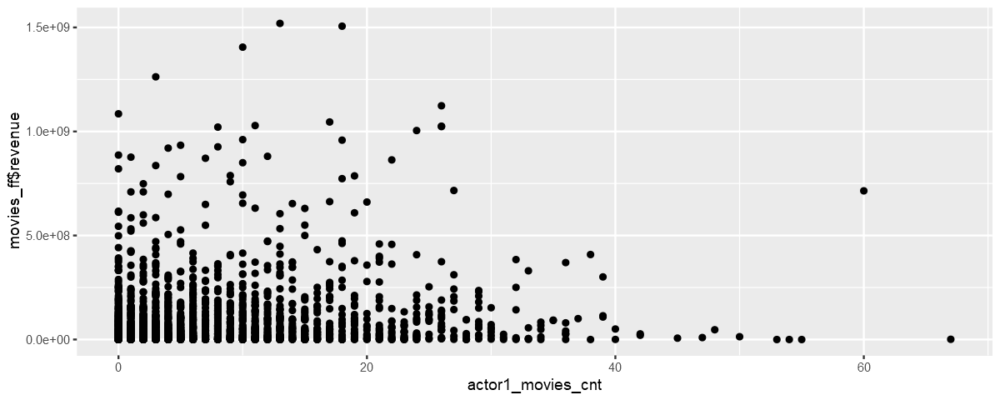

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


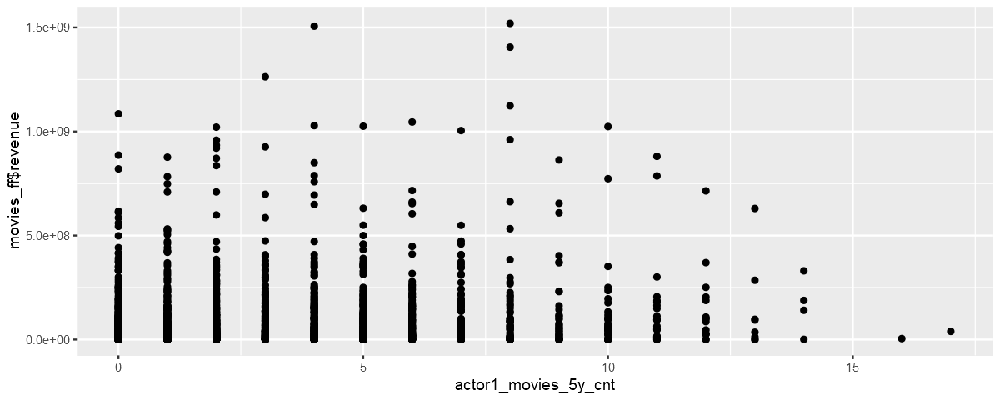

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


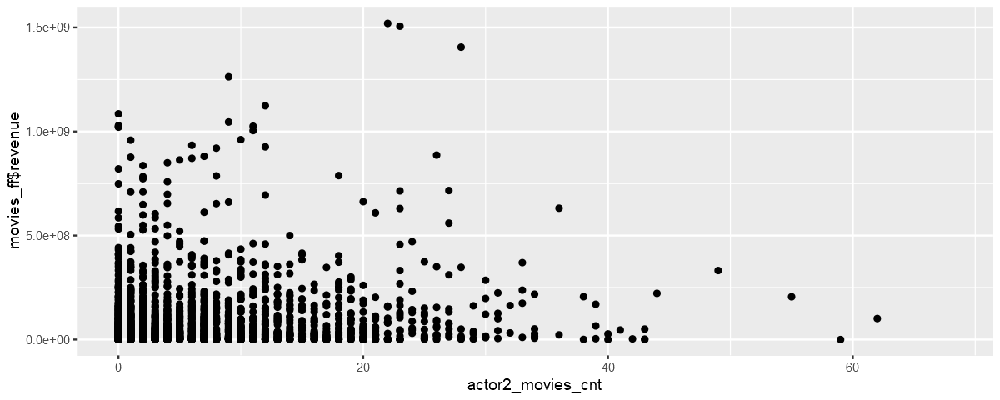

Warning message:
"Removed 5310 rows containing missing values (geom_point)."


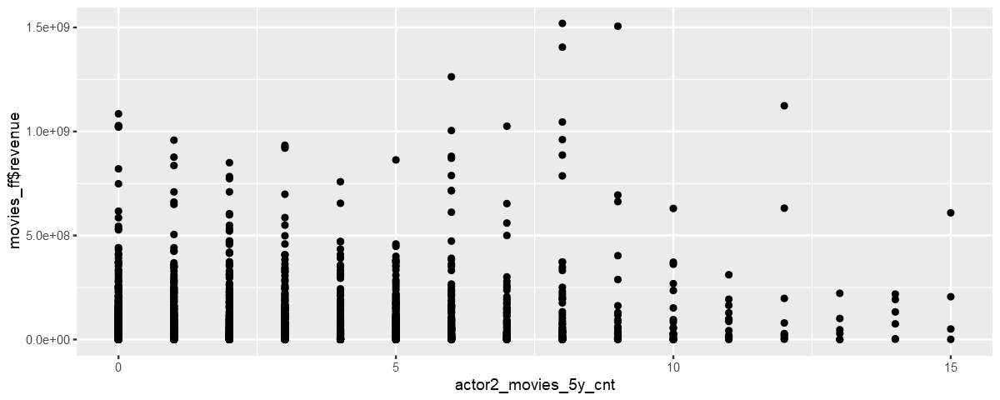

Warning message:
"Removed 5534 rows containing missing values (geom_point)."


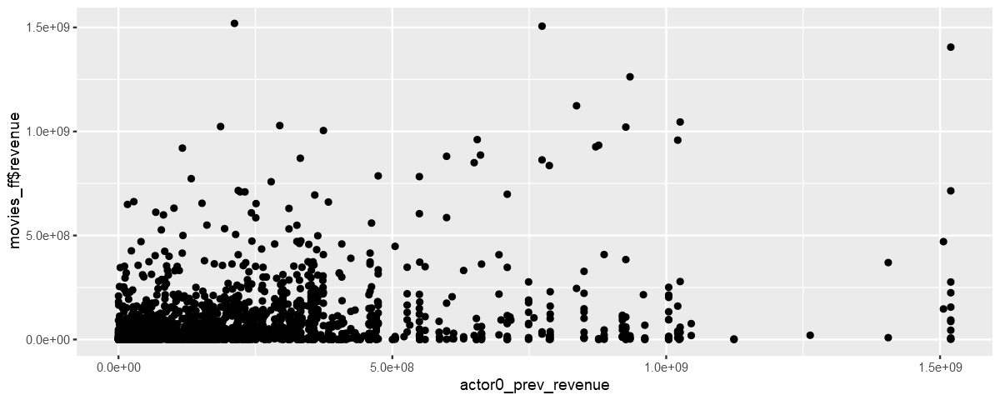

Warning message:
"Removed 5621 rows containing missing values (geom_point)."


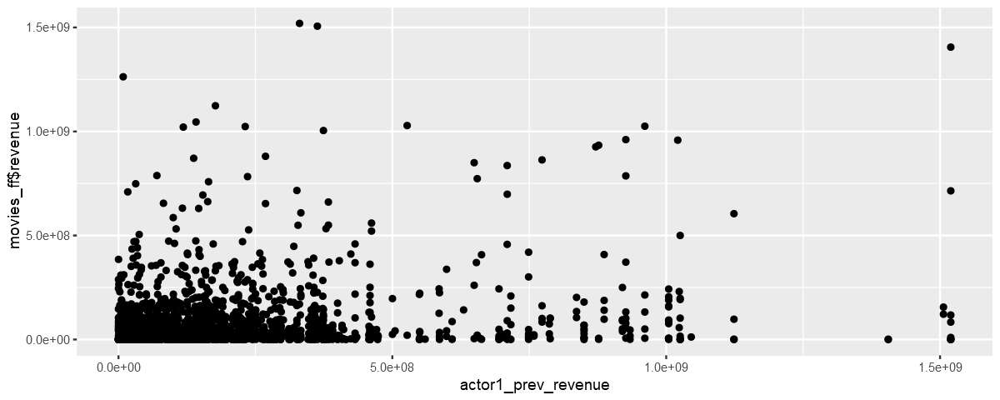

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


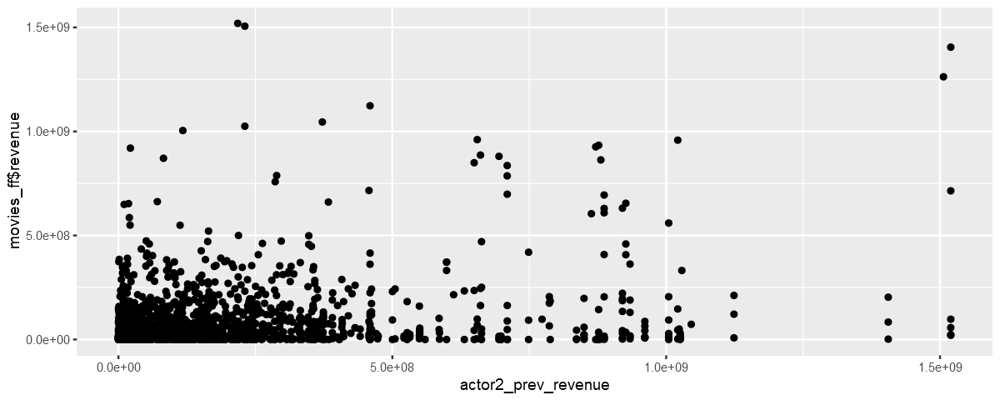

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


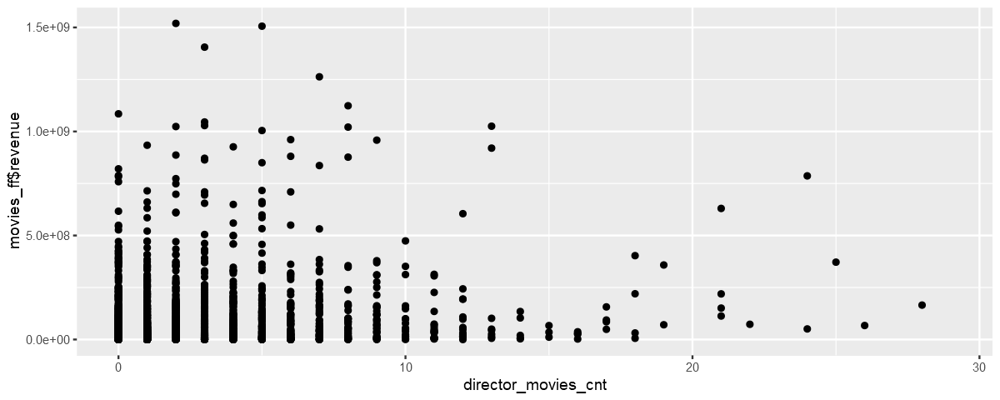

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


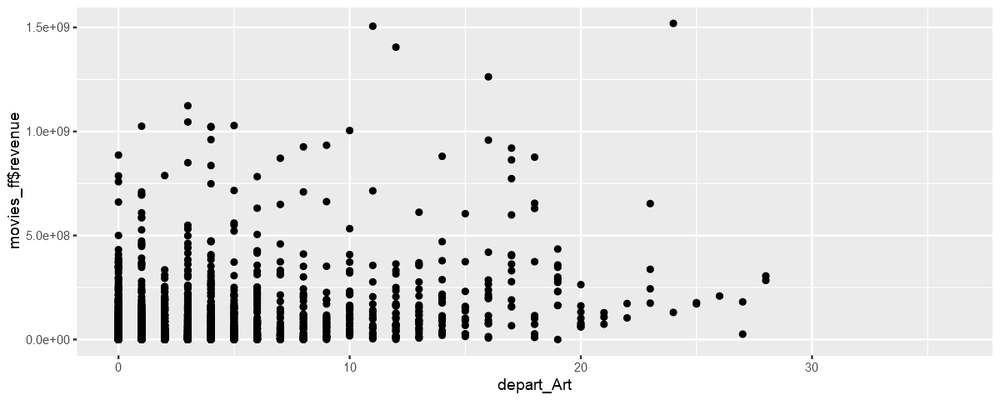

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


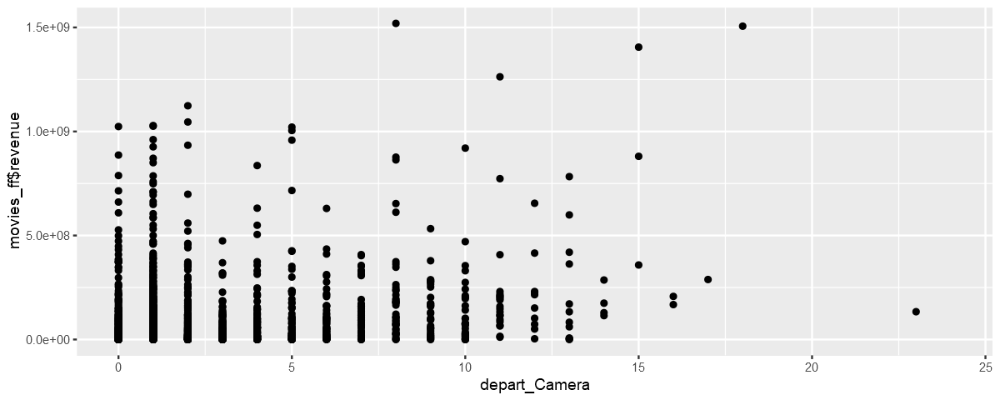

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


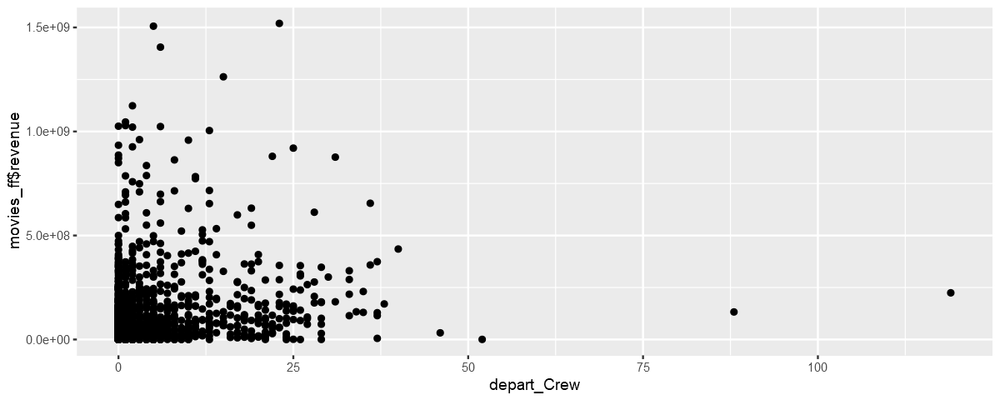

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


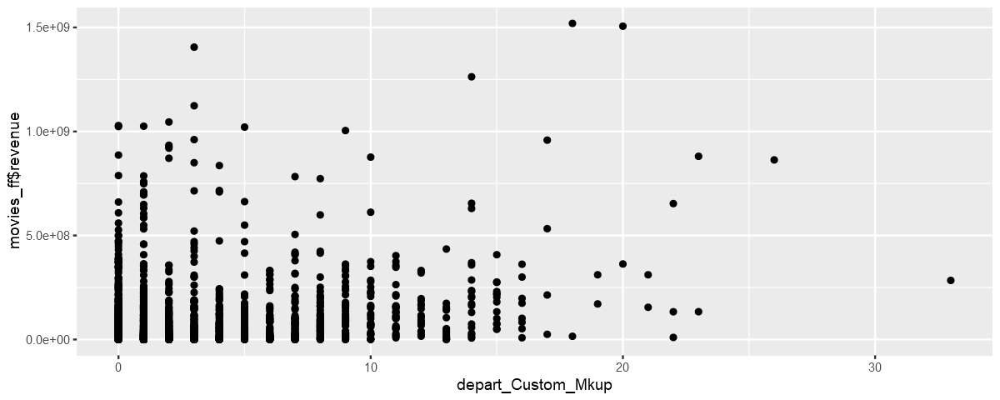

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


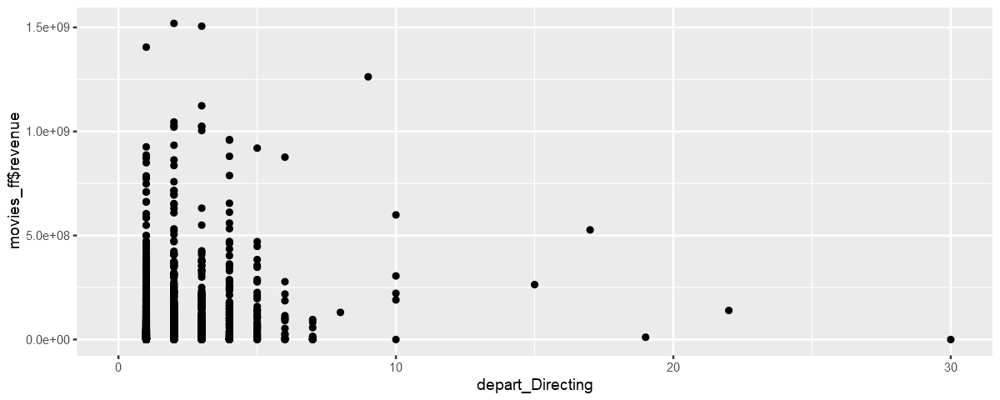

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


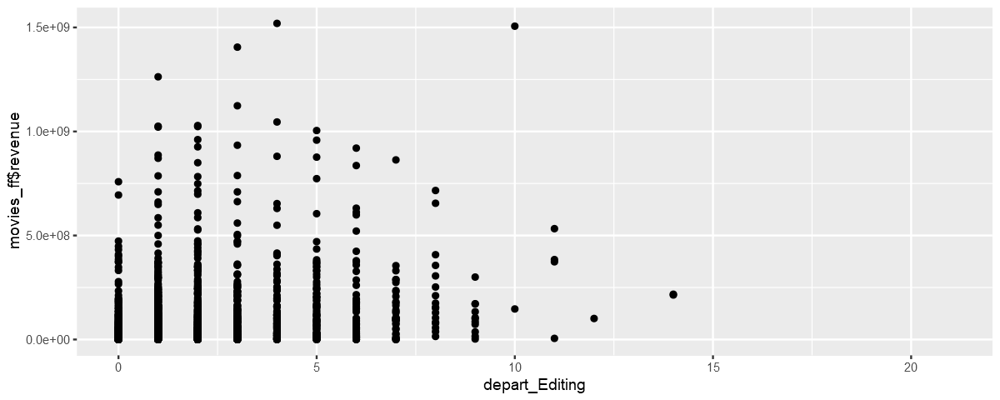

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


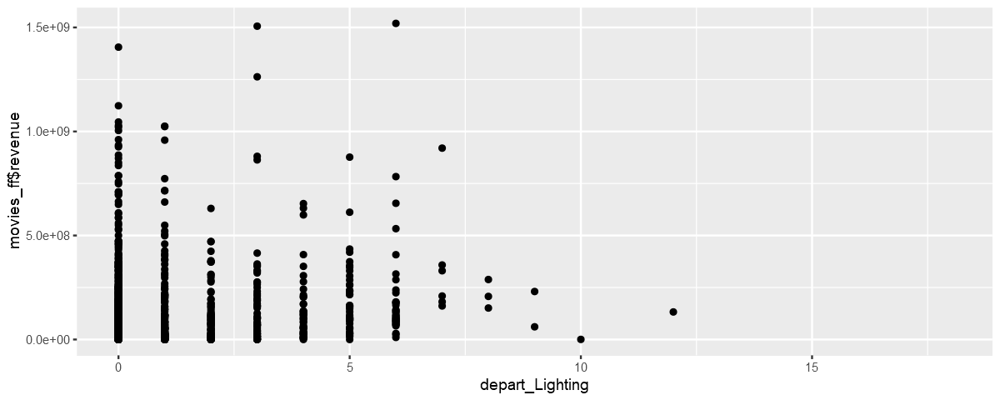

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


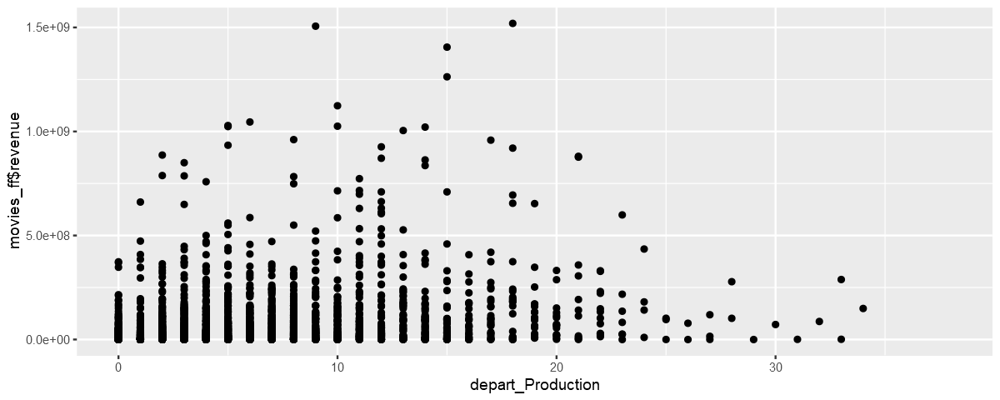

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


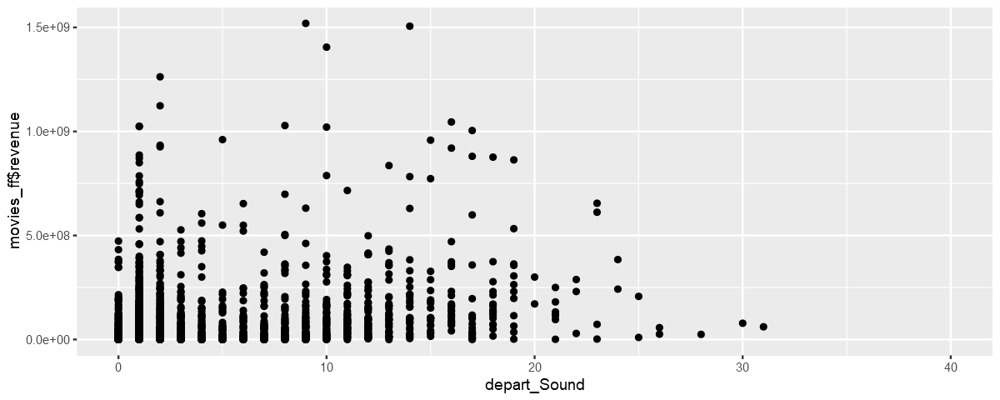

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


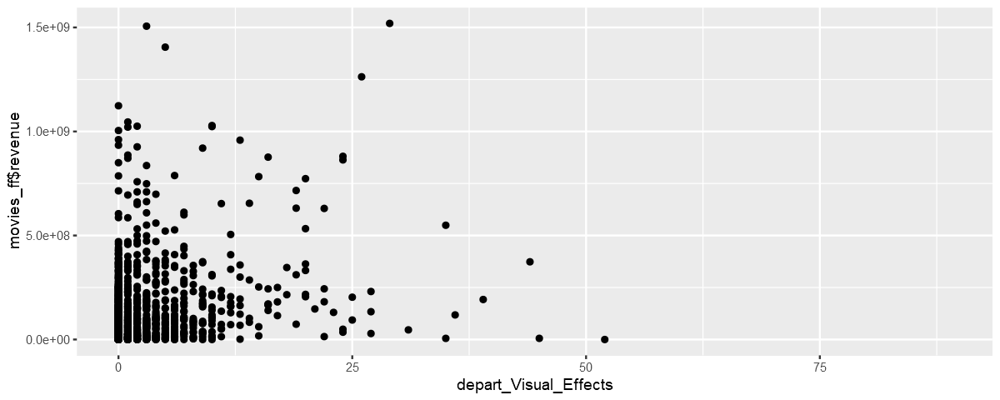

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


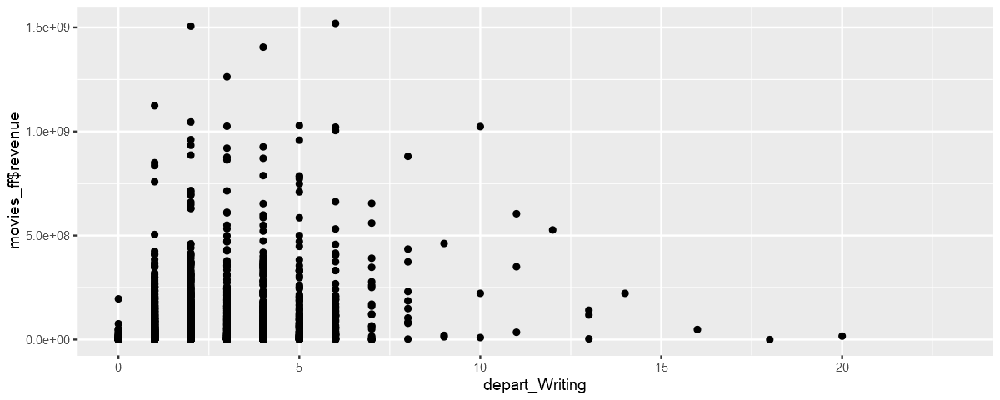

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


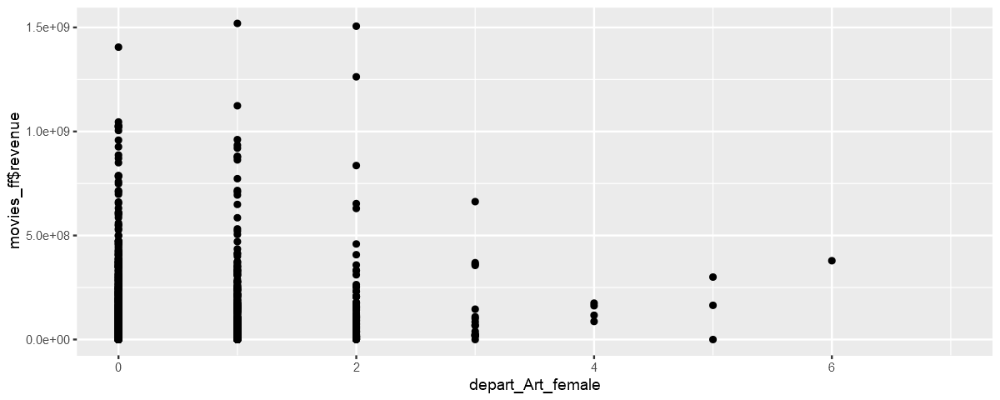

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


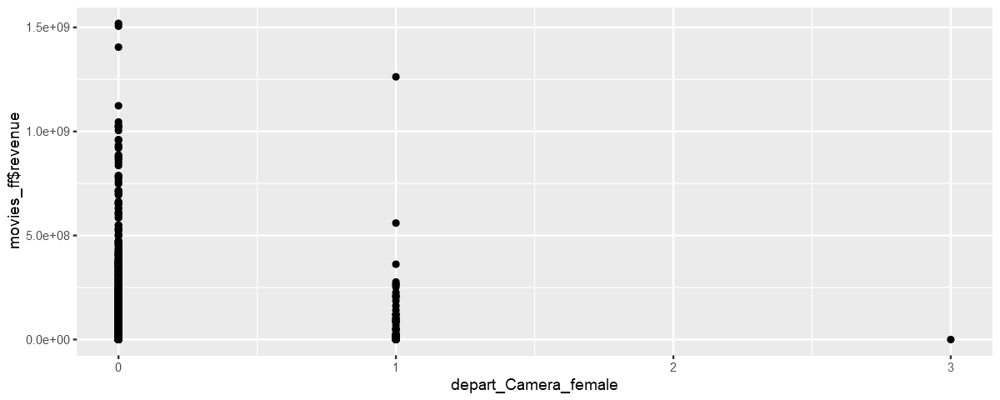

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


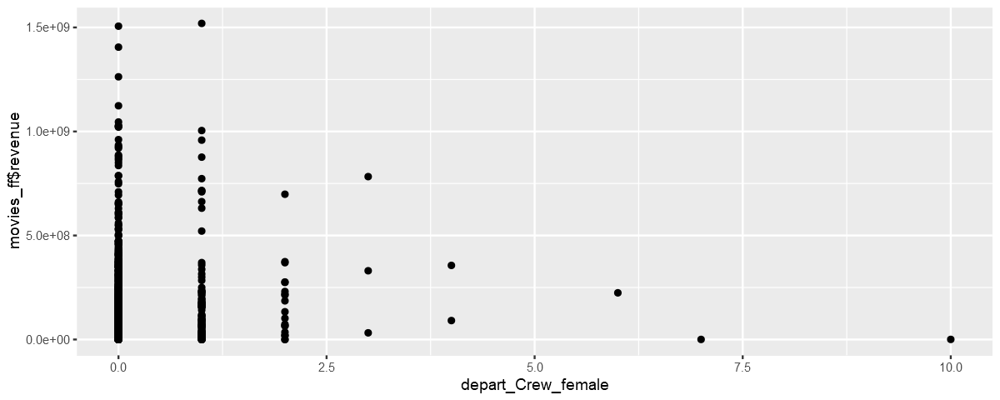

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


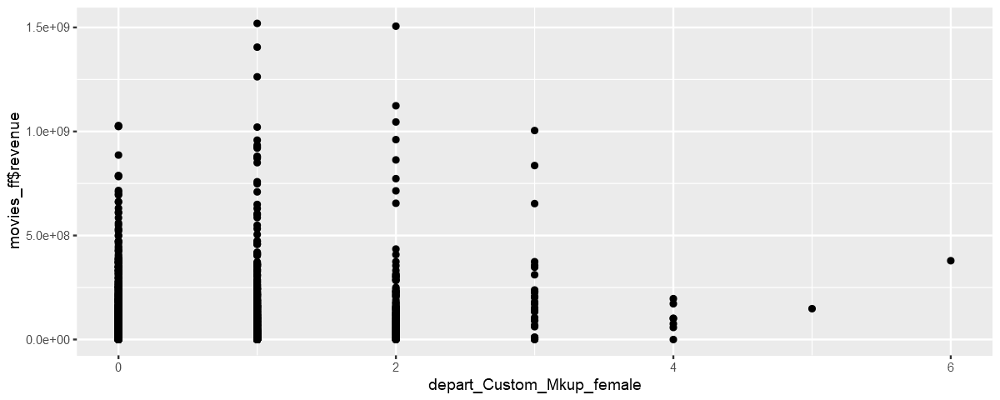

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


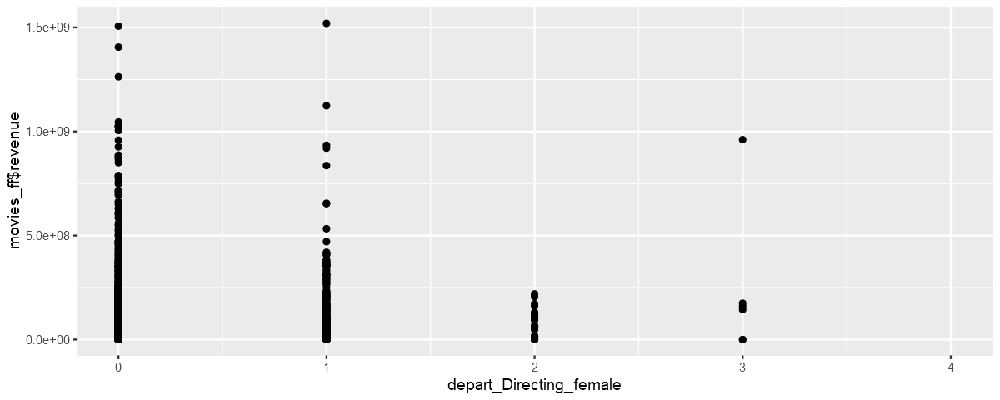

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


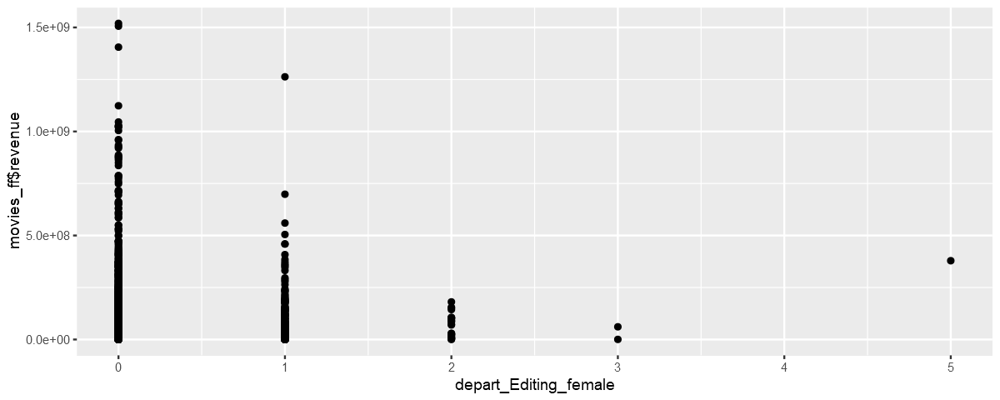

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


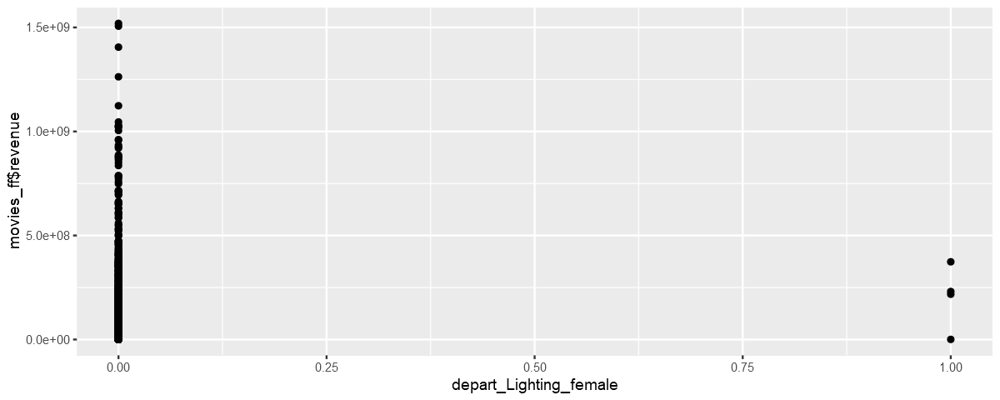

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


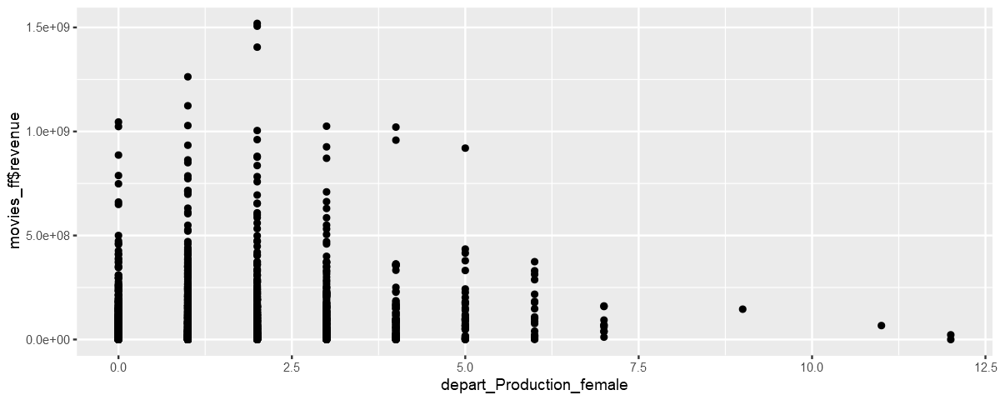

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


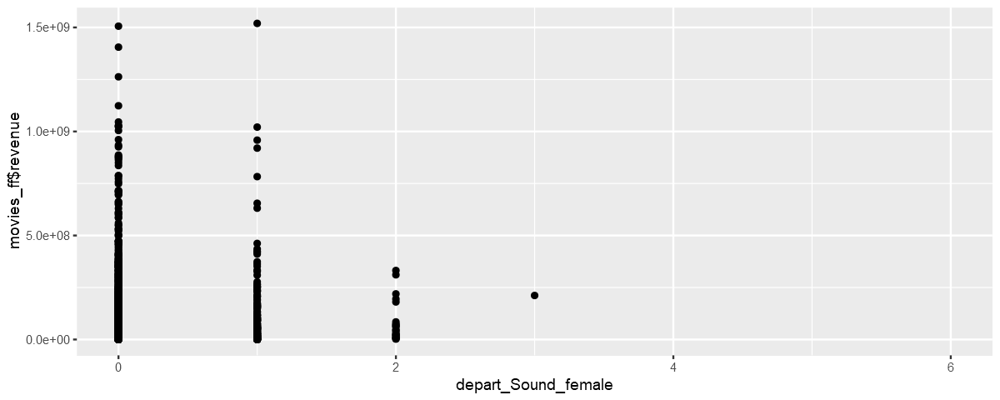

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


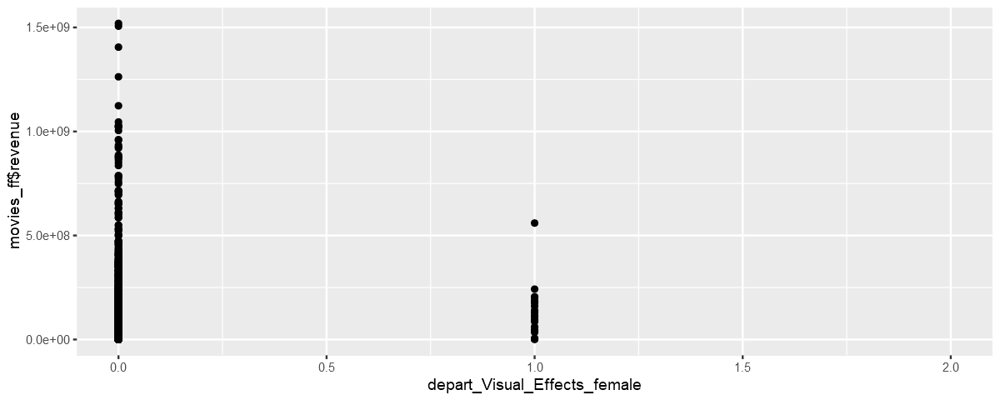

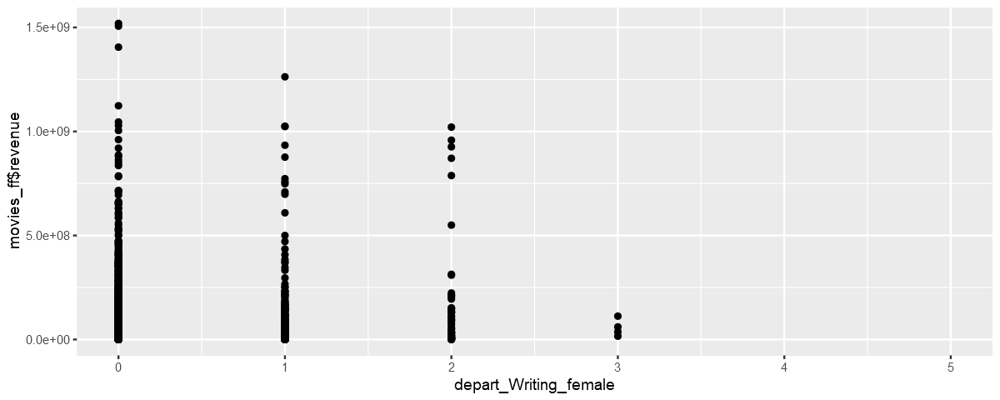

In [68]:

par(mfrow=c(2,5))

nm_cont <- names(movies_continuous2[,1:44])

for (i in 1:44) {
    print(ggplot(data=movies_ff) +
          geom_point(aes(x=movies_continuous2[,i], y=movies_ff$revenue)) +
          xlab(nm_cont[i]))
} 


## Outliers

In [69]:
outlierMatrix <- function(data,threshold=1.5) {
    vn <- setdiff(names(data),"movie_id")
    outdata <- data.frame(movie_id=data$movie_id)
    for(v in vn) {
        if(is.numeric(data[[v]])) {
            med <- median (data[[v]],na.rm=TRUE)
            outlow <- quantile(data[[v]],probs = 0.25,na.rm = T) 
            outhigh <- quantile(data[[v]],probs = 0.75, na.rm = T)
            irq_level <- (outhigh - outlow) * threshold
            outlow <- outlow - irq_level
            outhigh <- outhigh +  irq_level
            mv <- ifelse(data[[v]] < outlow | data[[v]] > outhigh, 1, 0)
            outdata[paste0(v,"_out")] <- mv
        } else {
            mv <- rep(0,nrow(data))
        }
    }
    outdata$row1 <- NULL
    return(outdata)
}

movies_outliers <- outlierMatrix(movies_ff)

In [150]:
## Using IRQ for catching univariate outliers (1.5 x IRQ) 1==Outliers
head(outlierMatrix(movies_ff,threshold=1.5))


,movie_id,runtime_out,budget_out,popularity_out,revenue_out,sw_lang_en_out,sw_web_presence_out,sw_has_poster_out,sw_tagline_out,release_year_out,...,depart_Camera_female_out,depart_Crew_female_out,depart_Custom_Mkup_female_out,depart_Directing_female_out,depart_Editing_female_out,depart_Lighting_female_out,depart_Production_female_out,depart_Sound_female_out,depart_Visual_Effects_female_out,depart_Writing_female_out
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,3,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,4,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,5,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"
Warning message in x[floor(d)] + x[ceiling(d)]:
"NAs produced by integer overflow"


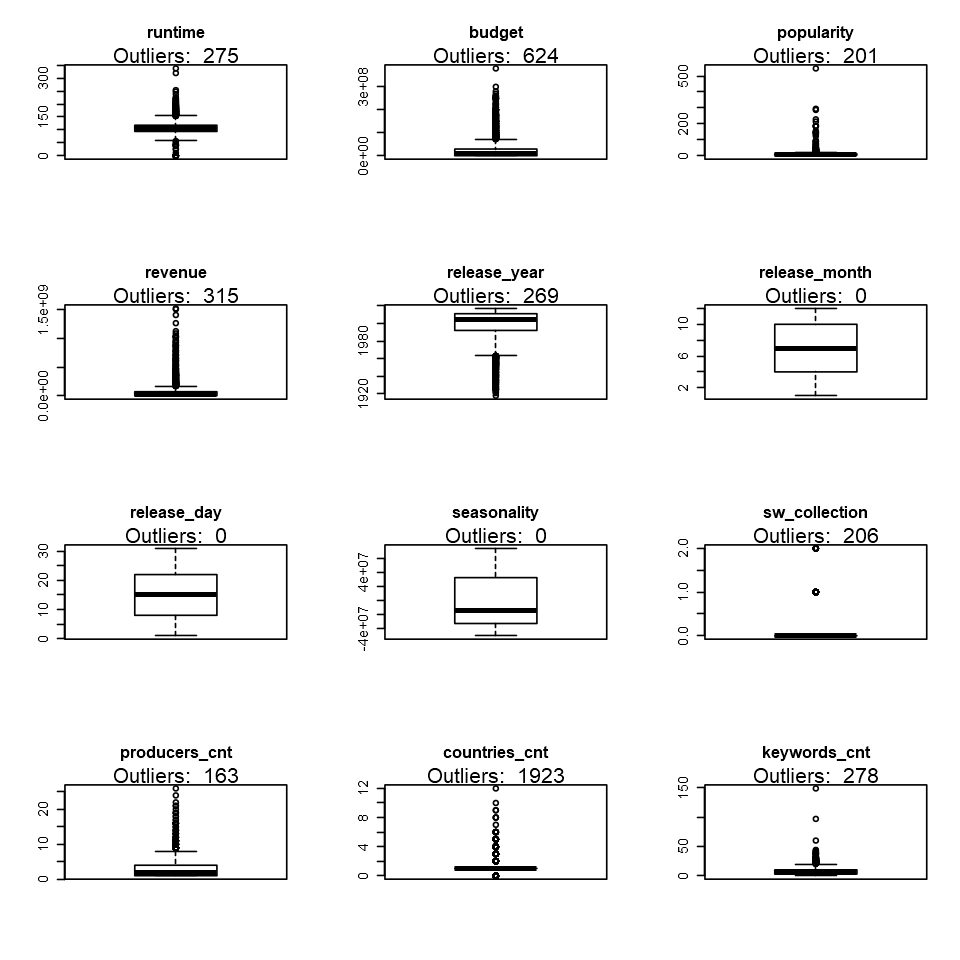

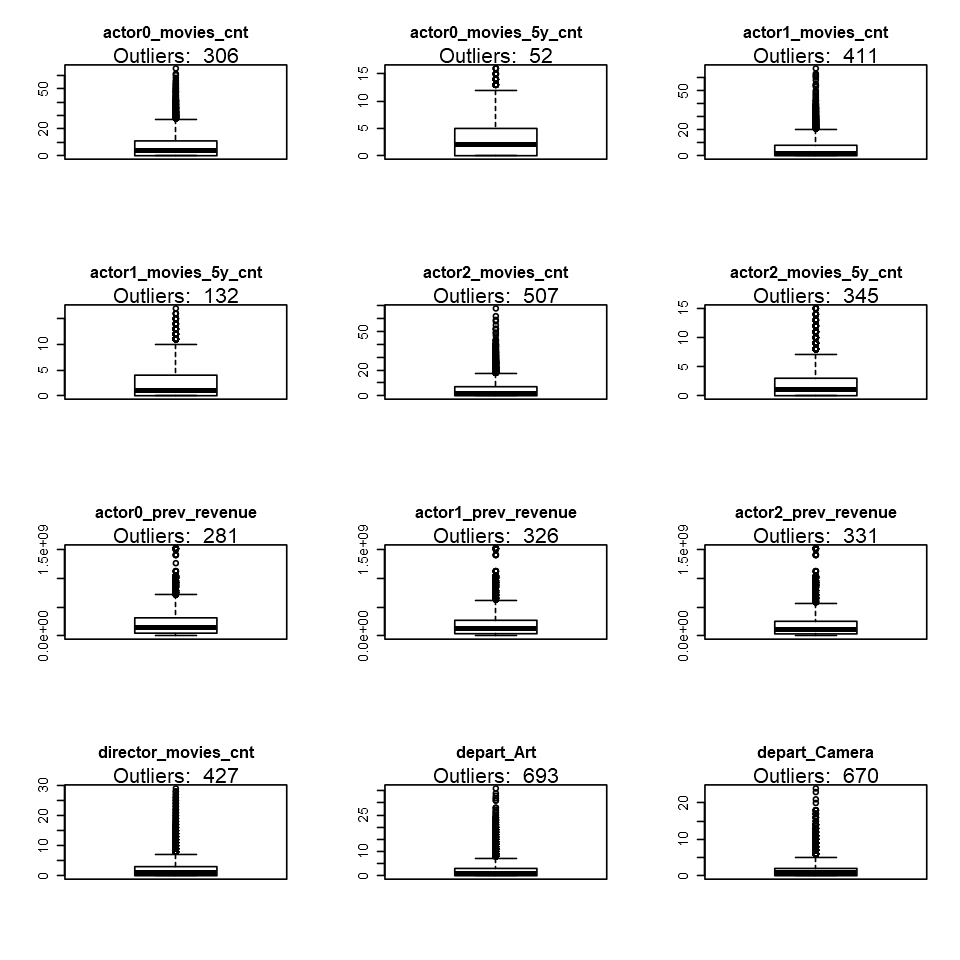

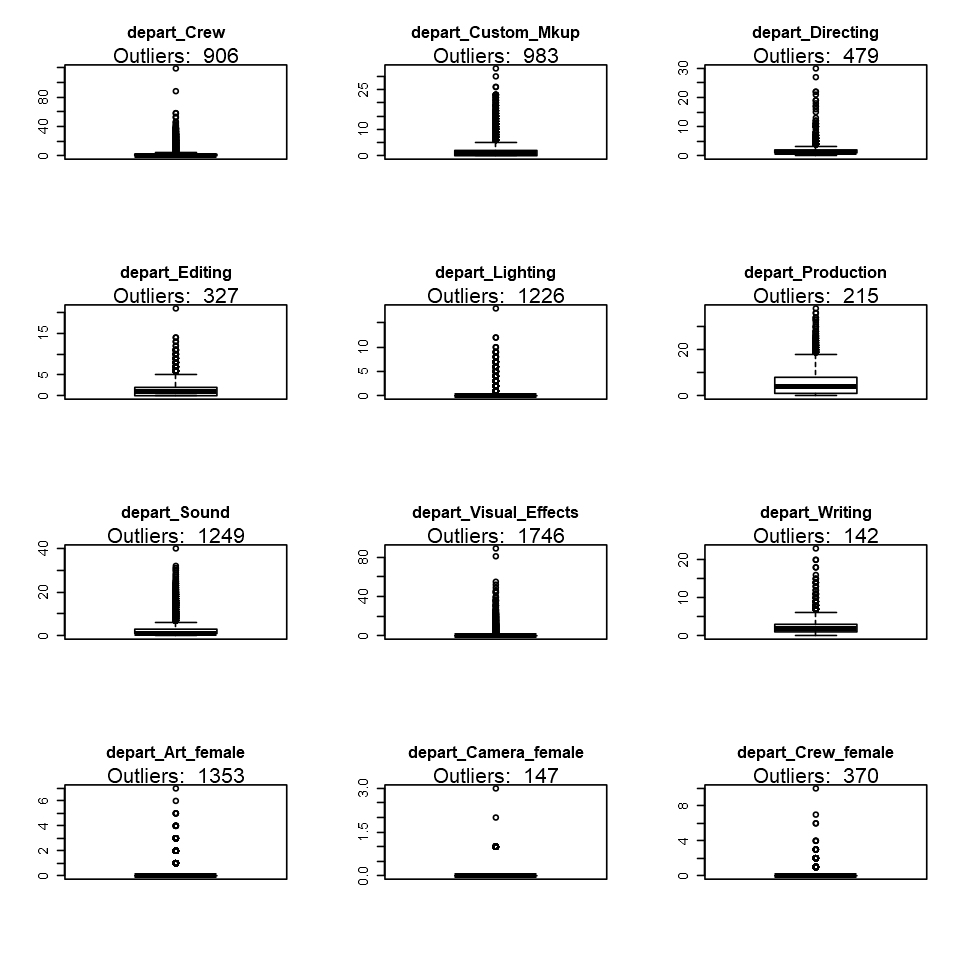

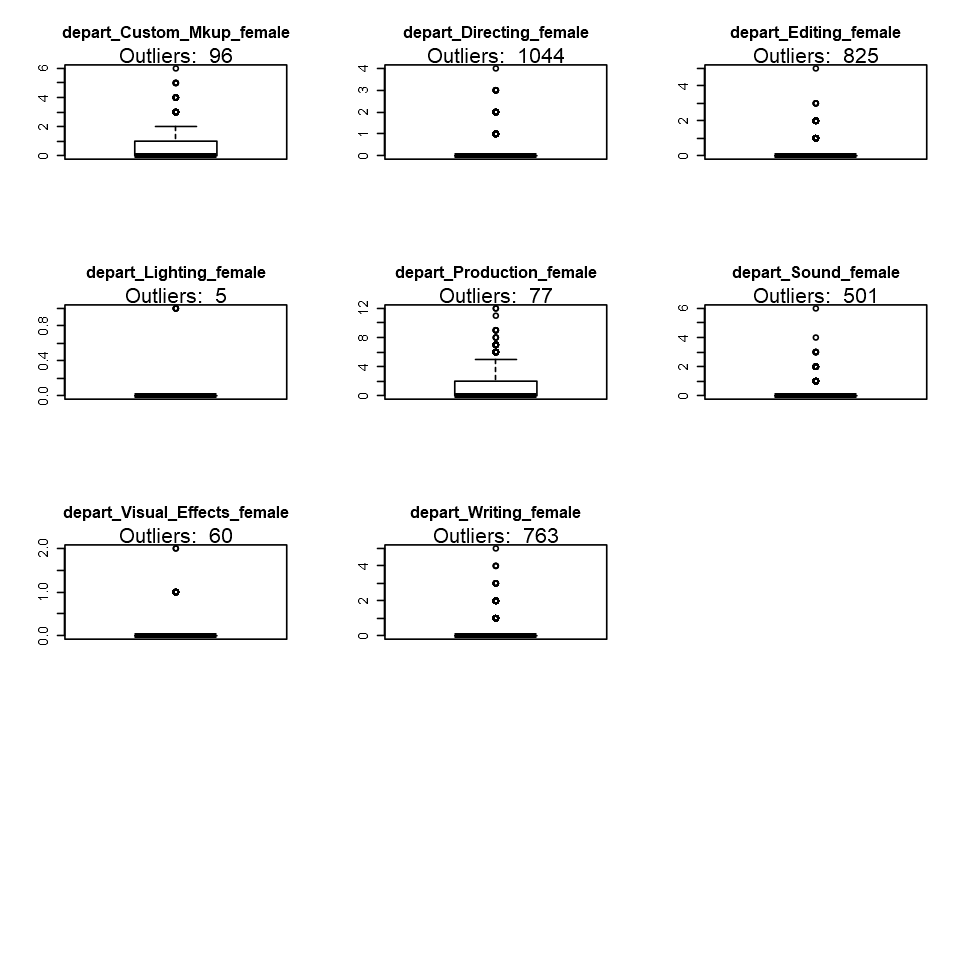

In [71]:
## from some reason i couldn't run this code with 'movies_continuous' which i've created with a loop, therefore i've created
## a "stupid" object called 'movies_continuous2' which i've created by hand.. i spent a lot of time trying to figure out 
## the error with no succsess

## Visual determination of univariate outliers using boxplots + outliers count
options(repr.plot.width = 8, repr.plot.height = 8)
par(mfrow=c(4,3))
for(v in names(movies_continuous2[,1:44])) {
    outlier_values <- boxplot.stats(movies_continuous2[,v])$out
    boxplot(movies_ff[[v]],main=v)
    mtext(paste("Outliers: ", paste(length(outlier_values), collapse=", ")), cex=1)
}
par(mfrow=c(1,1))

## Missingness

In [72]:
getMissingness <- function (data, getRows = FALSE) {
    require(dplyr)
    l <- nrow(data)
    vn <- names(data)
    nadf <- data
    cnt <- NULL
    miss <- function(x) return(sum(is.na(x)))
    for (n in vn) {
        nadf[[n]] <- ifelse(is.na(nadf[[n]]) == T, 1, 0)
        cnt <- rbind(cnt, data.frame(n, sum(nadf[[n]])))
    }
    names(cnt) <- c("var", "na.count")
    cnt$rate <- round((cnt$na.count/nrow(nadf)) * 100, 1)
    nadf$na.cnt <- 0
    nadf$na.cnt <- rowSums(nadf)
    cnt <- cnt %>% dplyr::arrange(desc(na.count)) %>% dplyr::filter(na.count > 
        0)
    totmiss <- nadf %>% dplyr::filter(na.cnt == 0) %>% dplyr::tally()
    idx <- NULL
    msg <- (paste("This dataset has ", as.character(totmiss), 
        " (", as.character(round(totmiss/nrow(data) * 100, 1)), 
        "%)", " complete rows. Original data has ", nrow(data), 
        " rows.", sep = ""))
    if (getRows == TRUE & totmiss != 0) {
        nadf$rn <- seq_len(nrow(data))
        idx <- nadf %>% dplyr::filter(na.cnt == 0) %>% dplyr::select(rn)
    }
    print(list(head(cnt, n = 10), msg))
    return(list(missingness = cnt, message = msg, rows = idx$rn))
}

In [73]:
getMissingness(movies_ff)

[[1]]
                   var na.count rate
1              revenue     4382 59.4
2  actor2_prev_revenue     3423 46.4
3  actor1_prev_revenue     3201 43.4
4  actor0_prev_revenue     2752 37.3
5     sw_female_actor0      934 12.7
6       sw_male_actor0      934 12.7
7     sw_female_actor2      788 10.7
8       sw_male_actor2      788 10.7
9     sw_female_actor1      782 10.6
10      sw_male_actor1      782 10.6

[[2]]
[1] "This dataset has 1154 (15.6%) complete rows. Original data has 7375 rows."



var,na.count,rate
<fct>,<dbl>,<dbl>
revenue,4382,59.4
actor2_prev_revenue,3423,46.4
actor1_prev_revenue,3201,43.4
actor0_prev_revenue,2752,37.3
sw_female_actor0,934,12.7
sw_male_actor0,934,12.7
sw_female_actor2,788,10.7
sw_male_actor2,788,10.7
sw_female_actor1,782,10.6


In [74]:
missingMatrix <- function(data) {
    vn <- setdiff(names(data),"movie_id")
    missdata <- data.frame(movie_id=data$movie_id)
    for(v in vn) {
        mv <- ifelse(is.na(data[[v]]),1,0)
        missdata[v] <- mv
    }
    missdata$row1 <- NULL
    return(missdata)
}
movies_missing <- missingMatrix(data=movies_ff)
head(movies_missing)

,movie_id,original_language,release_date,runtime_cat,runtime,budget,popularity,revenue,sw_lang_en,sw_web_presence,...,depart_Camera_female,depart_Crew_female,depart_Custom_Mkup_female,depart_Directing_female,depart_Editing_female,depart_Lighting_female,depart_Production_female,depart_Sound_female,depart_Visual_Effects_female,depart_Writing_female
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Loading required package: naniar

Warning message:
"package 'naniar' was built under R version 3.6.2"
Warning message:
"`cols` is now required.
Please use `cols = c(data)`"


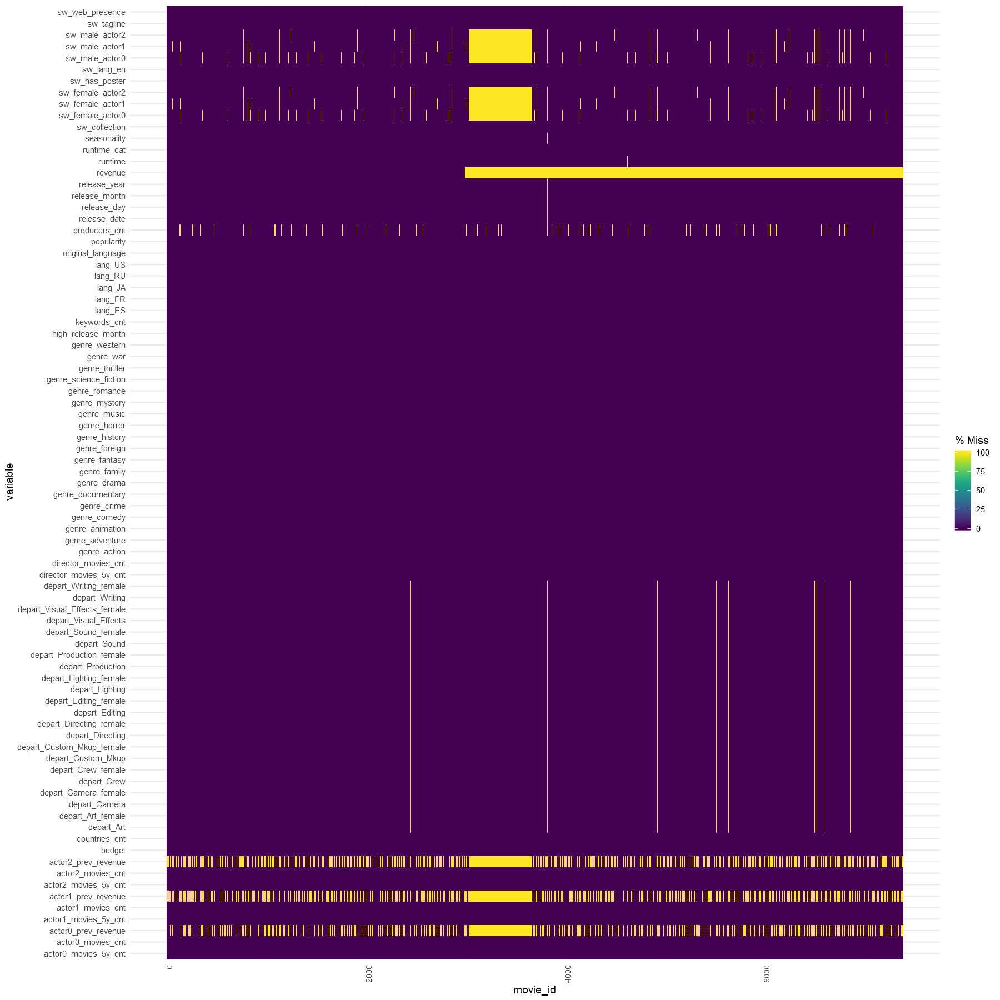

In [75]:
if(!require(naniar)) {install.packages("naniar");require(naniar)}
library(naniar)
options(repr.plot.width = 15, repr.plot.height = 15)

gg_miss_fct(x=movies_ff, fct=movie_id) + 
theme(axis.text.x = element_text(angle=90, size=8))

# חלק 3 - ניקוי הנתונים

## 3.1 נתוני קיצון

### 3.1.1 במשתנים שבהם מוצאים ערכי קיצון תבדקו את ההתפלגות של המשתנה עם ובלי ערכי הקיצון.  האם ההתפלגות משתנה?


Joining, by = "movie_id"
Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"
Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


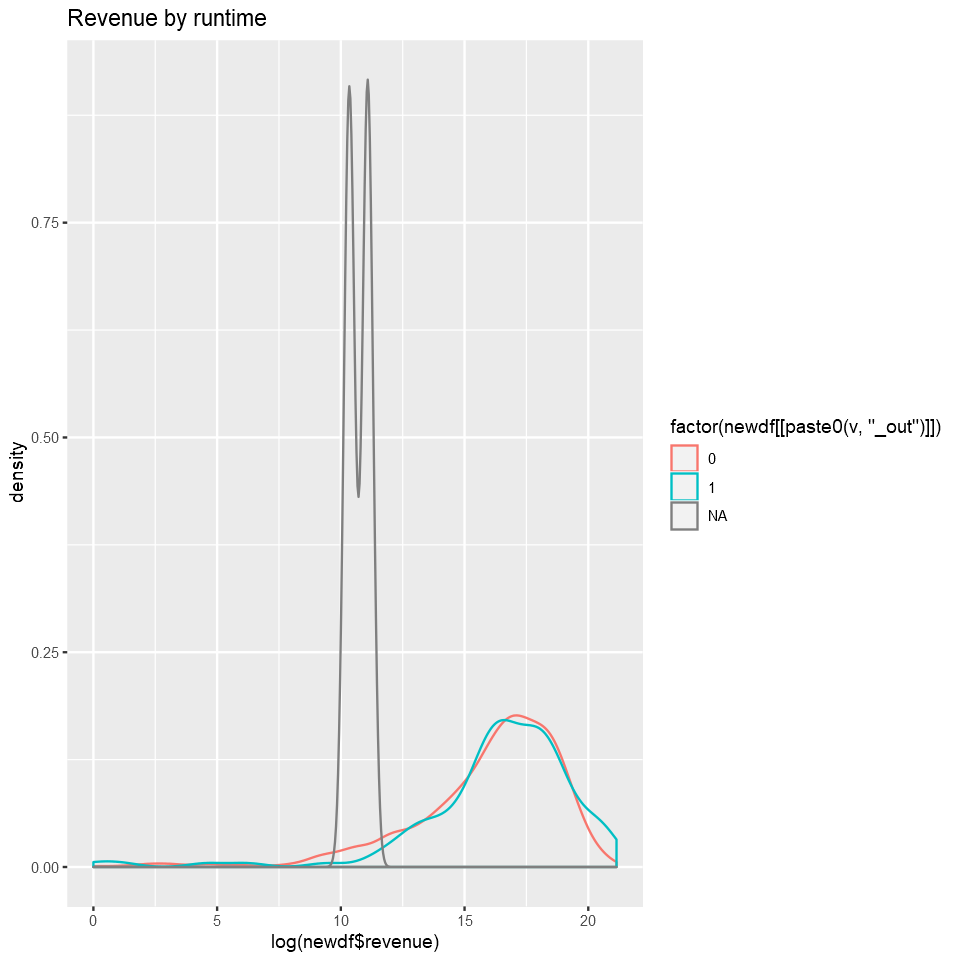

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


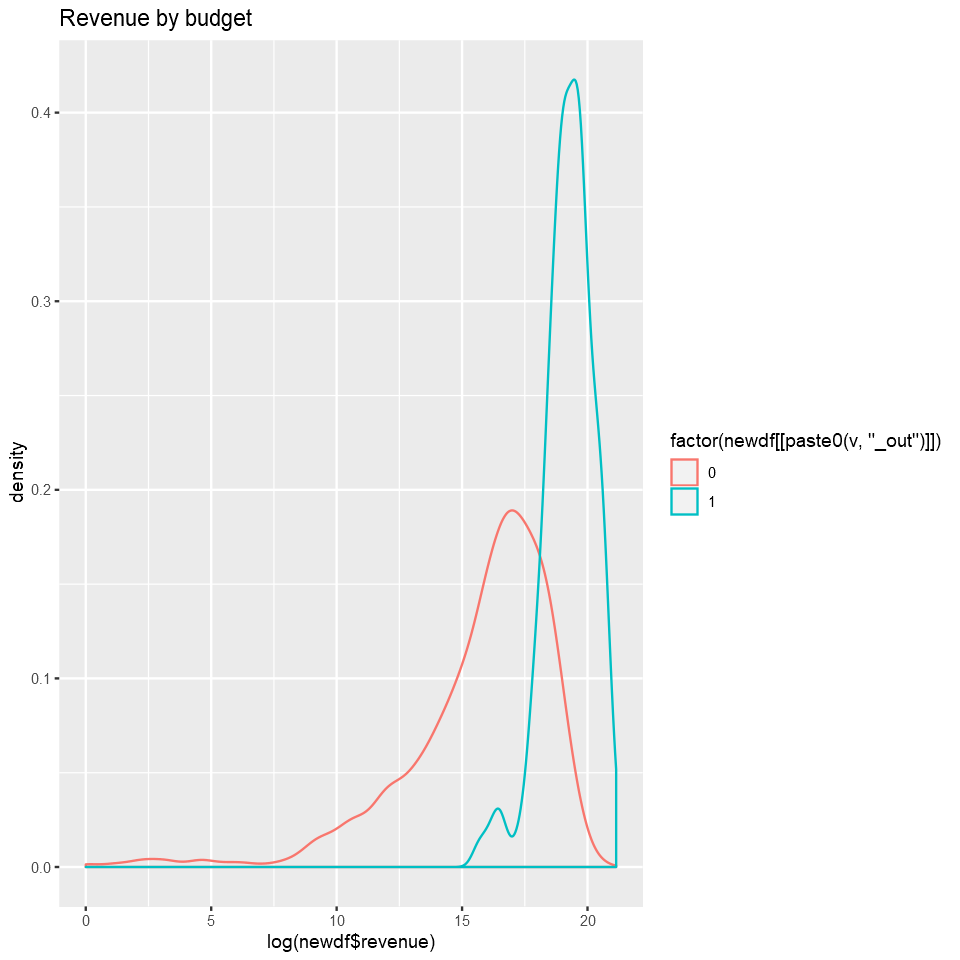

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


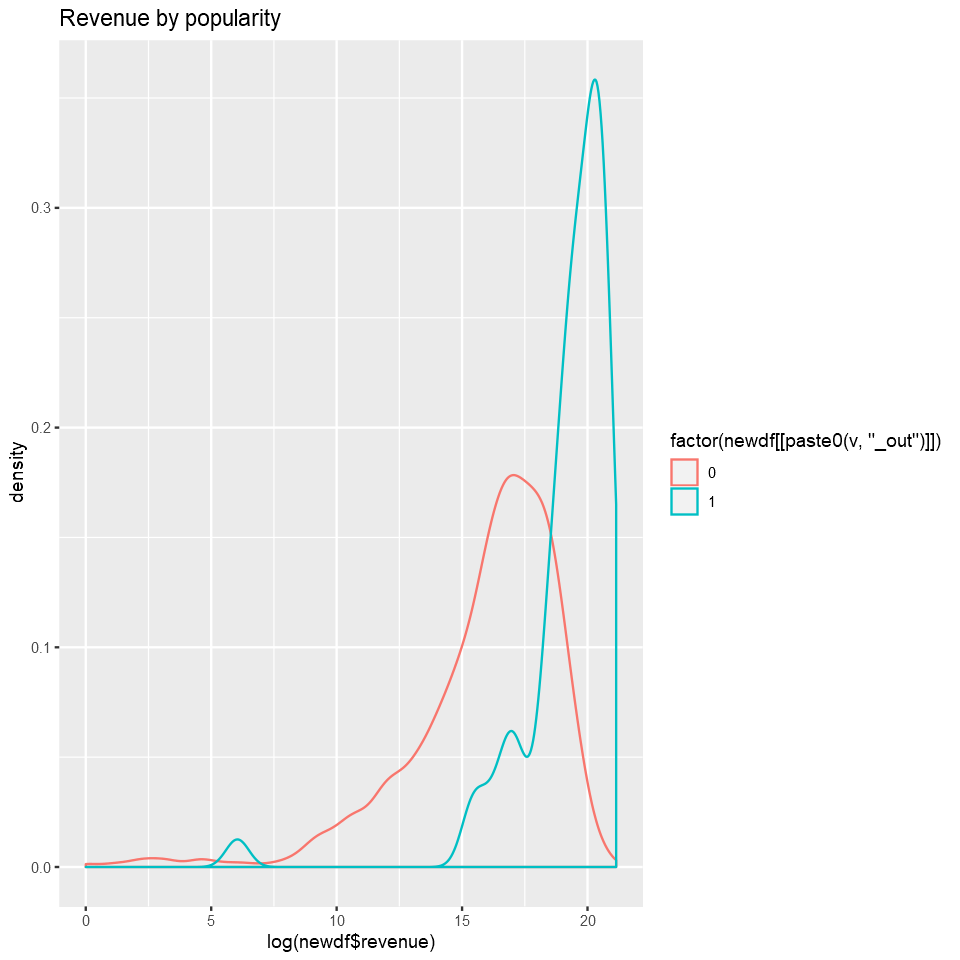

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


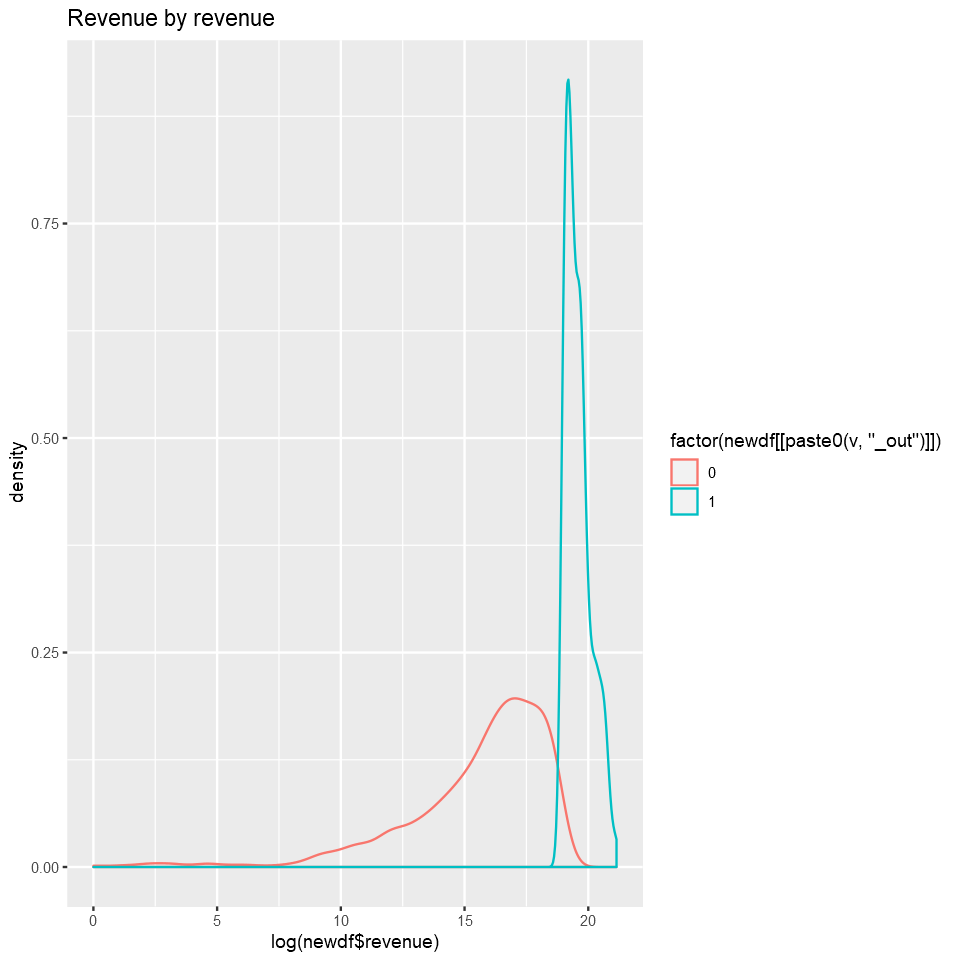

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


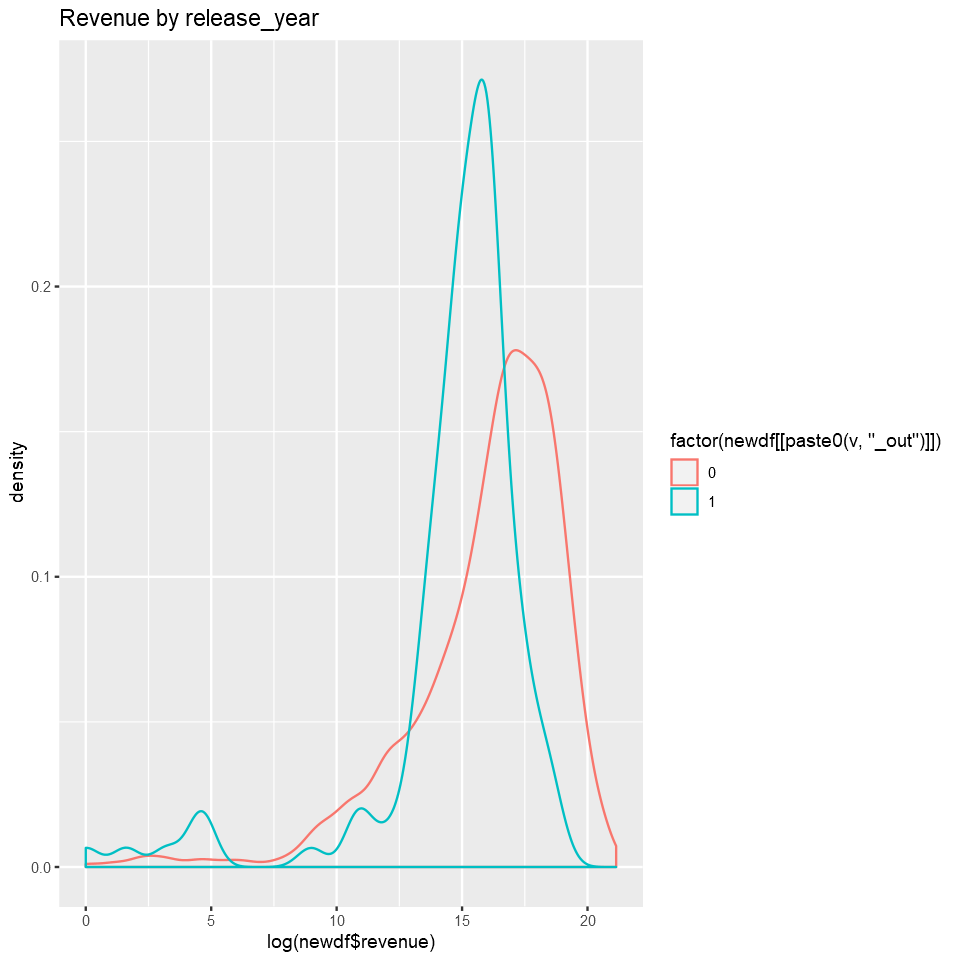

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


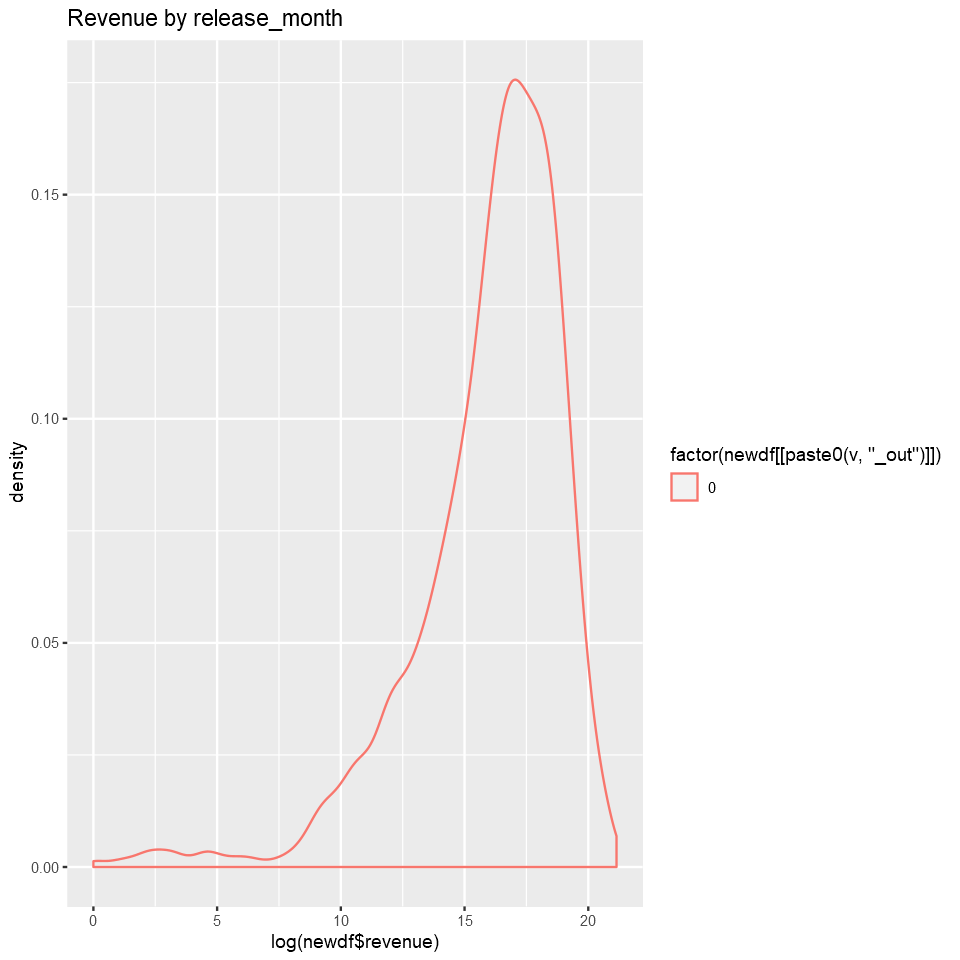

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


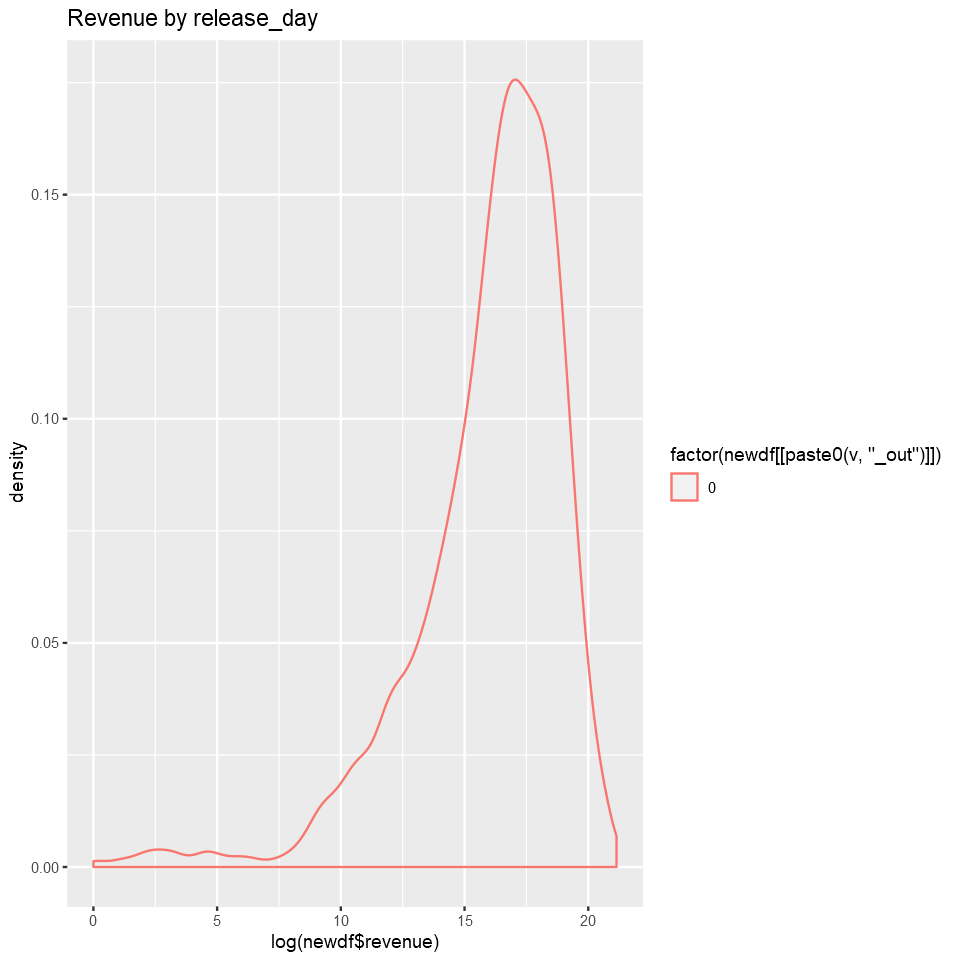

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


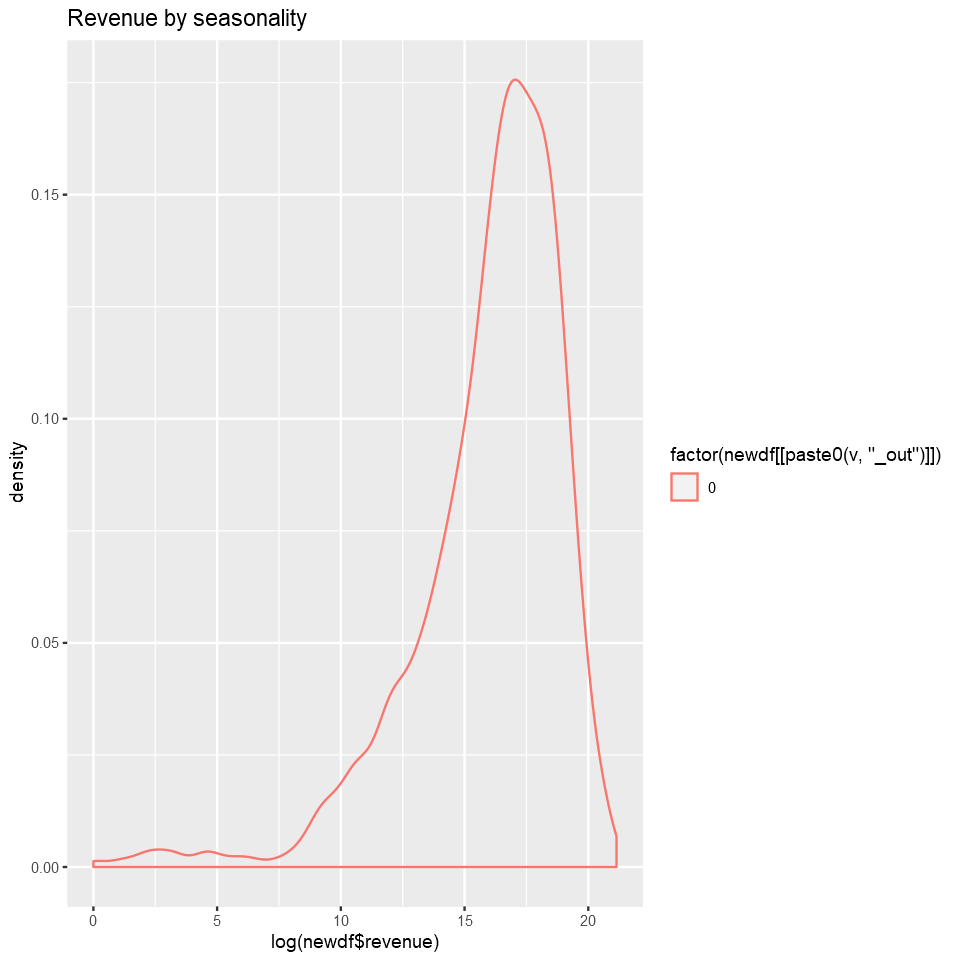

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


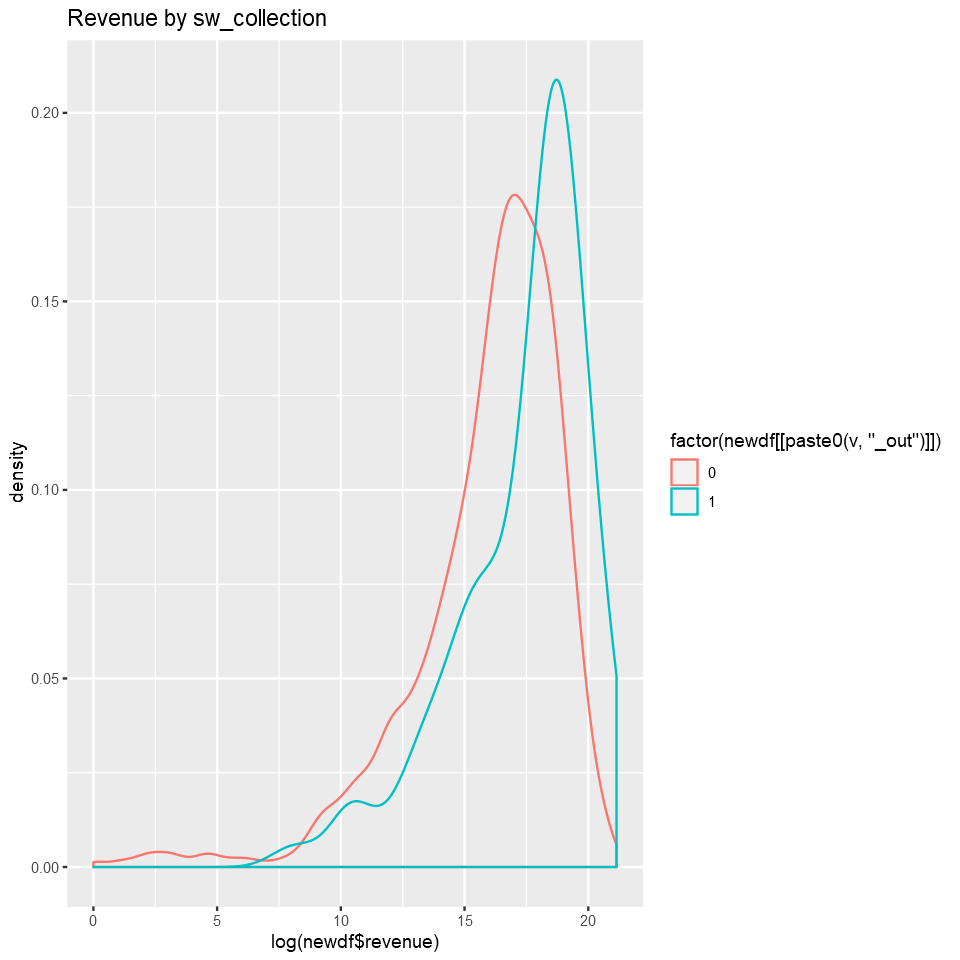

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


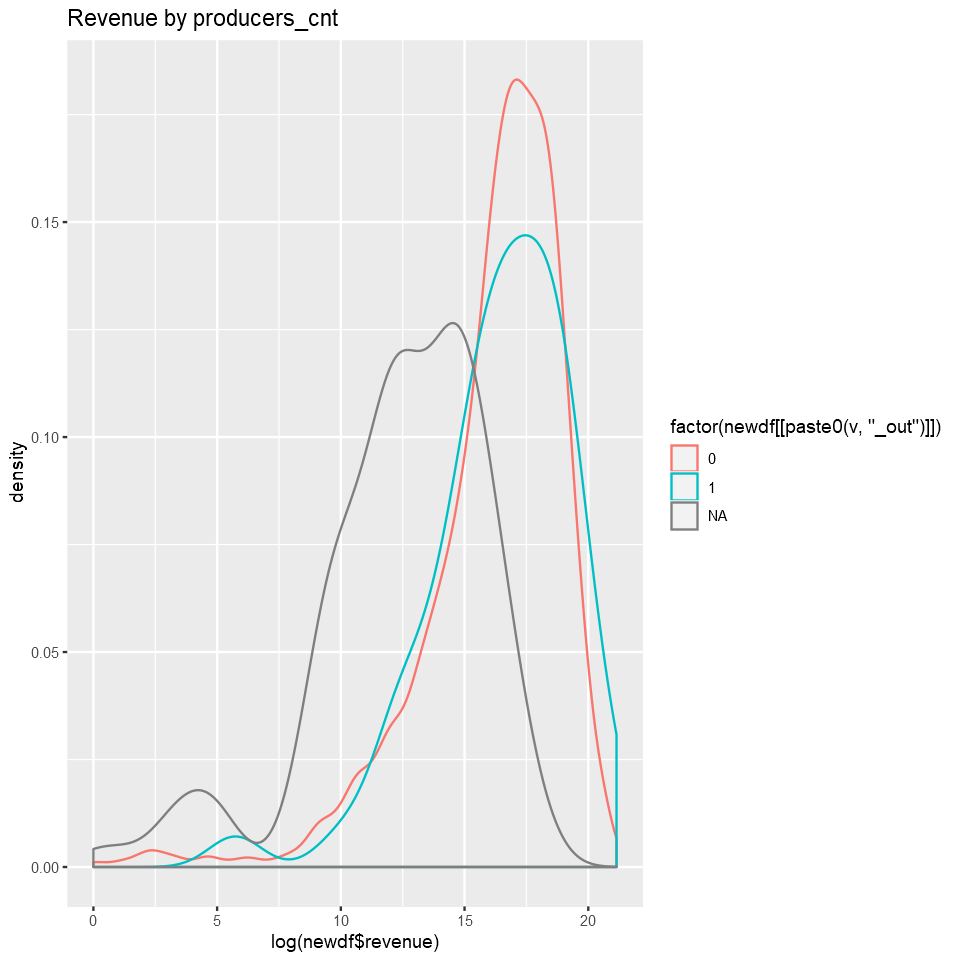

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


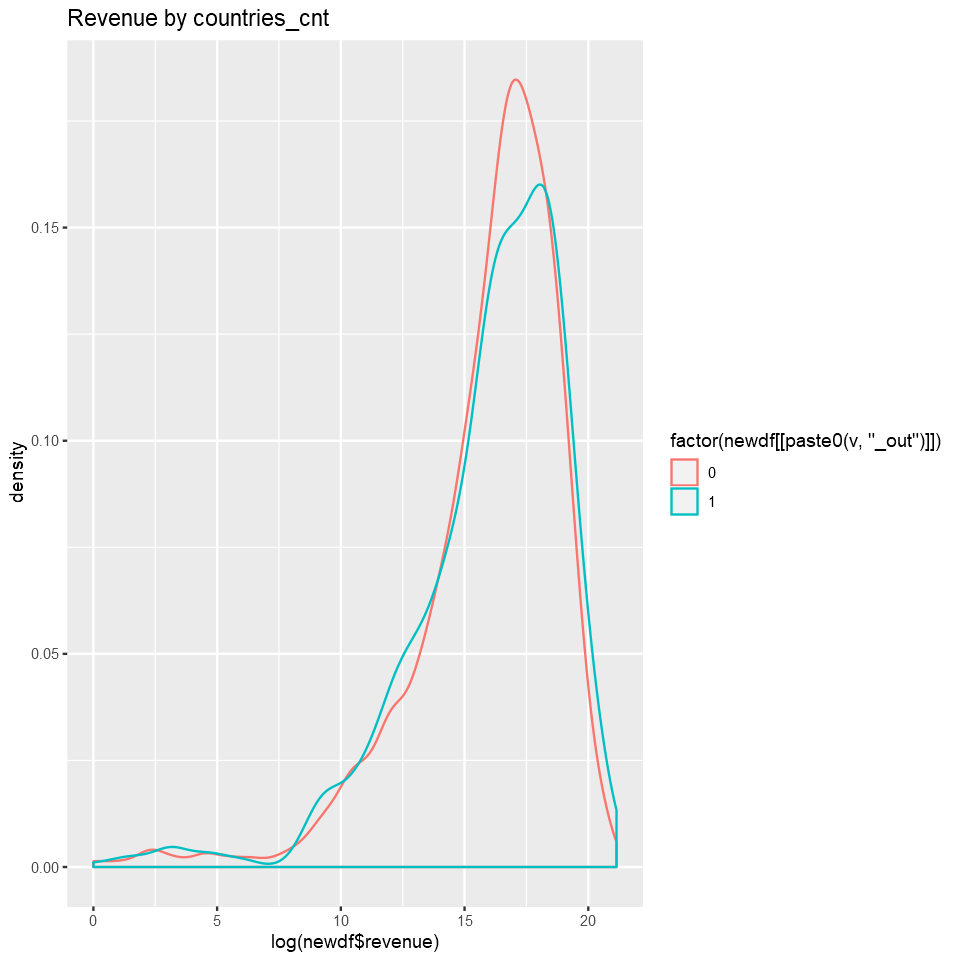

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


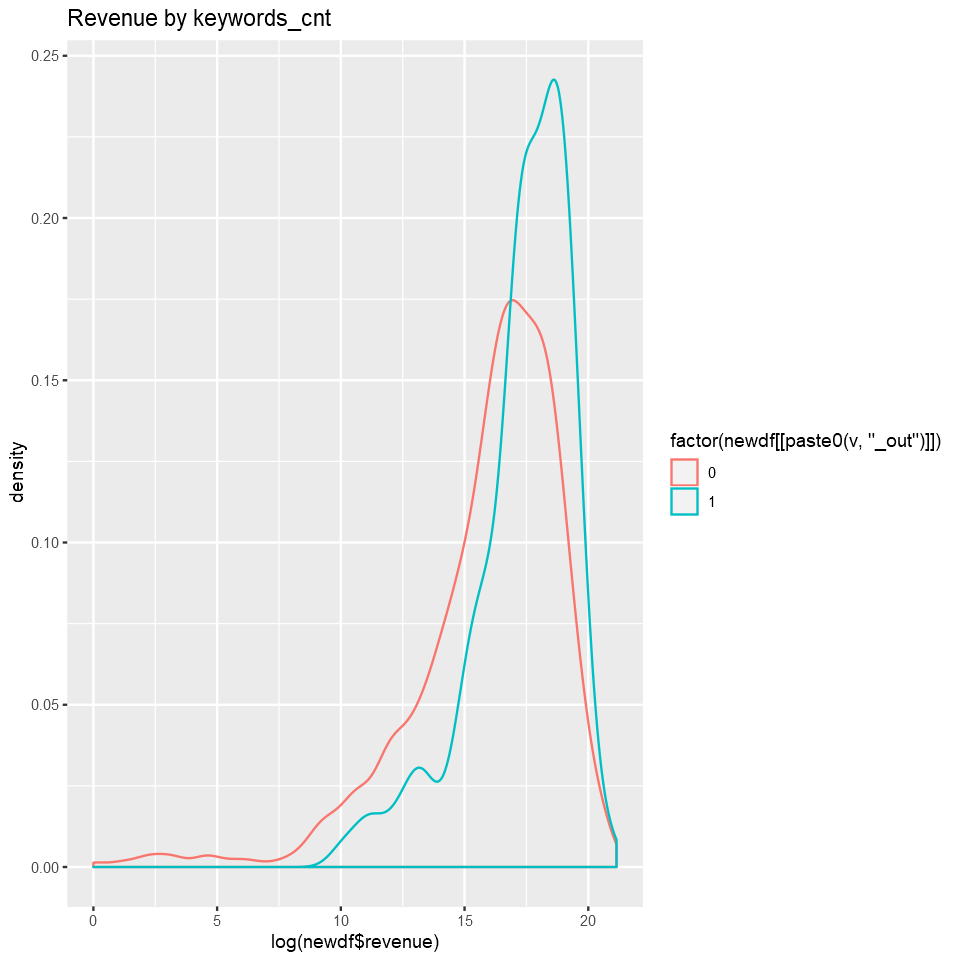

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


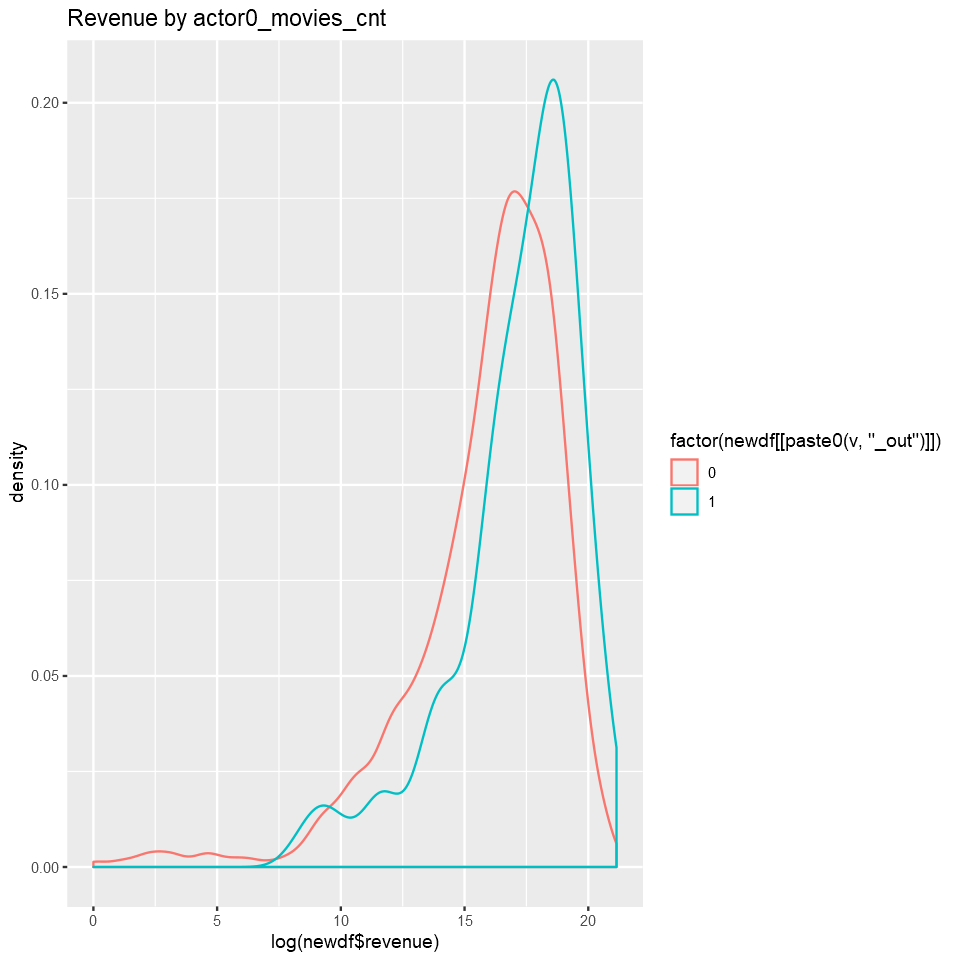

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


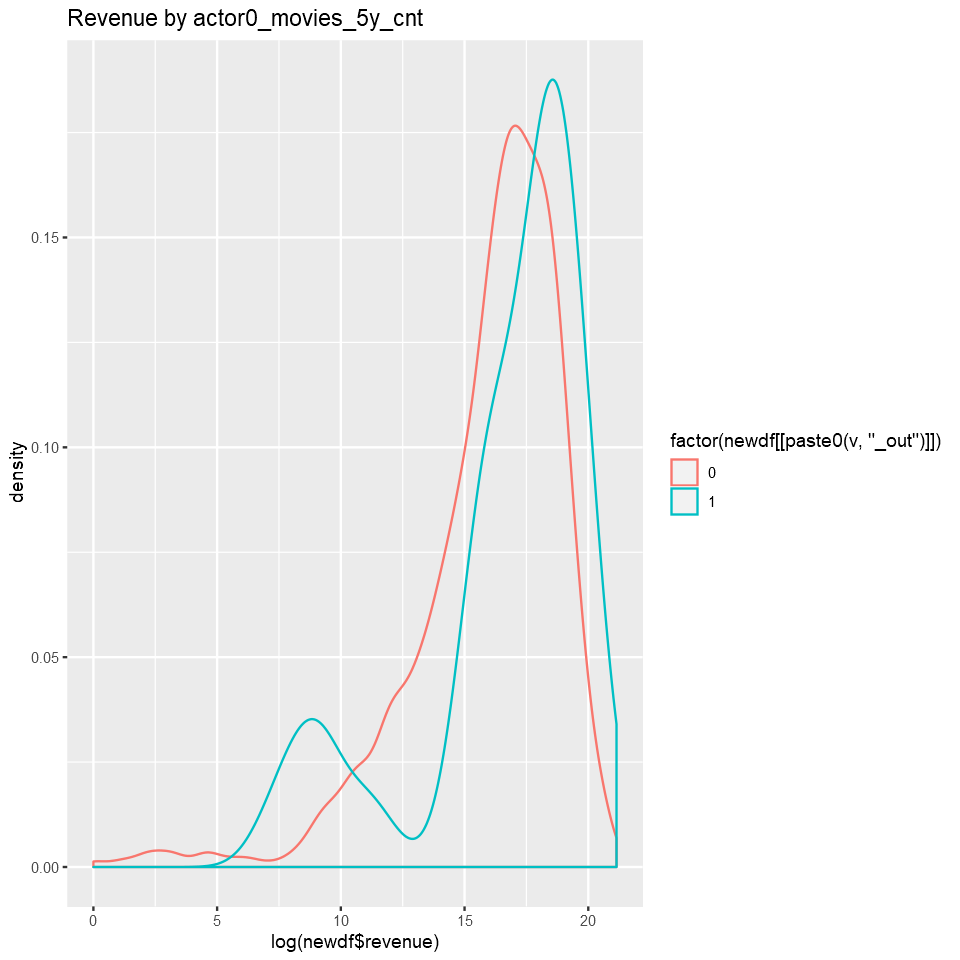

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


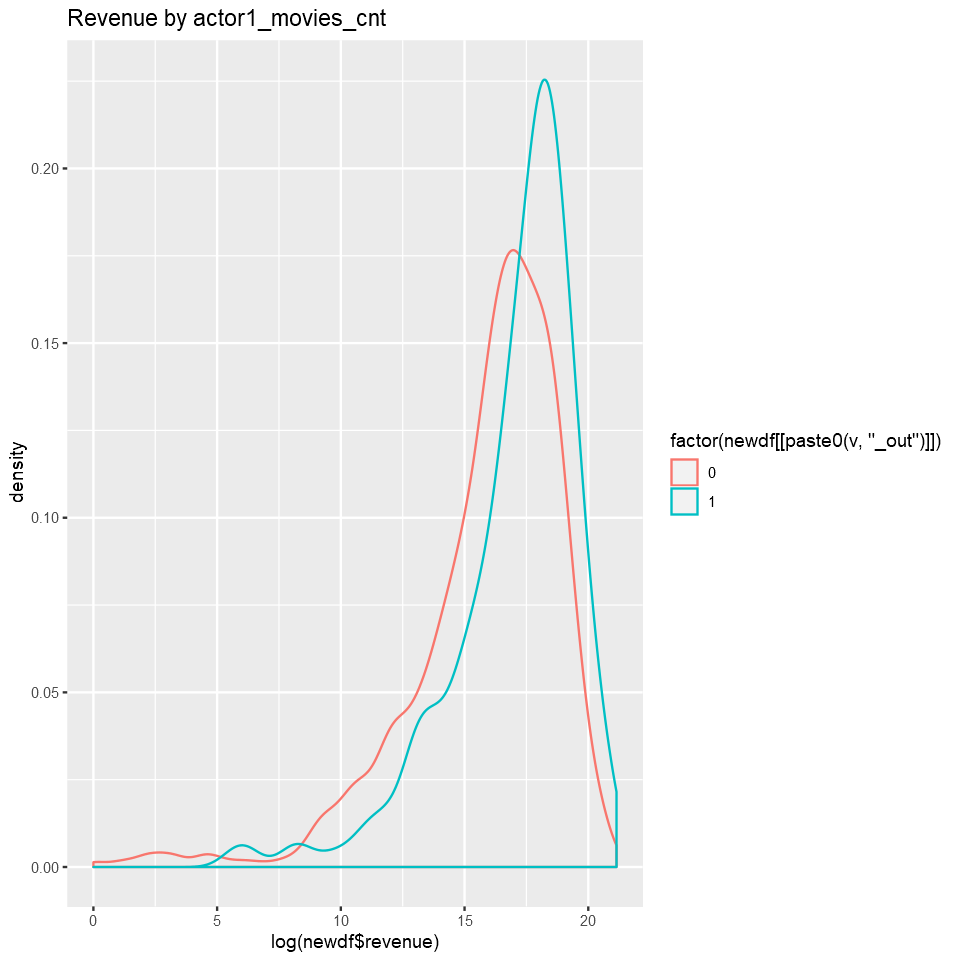

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


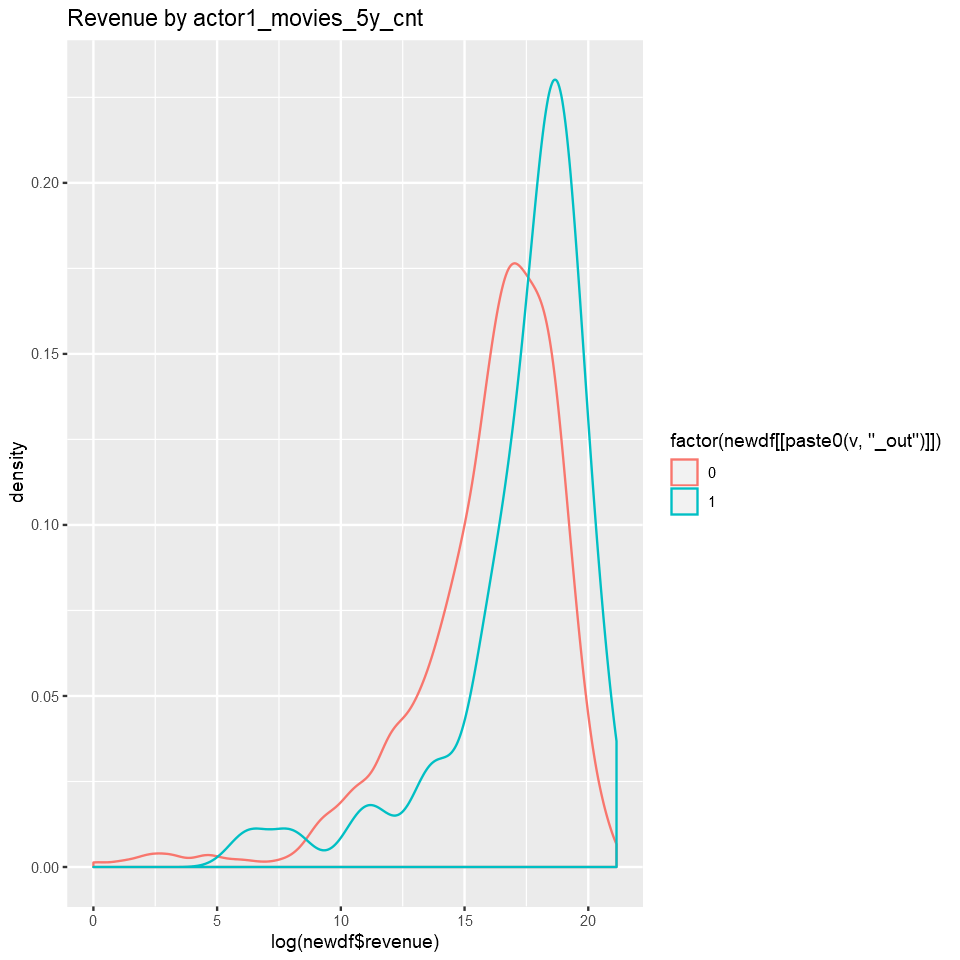

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


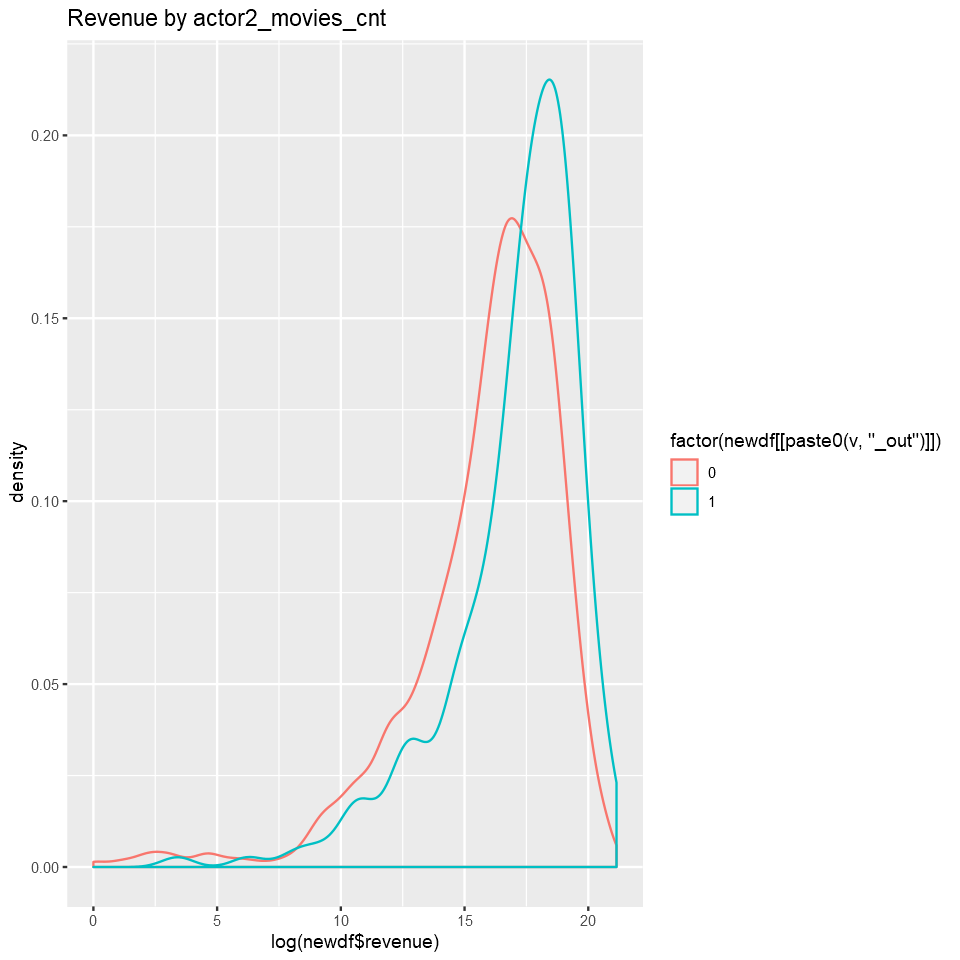

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


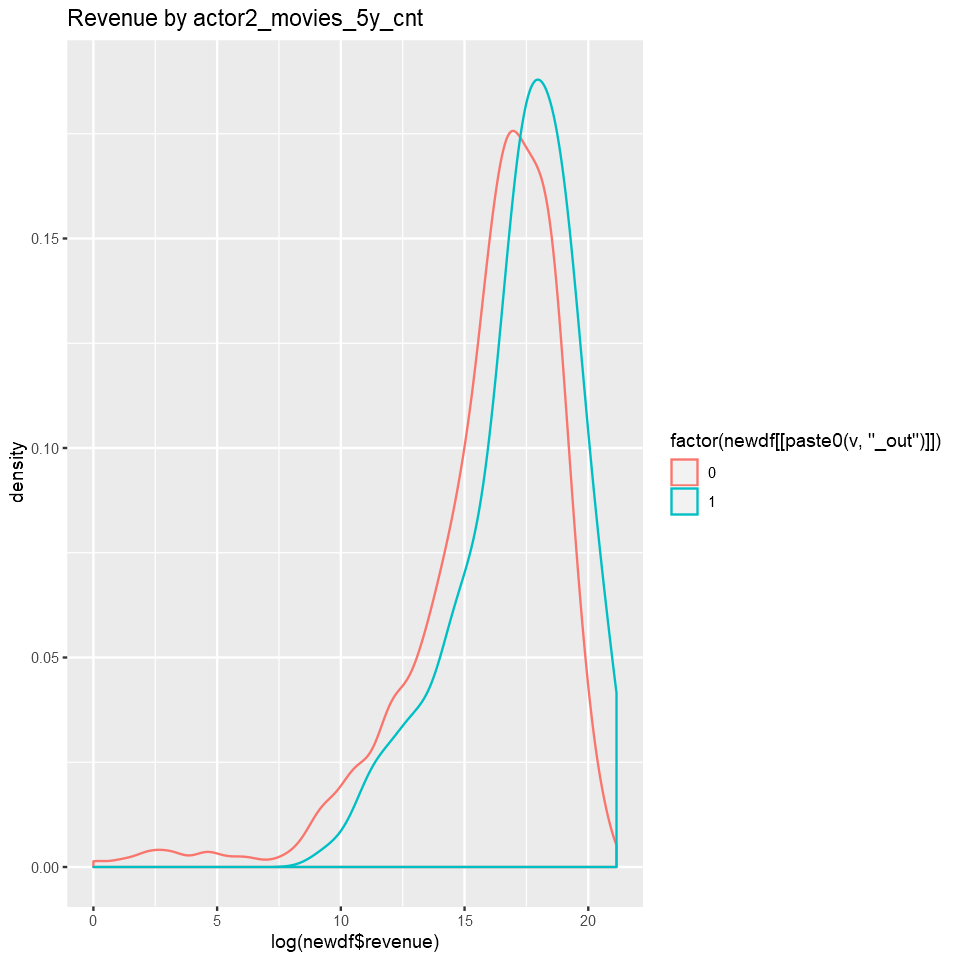

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


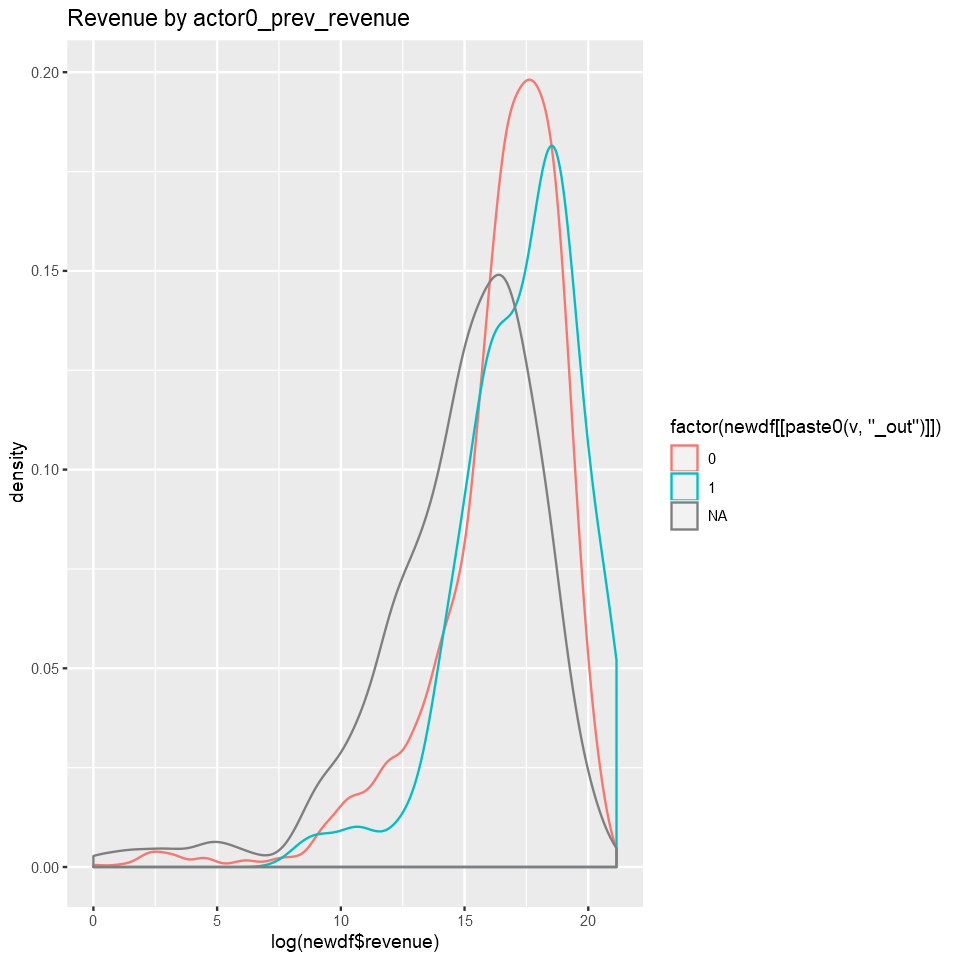

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


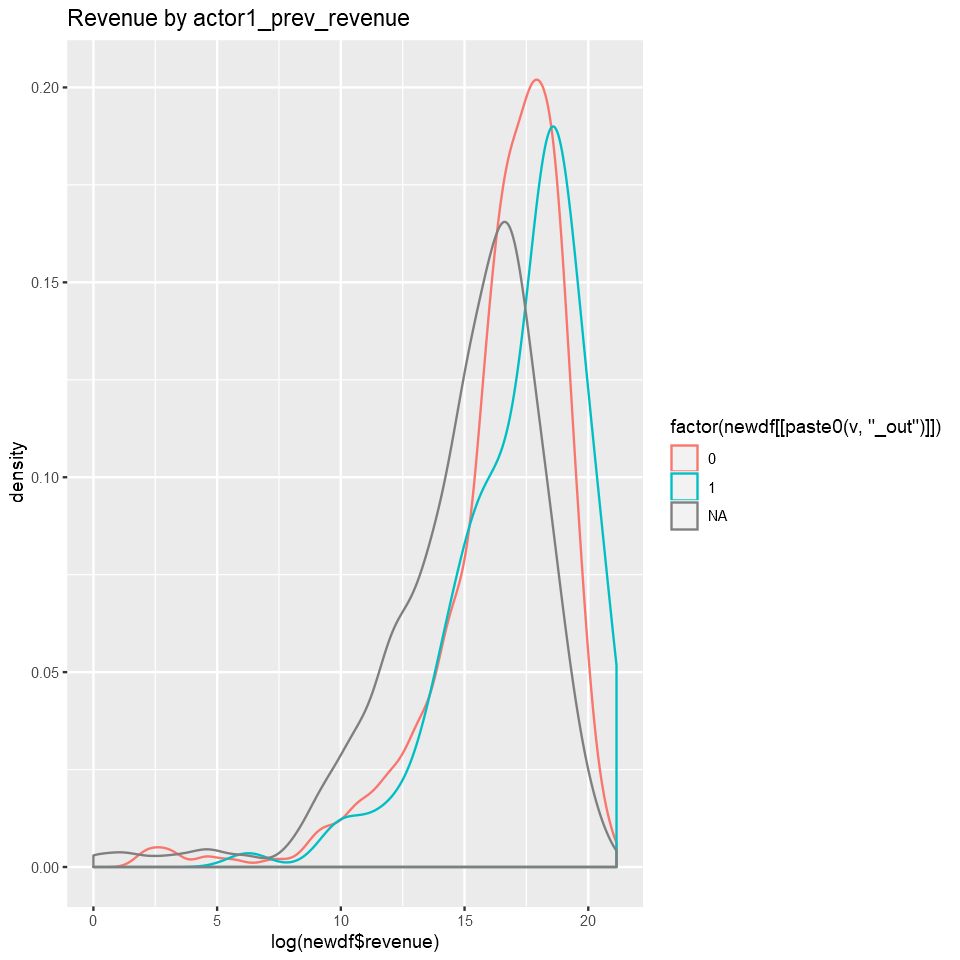

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


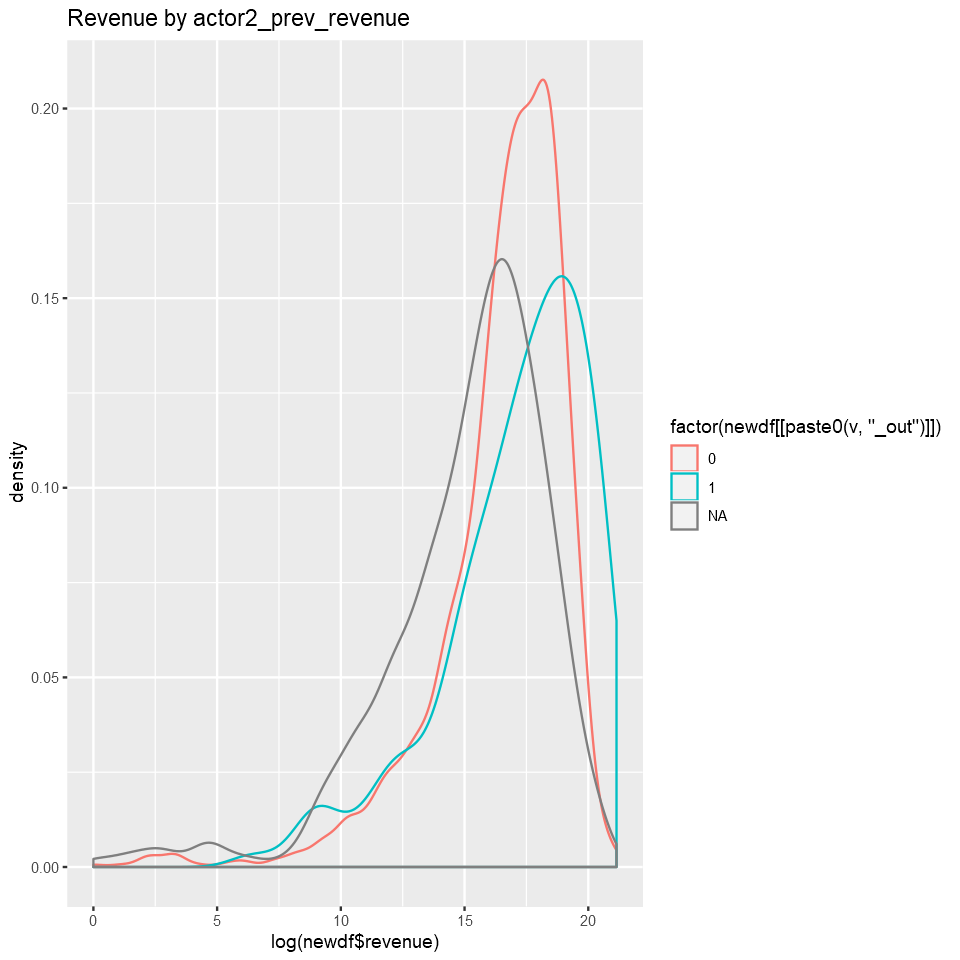

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


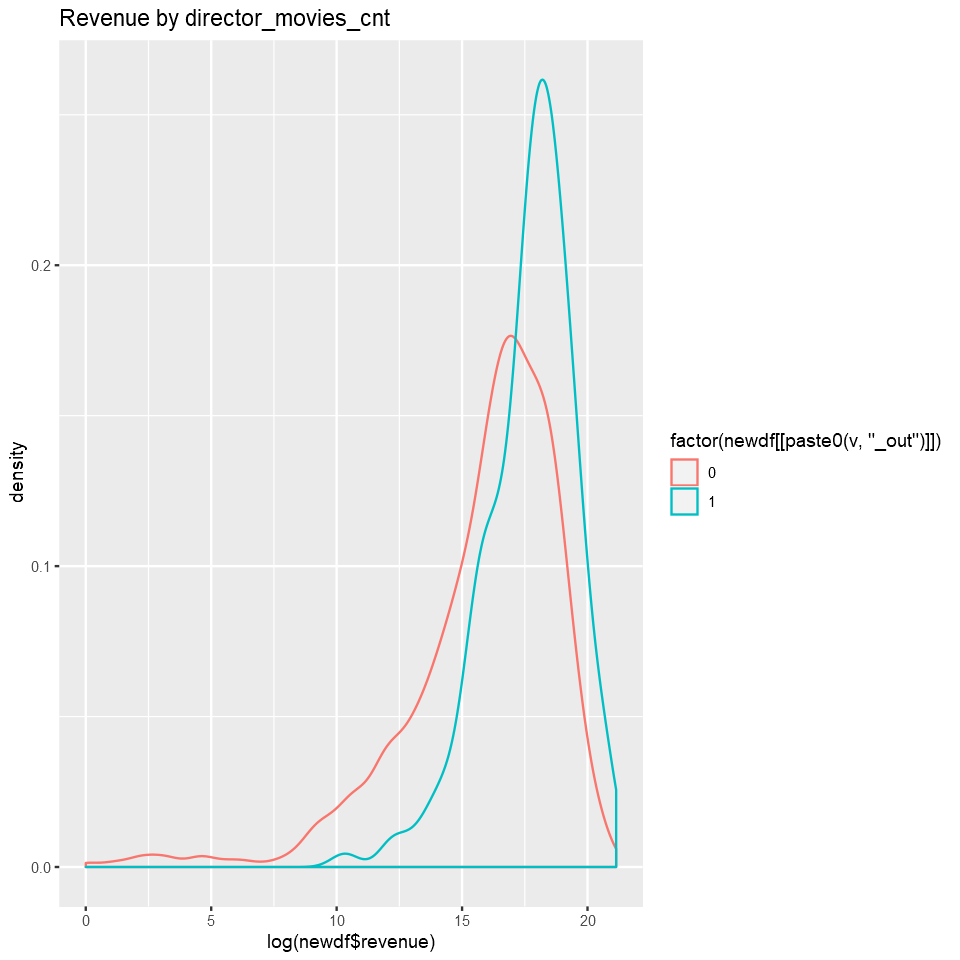

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


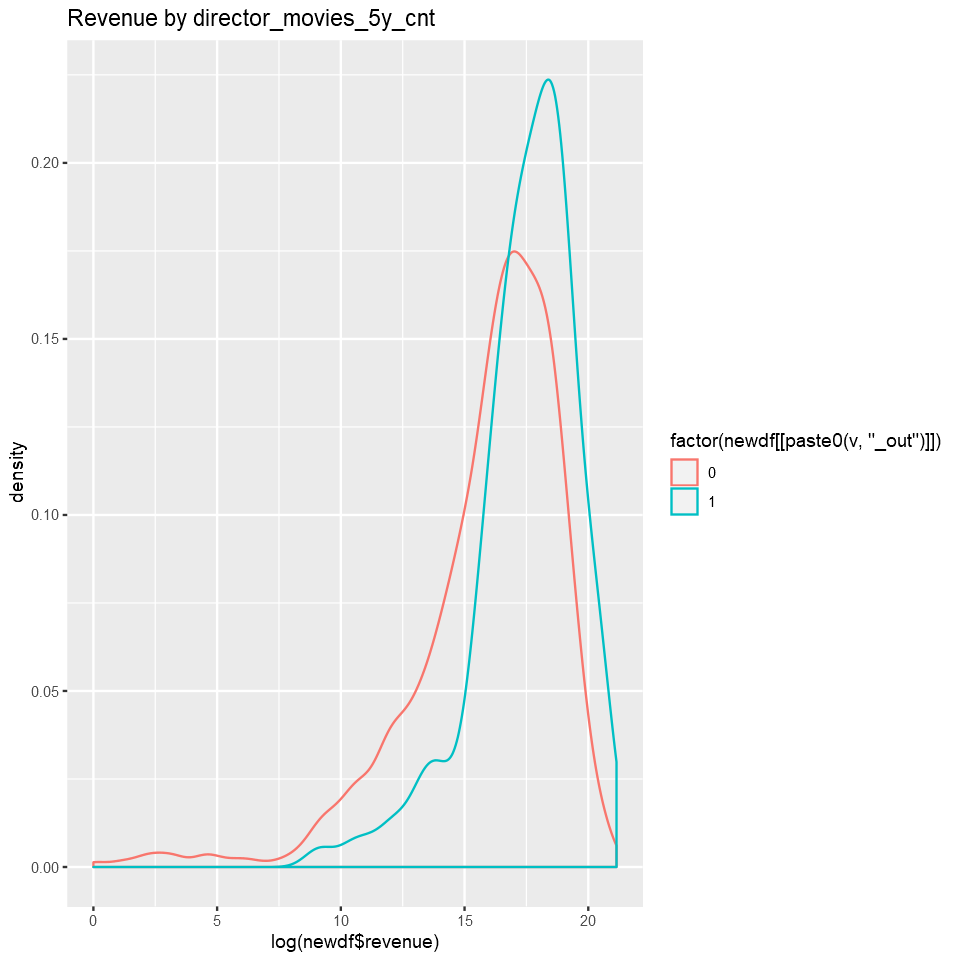

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


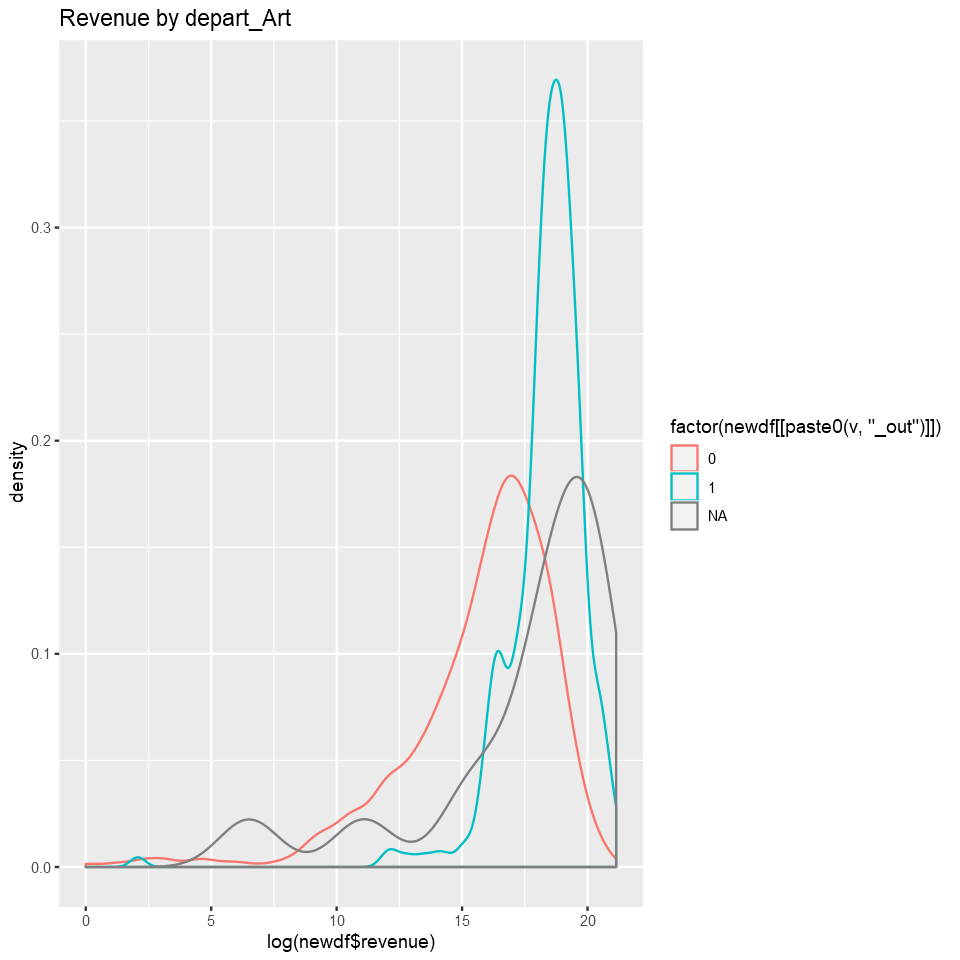

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


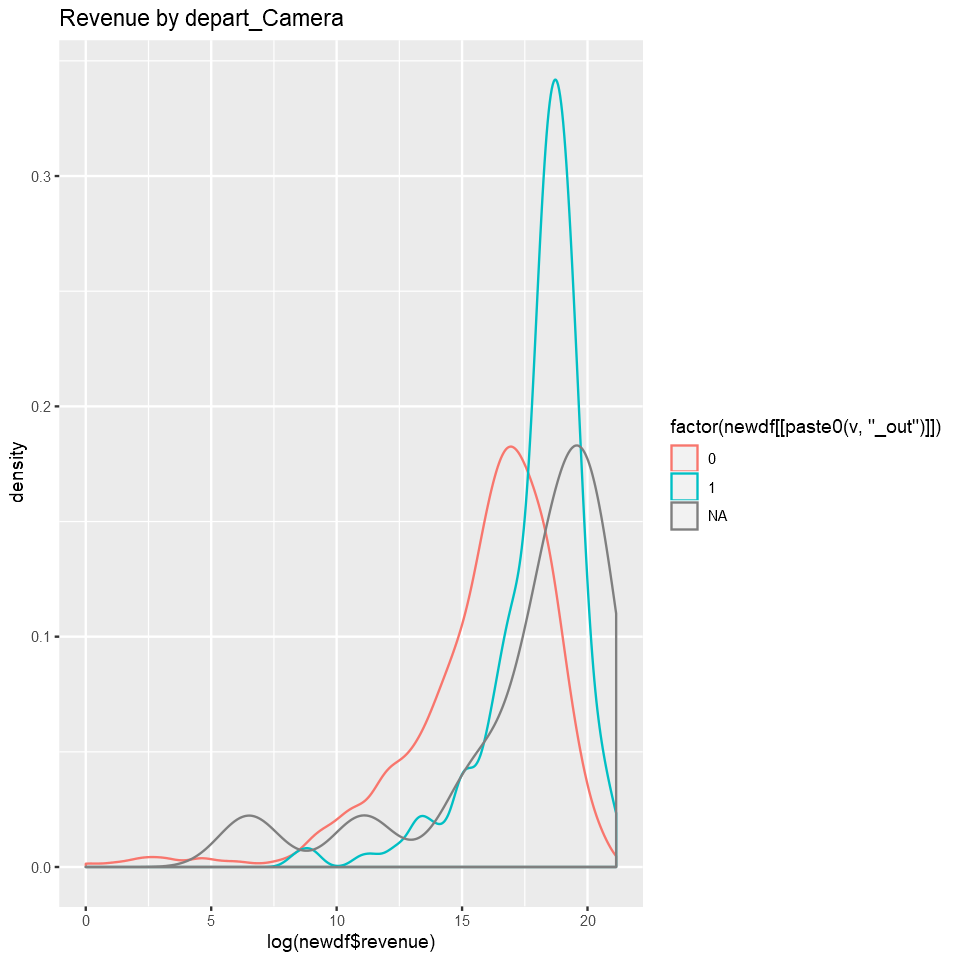

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


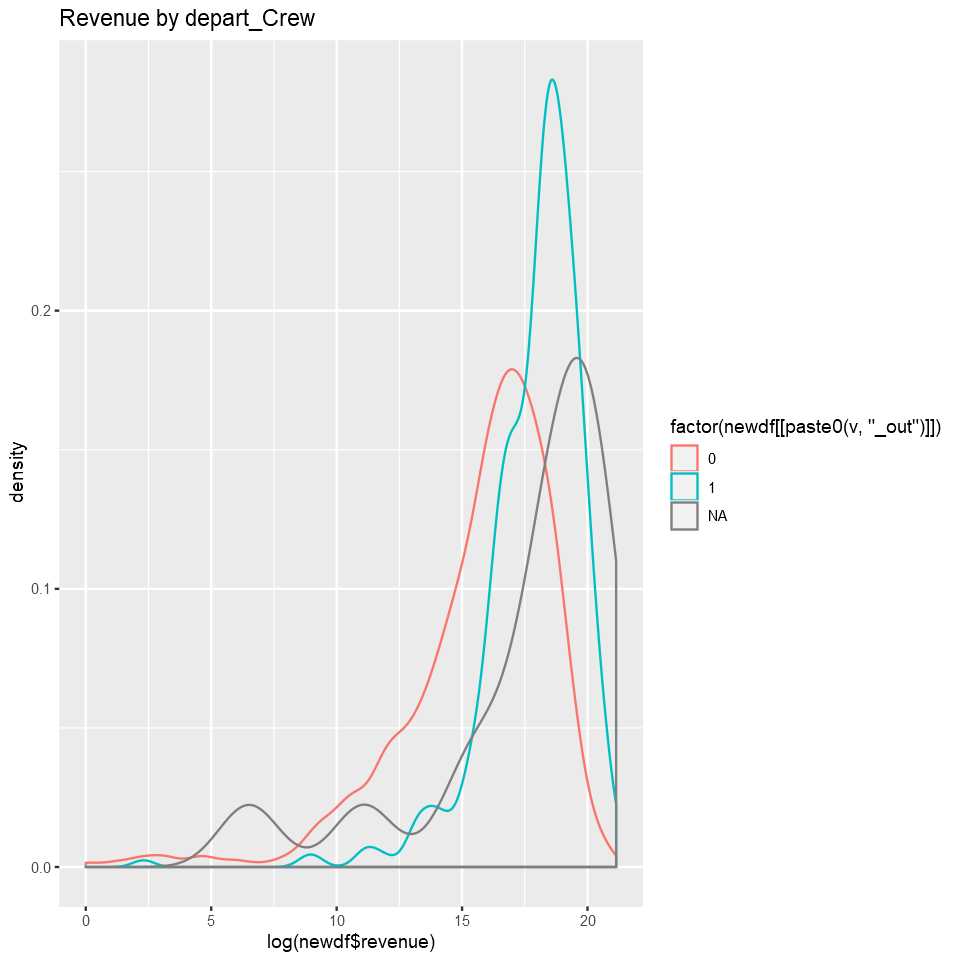

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


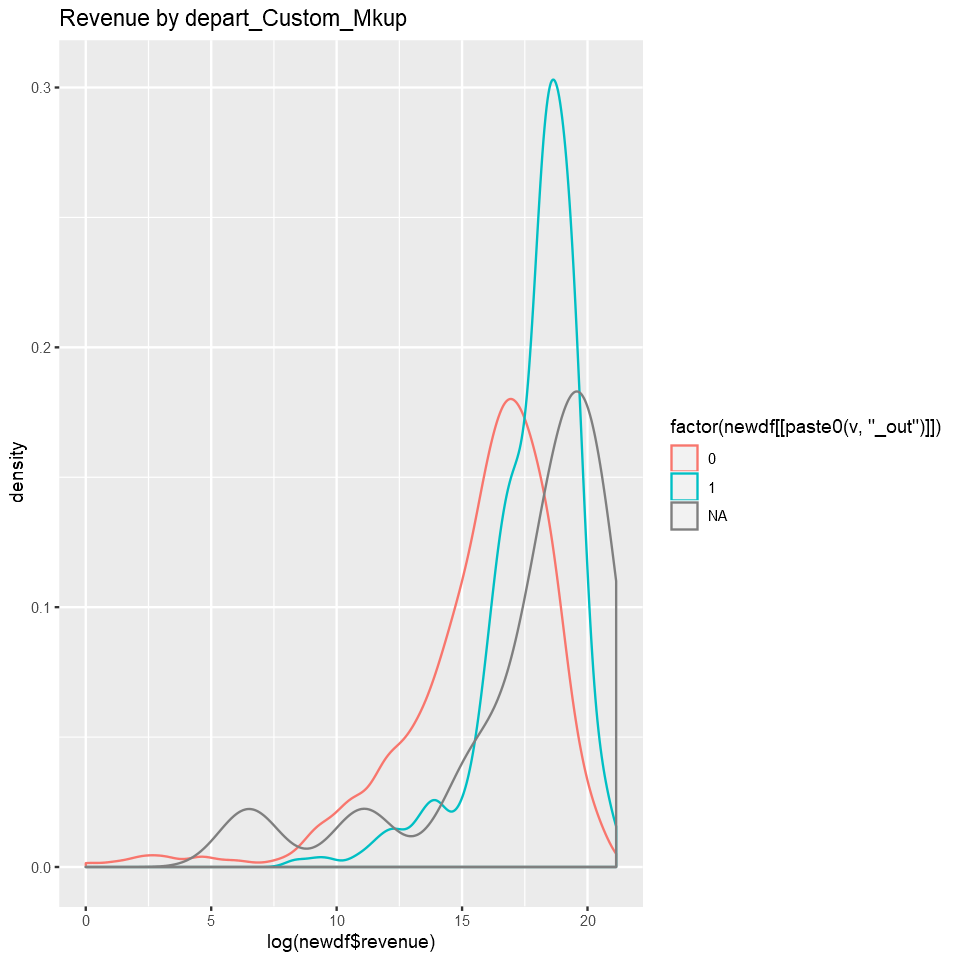

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


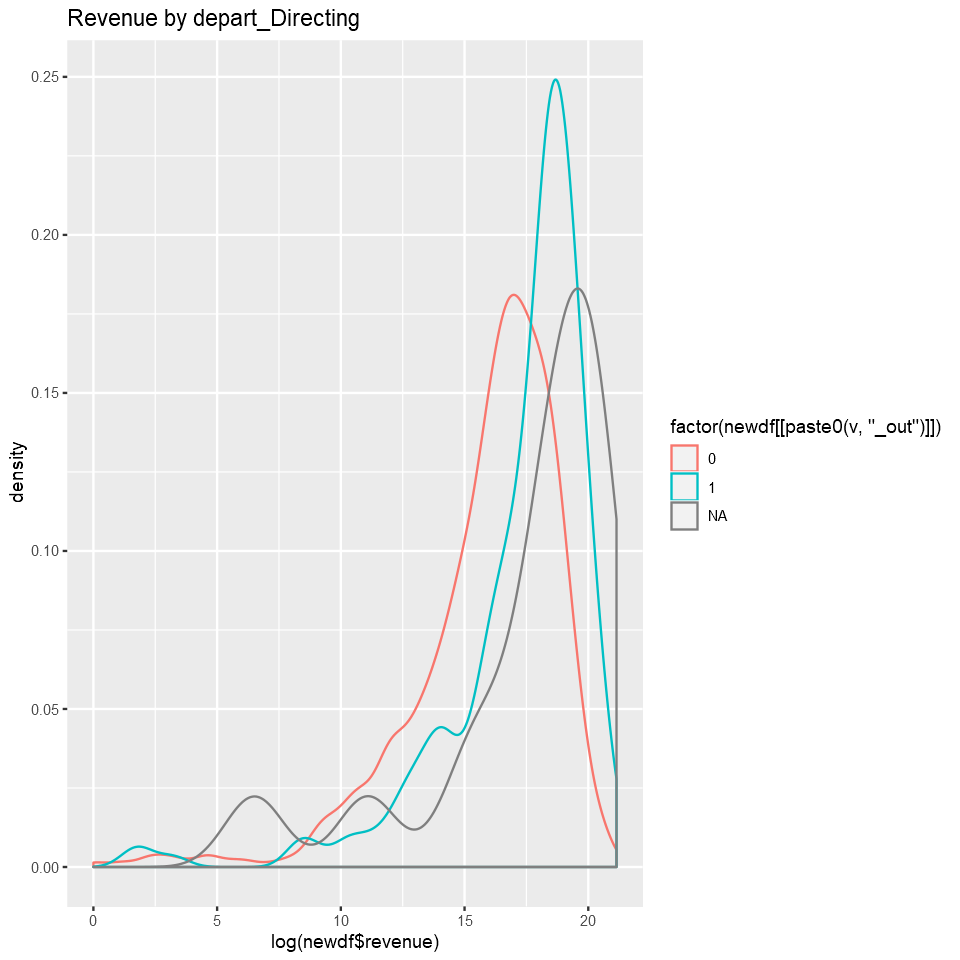

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


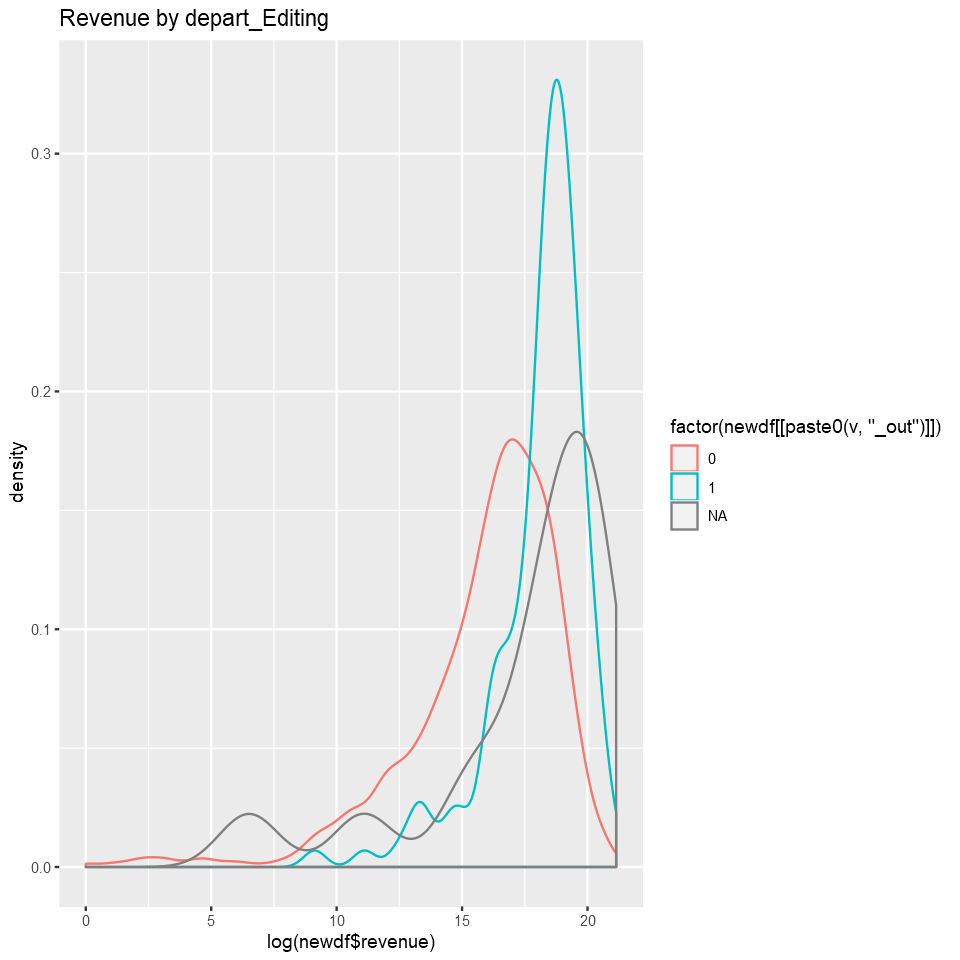

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


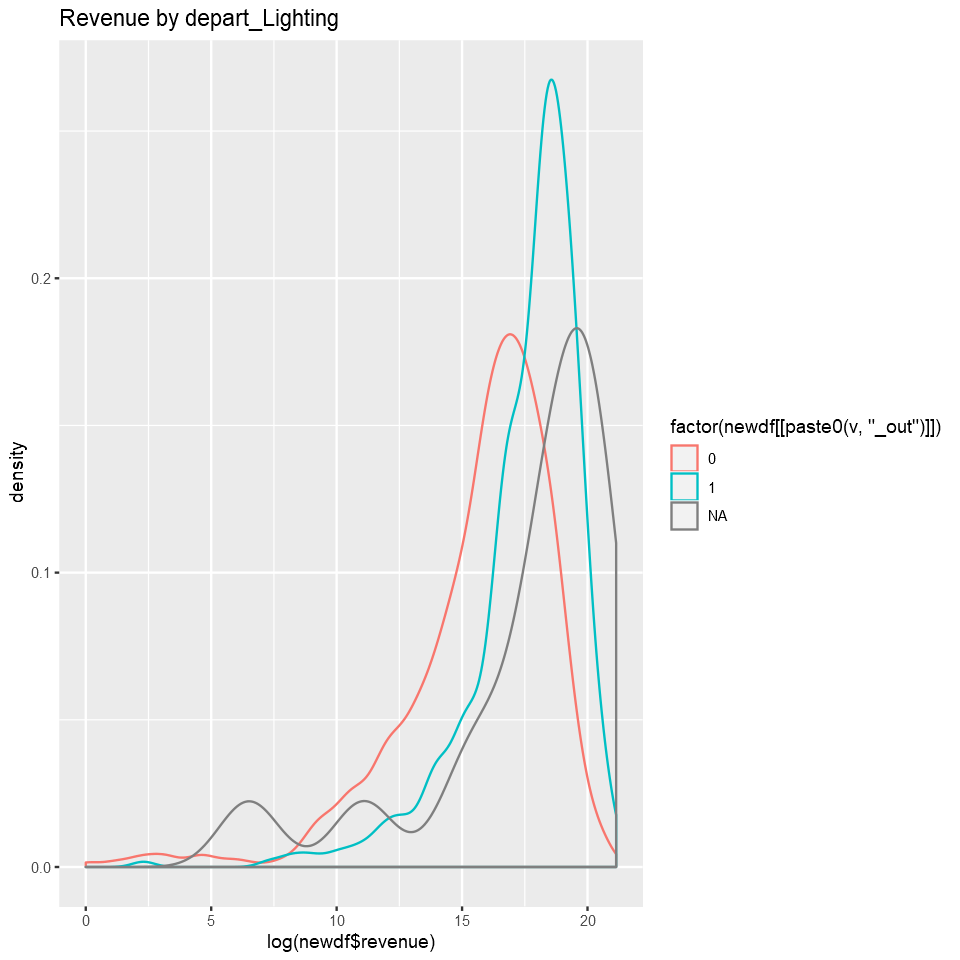

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


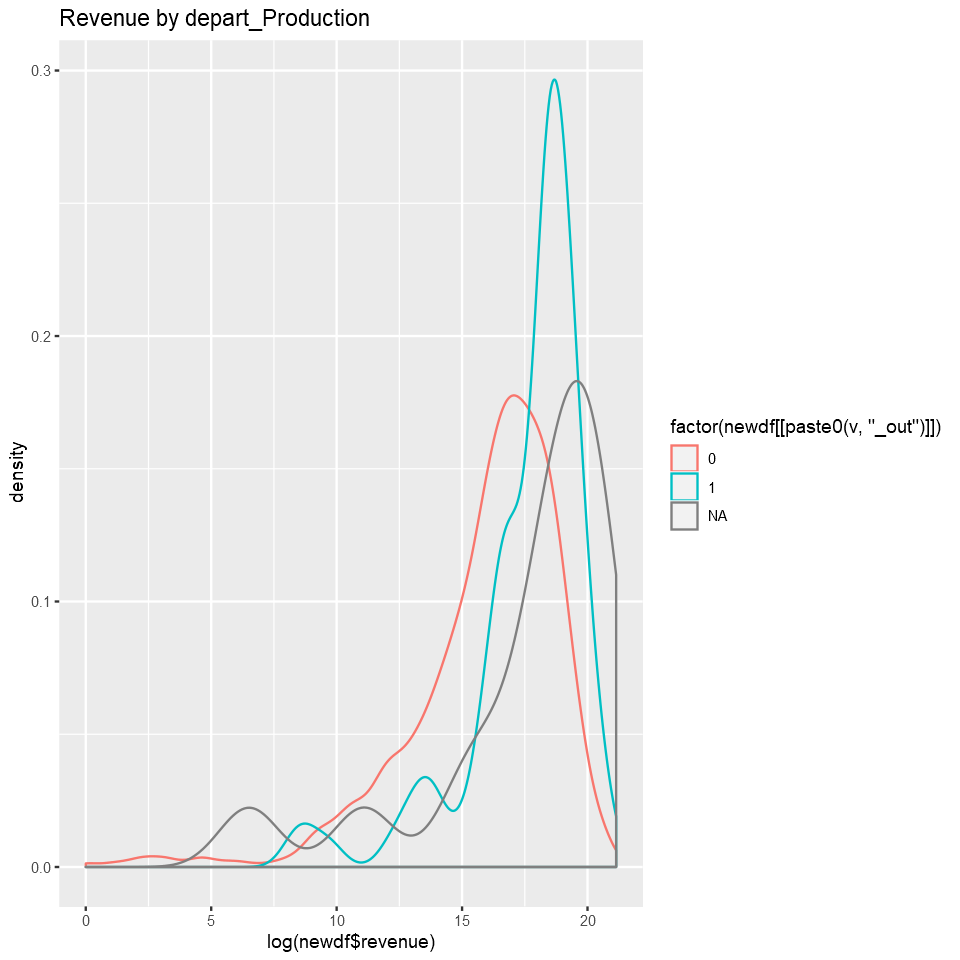

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


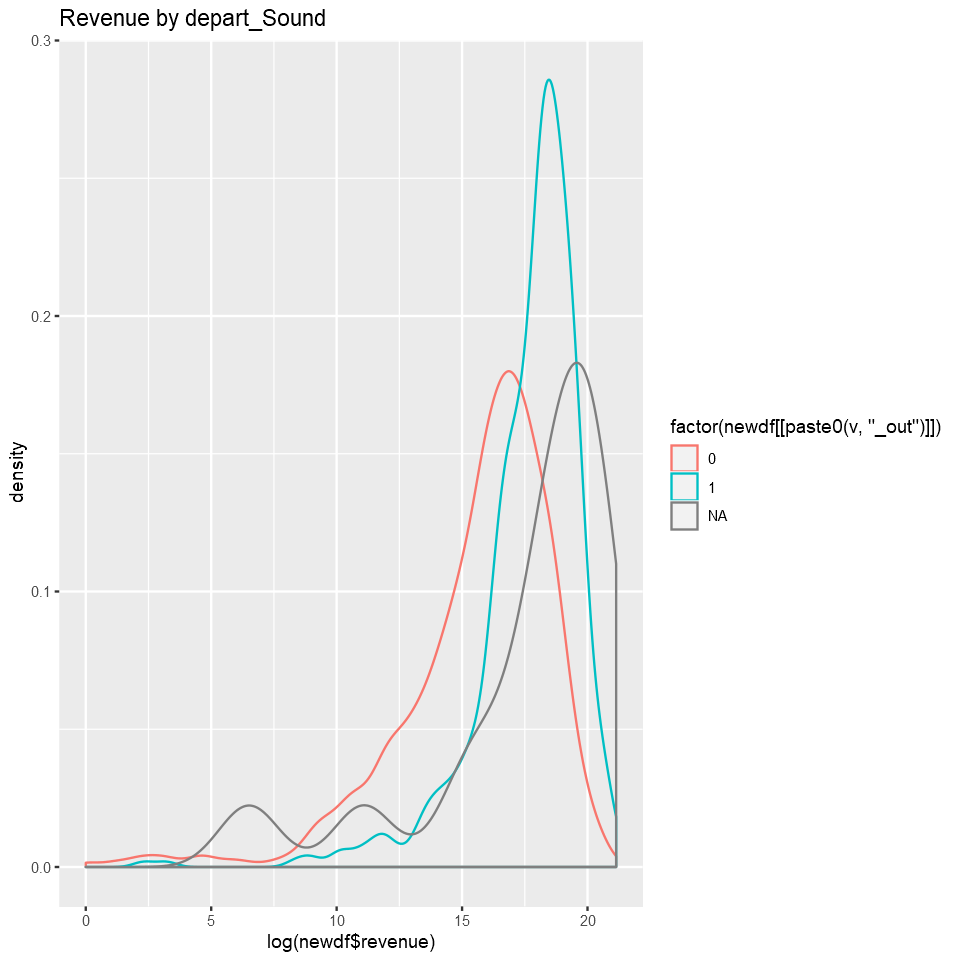

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


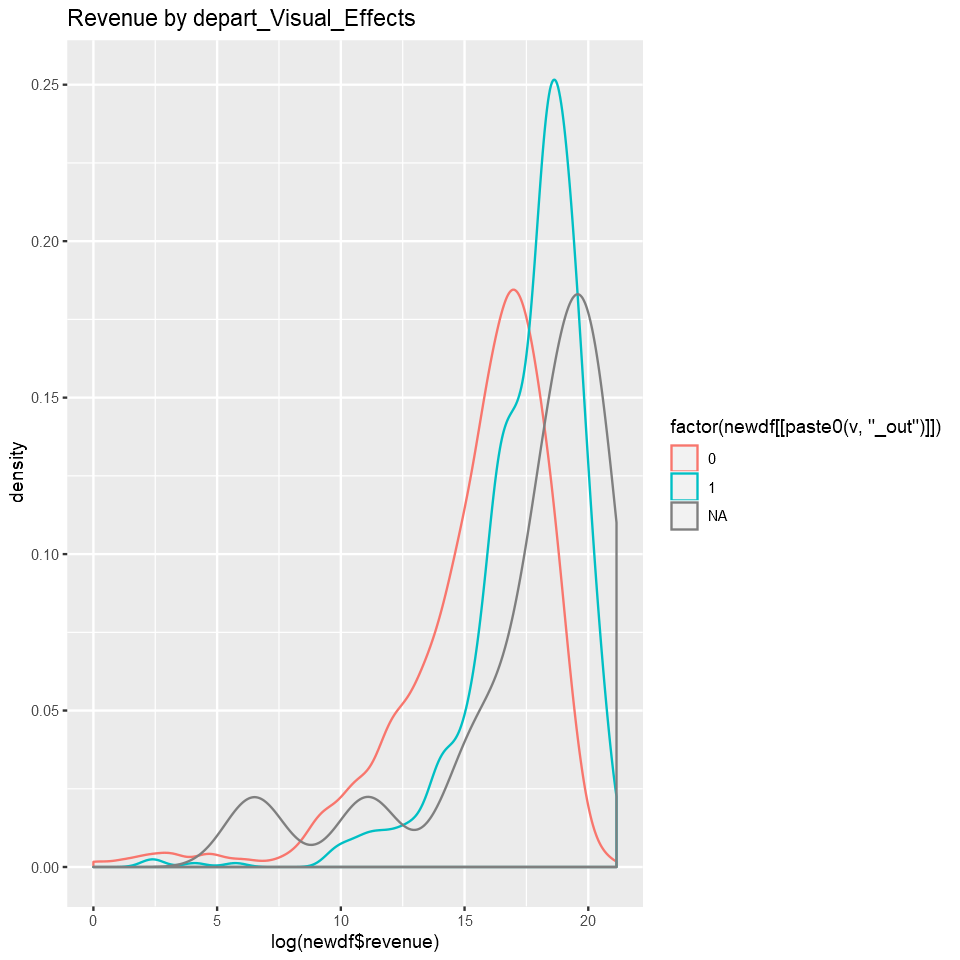

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


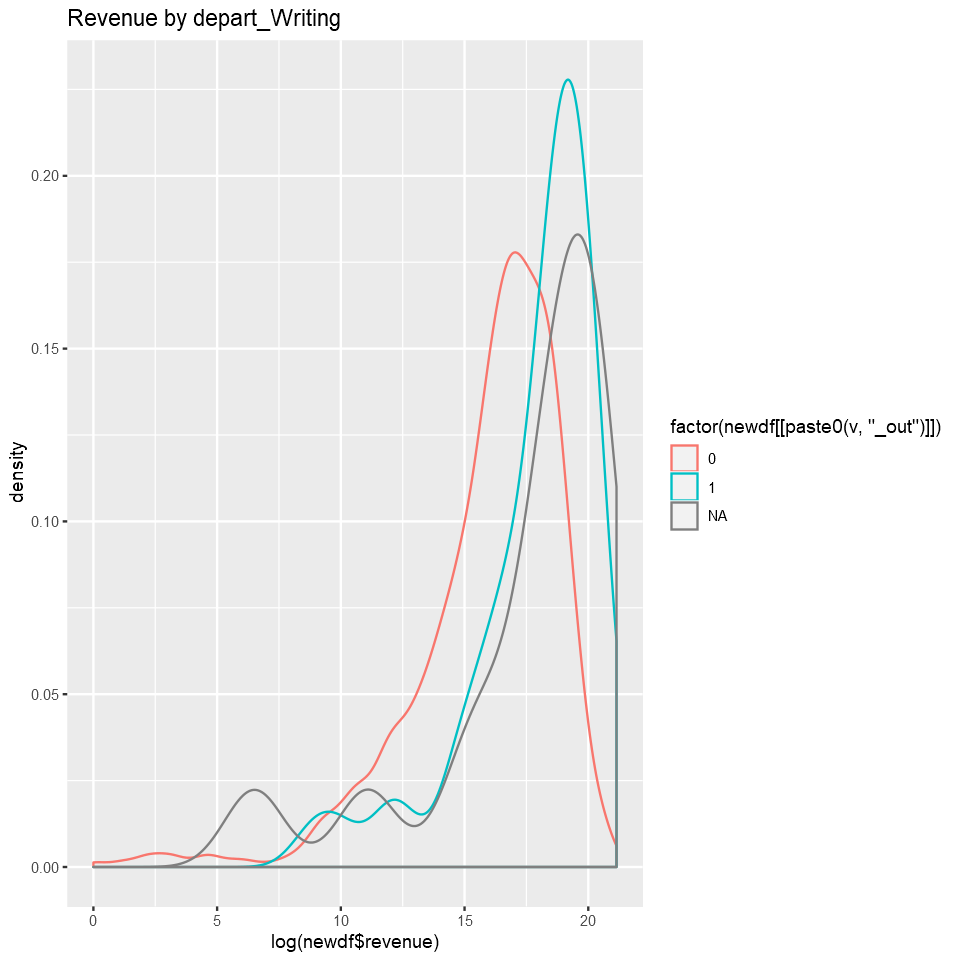

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


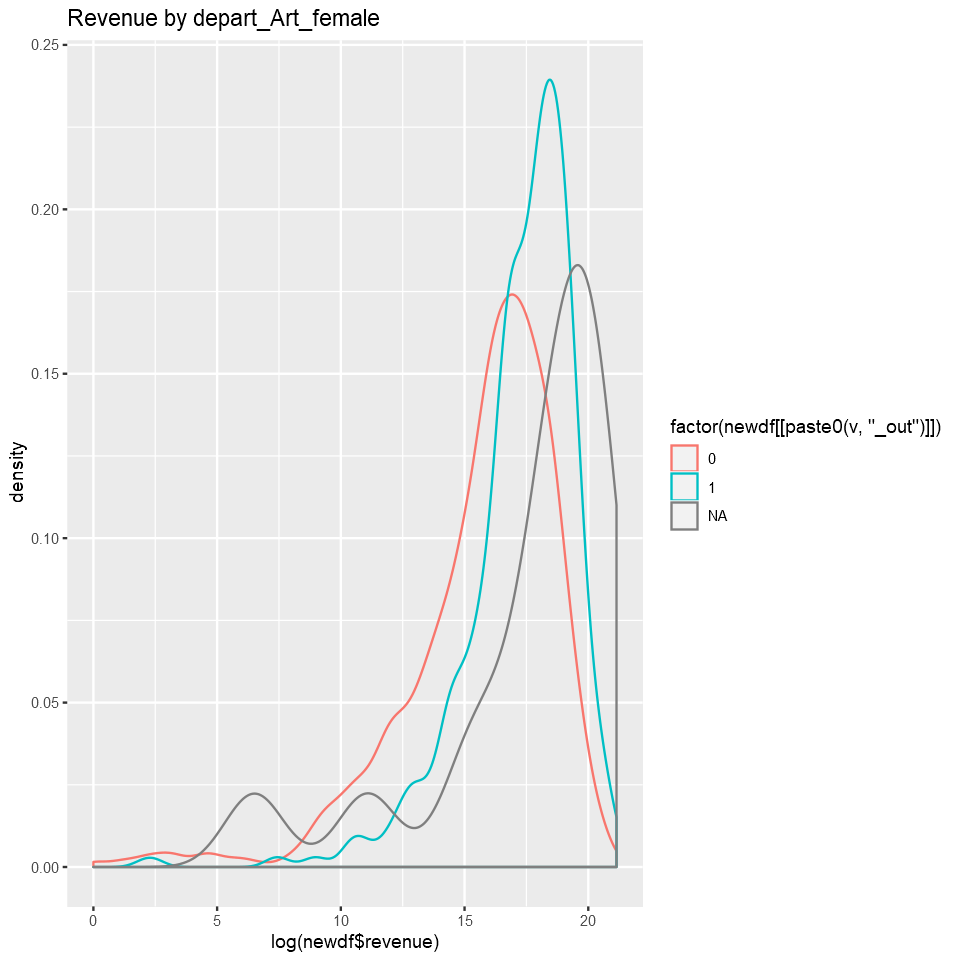

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


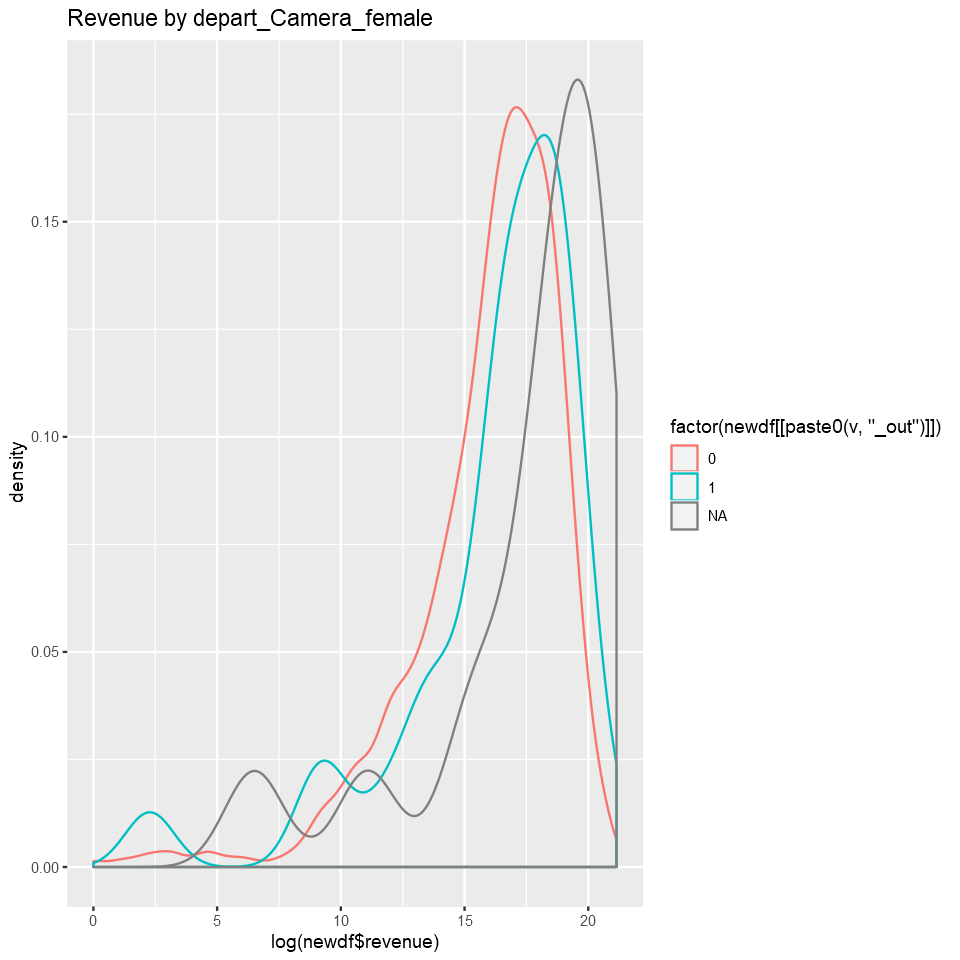

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


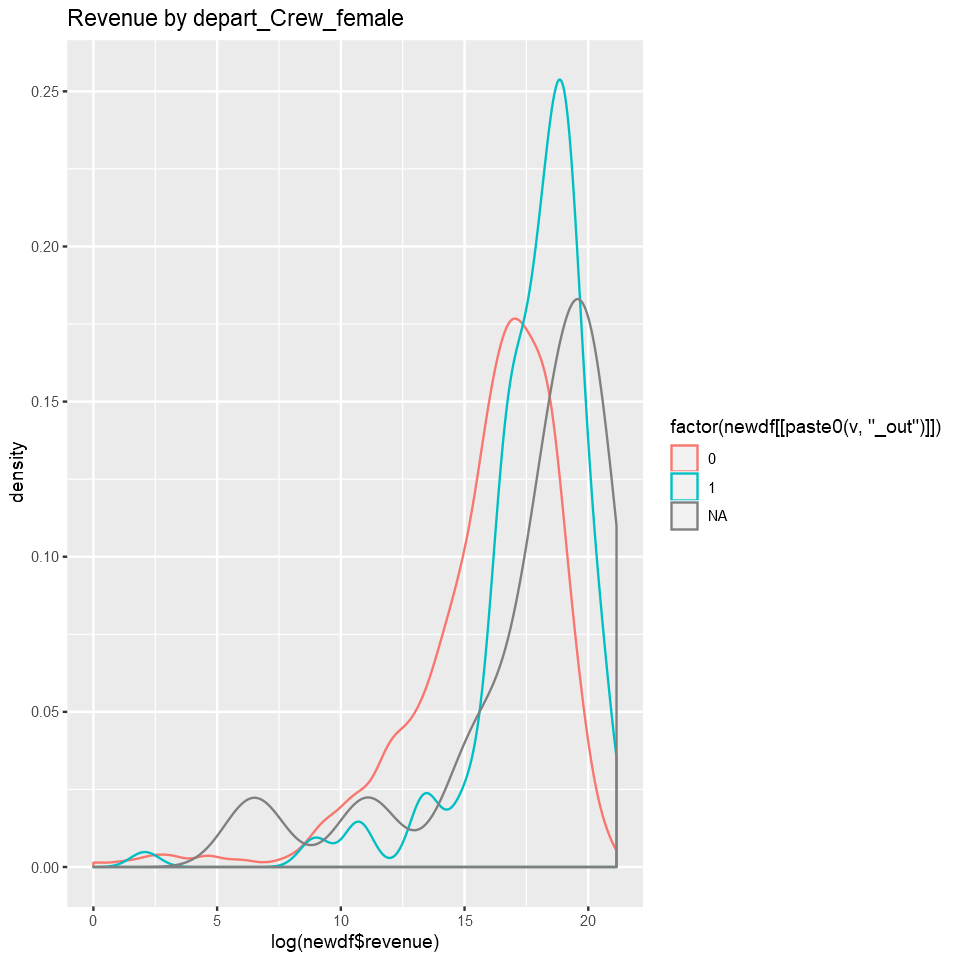

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


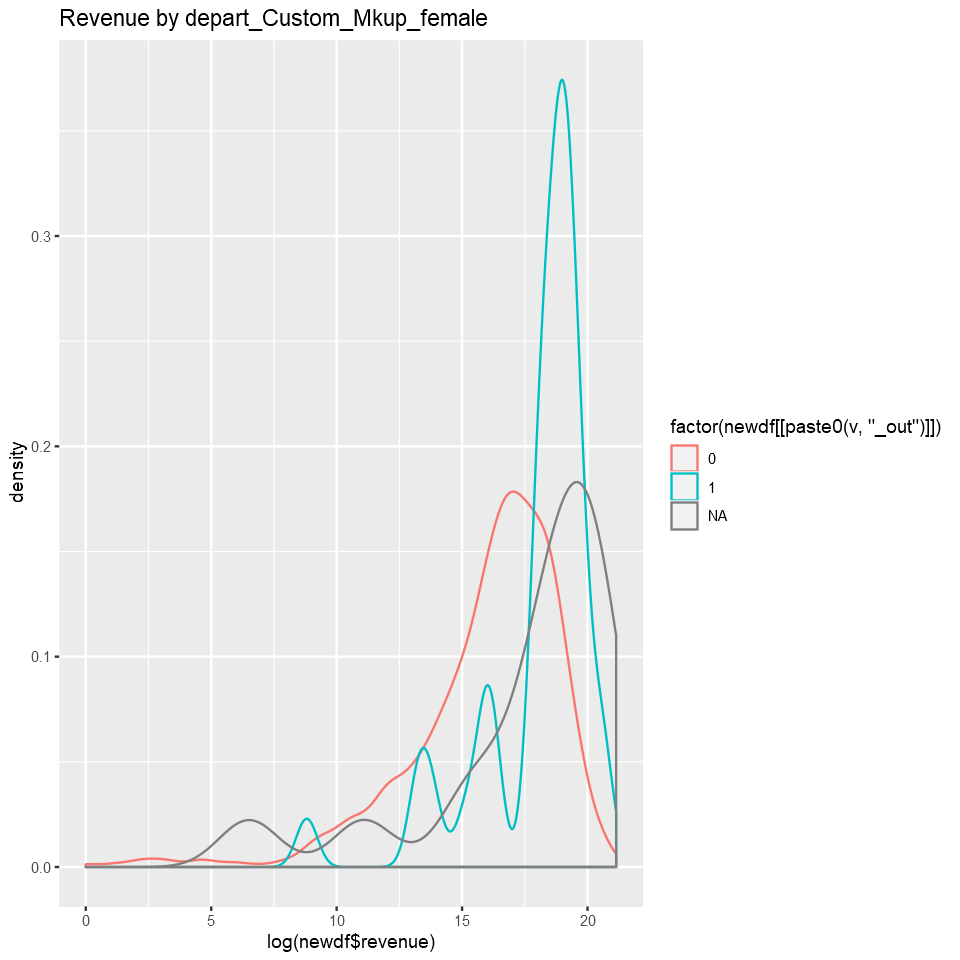

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


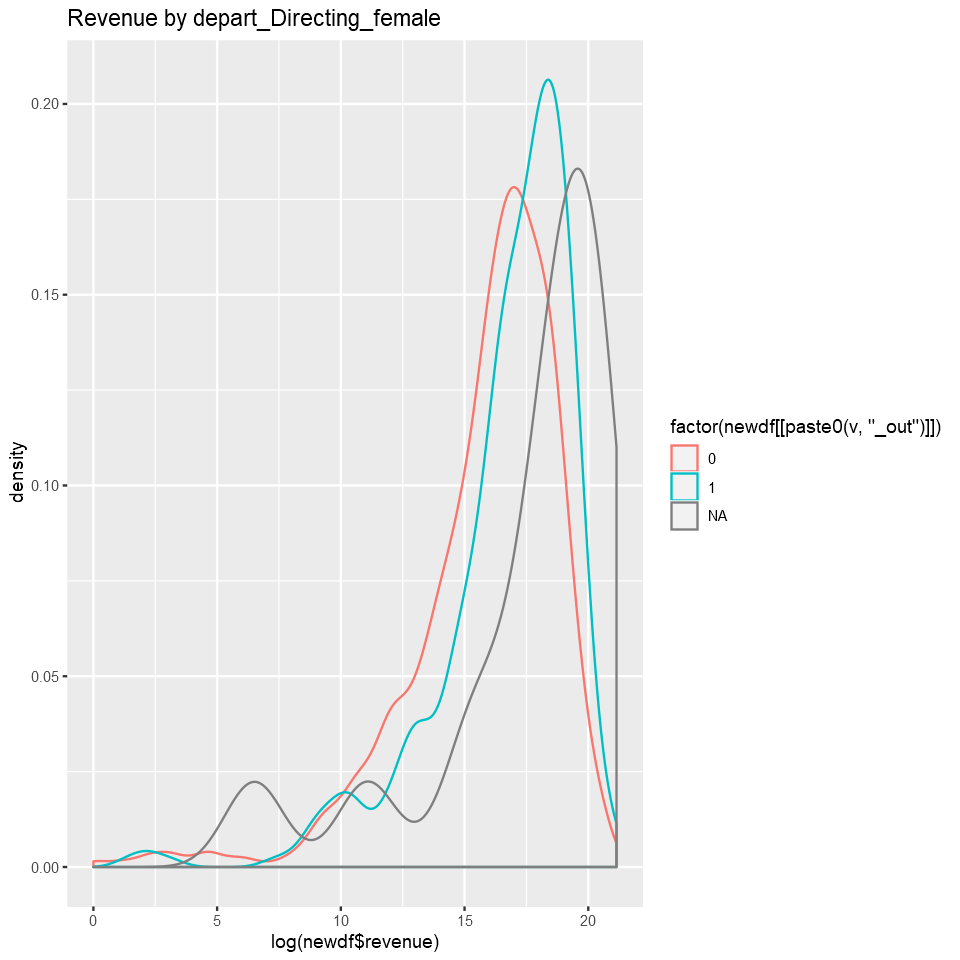

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


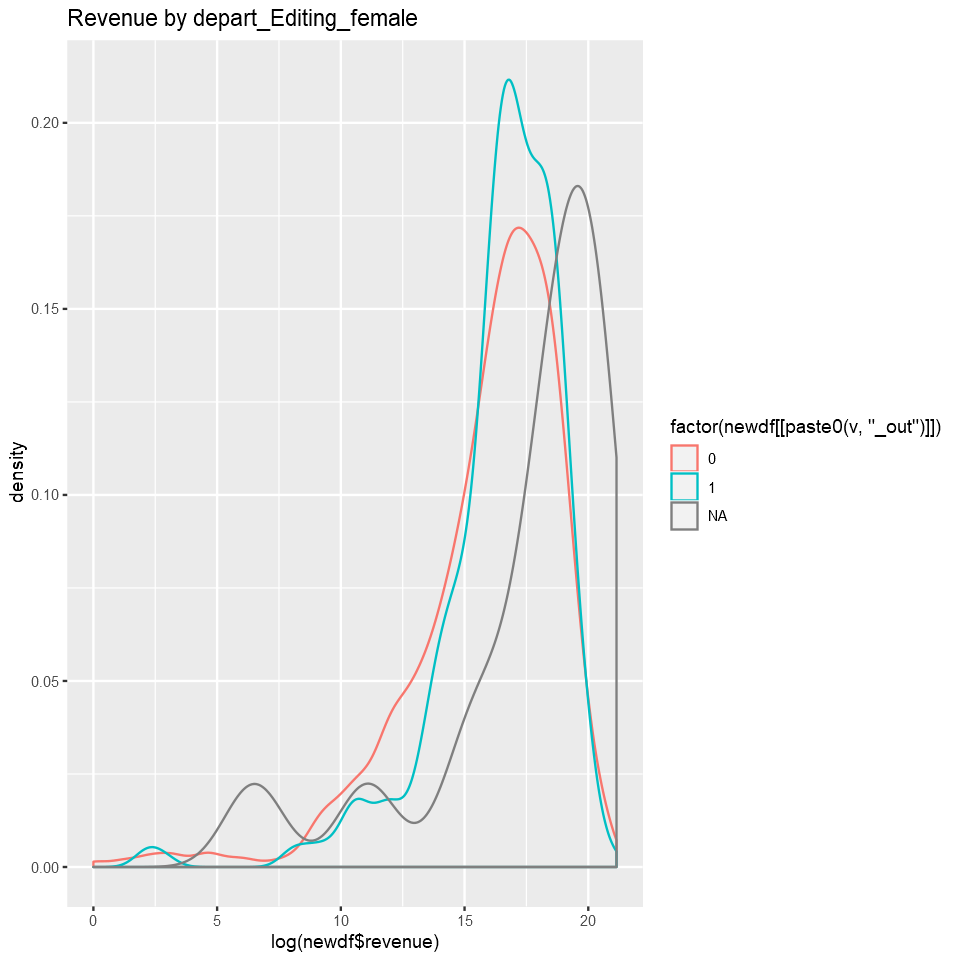

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


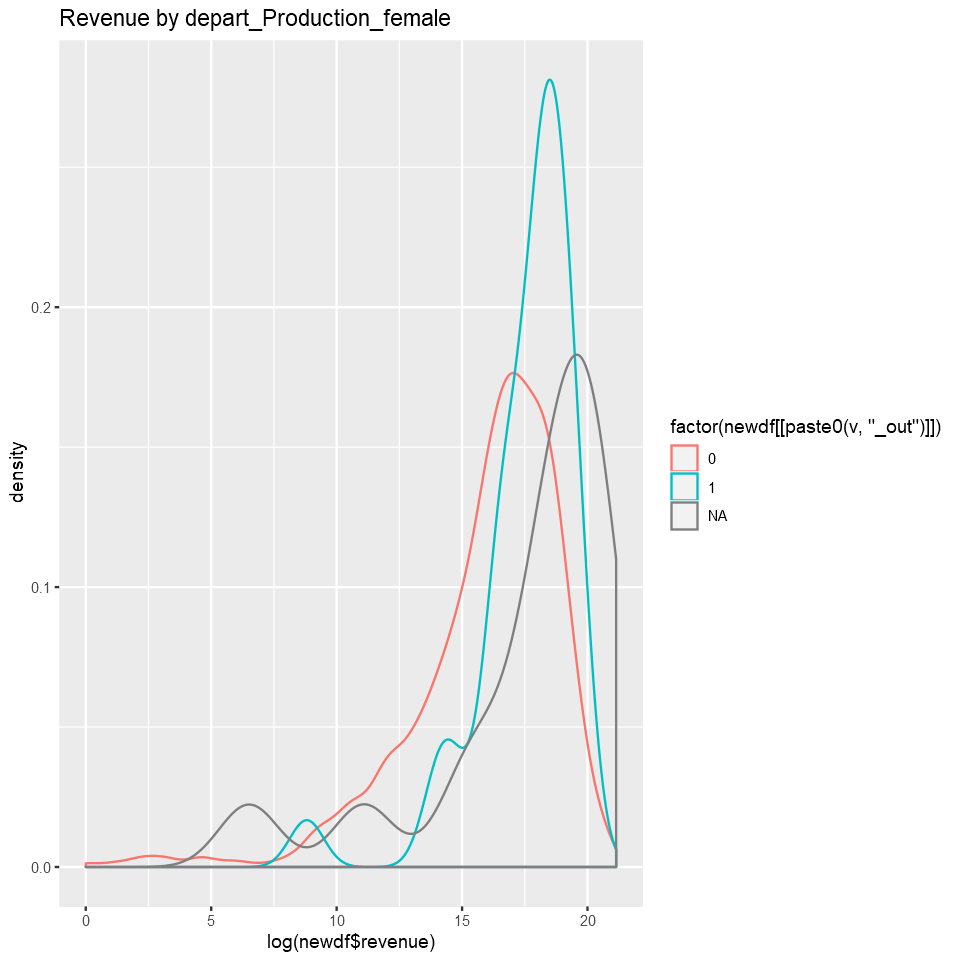

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."
Joining, by = "movie_id"


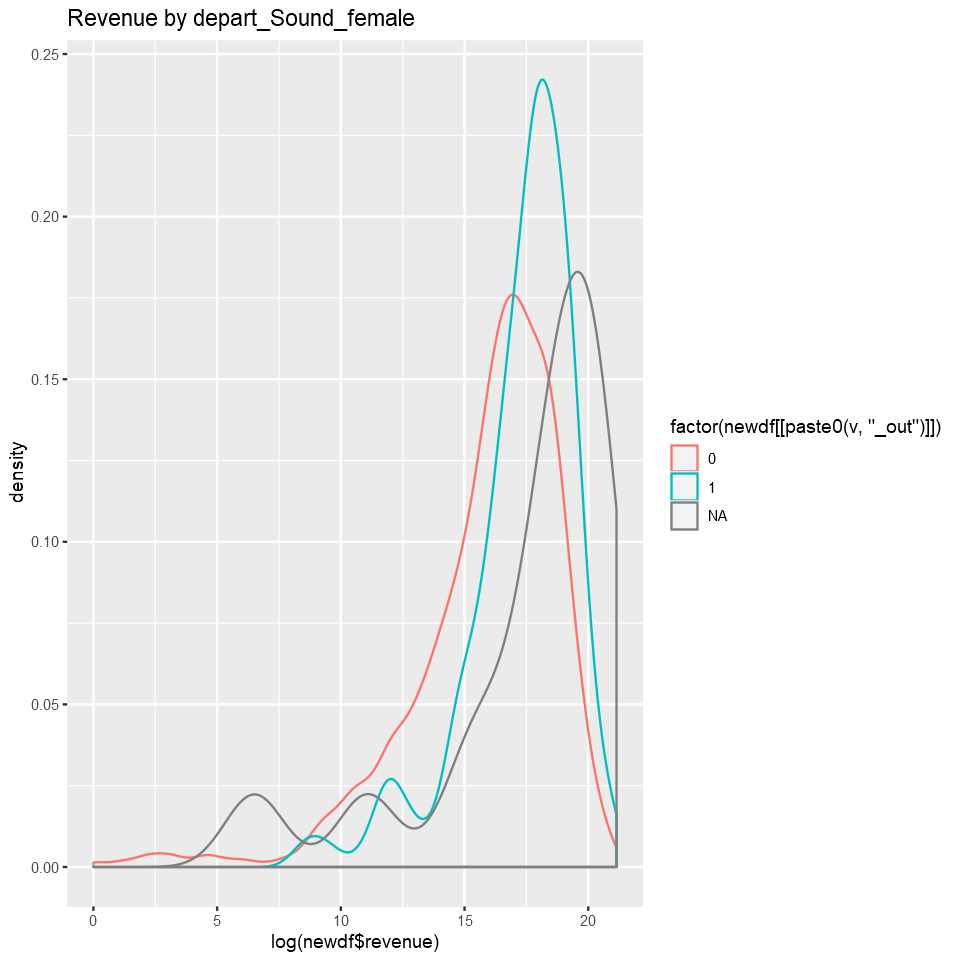

Warning message:
"Removed 4382 rows containing non-finite values (stat_density)."


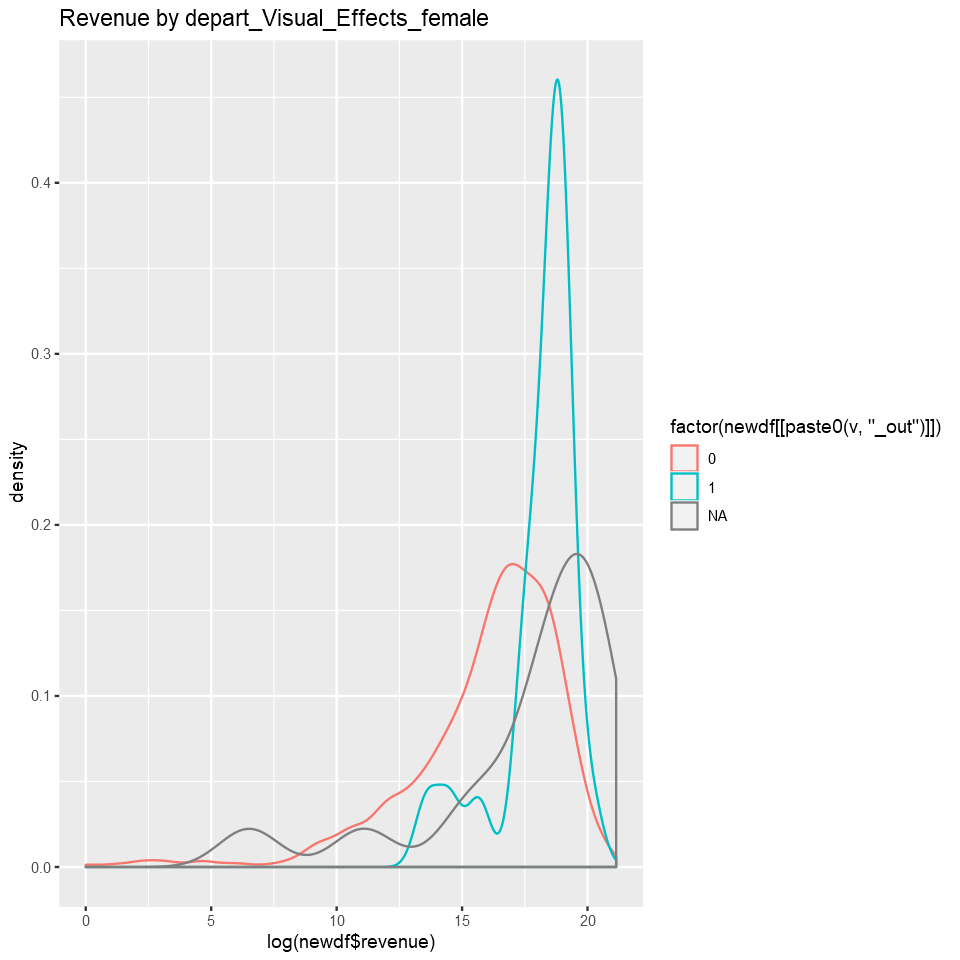

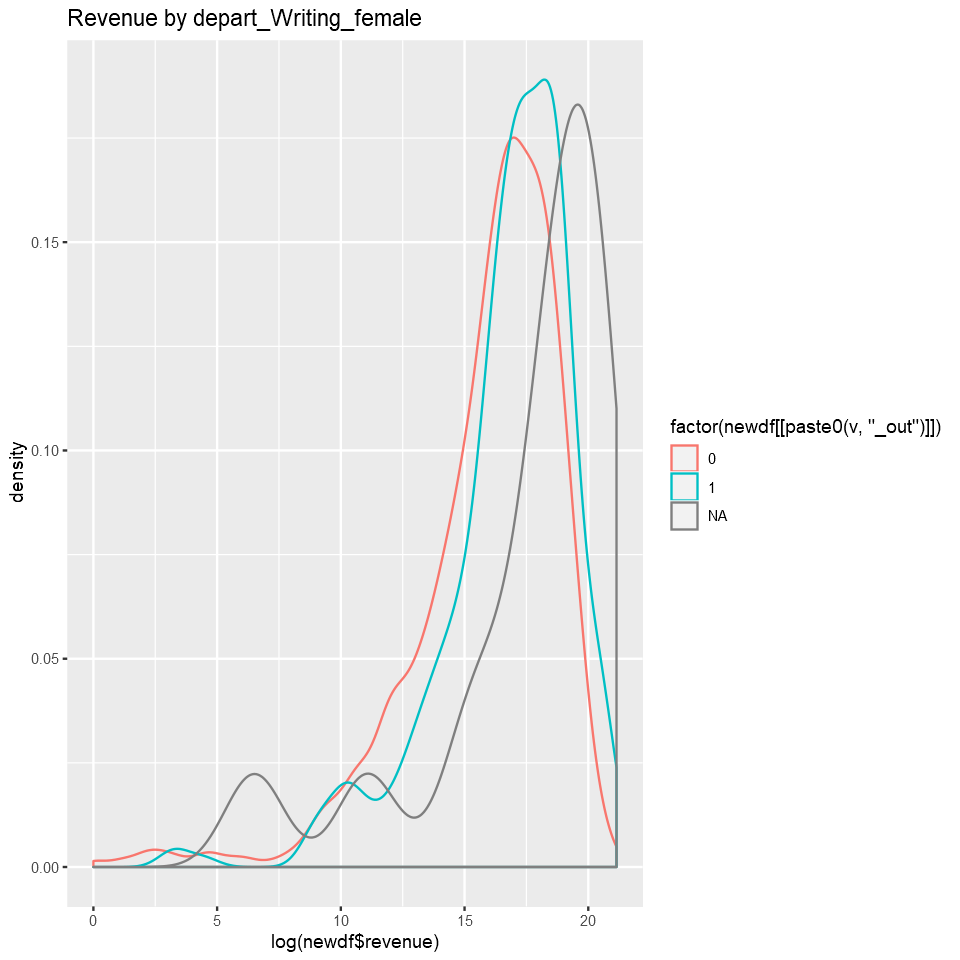

In [35]:
 for (v in movies_continuous){
    newdf <- left_join(movies_ff[,c("movie_id","revenue")], movies_outliers[,c("movie_id",paste0(v,"_out"))])
    print(    ggplot (newdf,aes(x=log(newdf$revenue), group = factor(newdf[[paste0(v,"_out")]]),
                                color = factor(newdf[[paste0(v,"_out")]]))) + 
          geom_density() + ggtitle(paste("Revenue by",v)) )
 
    options(repr.plot.width = 8, repr.plot.height = 8)
}

In [64]:
t.test(movies_ff$revenue,movies_ff$budget)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$budget
t = 17.319, df = 3168.8, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 39207379 49217930
sample estimates:
mean of x mean of y 
 66879312  22666657 


In [66]:
t.test(movies_ff$revenue,movies_ff$popularity)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$popularity
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945669 71812937
sample estimates:
   mean of x    mean of y 
6.687931e+07 8.539777e+00 


In [67]:
t.test(movies_ff$revenue,movies_ff$release_year)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$release_year
t = 26.579, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61943678 71810946
sample estimates:
   mean of x    mean of y 
66879311.647     1999.678 


In [68]:
t.test(movies_ff$revenue,movies_ff$depart_Art)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Art
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945675 71812943
sample estimates:
   mean of x    mean of y 
6.687931e+07 2.706716e+00 


In [69]:
t.test(movies_ff$revenue,movies_ff$depart_Camera)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Camera
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945676 71812944
sample estimates:
   mean of x    mean of y 
6.687931e+07 1.801662e+00 


In [70]:
t.test(movies_ff$revenue,movies_ff$depart_Crew)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Crew
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945675 71812944
sample estimates:
   mean of x    mean of y 
6.687931e+07 2.387549e+00 


In [72]:
t.test(movies_ff$revenue,movies_ff$depart_Custom_Mkup)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Custom_Mkup
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945675 71812944
sample estimates:
   mean of x    mean of y 
6.687931e+07 2.073696e+00 


In [73]:
t.test(movies_ff$revenue,movies_ff$depart_Directing)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Directing
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945676 71812944
sample estimates:
   mean of x    mean of y 
6.687931e+07 1.665441e+00 


In [74]:
t.test(movies_ff$revenue,movies_ff$depart_Editing)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Editing
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945676 71812944
sample estimates:
   mean of x    mean of y 
6.687931e+07 1.516278e+00 


In [75]:
t.test(movies_ff$revenue,movies_ff$depart_Lighting)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Lighting
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945677 71812946
sample estimates:
   mean of x    mean of y 
6.687931e+07 4.262362e-01 


In [76]:
t.test(movies_ff$revenue,movies_ff$depart_Production)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Production
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945672 71812941
sample estimates:
   mean of x    mean of y 
6.687931e+07 5.300776e+00 


In [77]:
t.test(movies_ff$revenue,movies_ff$depart_Sound)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Sound
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945674 71812943
sample estimates:
   mean of x    mean of y 
6.687931e+07 3.064296e+00 


In [78]:
t.test(movies_ff$revenue,movies_ff$depart_Visual_Effects)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Visual_Effects
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945676 71812945
sample estimates:
   mean of x    mean of y 
6.687931e+07 1.290287e+00 


In [79]:
t.test(movies_ff$revenue,movies_ff$depart_Writing)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Writing
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945675 71812944
sample estimates:
   mean of x    mean of y 
6.687931e+07 2.222041e+00 


In [83]:
t.test(movies_ff$revenue,movies_ff$depart_Custom_Mkup_female)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Custom_Mkup_female
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945677 71812946
sample estimates:
   mean of x    mean of y 
6.687931e+07 3.534941e-01 


In [86]:
t.test(movies_ff$revenue,movies_ff$depart_Lighting_female)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Lighting_female
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945677 71812946
sample estimates:
   mean of x    mean of y 
6.687931e+07 6.811061e-04 


In [89]:
t.test(movies_ff$revenue,movies_ff$depart_Visual_Effects_female)


	Welch Two Sample t-test

data:  movies_ff$revenue and movies_ff$depart_Visual_Effects_female
t = 26.58, df = 2992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 61945677 71812946
sample estimates:
   mean of x    mean of y 
6.687931e+07 8.445716e-03 


### 3.1.2 האם רואים שוני עם או בלי ערכי קיצון ?Y- משפיעים על ההתנהגות של משתנה ה X- האם ערכי קיצון במשתנה ה

Warning message:
"Removed 4382 rows containing missing values (geom_point)."
Warning message:
"Removed 4384 rows containing missing values (geom_point)."


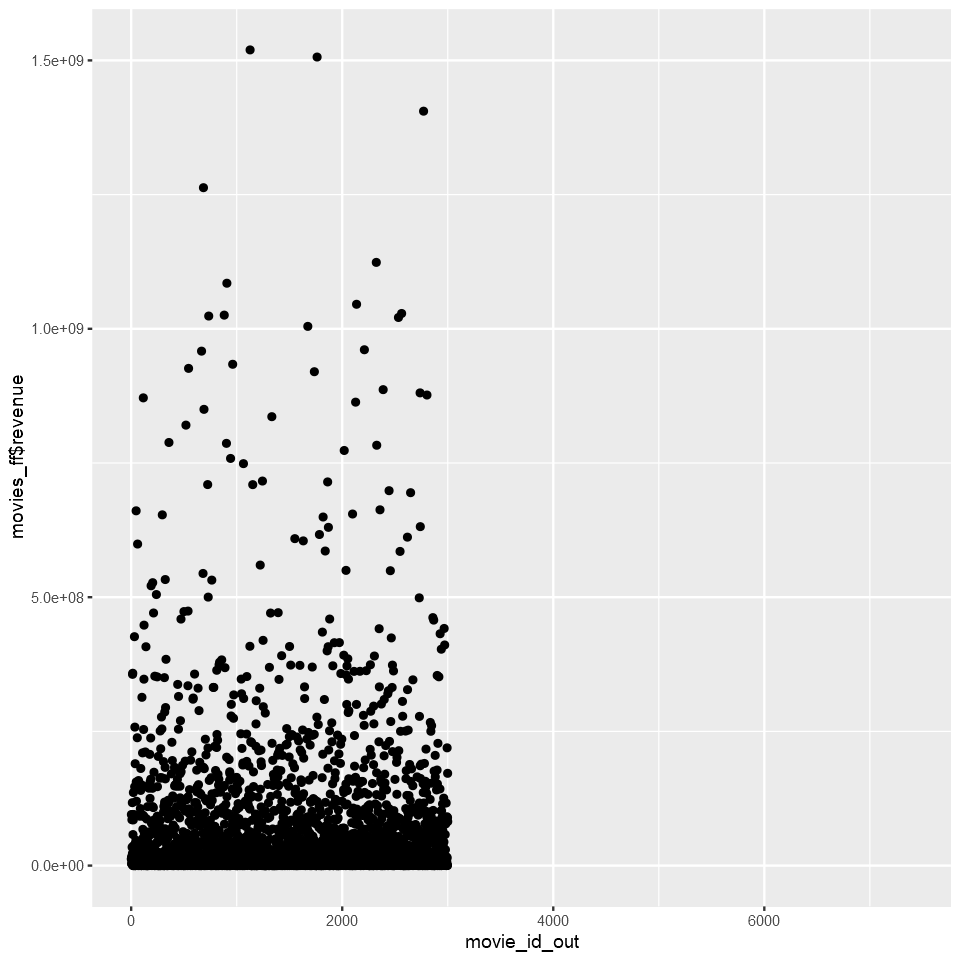

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


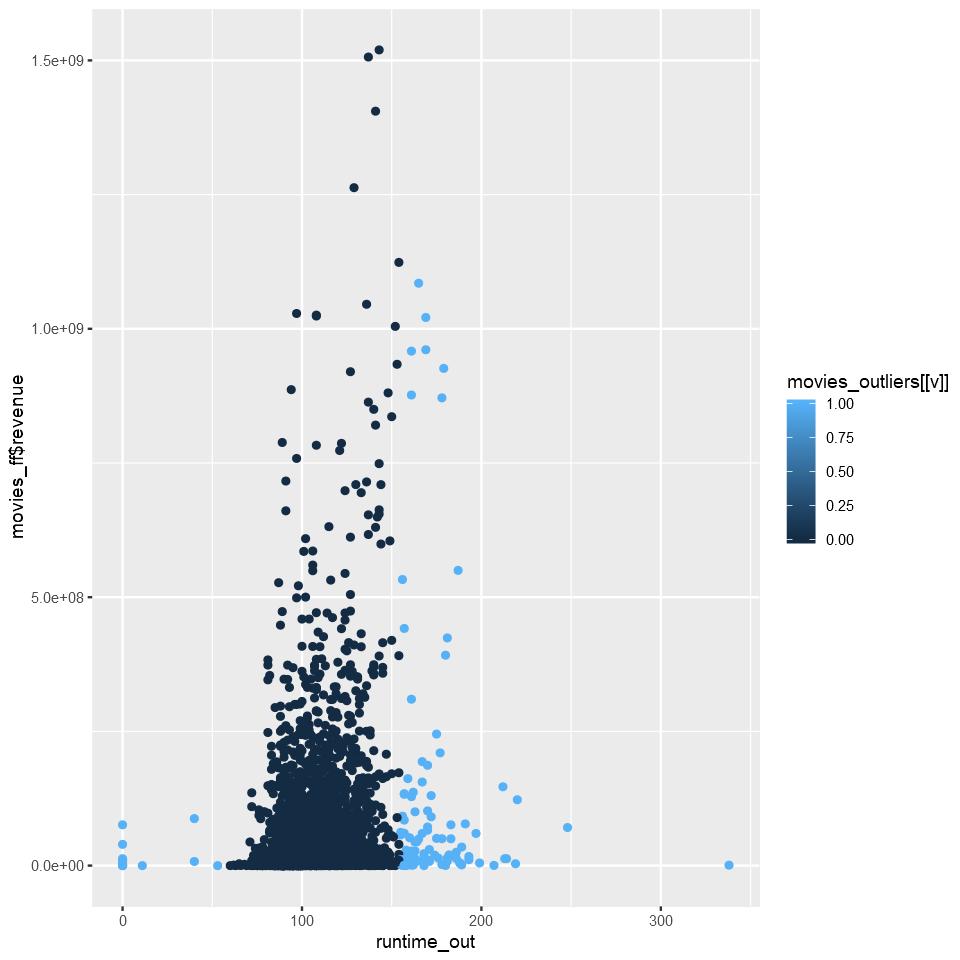

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


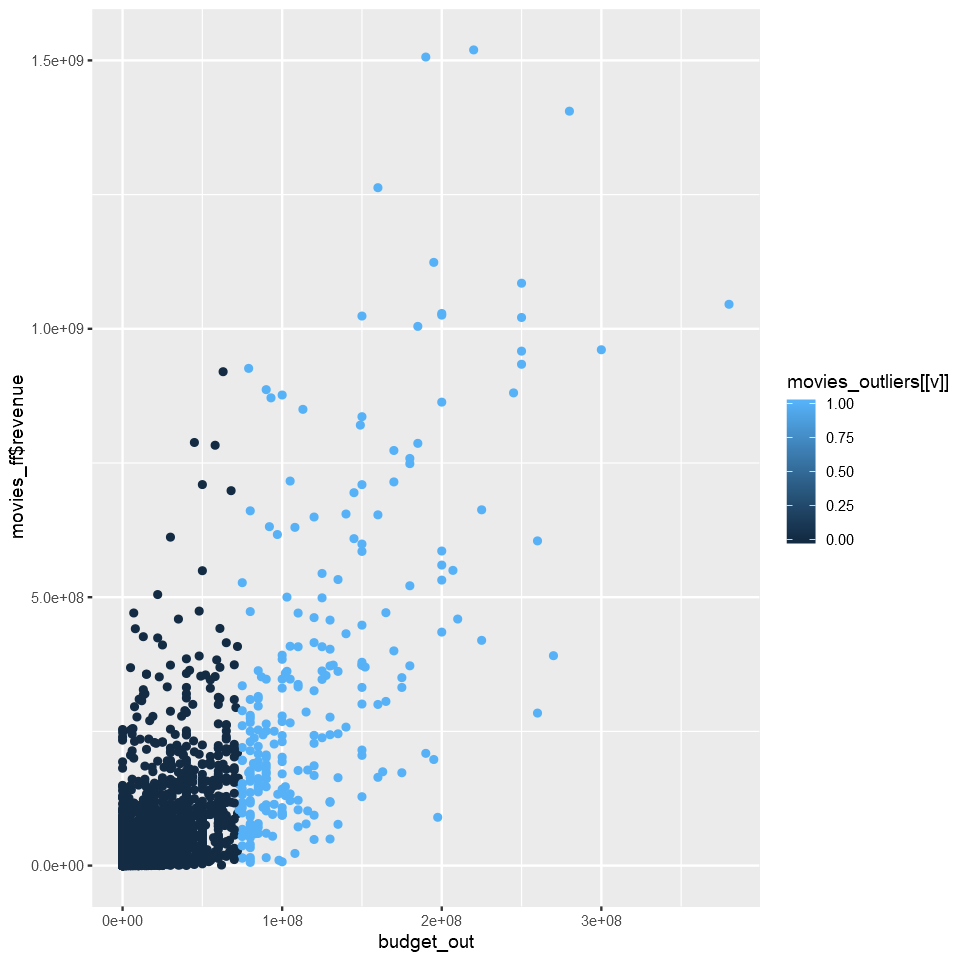

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


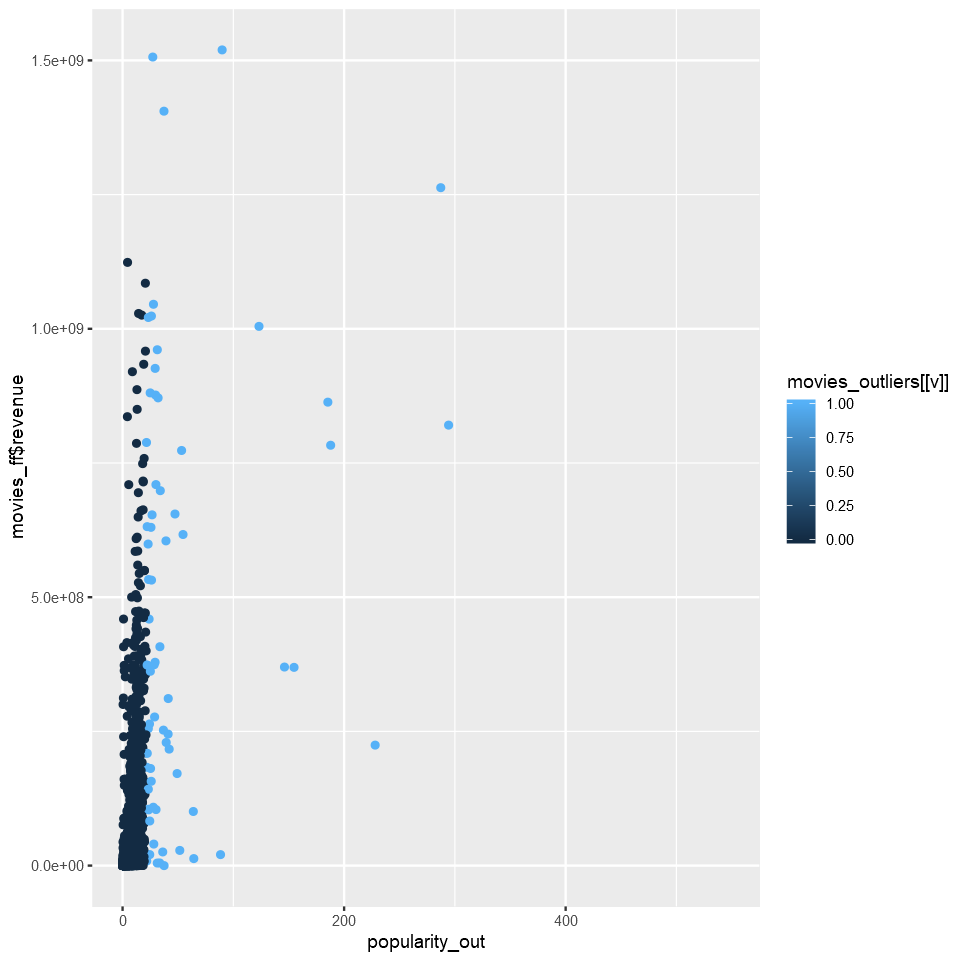

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


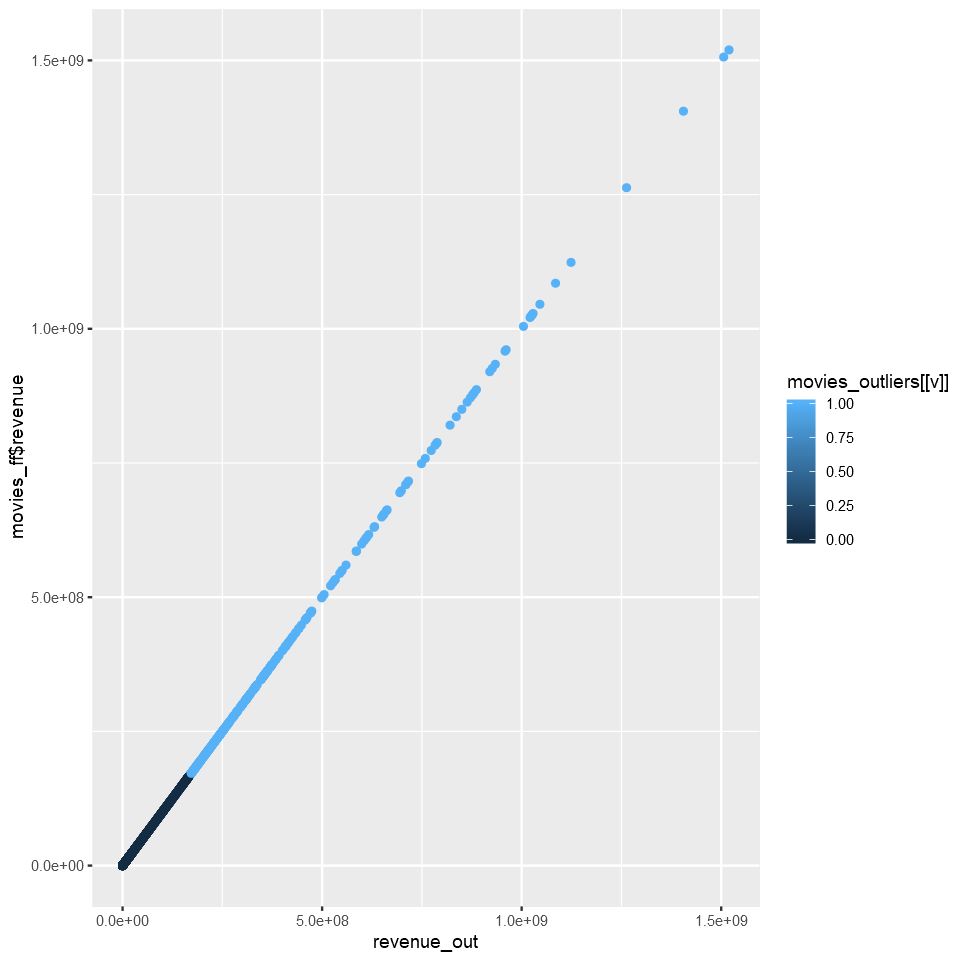

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


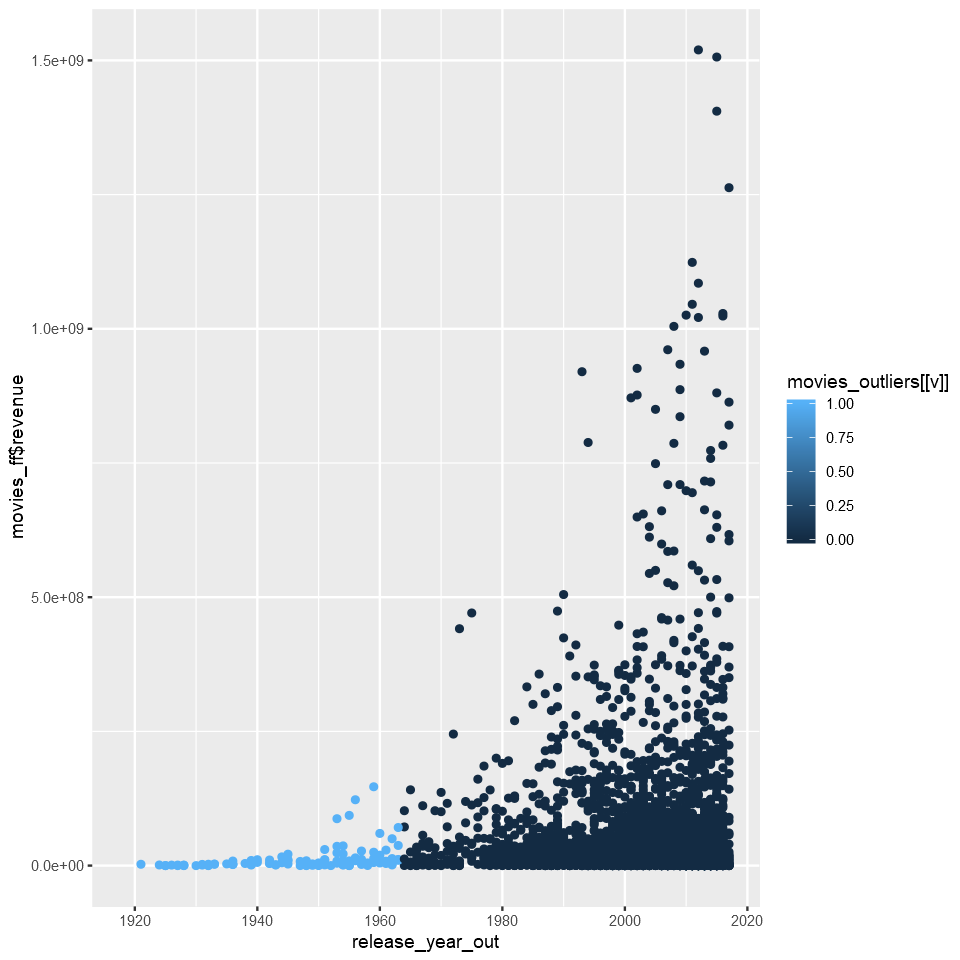

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


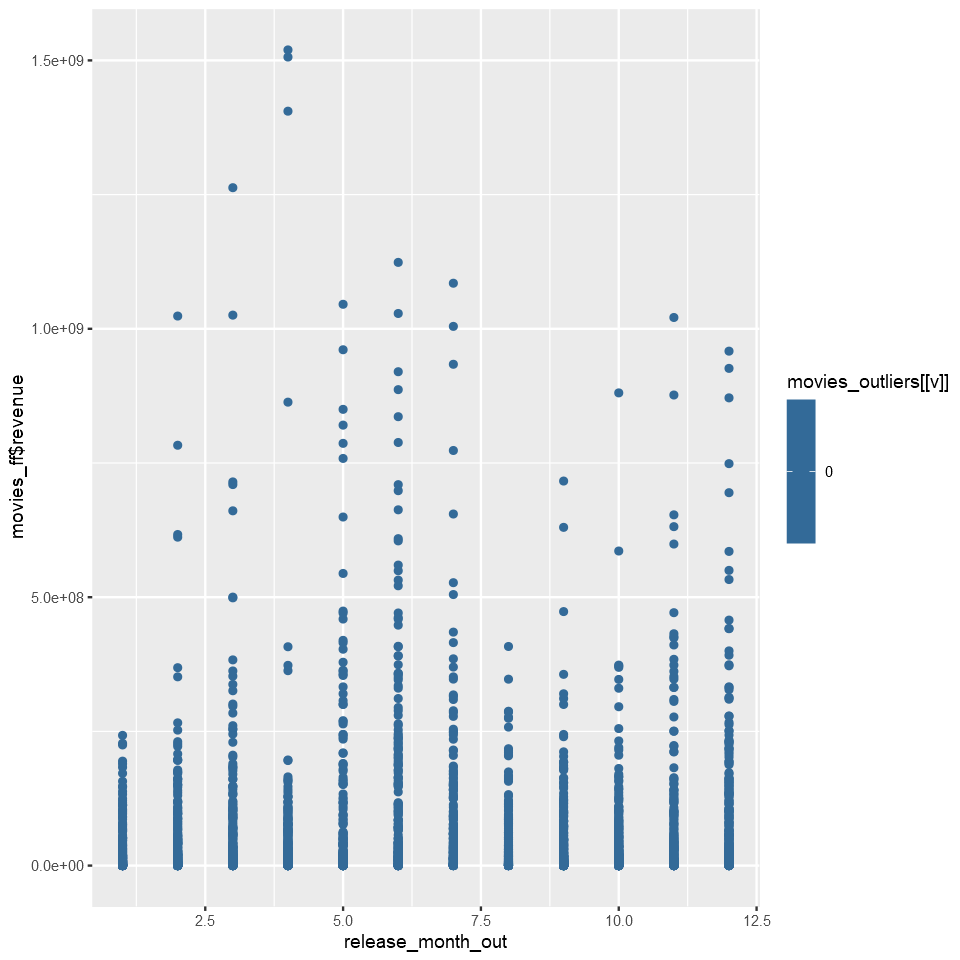

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


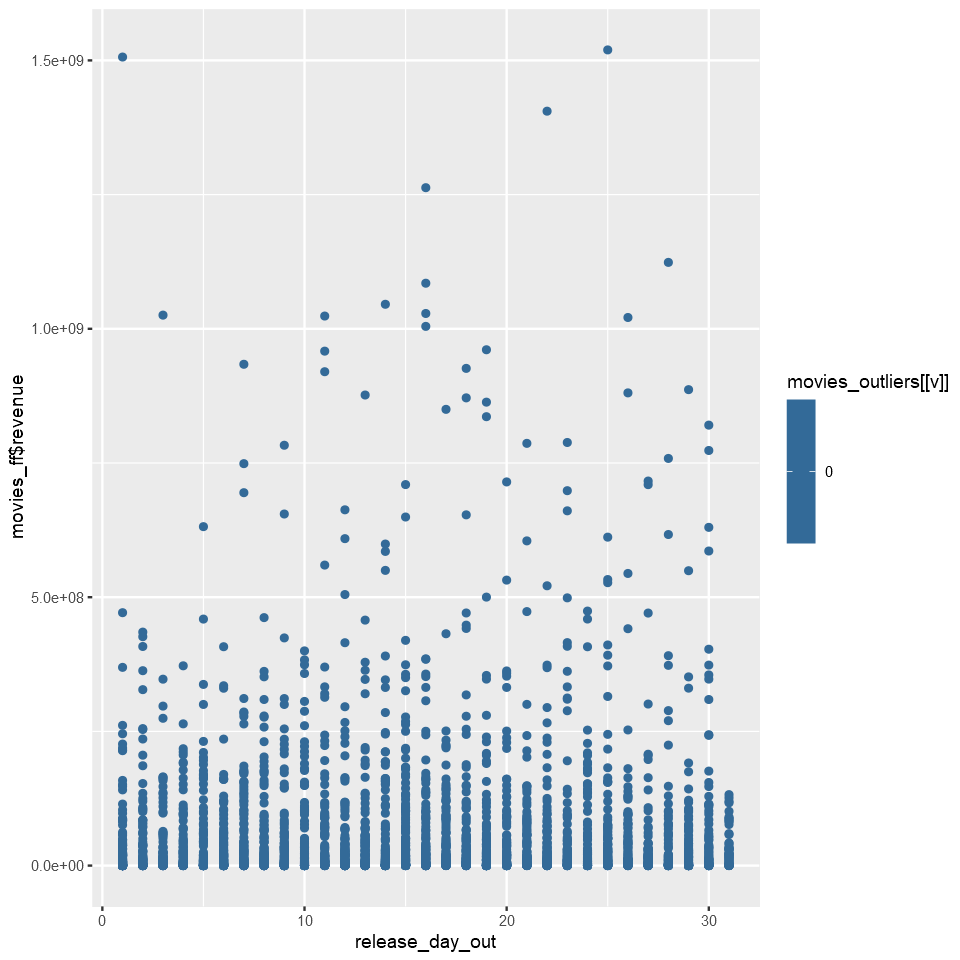

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


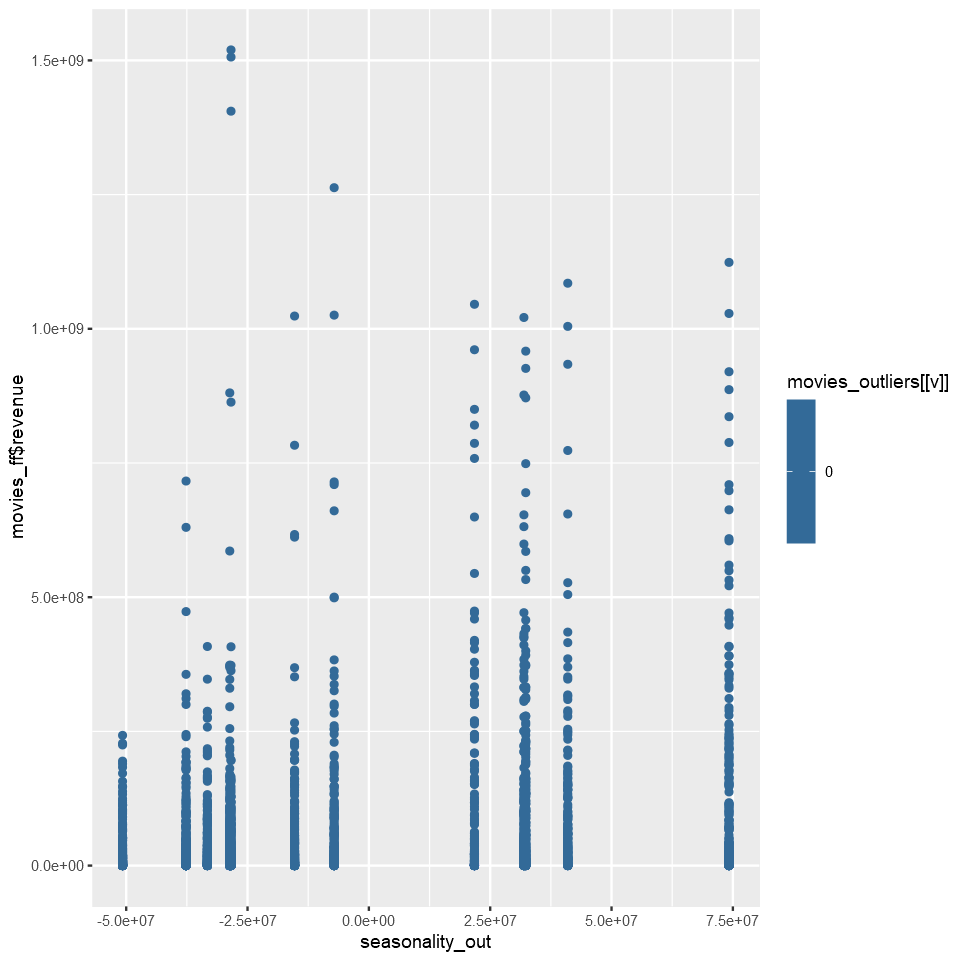

Warning message:
"Removed 4531 rows containing missing values (geom_point)."


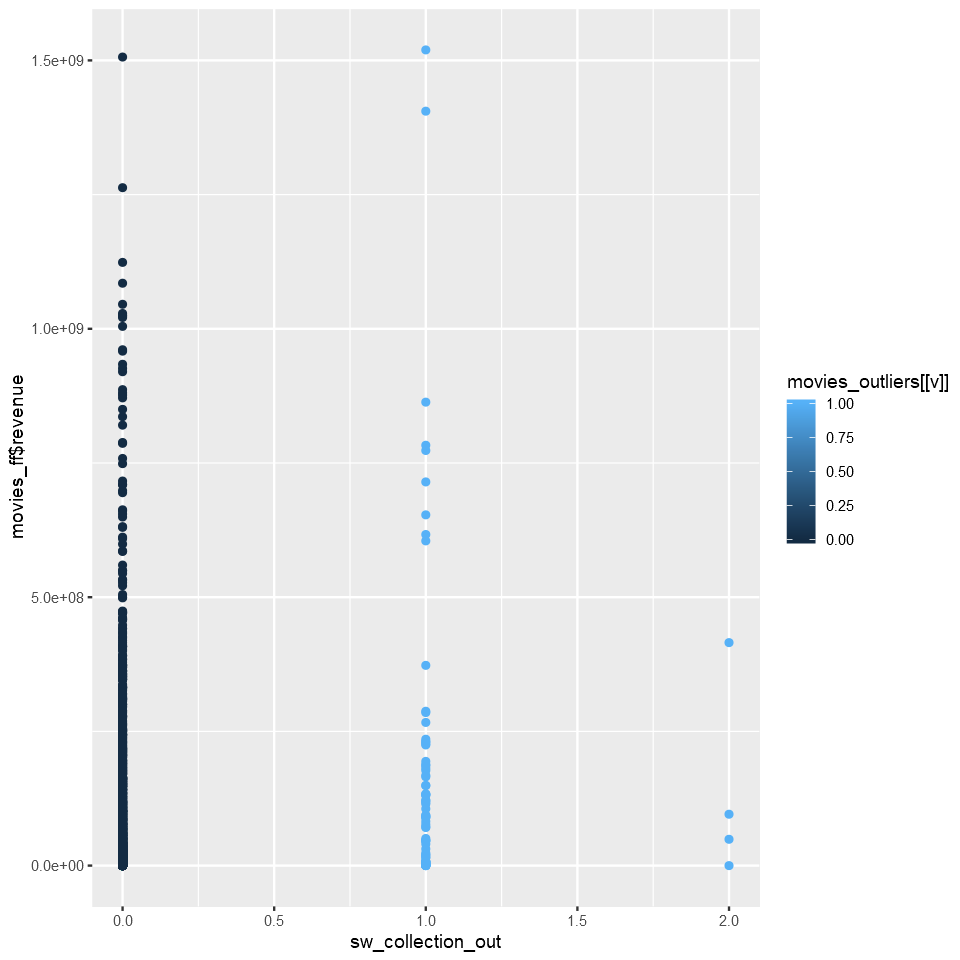

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


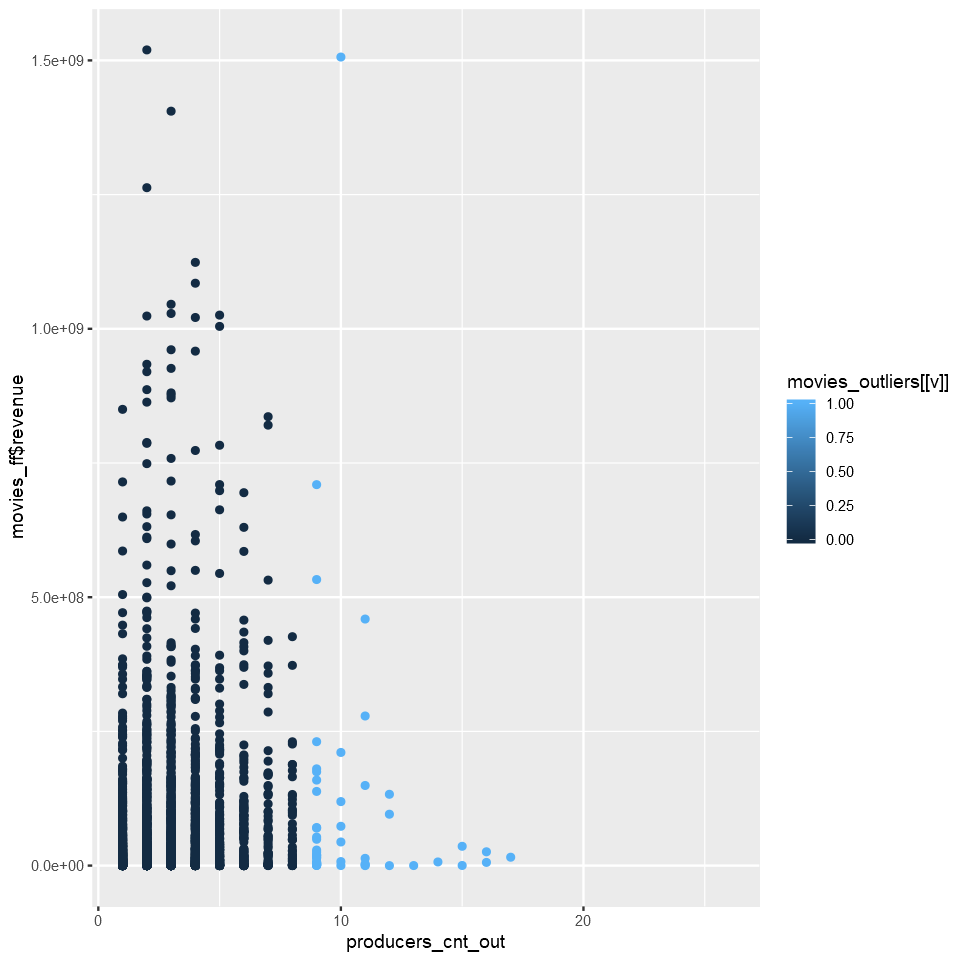

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


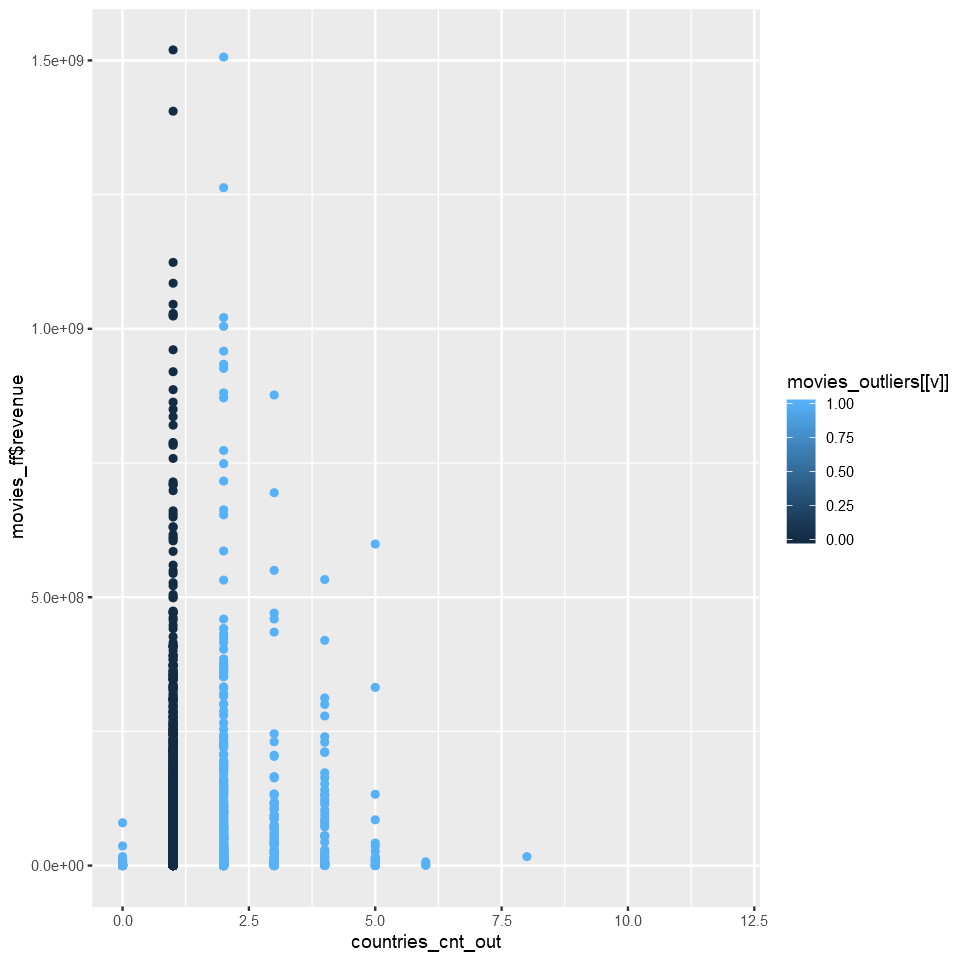

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


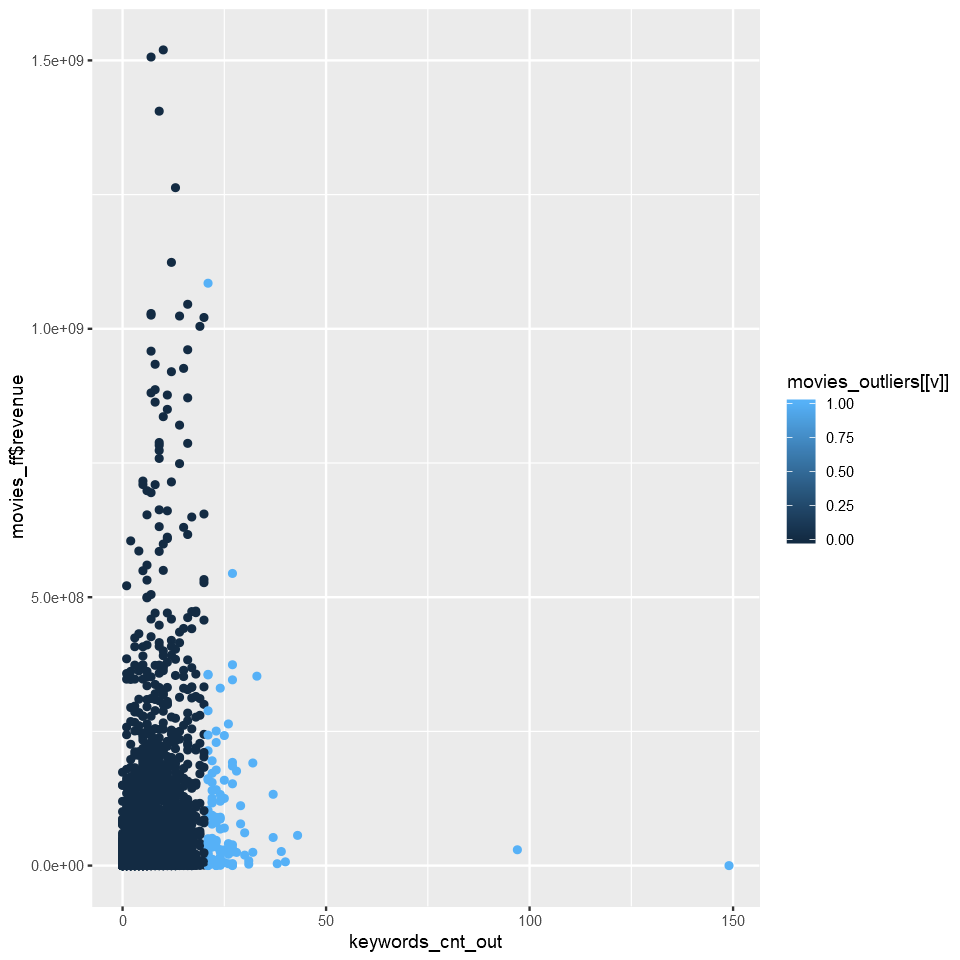

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


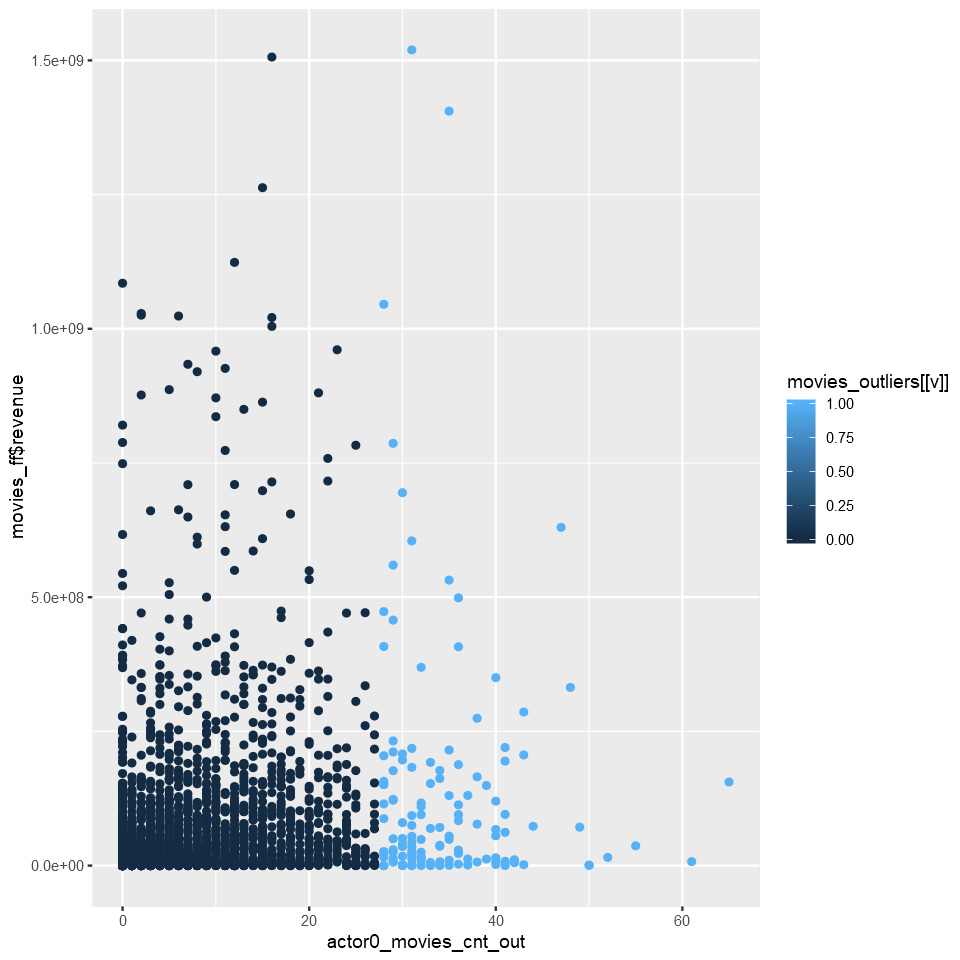

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


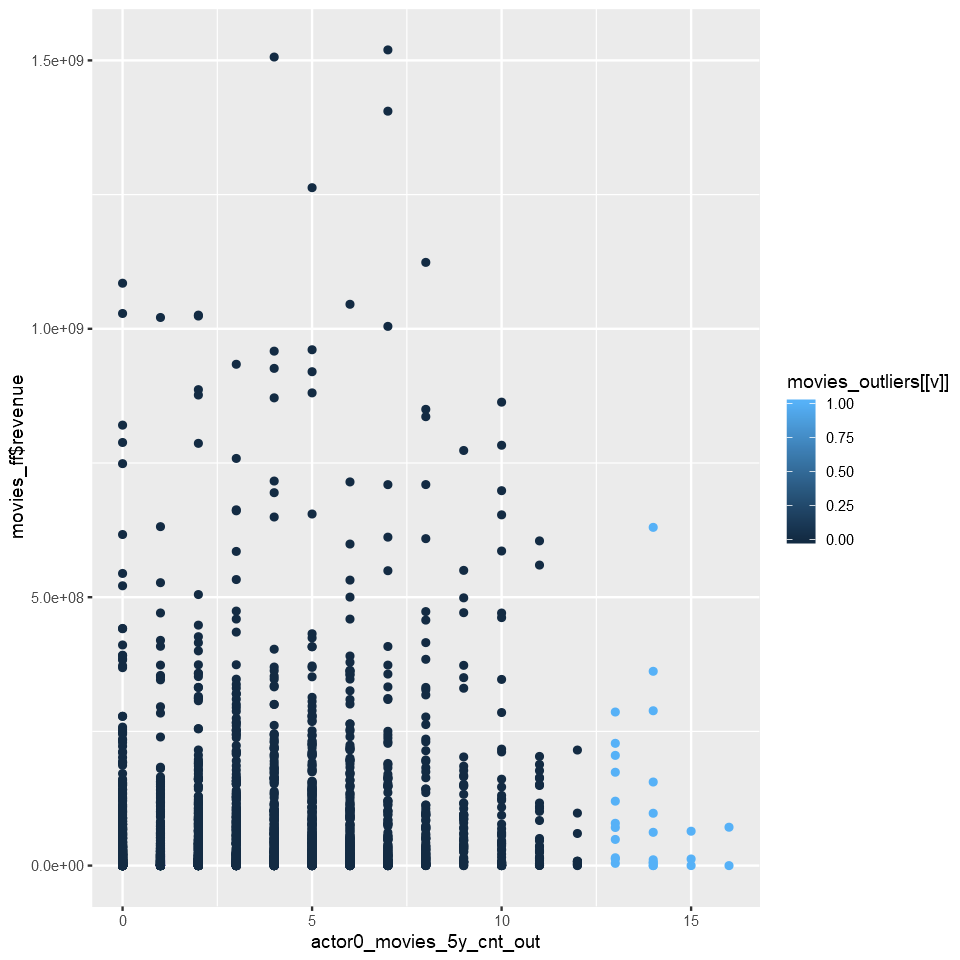

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


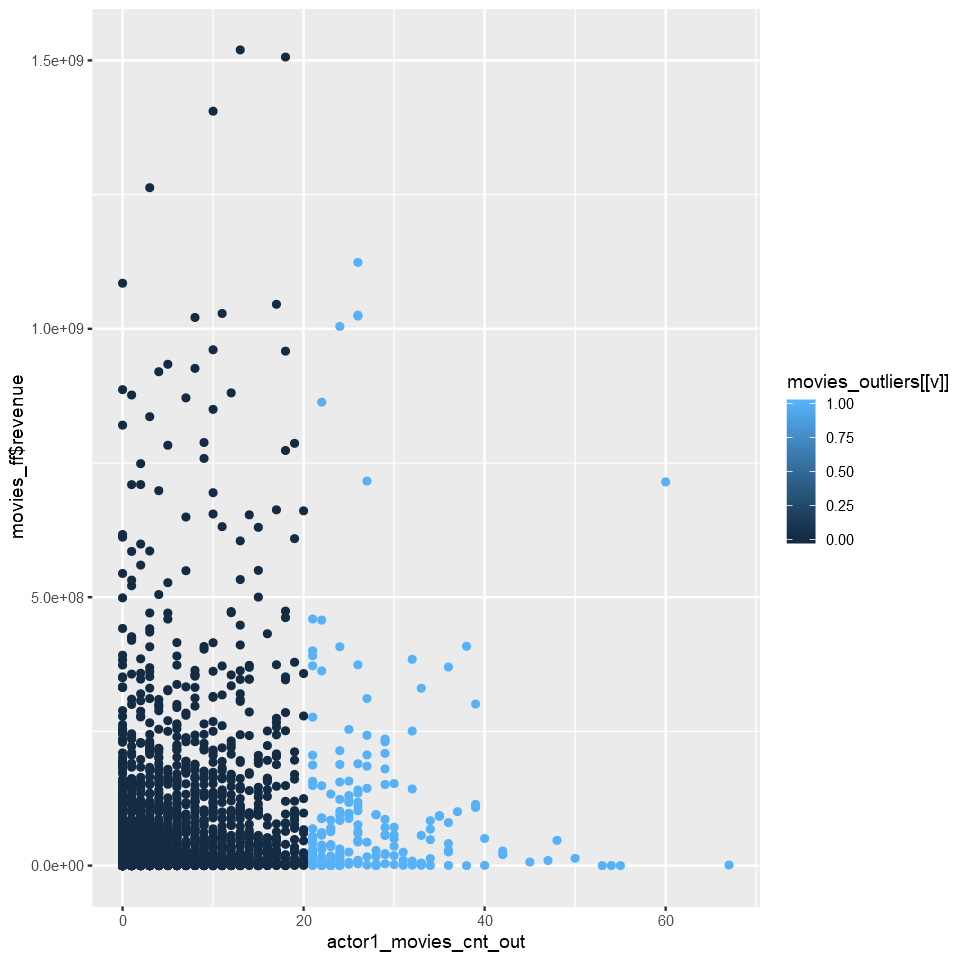

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


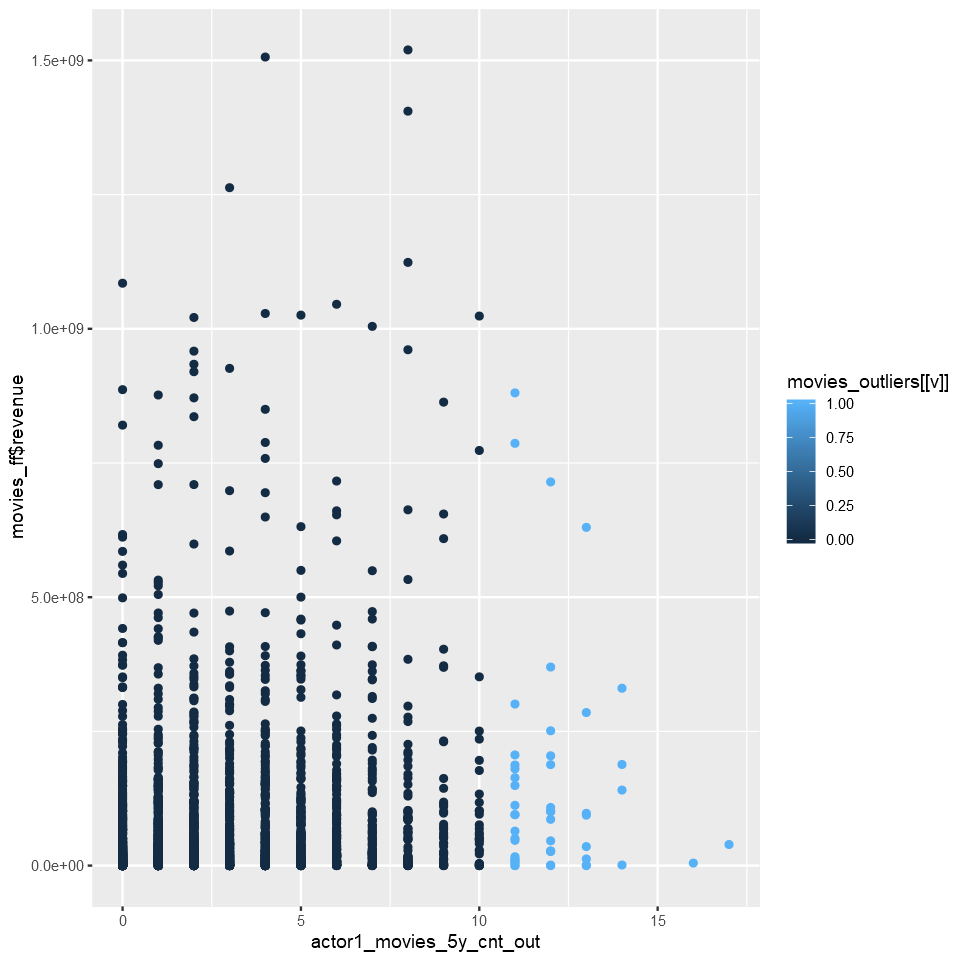

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


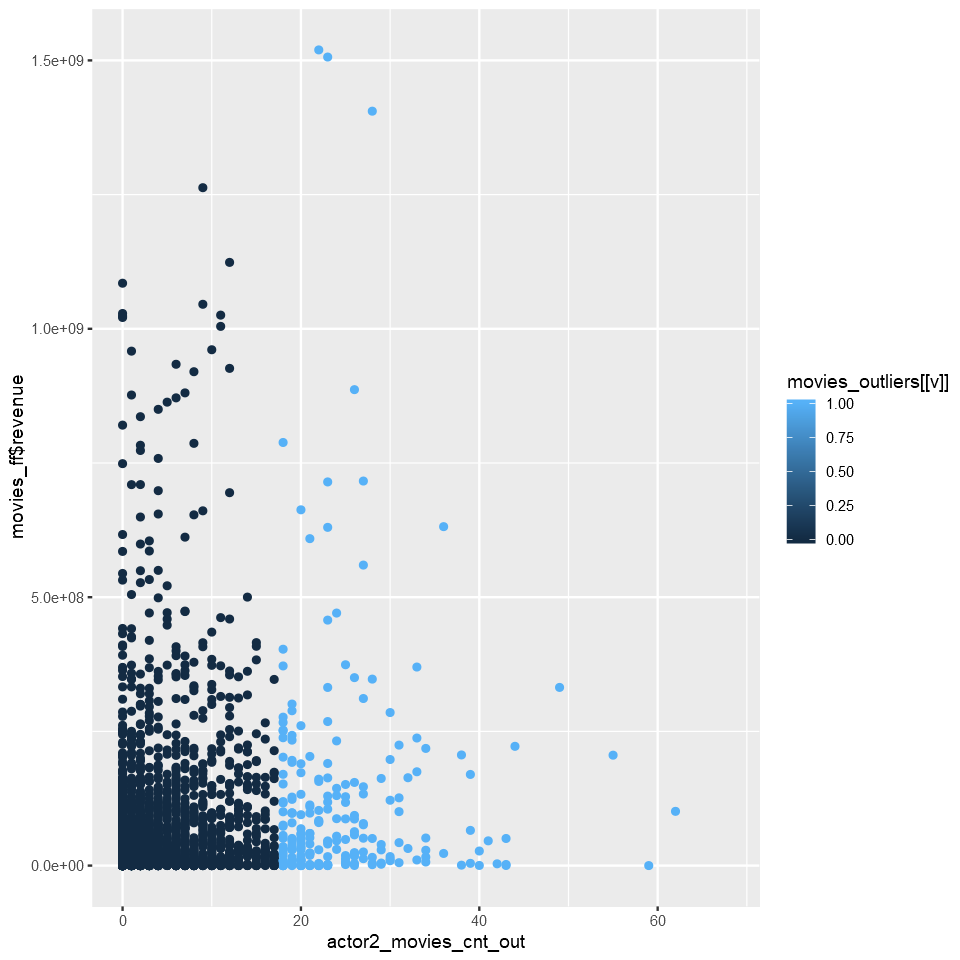

Warning message:
"Removed 5310 rows containing missing values (geom_point)."


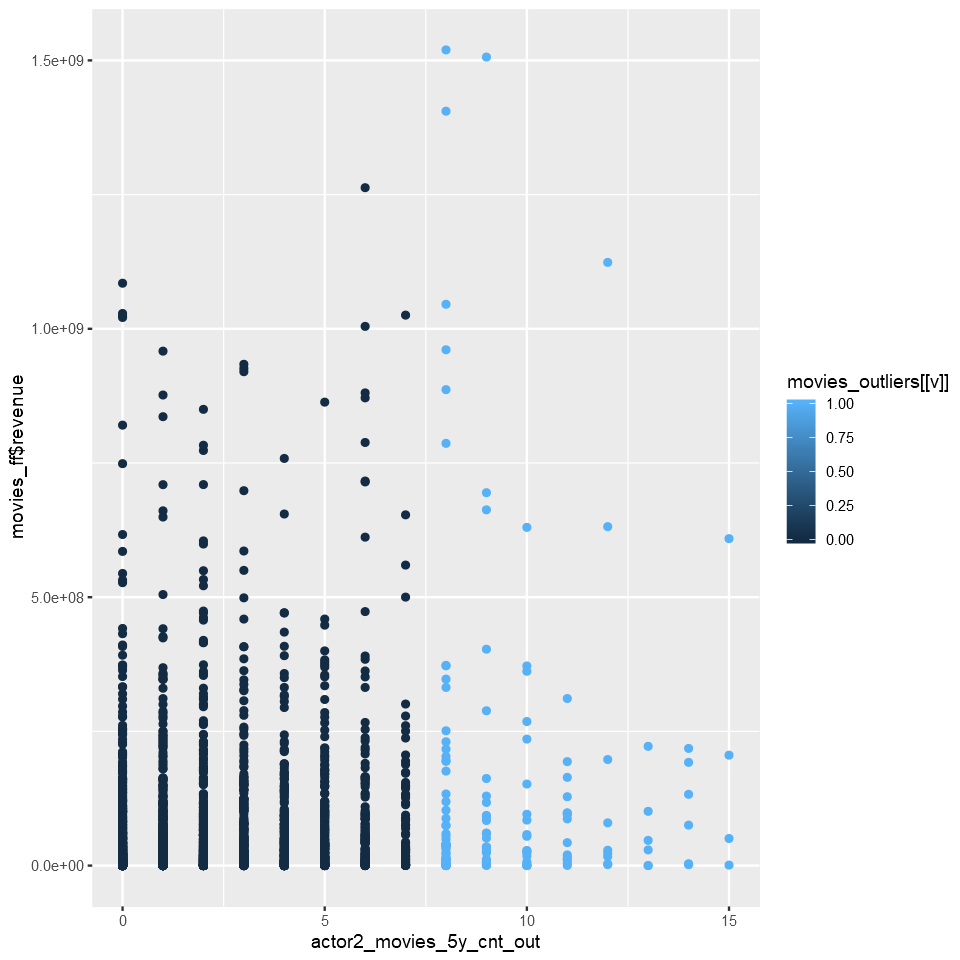

Warning message:
"Removed 5534 rows containing missing values (geom_point)."


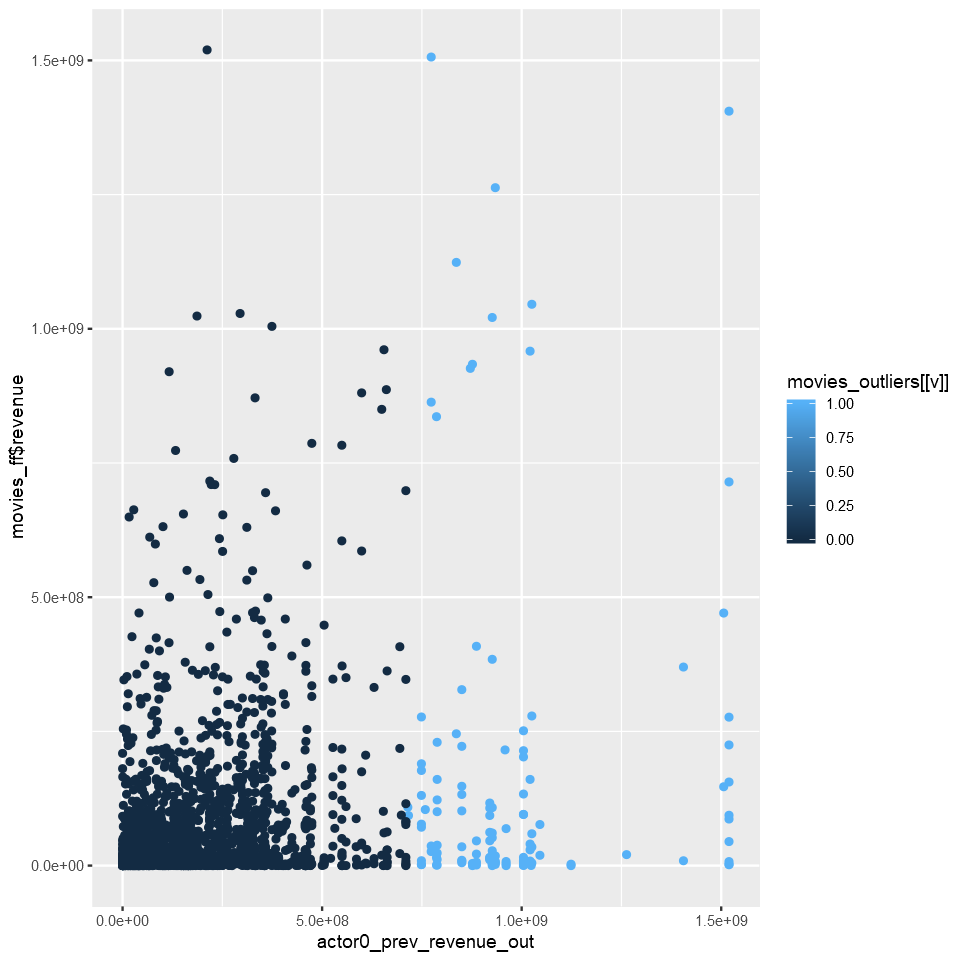

Warning message:
"Removed 5621 rows containing missing values (geom_point)."


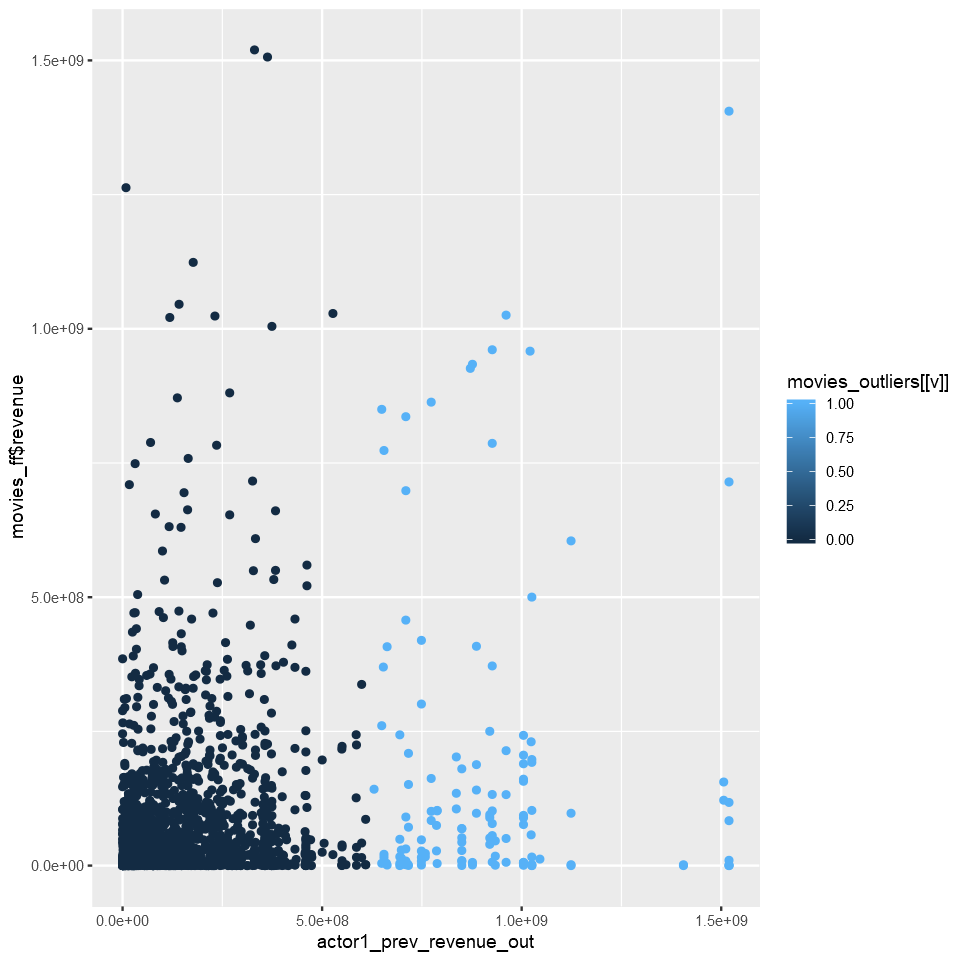

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


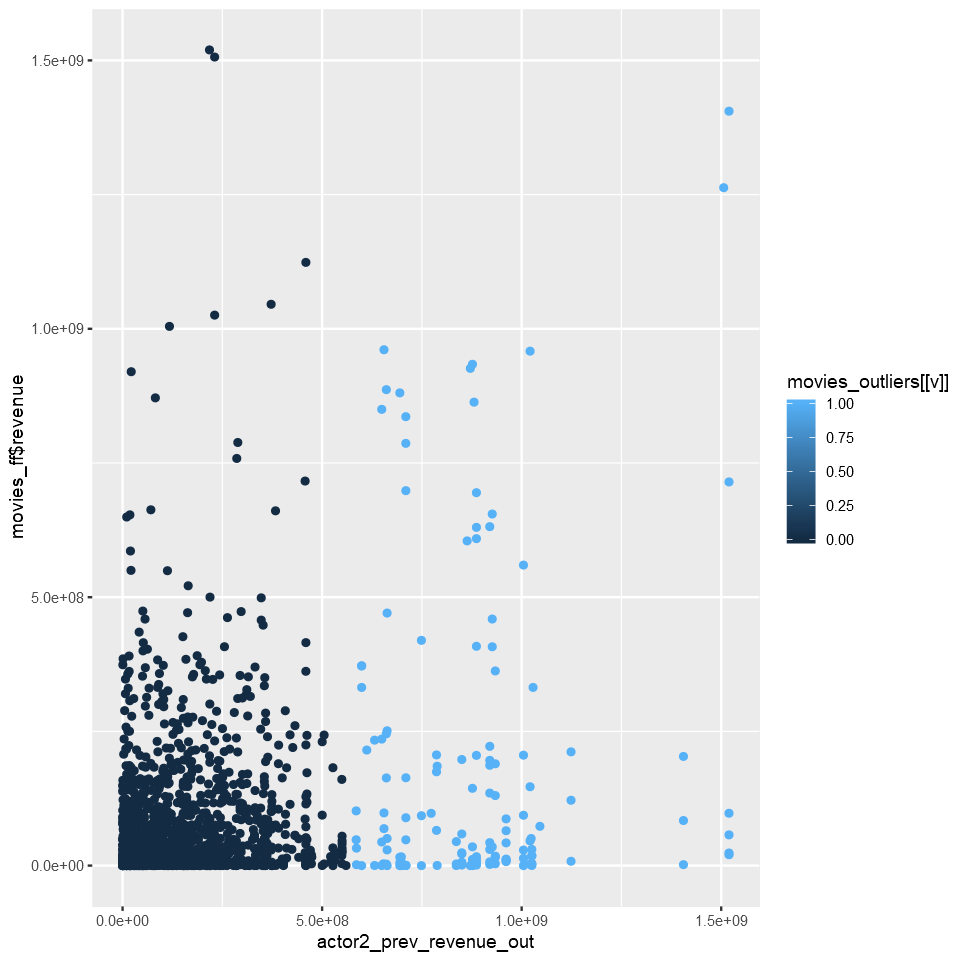

Warning message:
"Removed 4382 rows containing missing values (geom_point)."


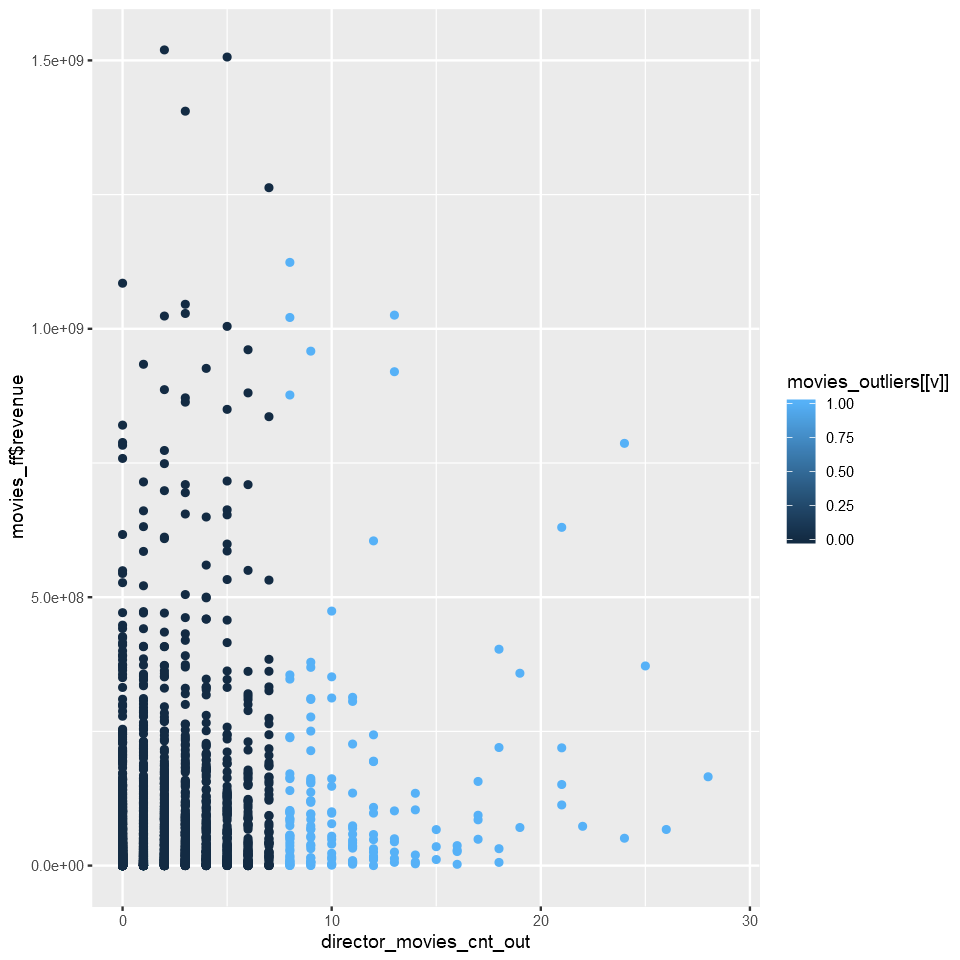

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


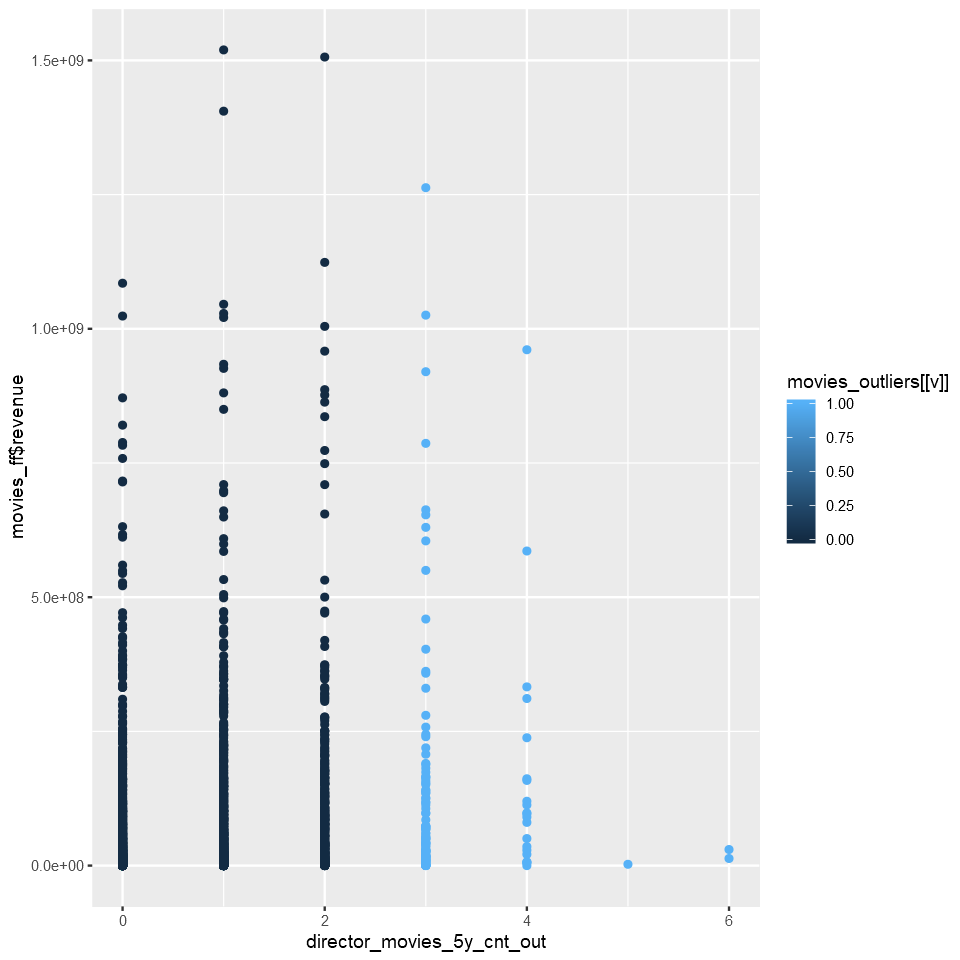

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


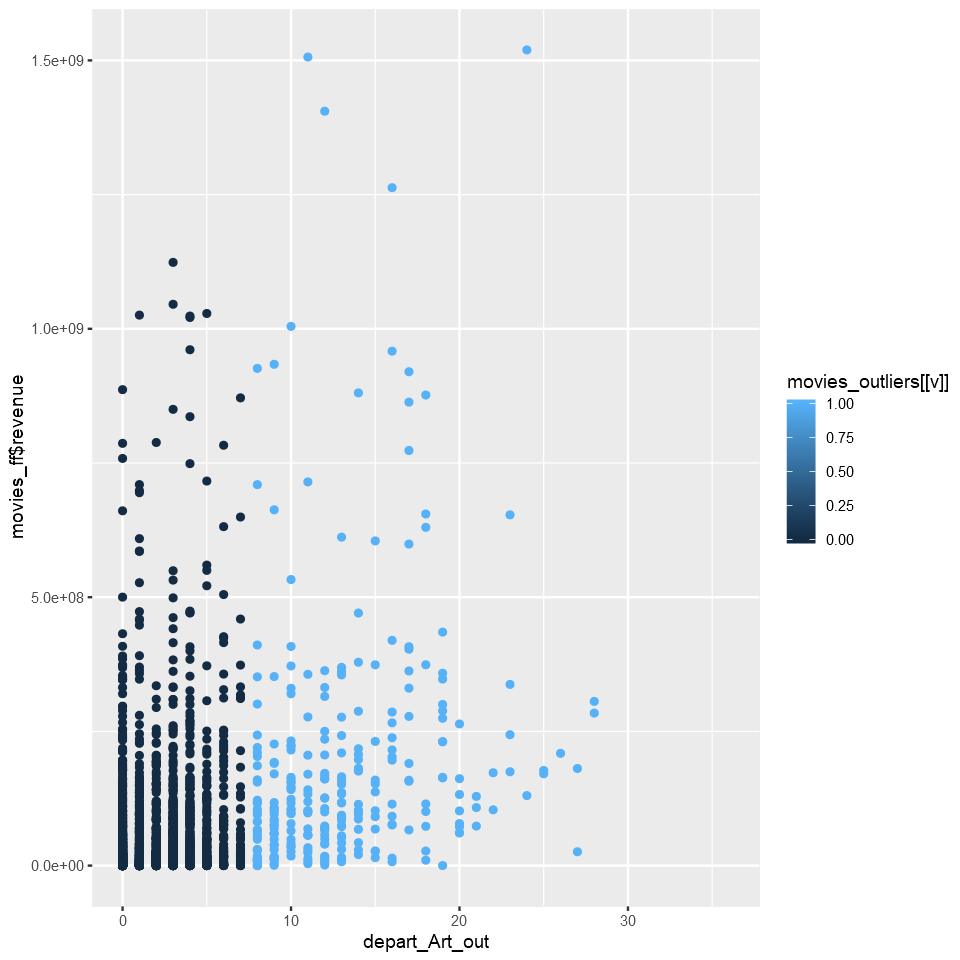

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


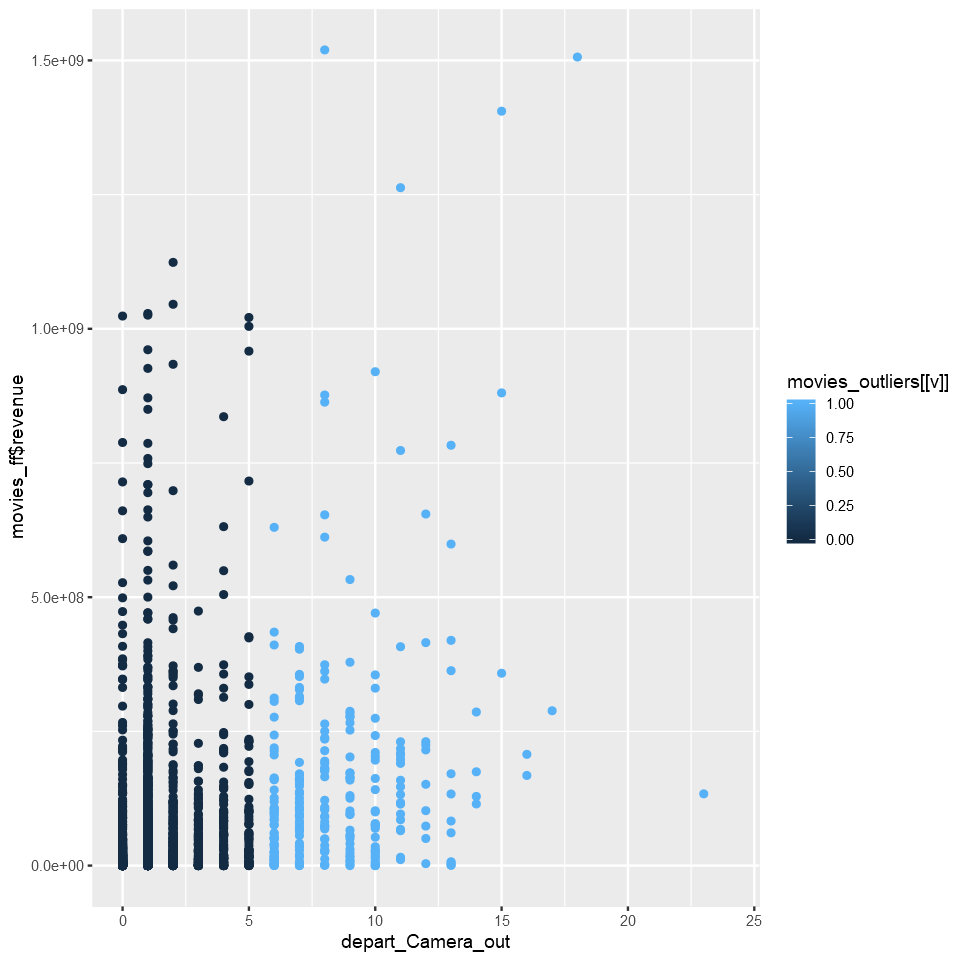

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


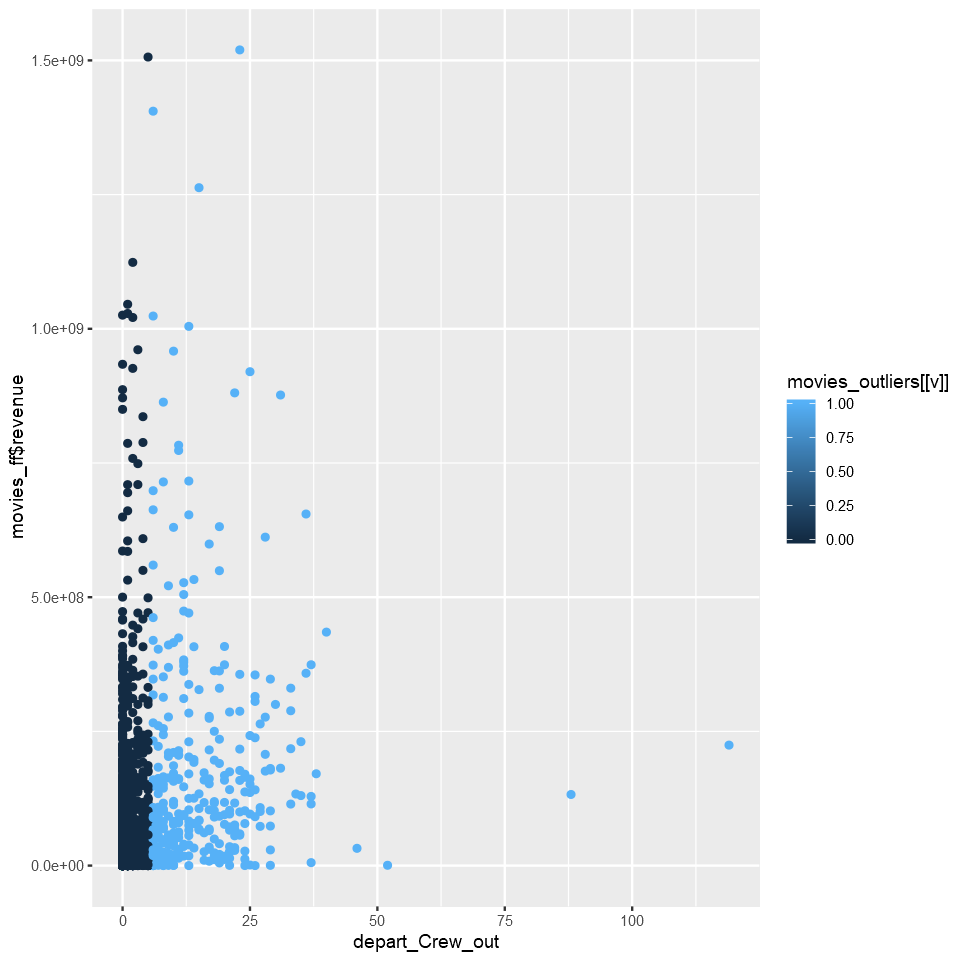

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


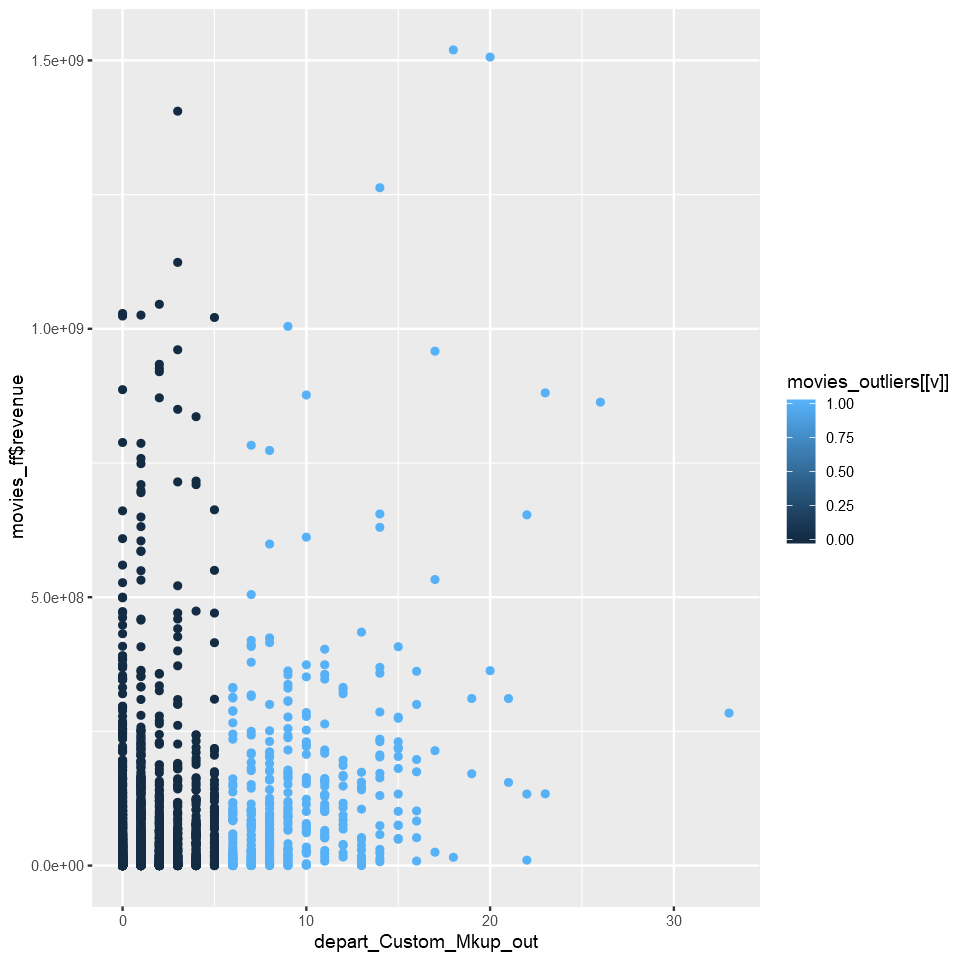

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


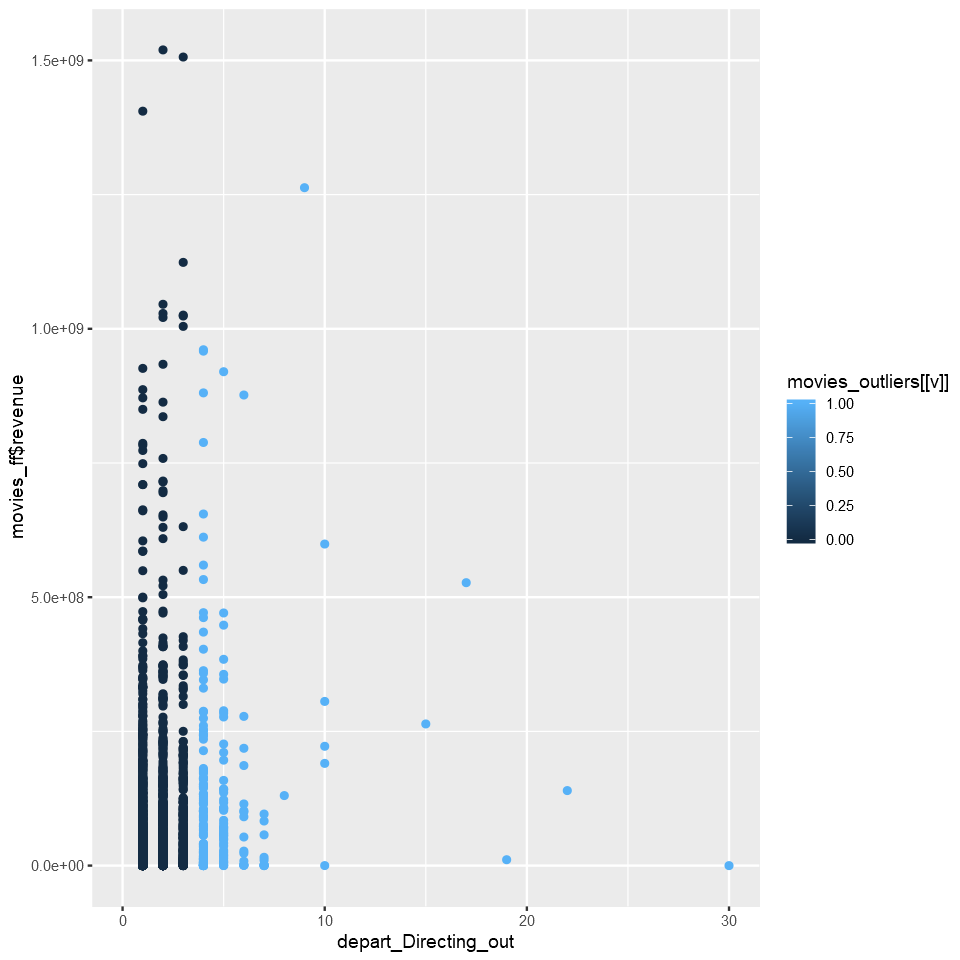

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


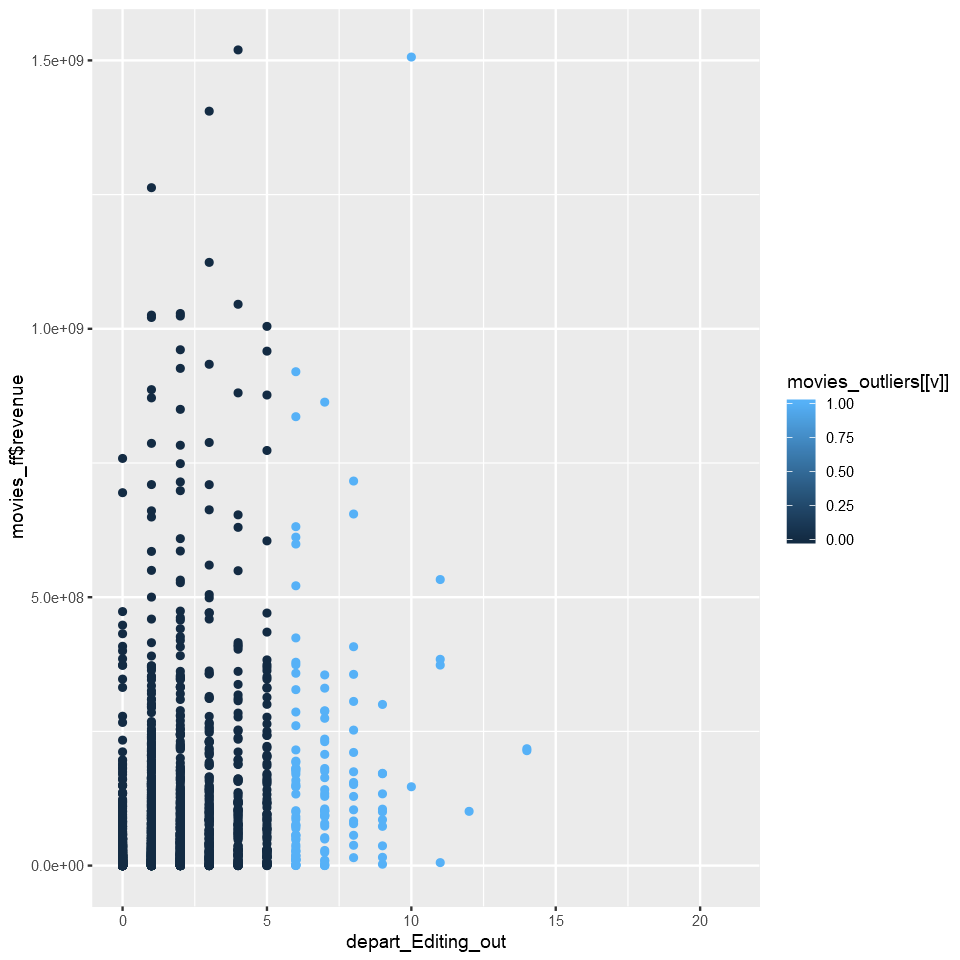

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


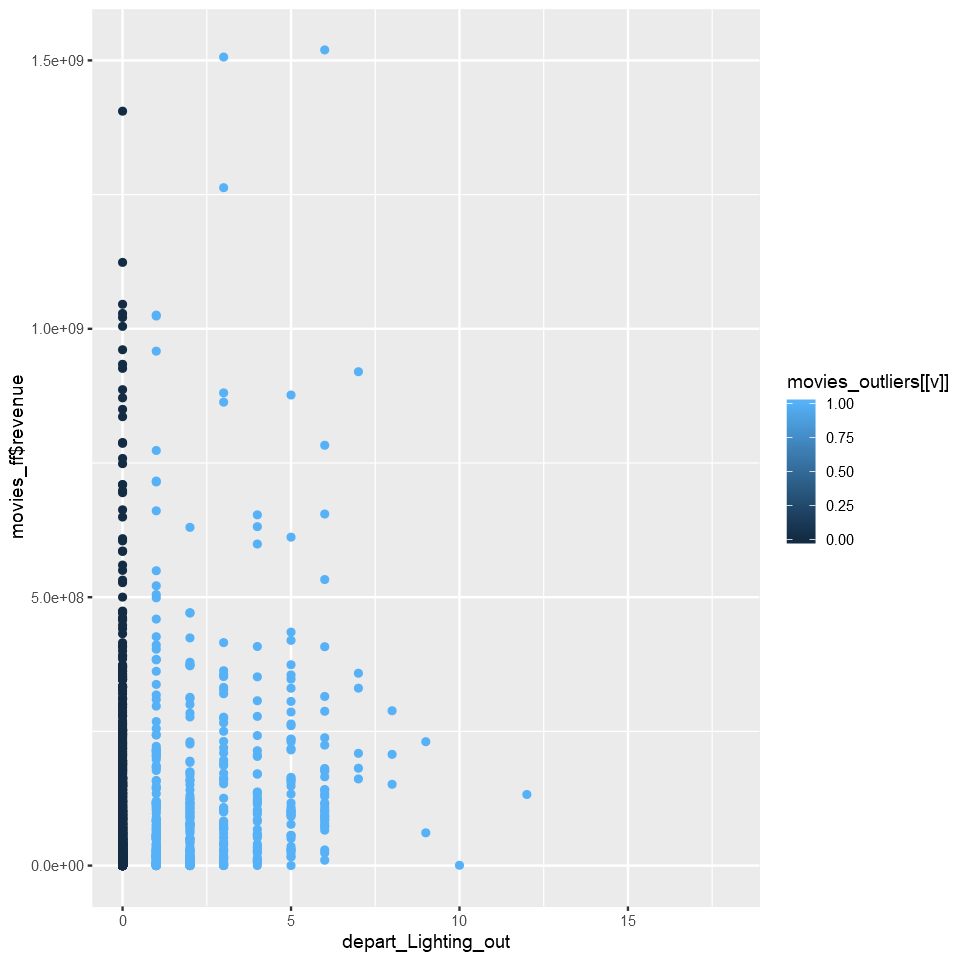

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


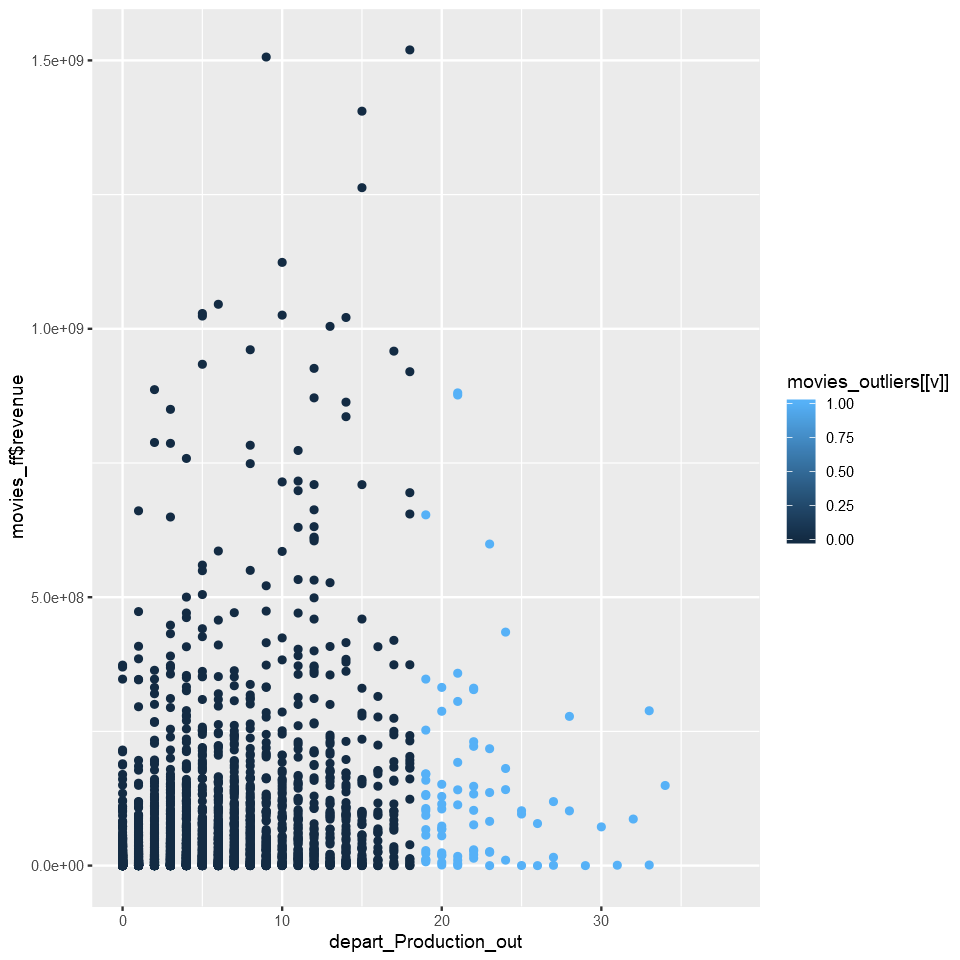

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


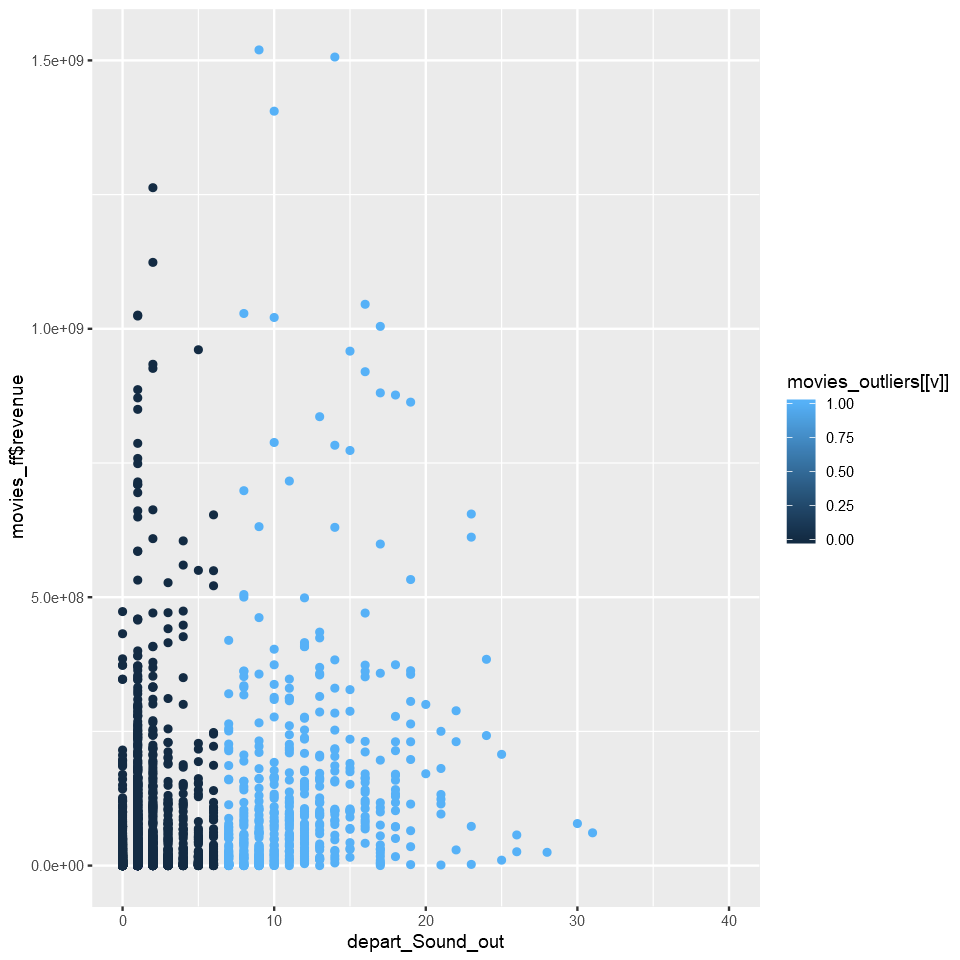

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


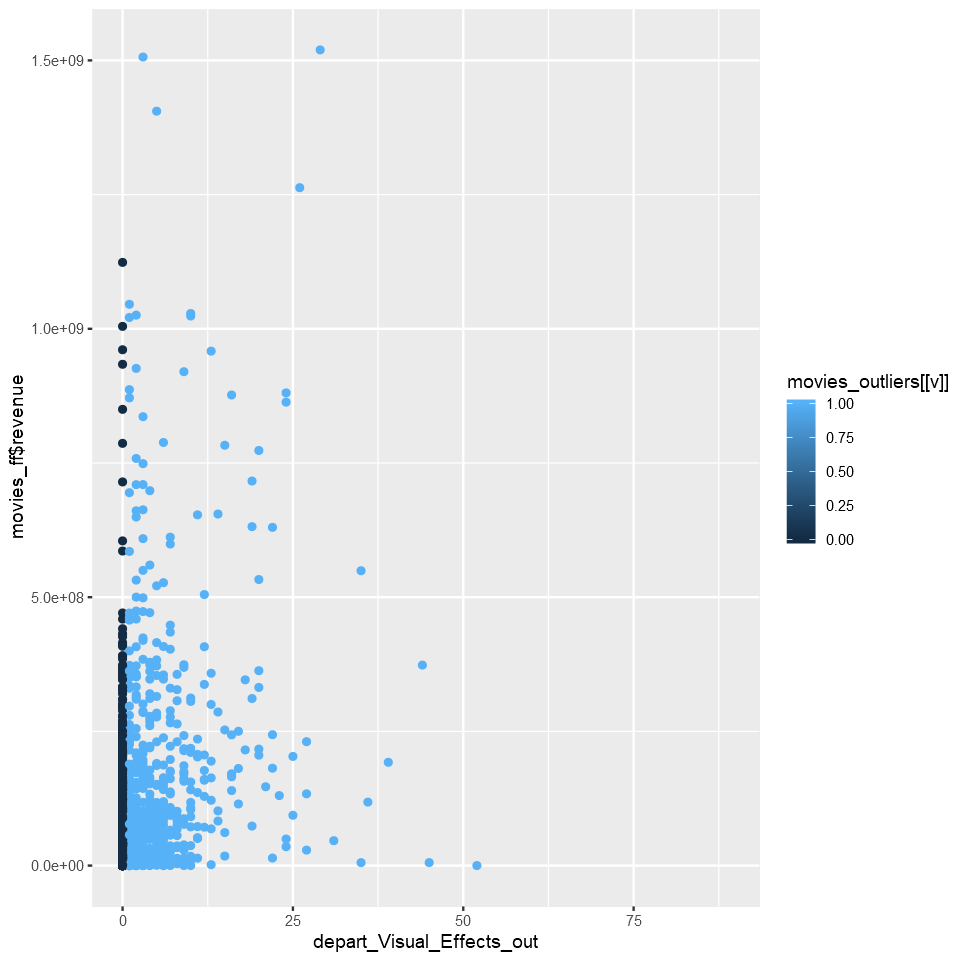

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


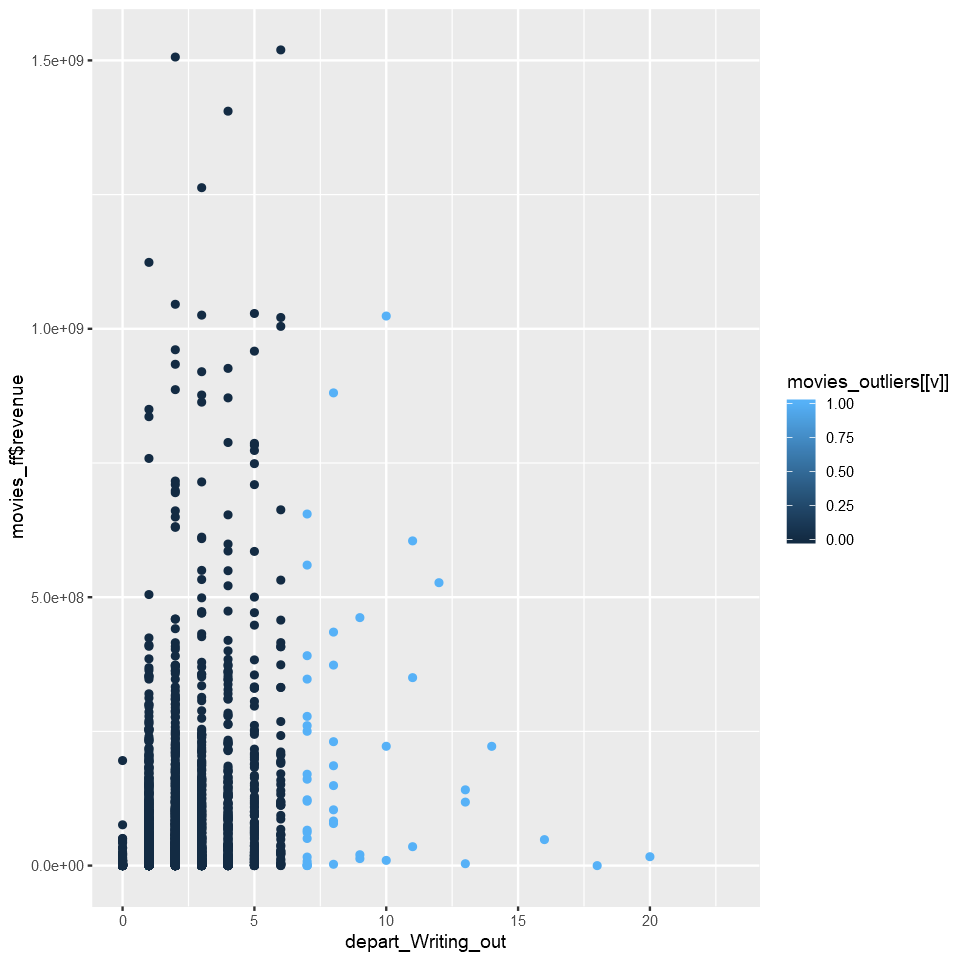

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


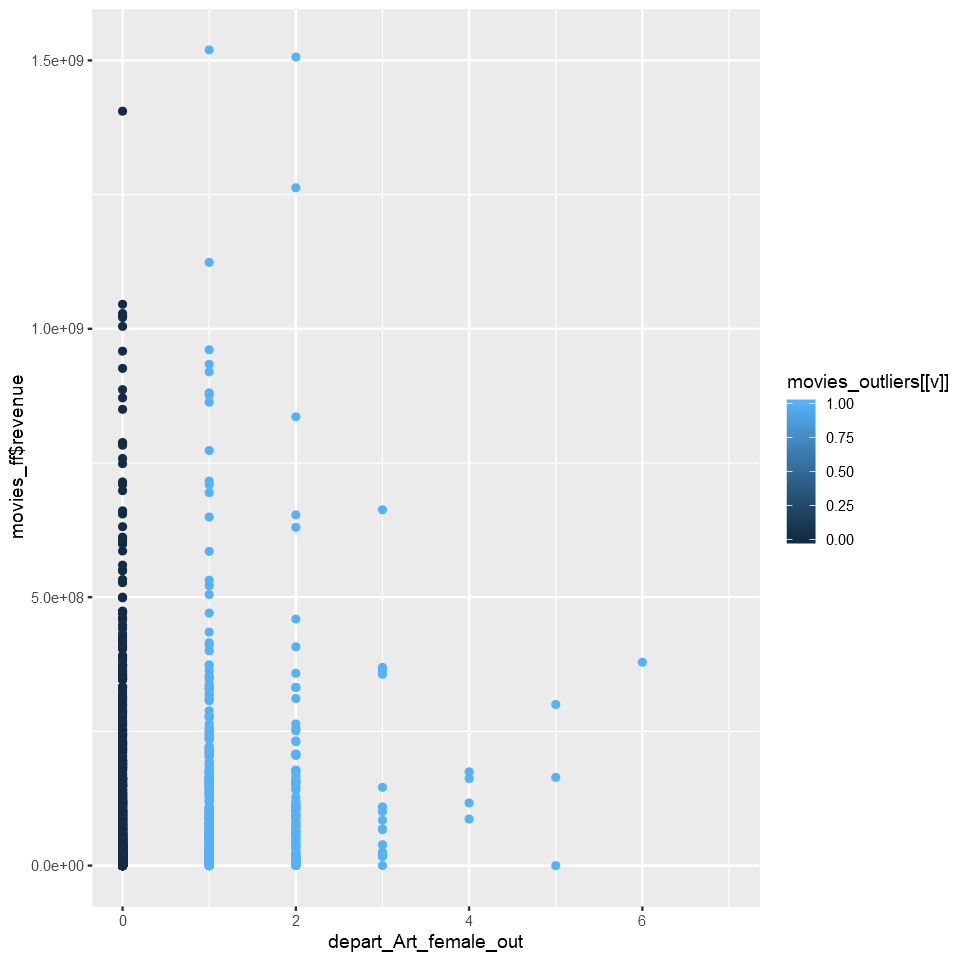

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


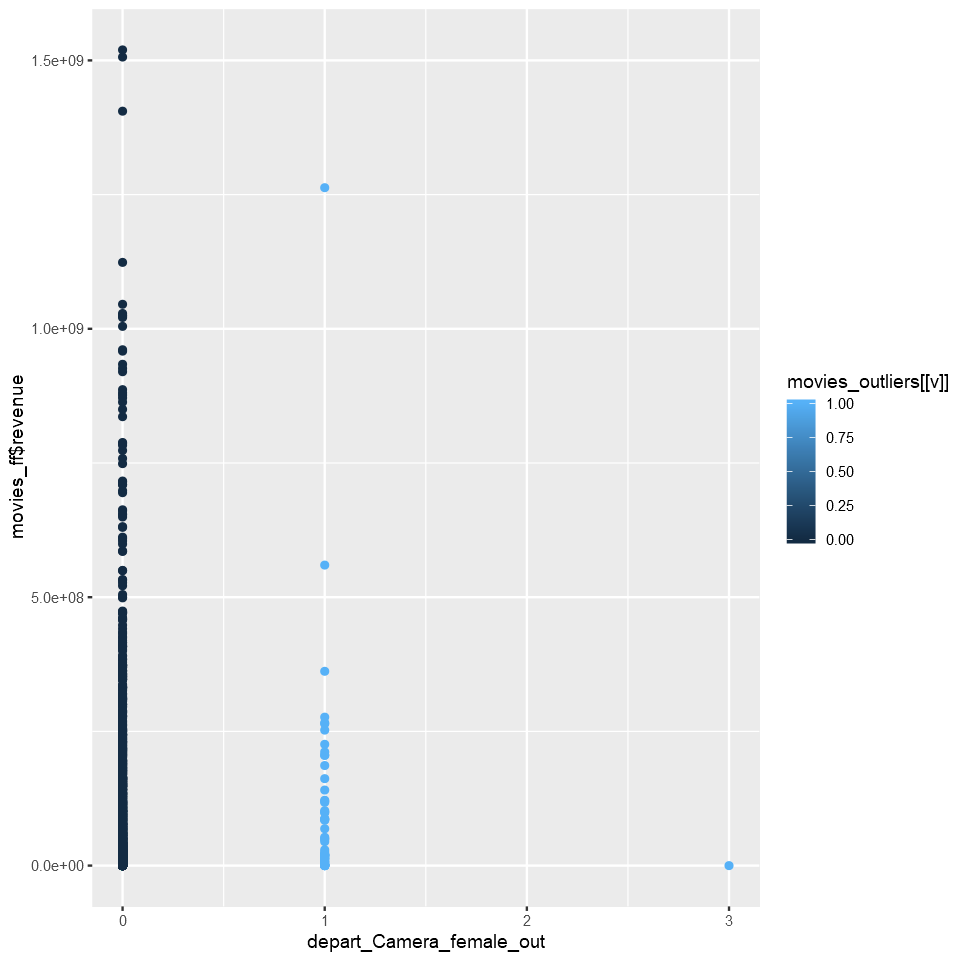

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


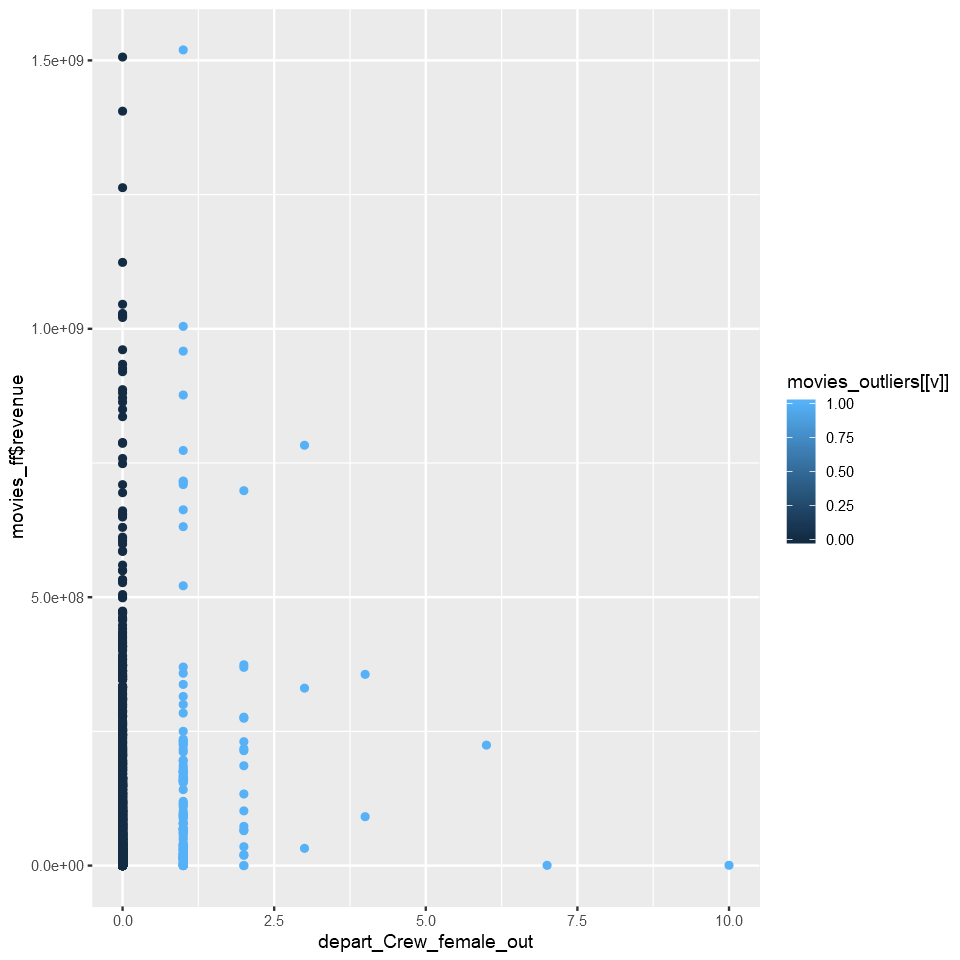

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


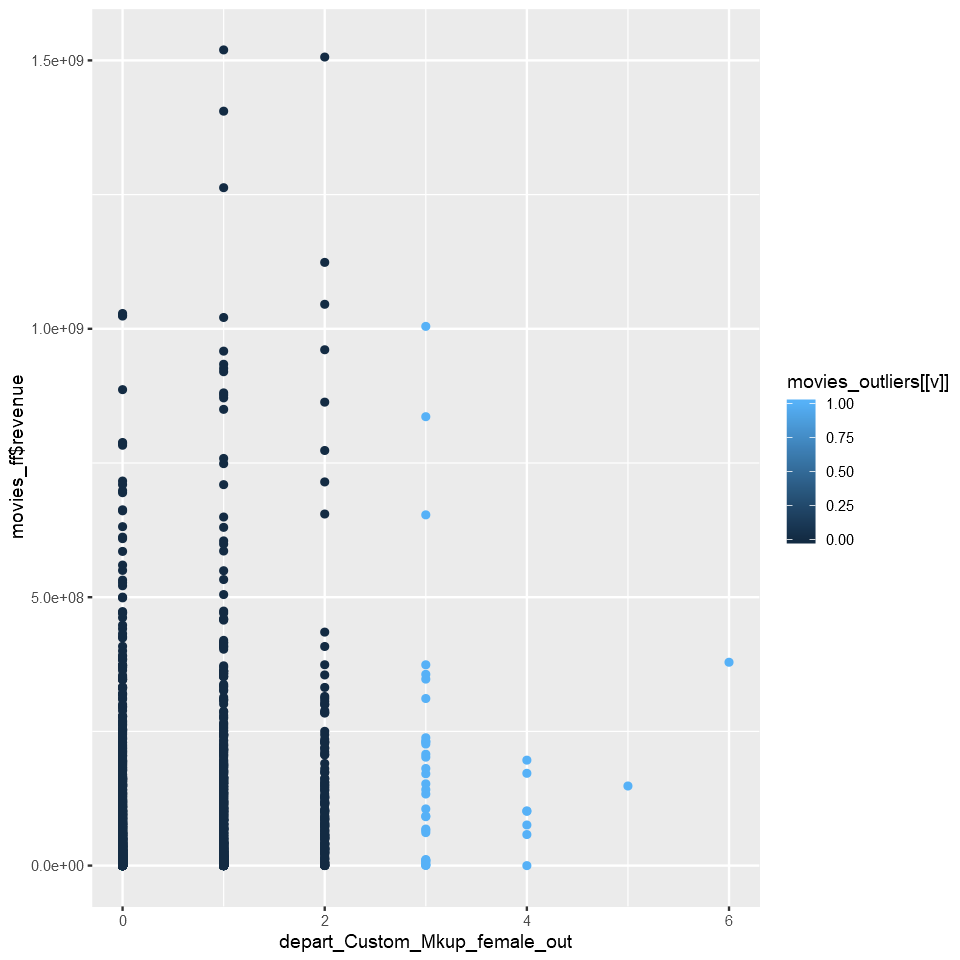

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


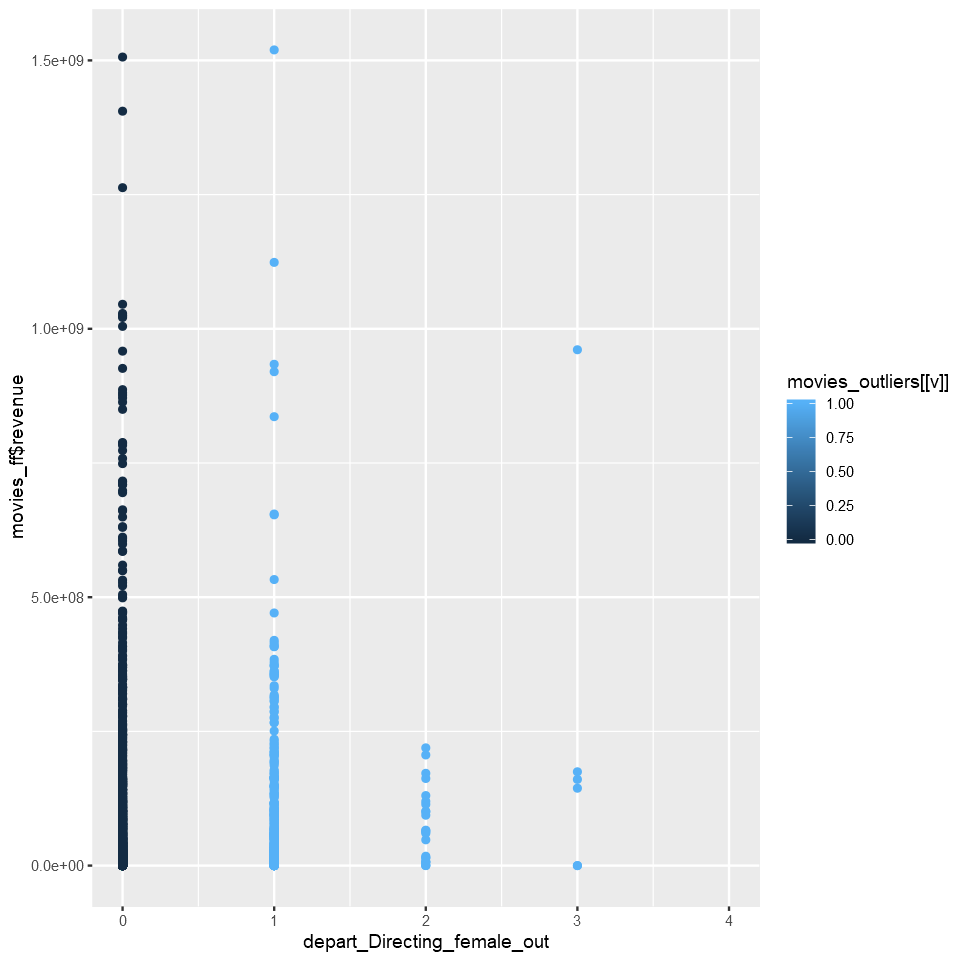

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


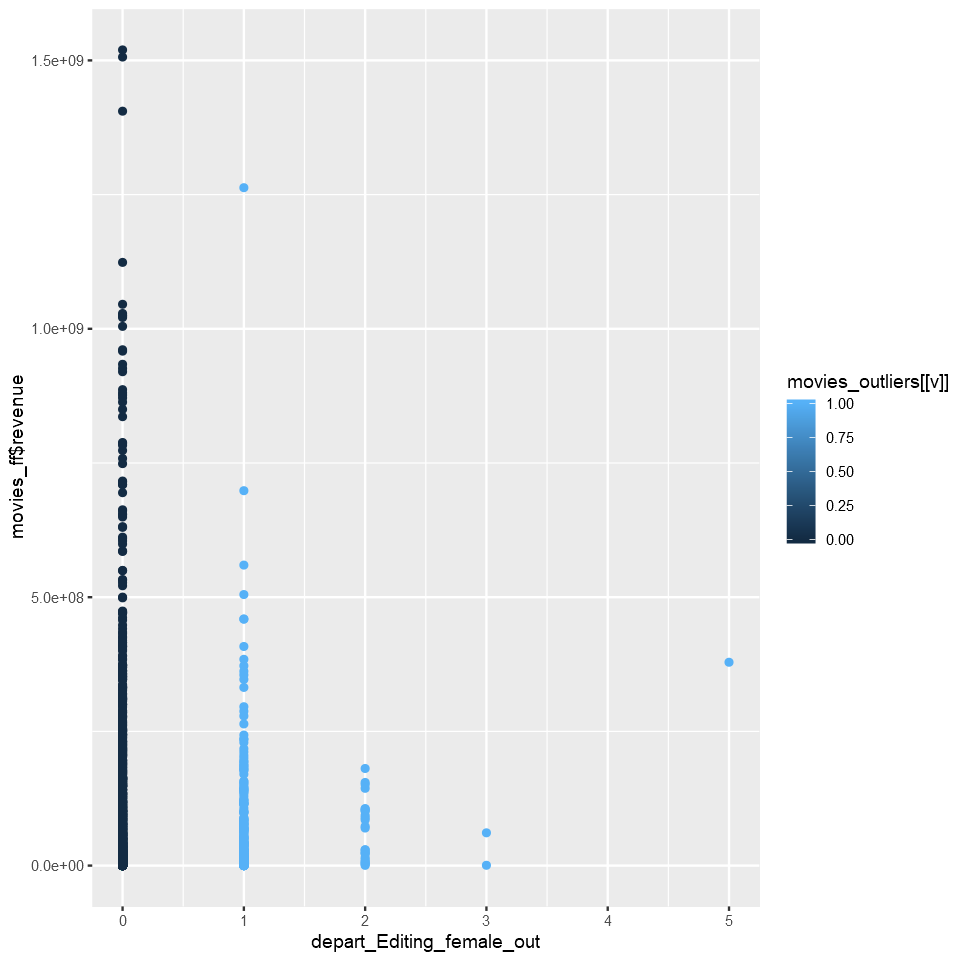

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


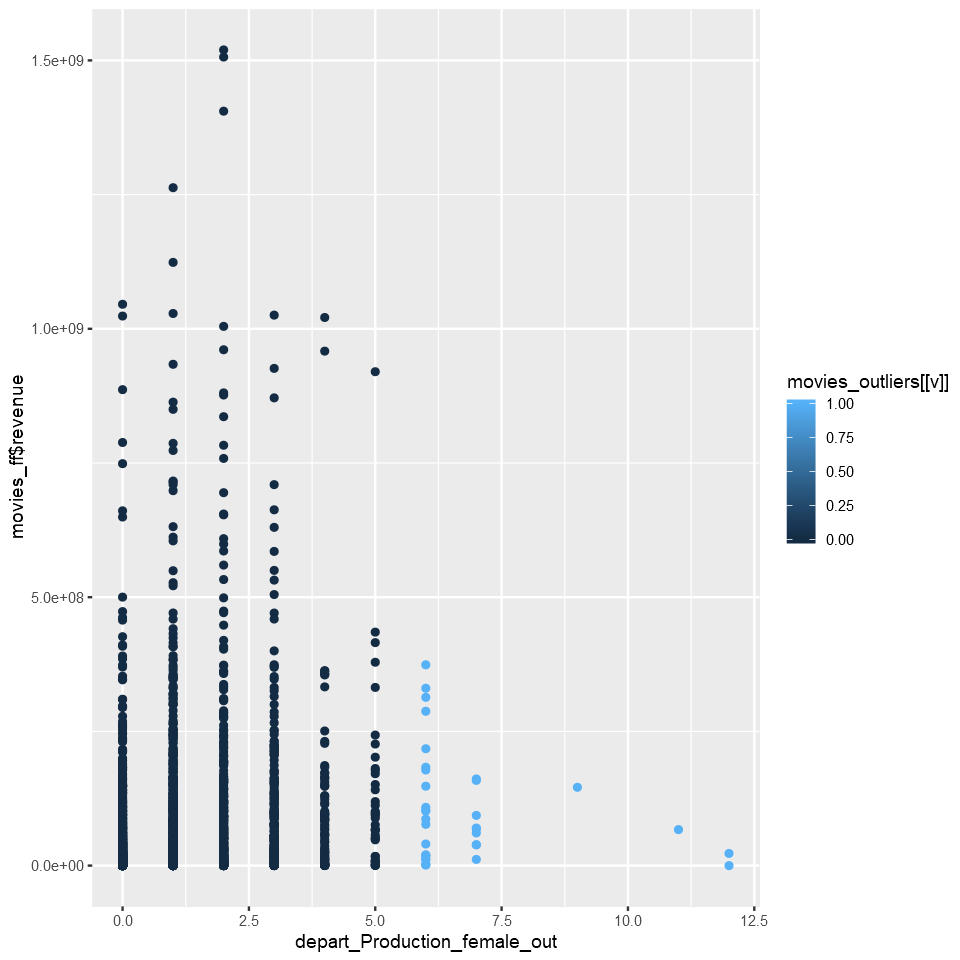

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


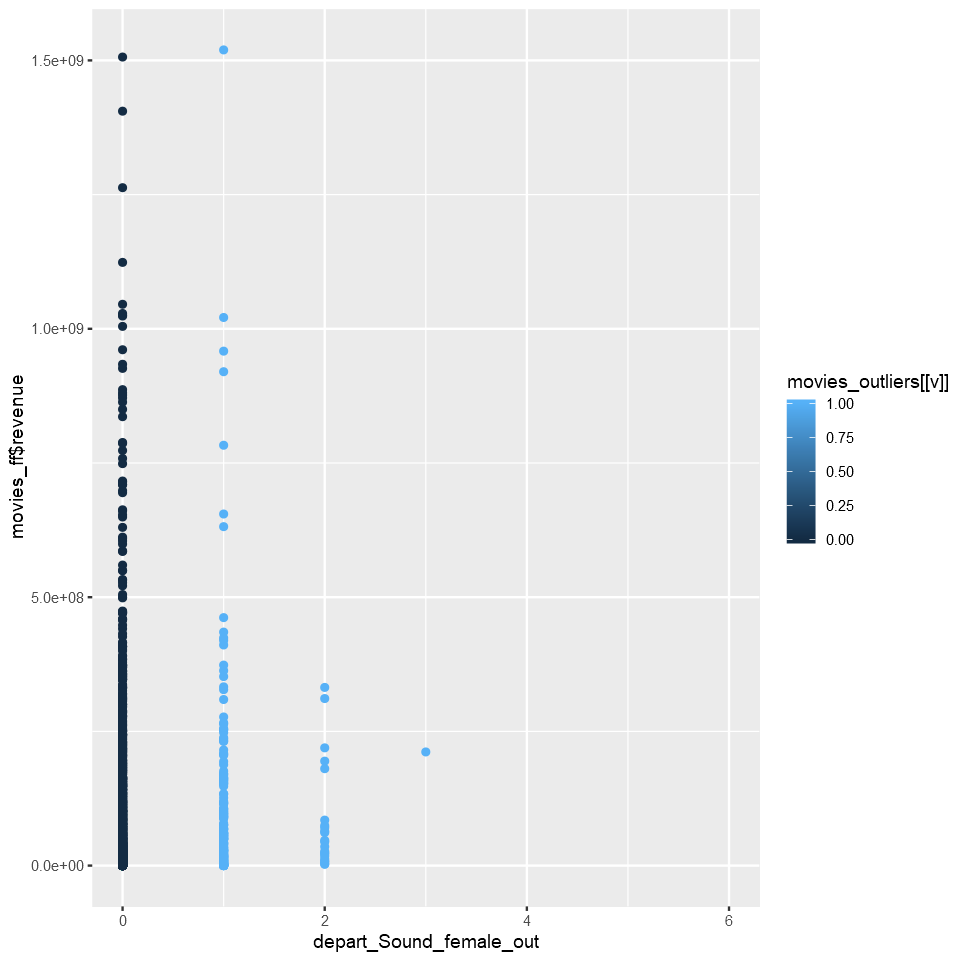

Warning message:
"Removed 4397 rows containing missing values (geom_point)."


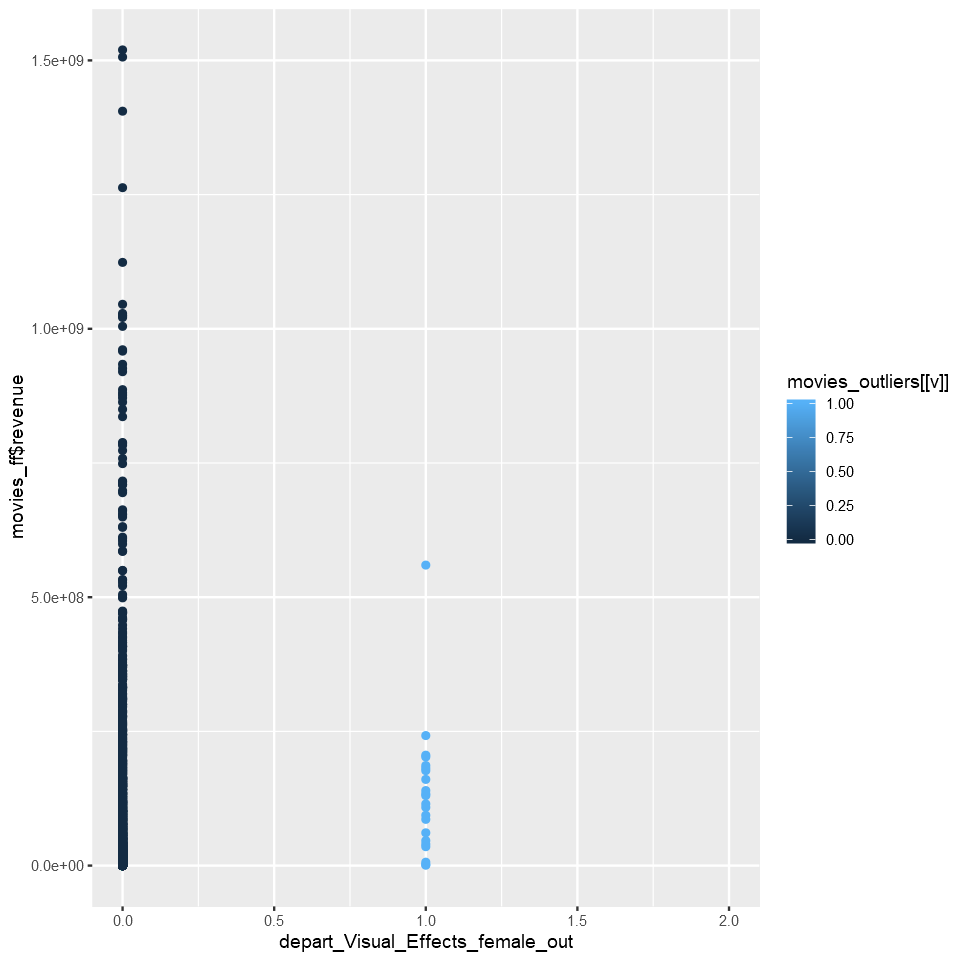

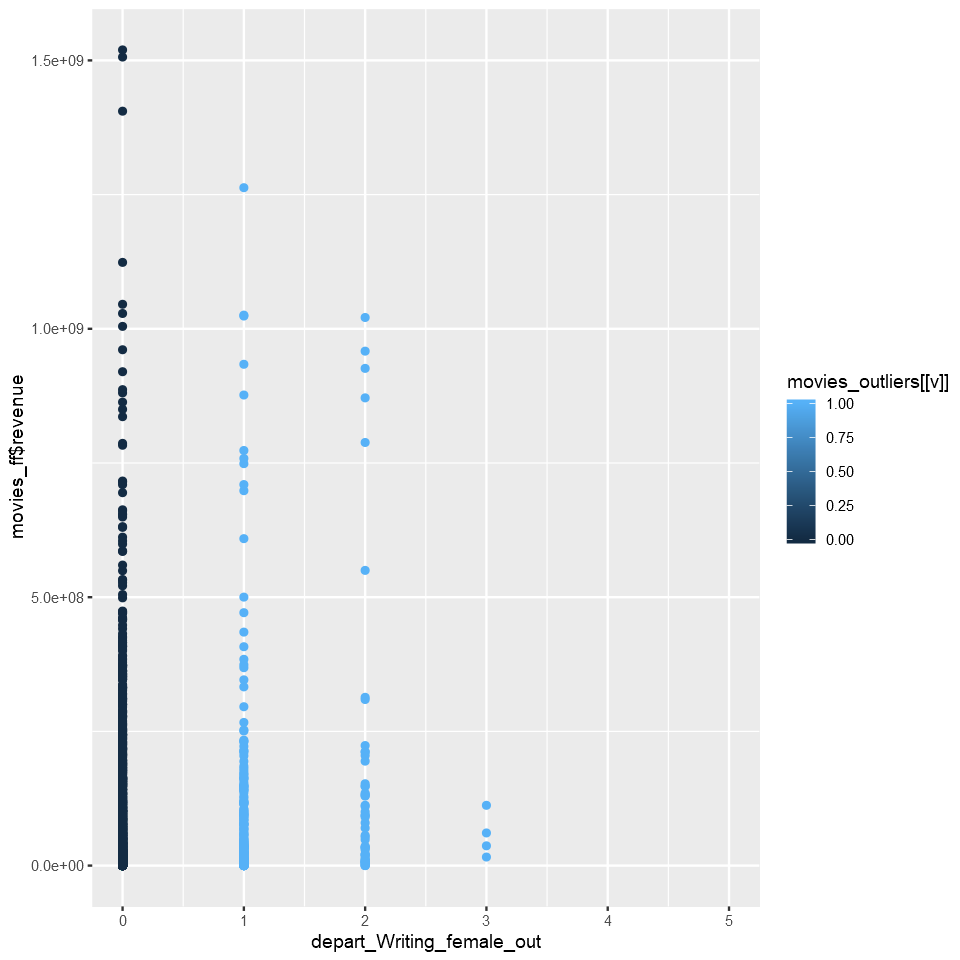

In [18]:

for (v in movies_continuous){
    print(ggplot (movies_ff,aes(x=movies_ff[[v]], y = movies_ff$revenue, group = movies_outliers[[v]],
                                color = movies_outliers[[v]])) + 
          geom_point( +
          xlab(paste(v,'out',sep='_')))
    options(repr.plot.width = 8, repr.plot.height = 8)
}

ERROR: Error: Aesthetics must be either length 1 or the same as the data (7095): x


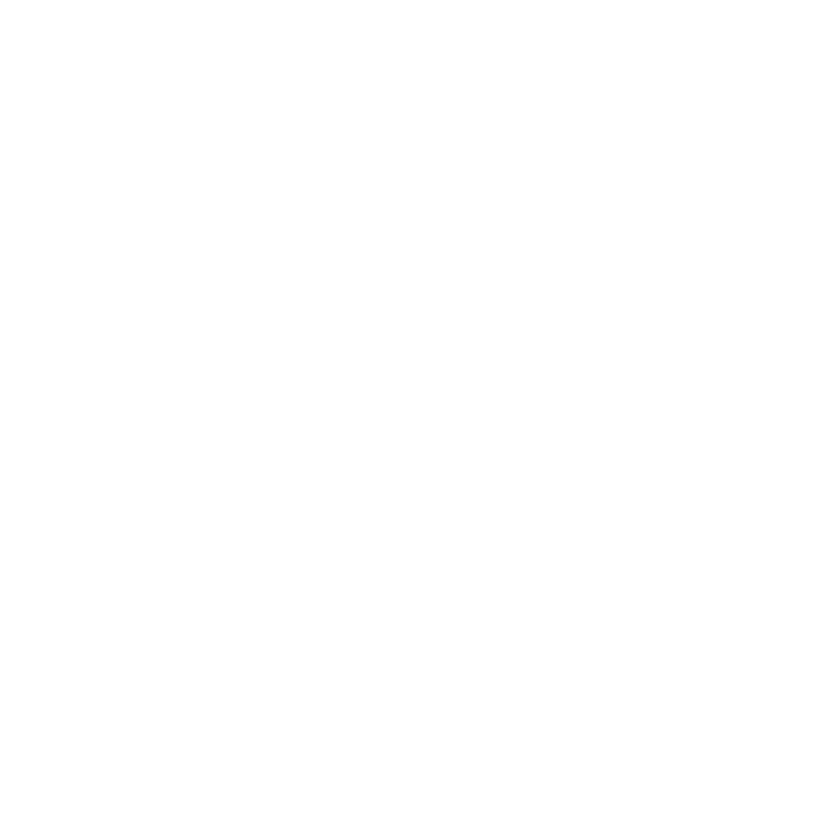

In [67]:
for (v in movies_continuous){
            a <- max(movies_ff[[v]],na.rm=TRUE)
            b1 <- movies_ff %>% select(revenue,v)   
            b2 <- movies_ff %>% select(revenue,v) %>% filter(movies_outliers[[paste0(v,'_out')]]==0) 
            coef <-  coef(lm(movies_ff$revenue~movies_ff[[v]]))
    print(ggplot (movies_ff,aes(x=movies_ff[[v]], y = revenue, group = movies_outliers[[v]],color = movies_outliers[[v]]))+
         geom_point()+
         geom_smooth(method = 'lm',formula = y ~ x, se= FALSE) +
         xlab(v) +
         ylab('revenue') +
         xlim (0,a) +
         {if (length(unique(b2[[v]]))!=1){geom_smooth(data=b2, method = 'lm',formula = y ~ x, se= FALSE,color='red')}})
        
}
          

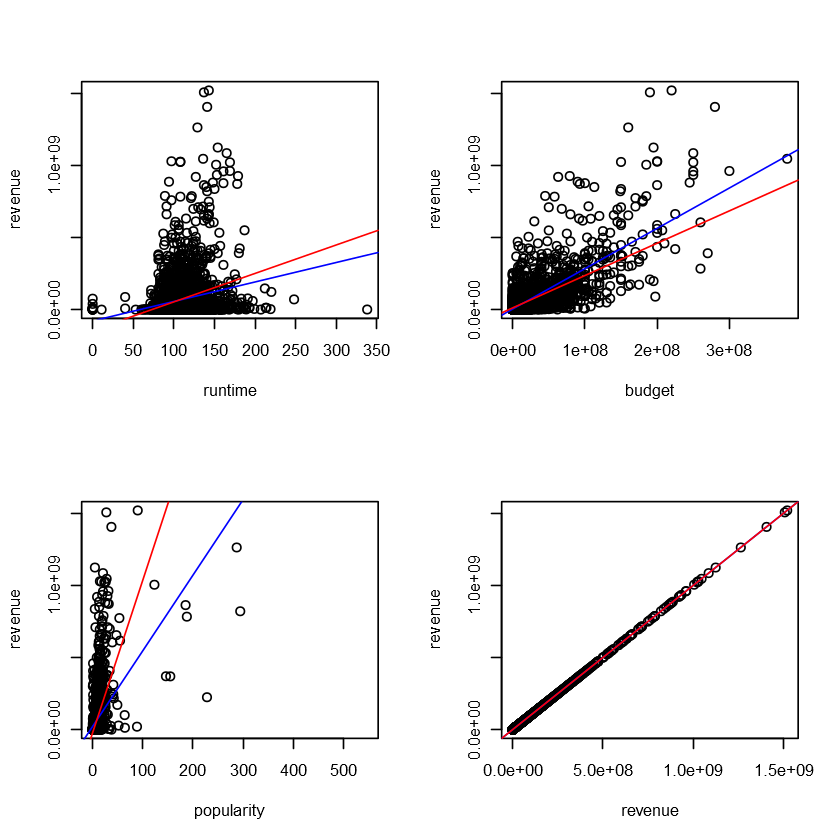

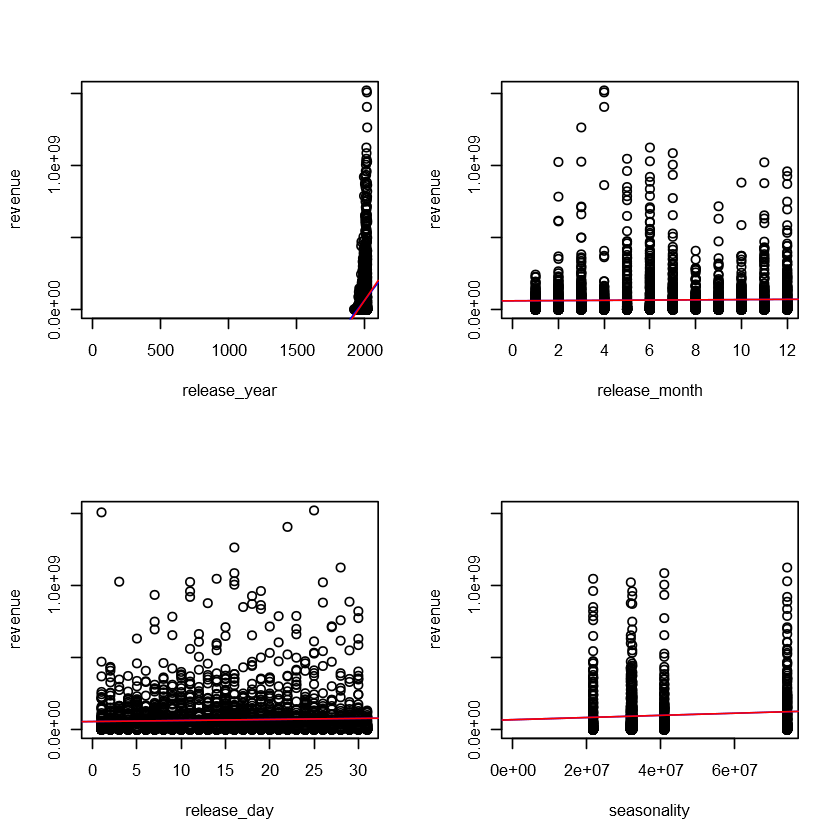

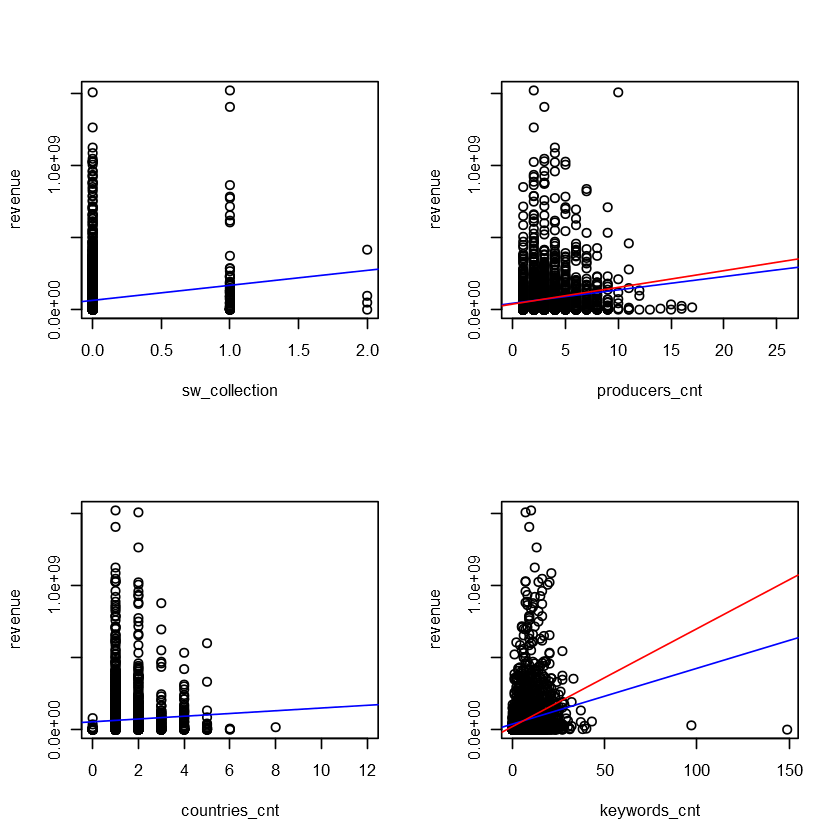

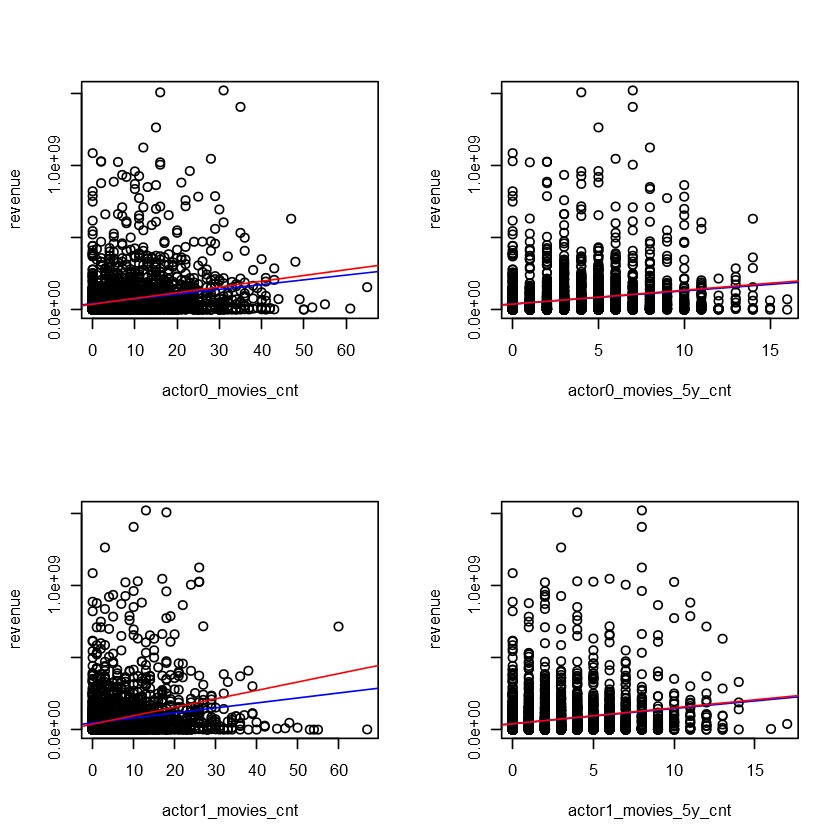

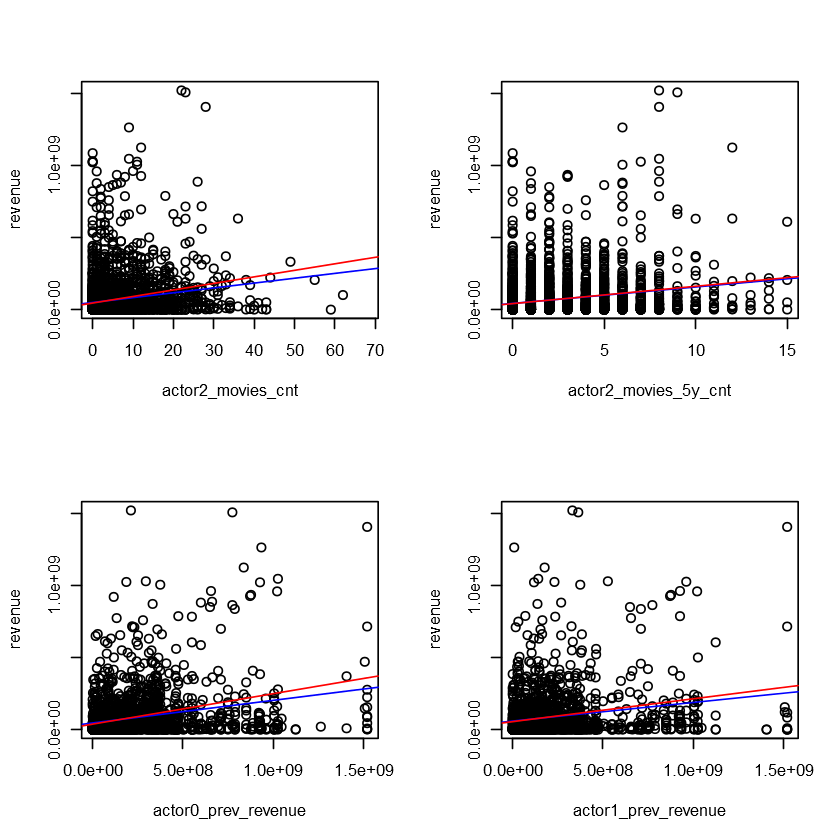

...

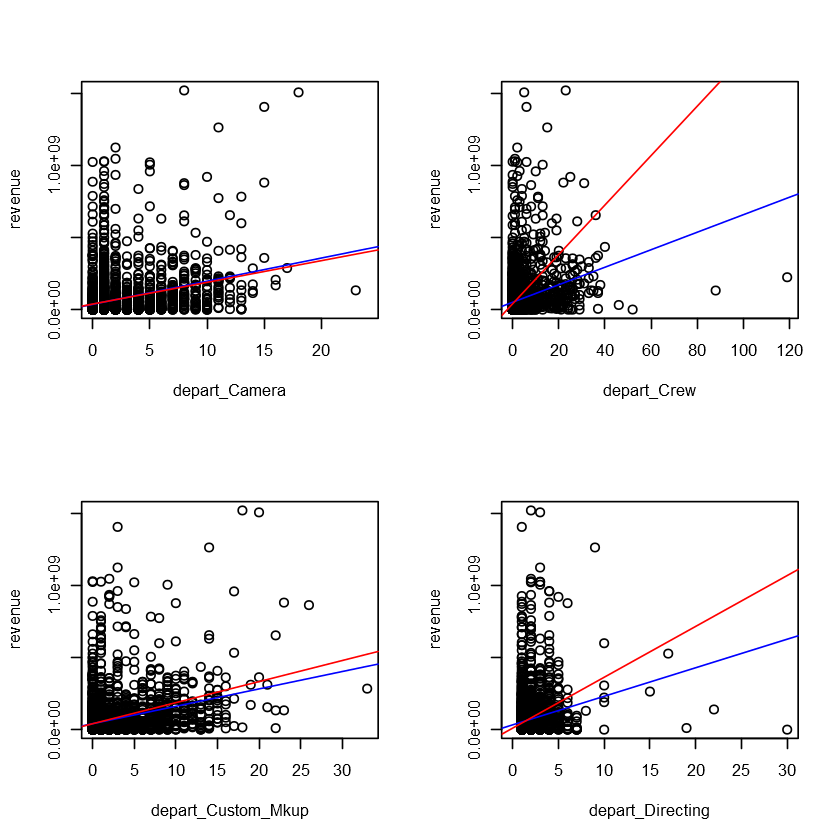

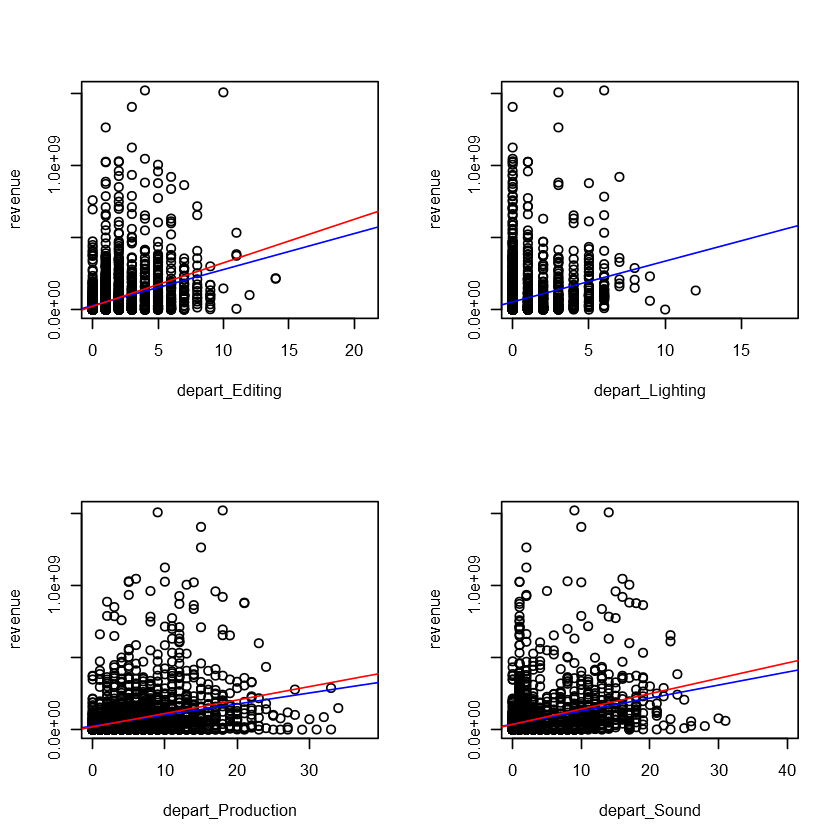

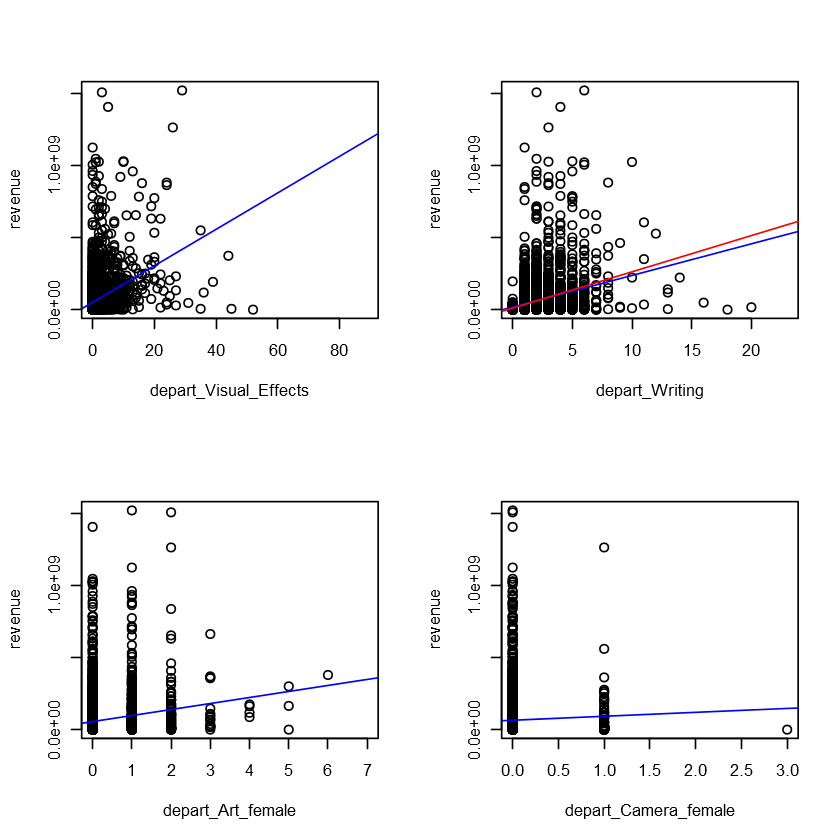

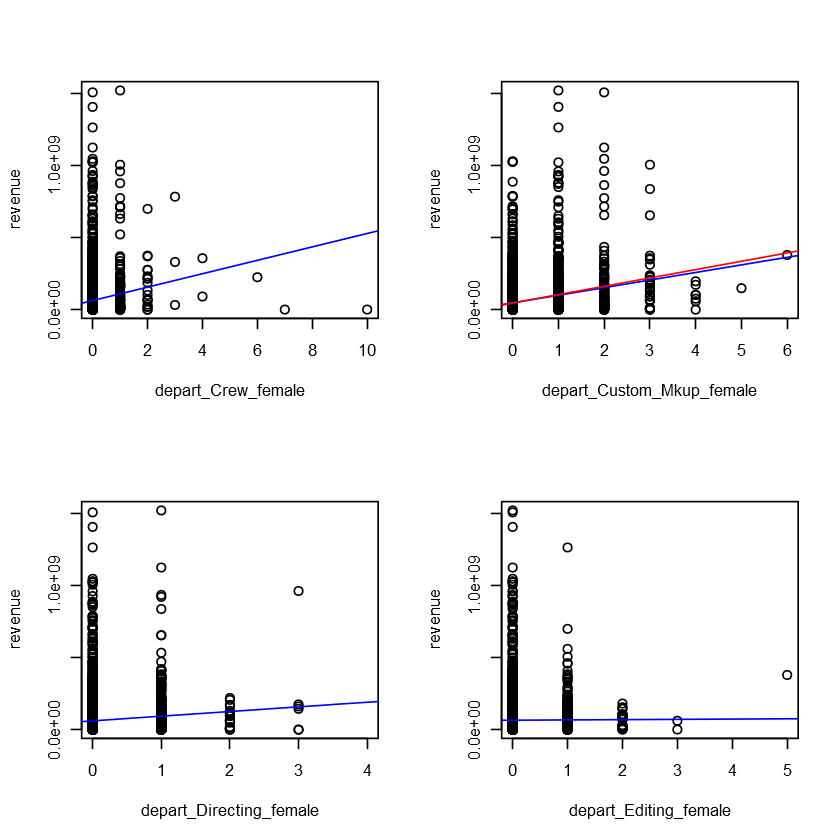

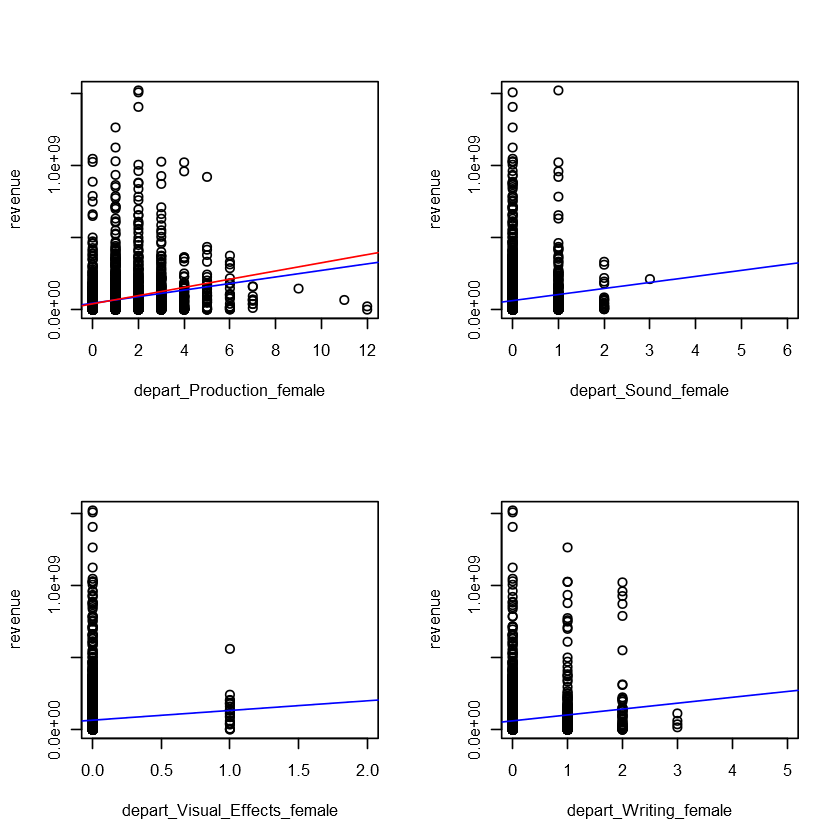

In [76]:
par(mfrow=c(2,2))
for (v in movies_continuous){
            a <- max(movies_ff[[v]],na.rm=TRUE)
            b1 <- movies_ff %>% select(revenue,v)   
            b2 <- movies_ff %>% select(revenue,v) %>% filter(movies_outliers[[paste0(v,'_out')]]==0) 
            plot (b1[[v]],b1$revenue,xlab=v,ylab='revenue',xlim=c(0,a))
            abline(coef(lm(b1$revenue~b1[[v]])), col='blue')
            if (length(unique(b2[[v]]))!=1){
            abline(coef(lm(b2$revenue~b2[[v]])), col = "red")}
    }

### 3.1.3 באיזה משתנים הייתם מוחקים את ערכי הקיצון? איך הייתם מוחקים אותם? נמקו

לפי הגרפים למעלה ניתן לראות כי מחיקה של של ערכי קיצון תשנה את ההתפלגות של של הנתונים בחלק מהערכים , לכן במקרה כזה נעשה טרנספורמציה לנתונים, נבדוק את  הנתונים מחדש לאחר טרנספורמציה ונעדכן את הדאטה בהתאם 
במקרים בהם ההתפלגות והתוצאה לא משתנות ניתן למחוק את ערכי הקיצון ע"י שימוש בוקטור של החסרים 

### 3.1.4 transofrming
רק במשתנים שאי אפשר להפוך את הקיצון לNA

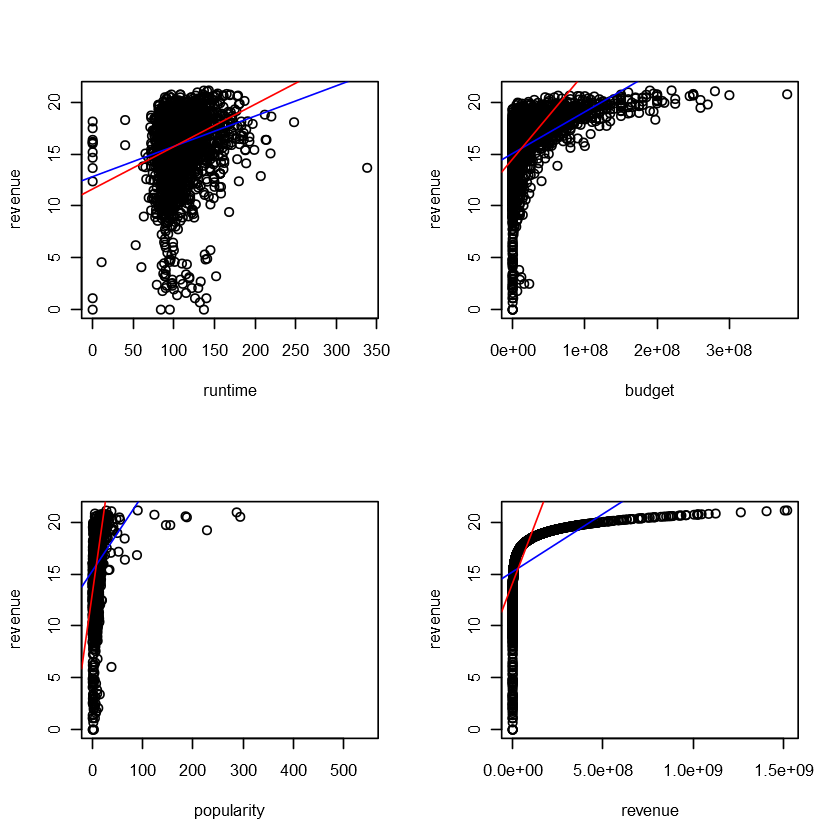

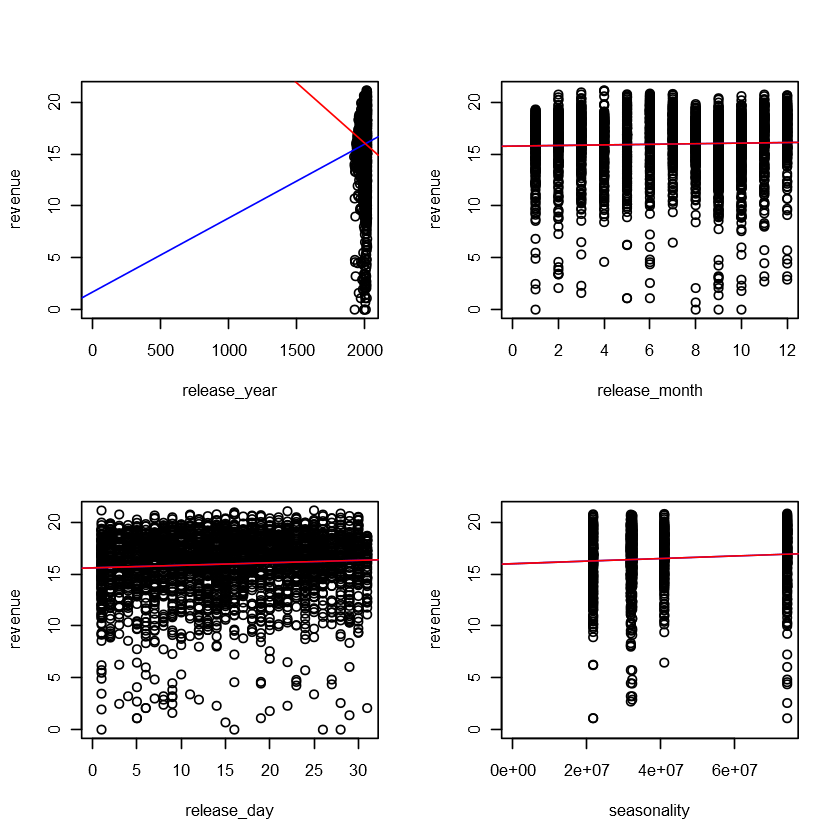

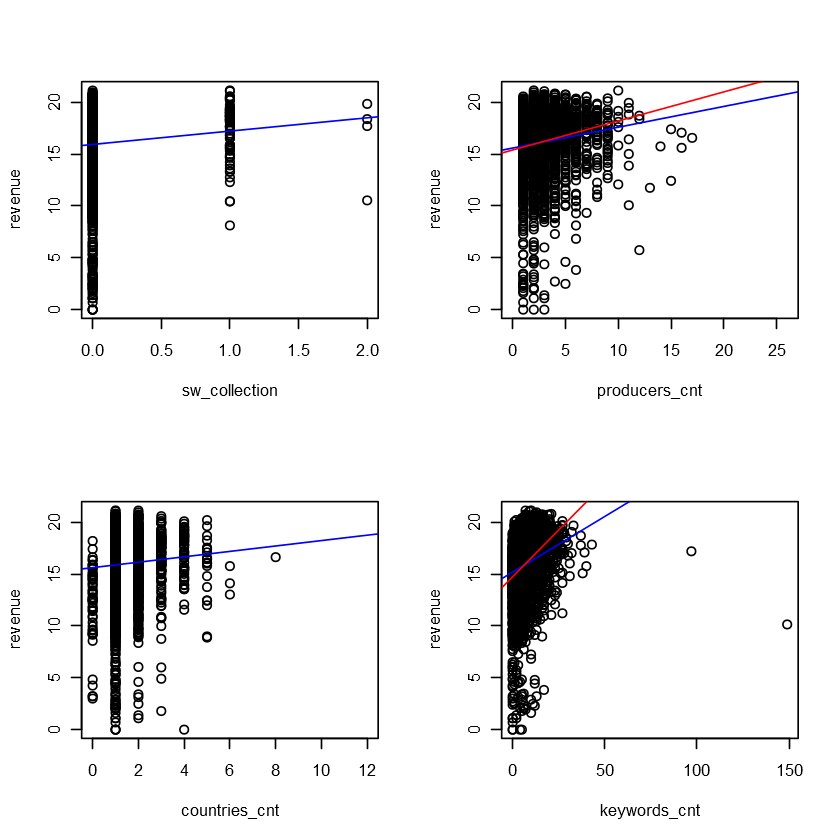

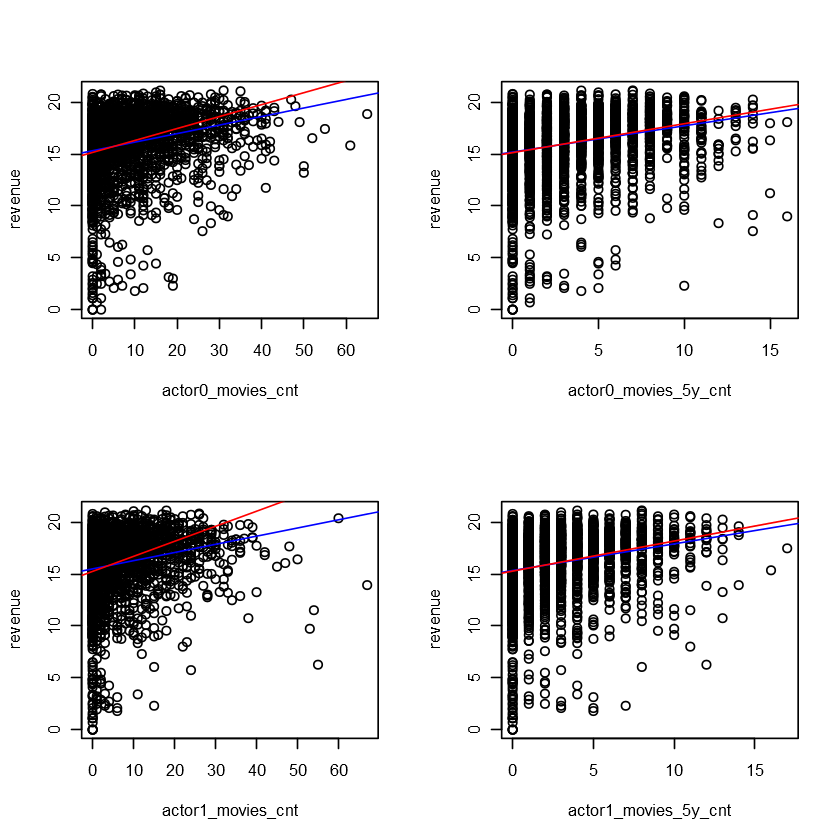

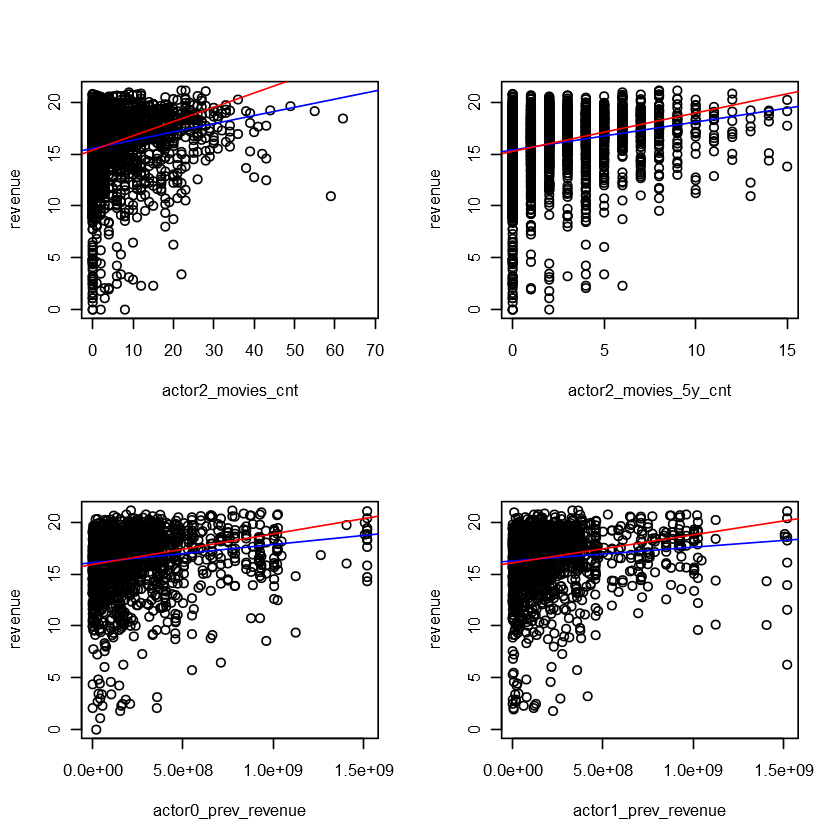

...

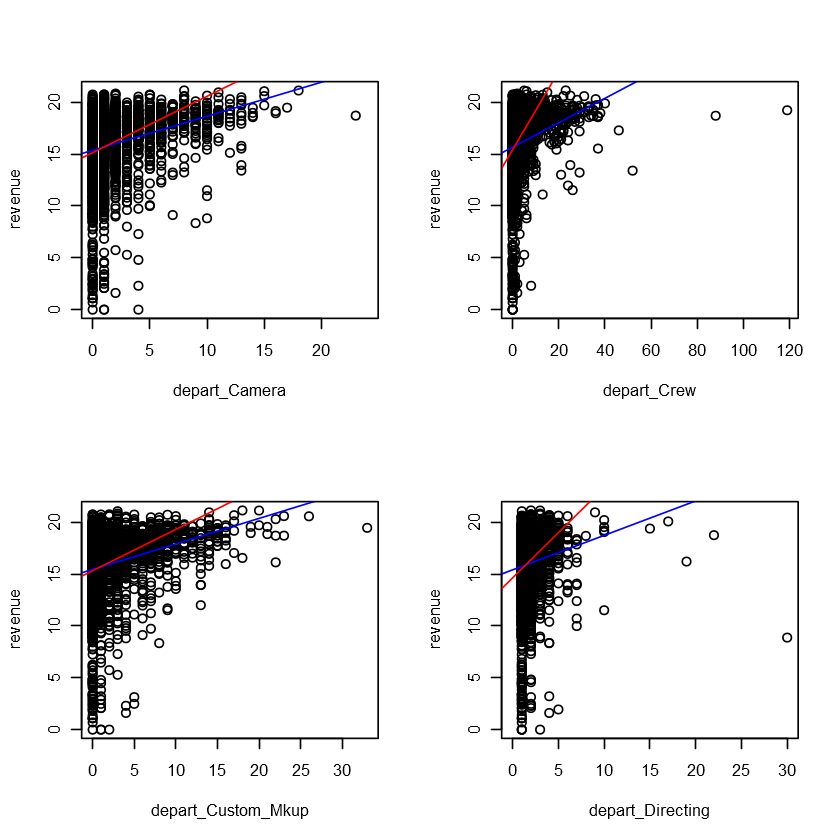

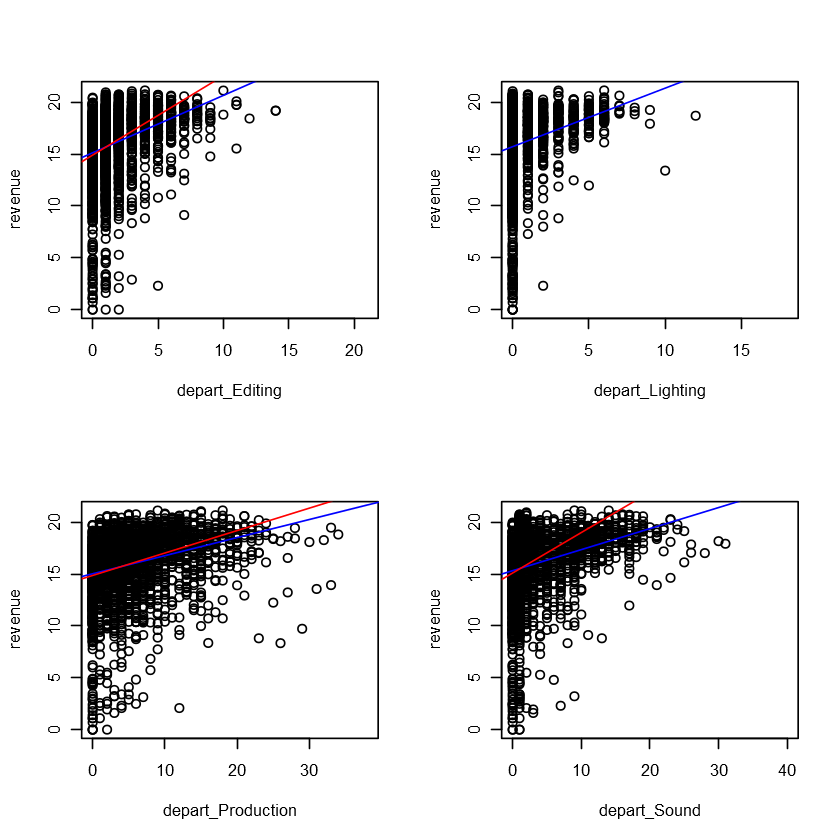

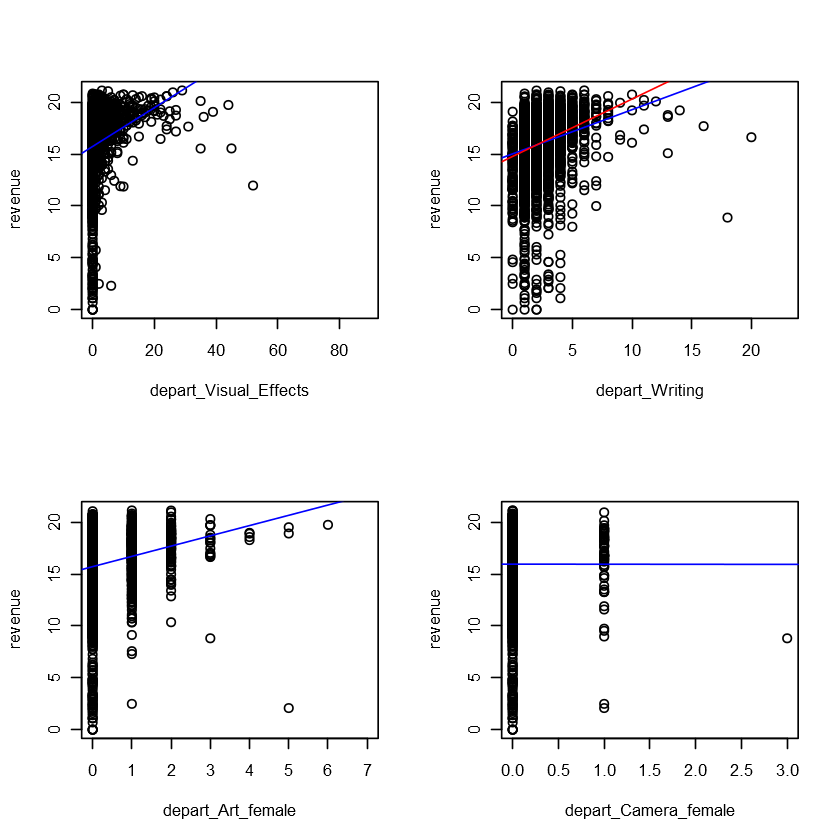

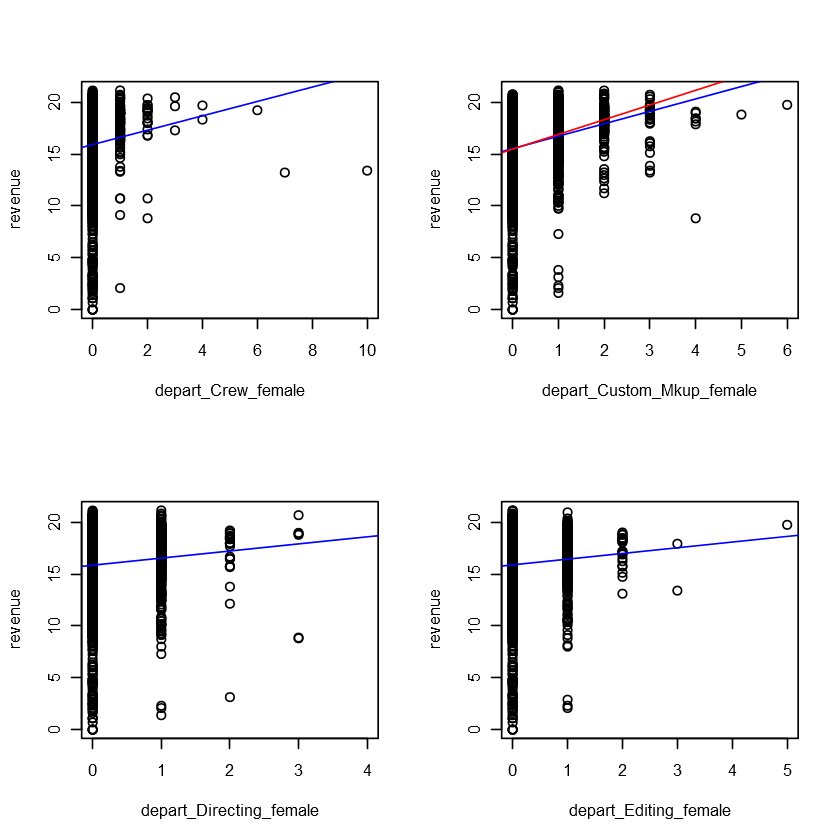

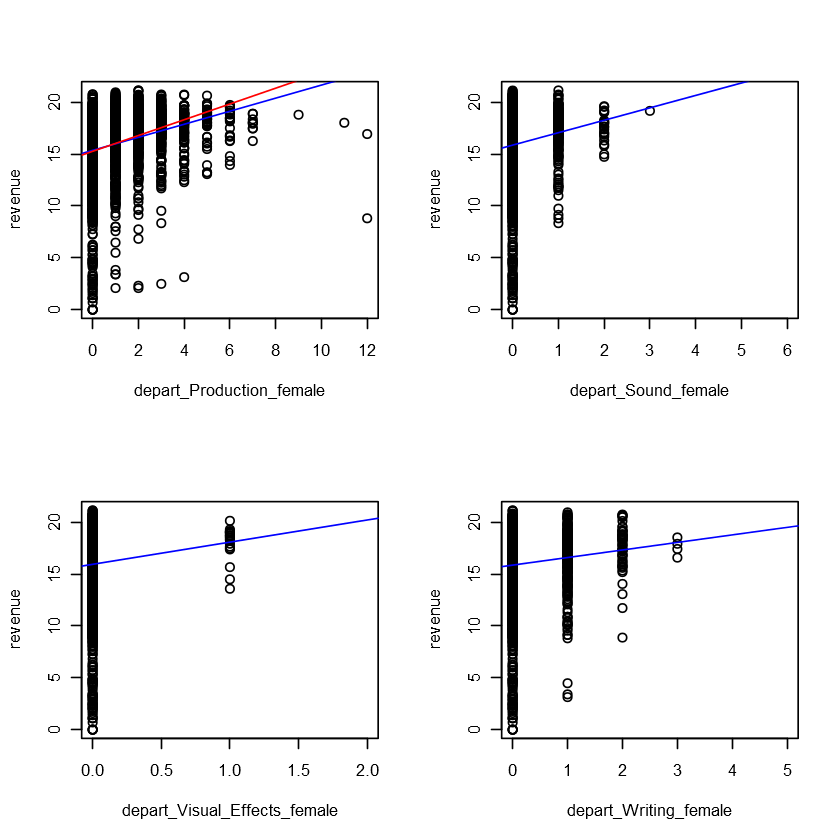

In [75]:
# log(revenue)
par(mfrow=c(2,2))
for (v in movies_continuous){
            a <- max(movies_ff[[v]],na.rm=TRUE)
            b1 <- movies_ff %>% select(revenue,v)   
            b2 <- movies_ff %>% select(revenue,v) %>% filter(movies_outliers[[paste0(v,'_out')]]==0) 
            plot (b1[[v]],log(b1$revenue),xlab=v,ylab='revenue',xlim=c(0,a))
            abline(coef(lm(log(b1$revenue)~b1[[v]])), col='blue')
            if (length(unique(b2[[v]]))!=1){
            abline(coef(lm(log(b2$revenue)~b2[[v]])), col = "red")}
            
    }

Warning message in sqrt(movies_ff$budget):
"NaNs produced"


ERROR: Error in int_abline(a = a, b = b, h = h, v = v, untf = untf, ...): 'a' and 'b' must be finite


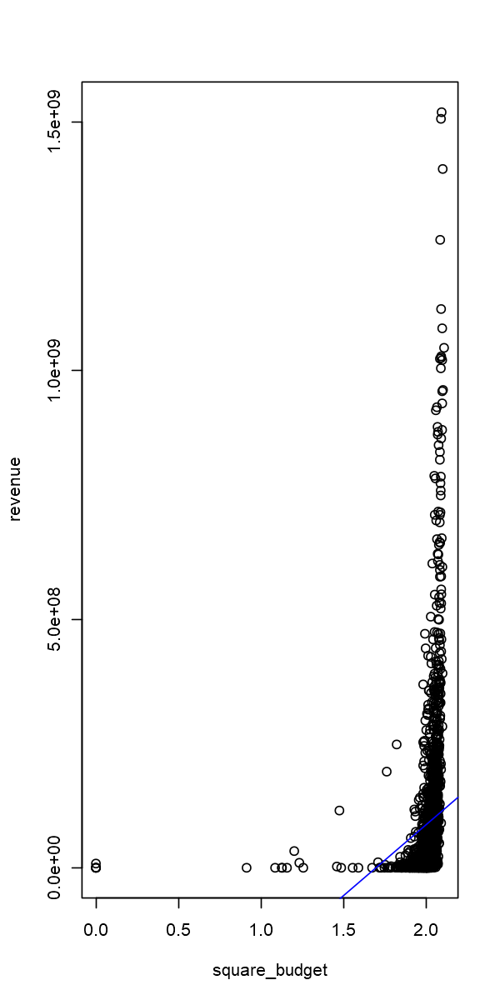

In [105]:
# log(x)
movies_ff$budget <-sqrt(movies_ff$budget)

plot(sqrt(movies_ff$budget),movies_ff$revenue, xlab='square_budget', ylab='revenue')
abline(coef(lm(movies_ff$revenue~sqrt(movies_ff$budget))), col='blue')
abline(coef(lm(movies_ff$revenue~(movies_ff$budget %in% out_budget$out)==0)), col='red')


## 3.2 נתונים חסרים
רק לאחר שהורדנו קיצון

### 3.2.1. עבור כל משתנה עם נתונים חסרים, תראו את ההתפלגות של משתנים אחרים עם או בלי חסרים. השתמשו במטריצת החסרים שייצרתם בחלק 2, שאלה 7 עבור החיווי של יש/אין חסר עבור ההתפלגות, תשתמשו בהיסטוגרמה או בגרף density 

In [17]:
head(movies_missing, n=10)

,movie_id,original_language,release_date,runtime_cat,runtime,budget,popularity,revenue,sw_lang_en,sw_web_presence,...,depart_Camera_female,depart_Crew_female,depart_Custom_Mkup_female,depart_Directing_female,depart_Editing_female,depart_Lighting_female,depart_Production_female,depart_Sound_female,depart_Visual_Effects_female,depart_Writing_female
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


ERROR: Error in .subset2(x, i, exact = exact): no such index at level 1



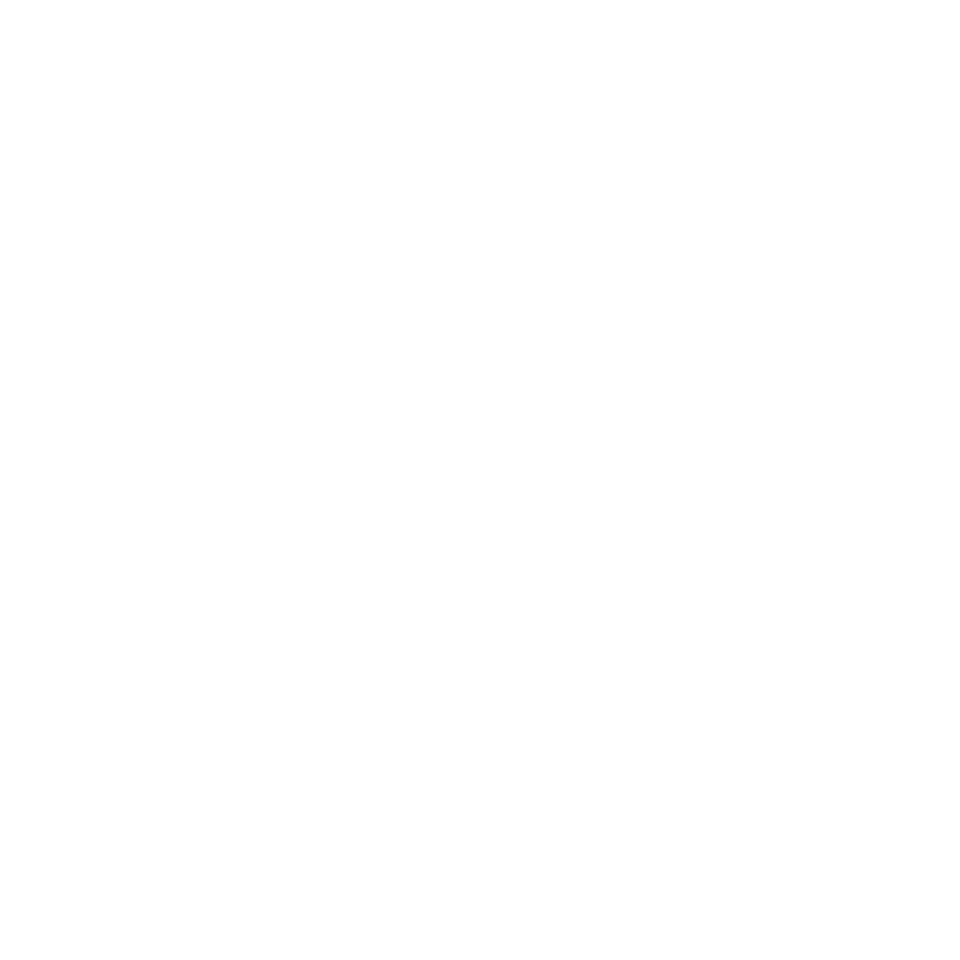

In [62]:
 for (v in movies_missing){
    
    print(ggplot (movies_missing,aes(x='revenue', group = factor(movies_missing[[paste0(v,"_na")]]),
                                color = factor(movies_missing[[paste0(v,"_na")]]))) + 
          geom_density()  )
  }

   options(repr.plot.width = 8, repr.plot.height = 8)

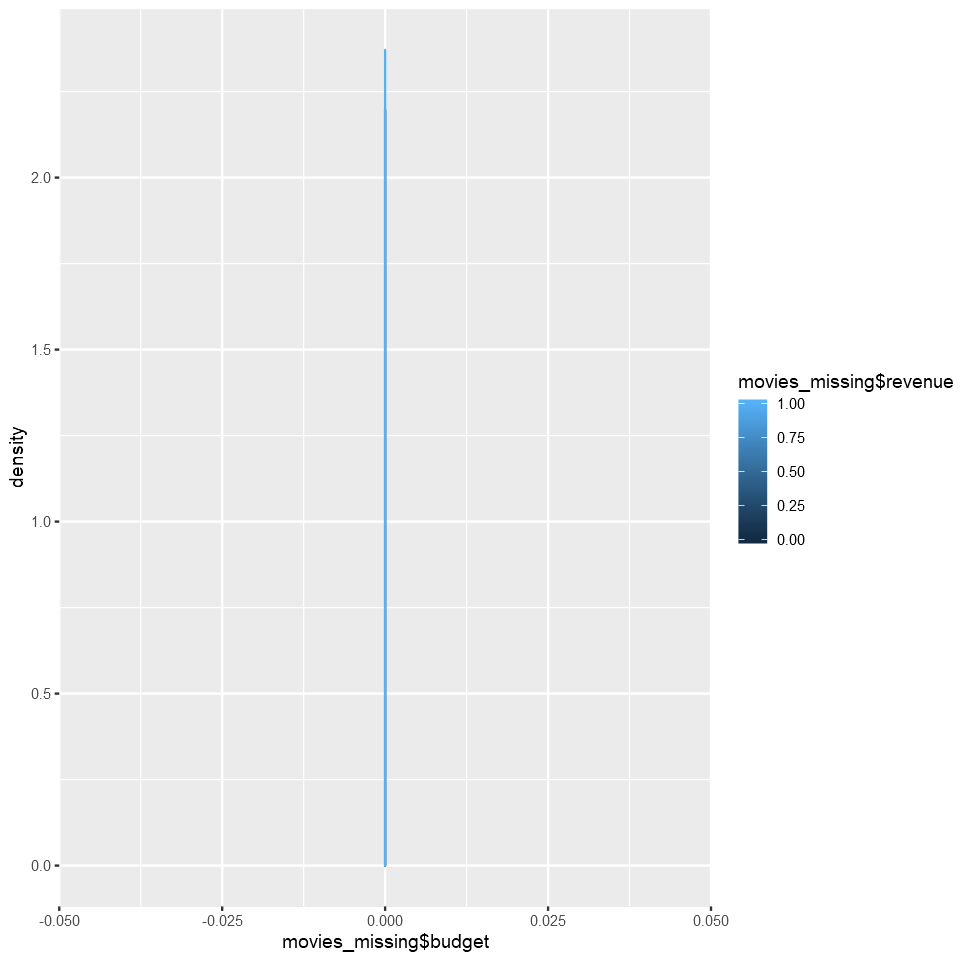

In [68]:
ggplot(movies_missing, aes(x=movies_missing$budget, group= movies_missing$revenue, color = movies_missing$revenue))+
geom_density()

### 3.2.2. Determinate the Missingness Generation Mechanism

In [7]:
f(!require(MissMech)) {install.packages("MissMech");require(MissMech)}
if(!require(mice)) {install.packages("mice");require(mice)}
if(!require(MatchIt)) {install.packages("MatchIt");require(MatchIt)}

Loading required package: MissMech

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
"there is no package called 'MissMech'"
Installing package into 'C:/Users/Mayer/Documents/R/win-library/3.6'
(as 'lib' is unspecified)



package 'MissMech' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\Mayer\AppData\Local\Temp\RtmpUP7one\downloaded_packages


Loading required package: MissMech

Loading required package: mice

Loading required package: lattice


Attaching package: 'mice'


The following objects are masked from 'package:base':

    cbind, rbind


Loading required package: MatchIt



In [37]:
movies_ff2 <- data.matrix(movies_ff)
storage.mode(movies_ff2) <-"integer"
miss1 <- TestMCARNormality(data= movies_ff2)
miss1

Warning message in data.matrix(movies_ff):
"NAs introduced by coercion"
Warning message in data.matrix(movies_ff):
"NAs introduced by coercion"
Warning message in data.matrix(movies_ff):
"NAs introduced by coercion"


ERROR: Error in solve.default(sigoo): Lapack routine dgesv: system is exactly singular: U[8,8] = 0


In [29]:
dbDisconnect(con)

In [13]:
help('TestMCARNormality')

In [38]:
movies_ff2

movie_id,original_language,release_date,runtime_cat,runtime,budget,popularity,revenue,sw_lang_en,sw_web_presence,...,depart_Camera_female,depart_Crew_female,depart_Custom_Mkup_female,depart_Directing_female,depart_Editing_female,depart_Lighting_female,depart_Production_female,depart_Sound_female,depart_Visual_Effects_female,depart_Writing_female
1,NA,NA,NA,93,14000000,6,12314651,1,0,...,0,0,0,0,0,0,0,0,0,0
2,NA,NA,NA,113,40000000,8,95149435,1,0,...,0,0,0,0,0,0,3,0,0,1
3,NA,NA,NA,105,3300000,64,13092000,1,1,...,0,1,0,0,0,0,2,0,0,0
4,NA,NA,NA,122,1200000,3,16000000,0,1,...,0,0,0,0,0,0,0,0,0,0
5,NA,NA,NA,118,0,1,3923970,0,0,...,0,0,0,0,0,0,0,0,0,0
6,NA,NA,NA,83,8000000,0,3261638,1,0,...,0,0,0,0,0,0,0,0,0,0
7,NA,NA,NA,92,14000000,7,85446075,1,1,...,0,0,1,1,0,0,3,0,0,0
8,NA,NA,NA,84,0,1,2586511,1,0,...,0,0,0,1,0,0,0,0,0,0
9,NA,NA,NA,100,0,6,34327391,1,0,...,0,0,0,0,0,0,0,0,0,0
10,NA,NA,NA,91,6000000,4,18750246,1,0,...,1,0,1,0,0,0,1,0,0,0
